**Heart disease prediction using ensemble methods and TabPFN transformer **


In [ ]:
#use if datasets are saved on google drive to access it directly
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Datasets can be downloaded from
# Statlog https://www.kaggle.com/datasets/shubamsumbria/statlog-heart-data-set
# Cleveland https://www.kaggle.com/datasets/cherngs/heart-disease-cleveland-uci
# Merge https://www.kaggle.com/datasets/fedesoriano/heart-failure-prediction

# Import Libraries

---



In [ ]:
import numpy as np
import pandas as pd
from numpy import mean, std
#plots
import matplotlib.pyplot as plt
import seaborn as sns

#generating random number
import random

#Classifiers
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB

#Evaluation metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn.datasets import make_classification

# Tuning
from sklearn.model_selection import GridSearchCV

#Dataset preprocessing and split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler

#Sampling methods for imbalanced datasets SMOTE, RandomOverSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE

#for creating pipelines
from sklearn.pipeline import Pipeline














In [ ]:
#Keeps tables fully open
from google.colab import data_table
from vega_datasets import data

data_table.enable_dataframe_formatter()

#Loading Datasets

In [ ]:
dataframed = pd.read_csv('drive/MyDrive/heart_cleveland_upload.csv')
cleve_df = dataframed.copy()
cleve_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,condition
0,69,1,0,160,234,1,2,131,0,0.1,1,1,0,0
1,69,0,0,140,239,0,0,151,0,1.8,0,2,0,0
2,66,0,0,150,226,0,0,114,0,2.6,2,0,0,0
3,65,1,0,138,282,1,2,174,0,1.4,1,1,0,1
4,64,1,0,110,211,0,2,144,1,1.8,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,40,1,3,152,223,0,0,181,0,0.0,0,0,2,1
293,39,1,3,118,219,0,0,140,0,1.2,1,0,2,1
294,35,1,3,120,198,0,0,130,1,1.6,1,0,2,1
295,35,0,3,138,183,0,0,182,0,1.4,0,0,0,0


In [ ]:
dataframe1 = pd.read_csv('drive/MyDrive/heart.csv')
combined_df = dataframe1.copy()

combined_df

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1


In [ ]:
dataframe = pd.read_csv('drive/MyDrive/statlog.csv')
statlog_df = dataframe.copy()
statlog_df

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,presence
0,70.0,1.0,4.0,130.0,322.0,0.0,2.0,109.0,0.0,2.4,2.0,3.0,3.0,2
1,67.0,0.0,3.0,115.0,564.0,0.0,2.0,160.0,0.0,1.6,2.0,0.0,7.0,1
2,57.0,1.0,2.0,124.0,261.0,0.0,0.0,141.0,0.0,0.3,1.0,0.0,7.0,2
3,64.0,1.0,4.0,128.0,263.0,0.0,0.0,105.0,1.0,0.2,2.0,1.0,7.0,1
4,74.0,0.0,2.0,120.0,269.0,0.0,2.0,121.0,1.0,0.2,1.0,1.0,3.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,52.0,1.0,3.0,172.0,199.0,1.0,0.0,162.0,0.0,0.5,1.0,0.0,7.0,1
266,44.0,1.0,2.0,120.0,263.0,0.0,0.0,173.0,0.0,0.0,1.0,0.0,7.0,1
267,56.0,0.0,2.0,140.0,294.0,0.0,2.0,153.0,0.0,1.3,2.0,0.0,3.0,1
268,57.0,1.0,4.0,140.0,192.0,0.0,0.0,148.0,0.0,0.4,2.0,0.0,6.0,1


#Changing names for all the same ones and converting all data into numerical

In [ ]:
# chenge presence into condition column name STATLOG_df dataset 0 - no heart disease  1 - yes heart disease

statlog_df.rename(columns = {"presence":"condition"}, inplace=True)

statlog_df['condition'] = statlog_df['condition'].map({1: 0, 2: 1})
print(statlog_df.columns)
statlog_df_columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'condition']

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'condition'],
      dtype='object')


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder



statlog_num = statlog_df[['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'sex', 'fbs', 'exang', ]]
statlog_cat = statlog_df[['cp',  'restecg', 'slope', 'ca', 'thal']]

#Scaling only numerical data



col_cat = ['cp_typicalangina', 'cp_atypical_angina', 'cp_non_anginalpain', 'cp_asymptomatic', 'restecg_normal', 'restecg_abnormal', 'restecg_hypertrophy',
           'slope_up', 'slope_flat', 'slope_down', 'vessel0', 'vessel1', 'vessel2', 'vessel3', 'thal_normal', 'thal_fixed', 'thal_reversed']
# # create the encoder object
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
# # Fit encoder on the training data and test data
enc_df_stat = pd.DataFrame(encoder.fit_transform(statlog_cat), columns=col_cat)
enc_df_stat

statlog = statlog_num.join(enc_df_stat)
print('Shape of categorical values:', enc_df_stat.shape)
print('Shape of numerical values:', statlog_num.shape)
print('Shape of all together values:', statlog.shape)
statlog

Shape of categorical values: (270, 17)
Shape of numerical values: (270, 8)
Shape of all together values: (270, 25)


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,...,slope_up,slope_flat,slope_down,vessel0,vessel1,vessel2,vessel3,thal_normal,thal_fixed,thal_reversed
0,70.0,130.0,322.0,109.0,2.4,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,67.0,115.0,564.0,160.0,1.6,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,57.0,124.0,261.0,141.0,0.3,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,64.0,128.0,263.0,105.0,0.2,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,74.0,120.0,269.0,121.0,0.2,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,52.0,172.0,199.0,162.0,0.5,1.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
266,44.0,120.0,263.0,173.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
267,56.0,140.0,294.0,153.0,1.3,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
268,57.0,140.0,192.0,148.0,0.4,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


Scaling num values

In [ ]:
# Scaler Object
scaler = MinMaxScaler()
# Fit on the numeric training data

statlog[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']] = scaler.fit_transform(statlog[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']])
statlog


,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,...,slope_up,slope_flat,slope_down,vessel0,vessel1,vessel2,vessel3,thal_normal,thal_fixed,thal_reversed
0,0.854167,0.339623,0.447489,0.290076,0.387097,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,0.791667,0.198113,1.000000,0.679389,0.258065,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.583333,0.283019,0.308219,0.534351,0.048387,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.729167,0.320755,0.312785,0.259542,0.032258,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,0.937500,0.245283,0.326484,0.381679,0.032258,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,0.479167,0.735849,0.166667,0.694656,0.080645,1.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
266,0.312500,0.245283,0.312785,0.778626,0.000000,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
267,0.562500,0.433962,0.383562,0.625954,0.209677,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
268,0.583333,0.433962,0.150685,0.587786,0.064516,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
statlog.describe()


,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,...,slope_up,slope_flat,slope_down,vessel0,vessel1,vessel2,vessel3,thal_normal,thal_fixed,thal_reversed
count,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,...,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000
mean,0.529861,0.352306,0.282327,0.600594,0.169355,0.677778,0.148148,0.329630,0.074074,0.155556,...,0.481481,0.451852,0.066667,0.592593,0.214815,0.122222,0.070370,0.562963,0.051852,0.385185
std,0.189772,0.168506,0.118005,0.176838,0.184711,0.468195,0.355906,0.470952,0.262378,0.363107,...,0.500585,0.498601,0.249907,0.492264,0.411456,0.328151,0.256245,0.496941,0.222140,0.487543
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.395833,0.245283,0.198630,0.473282,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.541667,0.339623,0.271689,0.629771,0.129032,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,0.666667,0.433962,0.351598,0.725191,0.258065,1.000000,0.000000,1.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Clevland

In [ ]:
print(cleve_df.columns)
cleve_df_columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'condition']

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'condition'],
      dtype='object')


In [ ]:
cleve_num = cleve_df[['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'sex', 'fbs', 'exang']]
cleve_cat = cleve_df[['cp',  'restecg', 'slope', 'ca', 'thal']]

#Scaling only numerical data



col_cat = ['cp_typicalangina', 'cp_atypical_angina', 'cp_non_anginalpain', 'cp_asymptomatic', 'restecg_normal', 'restecg_abnormal', 'restecg_hypertrophy',
           'slope_up', 'slope_flat', 'slope_down', 'vessel0', 'vessel1', 'vessel2', 'vessel3', 'thal_normal', 'thal_fixed', 'thal_reversed']

# create the encoder object
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

enc_df_cleve = pd.DataFrame(encoder.fit_transform(cleve_cat), columns=col_cat)
enc_df_cleve

cleve = cleve_num.join(enc_df_cleve)
# Fit encoder on the training data and test data
cleve



print('Shape of categorical values:', enc_df_cleve.shape)
print('Shape of numerical values:', cleve_num.shape)
print('Shape of all together values:', cleve.shape)




Shape of categorical values: (297, 17)
Shape of numerical values: (297, 8)
Shape of all together values: (297, 25)


/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


scaling

In [ ]:
# Scaler Object
scaler = MinMaxScaler()
# Fit on the numeric training data

cleve[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']] = scaler.fit_transform(cleve[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']])
cleve


,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,...,slope_up,slope_flat,slope_down,vessel0,vessel1,vessel2,vessel3,thal_normal,thal_fixed,thal_reversed
0,0.833333,0.622642,0.246575,0.458015,0.016129,1,1,0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.833333,0.433962,0.257991,0.610687,0.290323,0,0,0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,0.770833,0.528302,0.228311,0.328244,0.419355,0,0,0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.750000,0.415094,0.356164,0.786260,0.225806,1,1,0,1.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,0.729167,0.150943,0.194064,0.557252,0.290323,1,0,1,1.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,0.229167,0.547170,0.221461,0.839695,0.000000,1,0,0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
293,0.208333,0.226415,0.212329,0.526718,0.193548,1,0,0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
294,0.125000,0.245283,0.164384,0.450382,0.258065,1,0,1,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
295,0.125000,0.415094,0.130137,0.847328,0.225806,0,0,0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
cleve.describe()

,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,...,slope_up,slope_flat,slope_down,vessel0,vessel1,vessel2,vessel3,thal_normal,thal_fixed,thal_reversed
count,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,...,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000
mean,0.532127,0.355600,0.277055,0.599995,0.170251,0.676768,0.144781,0.326599,0.077441,0.164983,...,0.468013,0.461279,0.070707,0.585859,0.218855,0.127946,0.067340,0.552189,0.060606,0.387205
std,0.188536,0.167574,0.118716,0.175126,0.188084,0.468500,0.352474,0.469761,0.267741,0.371792,...,0.499818,0.499340,0.256768,0.493404,0.414168,0.334594,0.251033,0.498108,0.239009,0.487933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.395833,0.245283,0.194064,0.473282,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.562500,0.339623,0.267123,0.625954,0.129032,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,0.666667,0.433962,0.342466,0.725191,0.258065,1.000000,0.000000,1.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Combined

In [ ]:
 #Combined dataset


combined_df.rename(columns = {"Age":"age", "Sex":"sex", "ChestPainType":"cp", "RestingBP":"trestbps", "Cholesterol":"chol", "FastingBS":"fbs", "RestingECG":"restecg", "MaxHR":"thalach", "ExerciseAngina":"exang","Oldpeak":"oldpeak","ST_Slope":"slope","HeartDisease":"condition"}, inplace=True)


combined_df['slope'] = combined_df['slope'].map({"Up": 0, "Flat": 1, "Down":2})
combined_df['exang'] = combined_df['exang'].map({"N": 0, "Y": 1})
combined_df['restecg'] = combined_df['restecg'].map({"Normal": 0, "ST": 1, "LVH":2})
combined_df['cp'] = combined_df['cp'].map({"TA": 0, "ATA": 1, "NAP":2, "ASY":3})
combined_df['sex'] = combined_df['sex'].map({"F": 0, "M": 1})

print(combined_df.columns)
combined_df_columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'condition']

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'condition'],
      dtype='object')


In [ ]:
combined_df_copy = combined_df.copy()

combined_num = combined_df[['age', 'trestbps', 'chol', 'thalach', 'oldpeak','sex','fbs', 'exang']]
combined_cat = combined_df[[ 'cp',  'restecg', 'slope']]

col_cat_comb = ['cp_typicalangina', 'cp_atypical_angina', 'cp_non_anginalpain', 'cp_asymptomatic', 'restecg_normal', 'restecg_abnormal', 'restecg_hypertrophy',
           'slope_up', 'slope_flat', 'slope_down']

encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

enc_df_comb = pd.DataFrame(encoder.fit_transform(combined_cat), columns=col_cat_comb)
enc_df_comb

combined = combined_num.join(enc_df_comb)
# Fit encoder on the training data and test data
combined



/usr/local/lib/python3.9/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,cp_non_anginalpain,cp_asymptomatic,restecg_normal,restecg_abnormal,restecg_hypertrophy,slope_up,slope_flat,slope_down
0,40,140,289,172,0.0,1,0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,49,160,180,156,1.0,0,0,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,37,130,283,98,0.0,1,0,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,48,138,214,108,1.5,0,0,1,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
4,54,150,195,122,0.0,1,0,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,110,264,132,1.2,1,0,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
914,68,144,193,141,3.4,1,1,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
915,57,130,131,115,1.2,1,0,1,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
916,57,130,236,174,0.0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [ ]:
# Scaler Object
scaler = MinMaxScaler()
# Fit on the numeric training data

combined[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']] = scaler.fit_transform(combined[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']])
combined

,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,cp_non_anginalpain,cp_asymptomatic,restecg_normal,restecg_abnormal,restecg_hypertrophy,slope_up,slope_flat,slope_down
0,0.244898,0.70,0.479270,0.788732,0.295455,1,0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.428571,0.80,0.298507,0.676056,0.409091,0,0,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.183673,0.65,0.469320,0.267606,0.295455,1,0,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.408163,0.69,0.354892,0.338028,0.465909,0,0,1,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.530612,0.75,0.323383,0.436620,0.295455,1,0,0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913,0.346939,0.55,0.437811,0.507042,0.431818,1,0,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
914,0.816327,0.72,0.320066,0.570423,0.681818,1,1,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
915,0.591837,0.65,0.217247,0.387324,0.431818,1,0,1,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
916,0.591837,0.65,0.391376,0.802817,0.295455,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [ ]:
combined_df = combined_df[combined_df.chol != 0]

combined = combined[combined.chol != 0]


In [ ]:
combined.describe()

,age,trestbps,chol,thalach,oldpeak,sex,fbs,exang,cp_typicalangina,cp_atypical_angina,cp_non_anginalpain,cp_asymptomatic,restecg_normal,restecg_abnormal,restecg_hypertrophy,slope_up,slope_flat,slope_down
count,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000
mean,0.507797,0.665114,0.405697,0.564976,0.397910,0.756032,0.167560,0.384718,0.054960,0.222520,0.226542,0.495979,0.596515,0.167560,0.235925,0.467828,0.474531,0.057641
std,0.193998,0.086414,0.098099,0.172705,0.121916,0.429762,0.373726,0.486855,0.228055,0.416218,0.418874,0.500319,0.490926,0.373726,0.424860,0.499299,0.499686,0.233219
min,0.000000,0.460000,0.140962,0.063380,0.284091,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.367347,0.600000,0.343698,0.436620,0.295455,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.530612,0.650000,0.393035,0.563380,0.352273,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.632653,0.700000,0.456053,0.704225,0.465909,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
combined.isna().sum()

age                    0
trestbps               0
chol                   0
thalach                0
oldpeak                0
sex                    0
fbs                    0
exang                  0
cp_typicalangina       0
cp_atypical_angina     0
cp_non_anginalpain     0
cp_asymptomatic        0
restecg_normal         0
restecg_abnormal       0
restecg_hypertrophy    0
slope_up               0
slope_flat             0
slope_down             0
dtype: int64

# Correlation testing

In [ ]:
print(statlog_df.corr()["condition"].abs().sort_values(ascending=False))

condition    1.000000
thal         0.525020
ca           0.455336
exang        0.419303
thalach      0.418514
oldpeak      0.417967
cp           0.417436
slope        0.337616
sex          0.297721
age          0.212322
restecg      0.182091
trestbps     0.155383
chol         0.118021
fbs          0.016319
Name: condition, dtype: float64


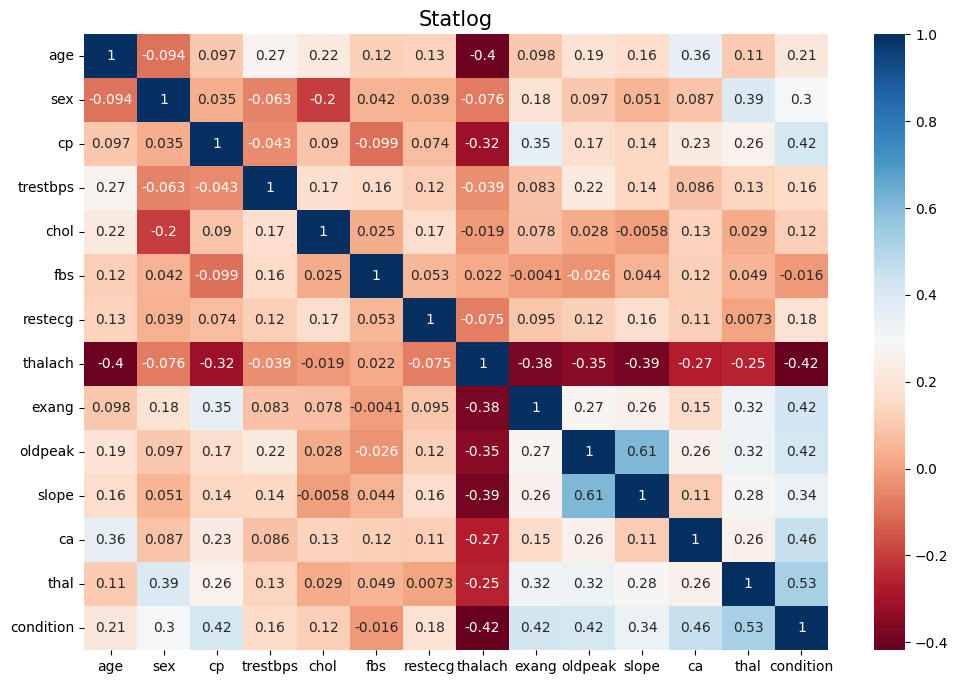

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(statlog_df.corr(), annot=True, cmap="RdBu")
plt.title("Statlog", size=15)
plt.show()

In [ ]:
print(cleve_df.corr()["condition"].abs().sort_values(ascending=False))

condition    1.000000
thal         0.520516
ca           0.463189
oldpeak      0.424052
thalach      0.423817
exang        0.421355
cp           0.408945
slope        0.333049
sex          0.278467
age          0.227075
restecg      0.166343
trestbps     0.153490
chol         0.080285
fbs          0.003167
Name: condition, dtype: float64


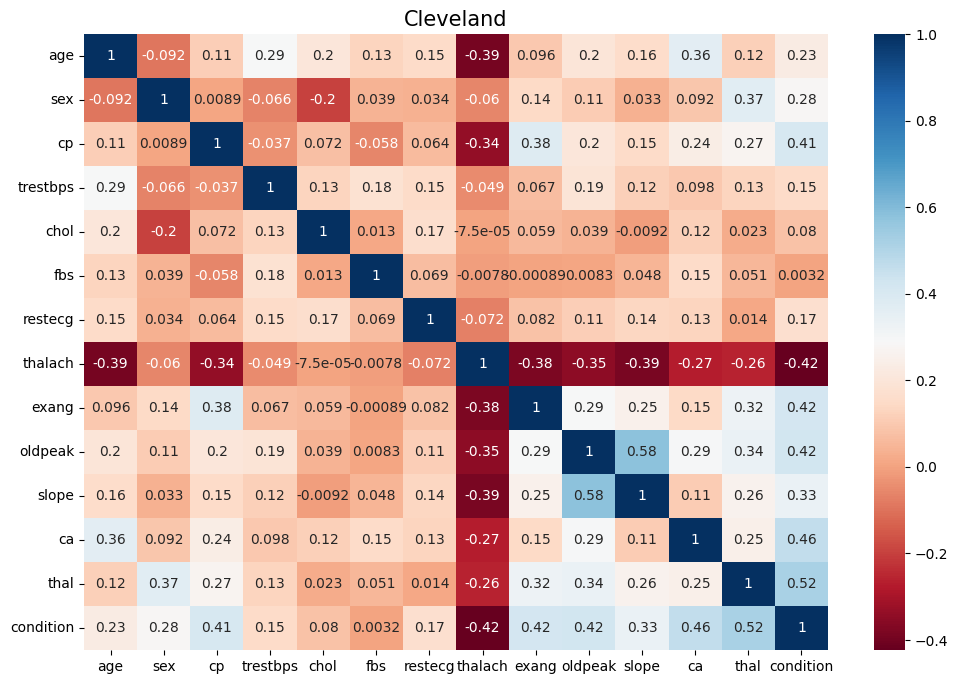

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(cleve_df.corr(), annot=True, cmap="RdBu")
plt.title("Cleveland", size=15)
plt.show()

In [ ]:
print(combined_df_copy.corr()["condition"].abs().sort_values(ascending=False))

condition    1.000000
slope        0.558771
exang        0.494282
cp           0.471354
oldpeak      0.403951
thalach      0.400421
sex          0.305445
age          0.282039
fbs          0.267291
chol         0.232741
trestbps     0.107589
restecg      0.061011
Name: condition, dtype: float64


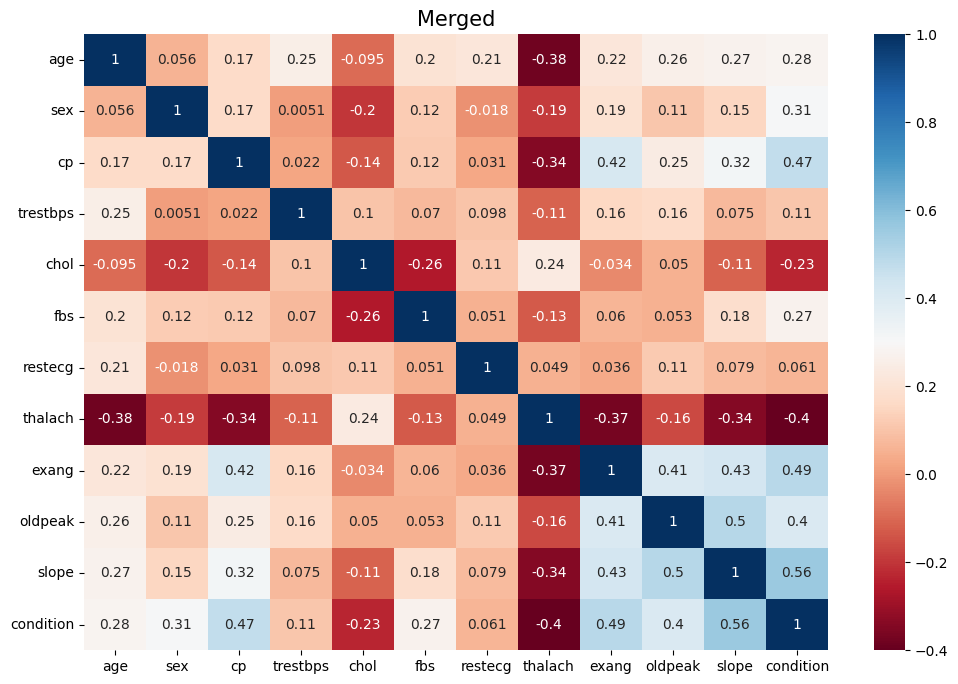

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(combined_df_copy.corr(), annot=True, cmap="RdBu")
plt.title("Merged", size=15)
plt.show()

#Analyzing data

Statlog

In [ ]:
statlog_df['condition'].value_counts()

0    150
1    120
Name: condition, dtype: int64

<Axes: >

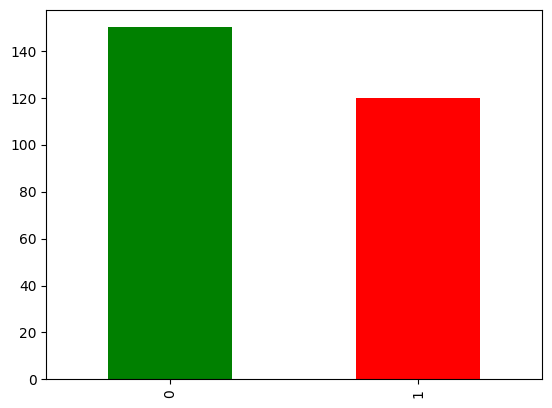

In [ ]:
#check for imbalance
#STATLOG
statlog_df["condition"].value_counts().plot.bar(color=['green', 'red'])

In [ ]:
cleve_df['condition'].value_counts()

0    160
1    137
Name: condition, dtype: int64

<Axes: >

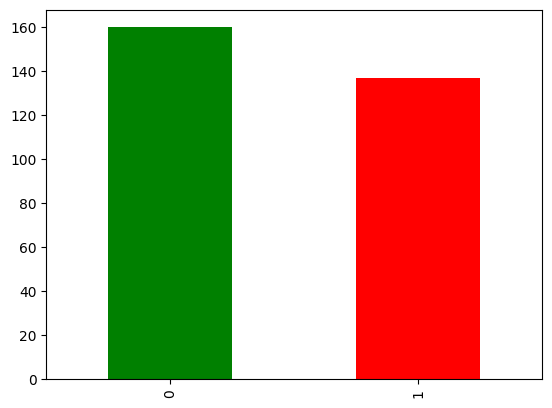

In [ ]:
#check for imbalance
#Clevland
cleve_df["condition"].value_counts().plot.bar(color=['green', 'red'])

In [ ]:
combined_df_copy['condition'].value_counts()

1    508
0    410
Name: condition, dtype: int64

<Axes: >

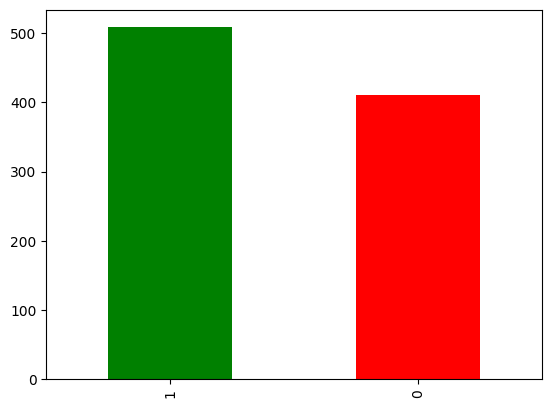

In [ ]:
#check for imbalance
#combined
combined_df_copy["condition"].value_counts().plot.bar(color=['green', 'red'])

In [ ]:
plotdata = pd.DataFrame({
    "Statlog":[150, 120],
    "Cleveland":[160, 137],
    "Merged":[508, 410]
    }, index=['Absence', 'Presence']
)
plotdata.head()

,Statlog,Cleveland,Merged
Absence,150,160,508
Presence,120,137,410


Text(0, 0.5, 'number of patients')

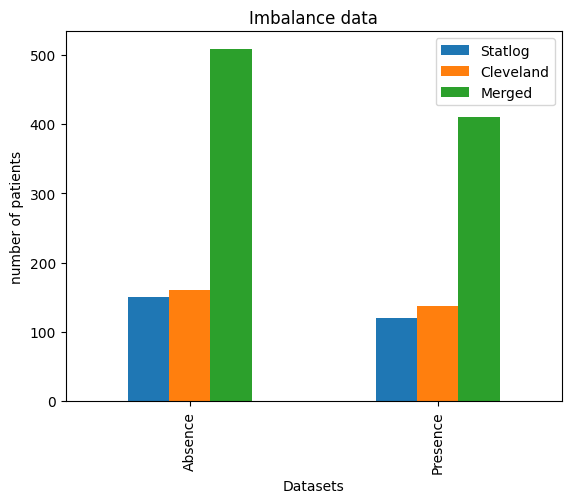

In [ ]:
plotdata.reset_index().plot(
    x="index", y=["Statlog", "Cleveland", "Merged"], kind="bar"
)
plt.title("Imbalance data")
plt.xlabel("Datasets")
plt.ylabel("number of patients")

Statlog

In [ ]:
statlog_df.shape

(270, 14)

In [ ]:
statlog_df.groupby('condition').mean()


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
condition,,,,,,,,,,,,,
0,52.706667,0.553333,2.820000,128.866667,244.213333,0.153333,0.860,158.333333,0.153333,0.622667,1.400000,0.286667,3.786667
1,56.591667,0.833333,3.616667,134.441667,256.466667,0.141667,1.225,138.858333,0.550000,1.584167,1.816667,1.150000,5.833333


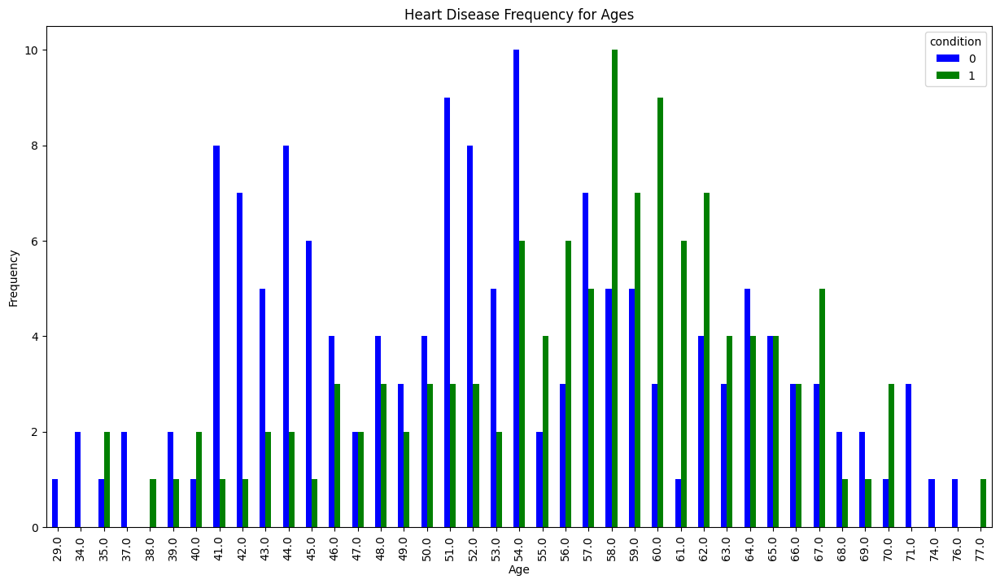

In [ ]:
pd.crosstab(statlog_df.age,statlog_df.condition).plot(kind="bar",figsize=(15,8),color=['blue','green' ])
plt.title('Heart Disease Frequency for Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

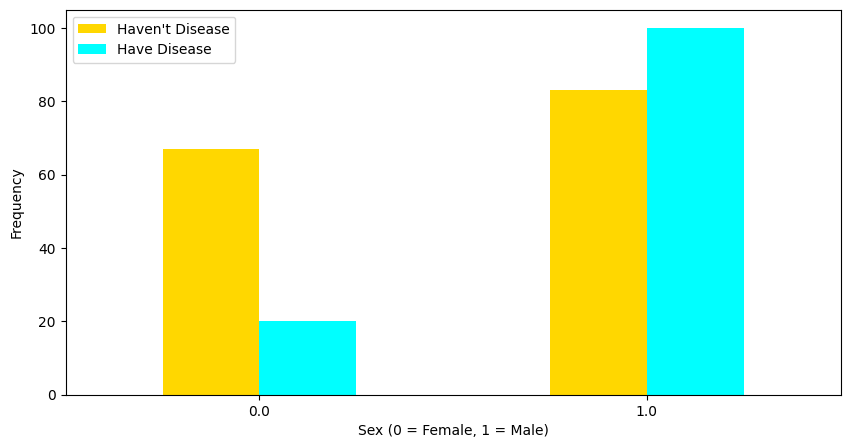

In [ ]:
pd.crosstab(statlog_df.sex,statlog_df.condition).plot(kind="bar",figsize=(10,5),color=['gold','cyan' ])
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.xticks(rotation=0)
plt.legend(["Haven't Disease", "Have Disease"])
plt.ylabel('Frequency')
plt.show()

Text(0.5, 1.0, 'Relation of tresbps with target')

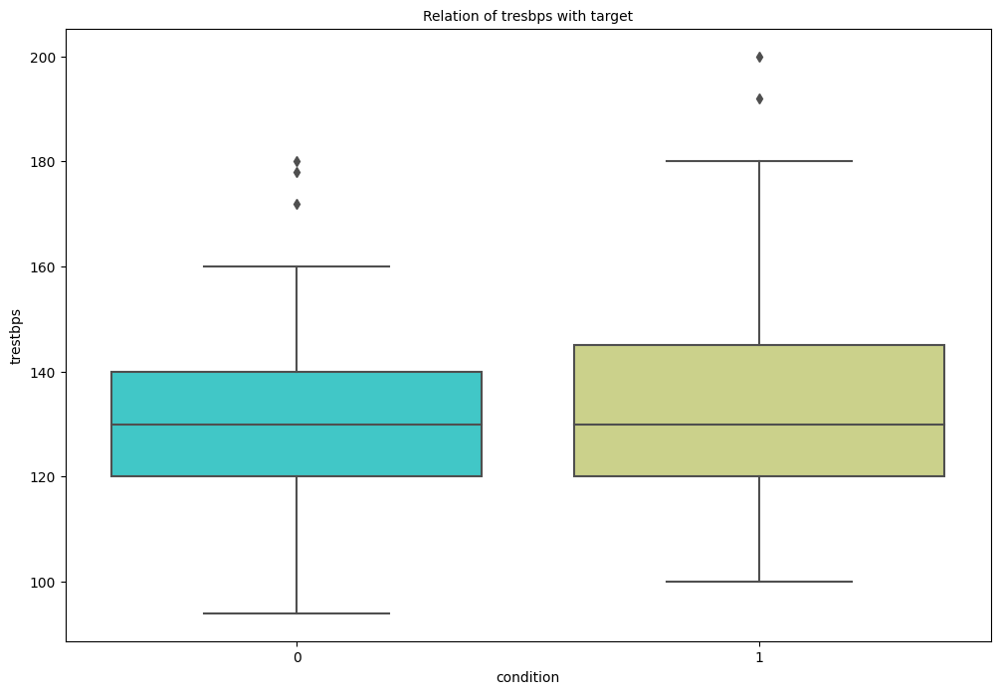

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(x= statlog_df.condition, y= statlog_df.trestbps, palette = 'rainbow')
plt.title('Relation of tresbps with target', fontsize = 10)

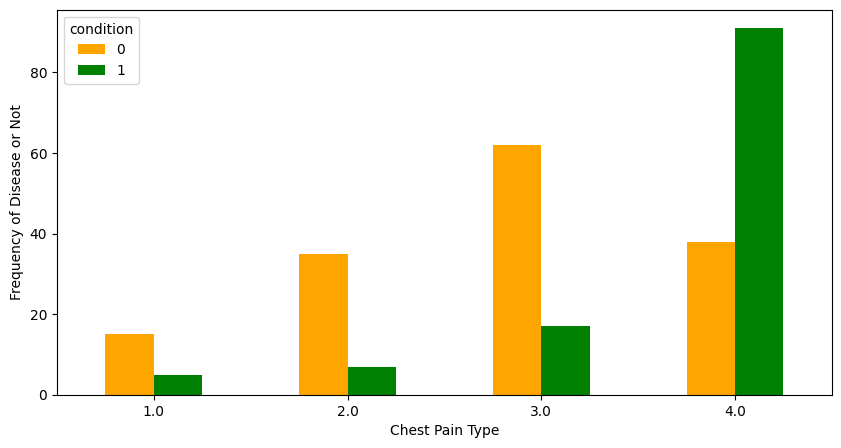

In [ ]:
pd.crosstab(statlog_df.cp,statlog_df.condition).plot(kind="bar",figsize=(10,5),color=['orange','green' ])
plt.xlabel('Chest Pain Type')
plt.xticks(rotation = 0)
plt.ylabel('Frequency of Disease or Not')
plt.show()

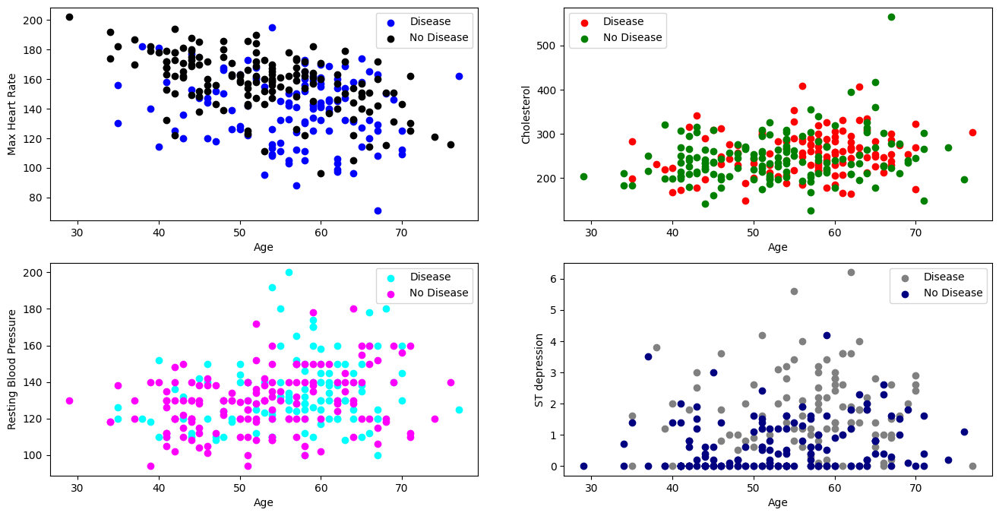

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.scatter(x=statlog_df.age[statlog_df.condition==1],y=statlog_df.thalach[statlog_df.condition==1],c='blue')
plt.scatter(x=statlog_df.age[statlog_df.condition==0],y=statlog_df.thalach[statlog_df.condition==0],c='black')
plt.xlabel('Age')
plt.ylabel('Max Heart Rate')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,2)
plt.scatter(x=statlog_df.age[statlog_df.condition==1],y=statlog_df.chol[statlog_df.condition==1],c='red')
plt.scatter(x=statlog_df.age[statlog_df.condition==0],y=statlog_df.chol[statlog_df.condition==0],c='green')
plt.xlabel('Age')
plt.ylabel('Cholesterol')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,3)
plt.scatter(x=statlog_df.age[statlog_df.condition==1],y=statlog_df.trestbps[statlog_df.condition==1],c='cyan')
plt.scatter(x=statlog_df.age[statlog_df.condition==0],y=statlog_df.trestbps[statlog_df.condition==0],c='fuchsia')
plt.xlabel('Age')
plt.ylabel('Resting Blood Pressure')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,4)
plt.scatter(x=statlog_df.age[statlog_df.condition==1],y=statlog_df.oldpeak[statlog_df.condition==1],c='grey')
plt.scatter(x=statlog_df.age[statlog_df.condition==0],y=statlog_df.oldpeak[statlog_df.condition==0],c='navy')
plt.xlabel('Age')
plt.ylabel('ST depression')
plt.legend(['Disease','No Disease'])
plt.show()

In [ ]:
categorical_val = []
continous_val = []
for column in statlog_df.columns:
    print('-------------------------------')
    print(f"{column} : {statlog_df[column].unique()}")
    if len(statlog_df[column].unique()) <= 10:
        categorical_val.append(column)
    else:
        continous_val.append(column)

-------------------------------
age : [70. 67. 57. 64. 74. 65. 56. 59. 60. 63. 53. 44. 61. 71. 46. 40. 48. 43.
 47. 54. 51. 58. 66. 37. 50. 42. 62. 49. 52. 45. 41. 76. 39. 35. 55. 34.
 38. 69. 68. 77. 29.]
-------------------------------
sex : [1. 0.]
-------------------------------
cp : [4. 3. 2. 1.]
-------------------------------
trestbps : [130. 115. 124. 128. 120. 110. 140. 150. 135. 142. 134. 112. 132. 138.
 160. 170. 144. 122. 152. 101. 126. 118. 136. 105. 174. 145. 108. 156.
 106. 104.  94. 146. 148. 178. 125. 100. 165. 180. 158. 200. 117. 192.
 123. 129. 102. 155. 172.]
-------------------------------
chol : [322. 564. 261. 263. 269. 177. 256. 239. 293. 407. 234. 226. 235. 303.
 149. 311. 203. 211. 199. 229. 245. 204. 288. 275. 243. 295. 230. 265.
 228. 215. 326. 200. 207. 273. 180. 222. 223. 209. 233. 197. 218. 246.
 225. 315. 205. 417. 195. 198. 166. 178. 249. 281. 126. 305. 240. 276.
 319. 242. 260. 354. 309. 208. 236. 270. 214. 201. 244. 306. 221. 330.
 266. 206. 212. 302.

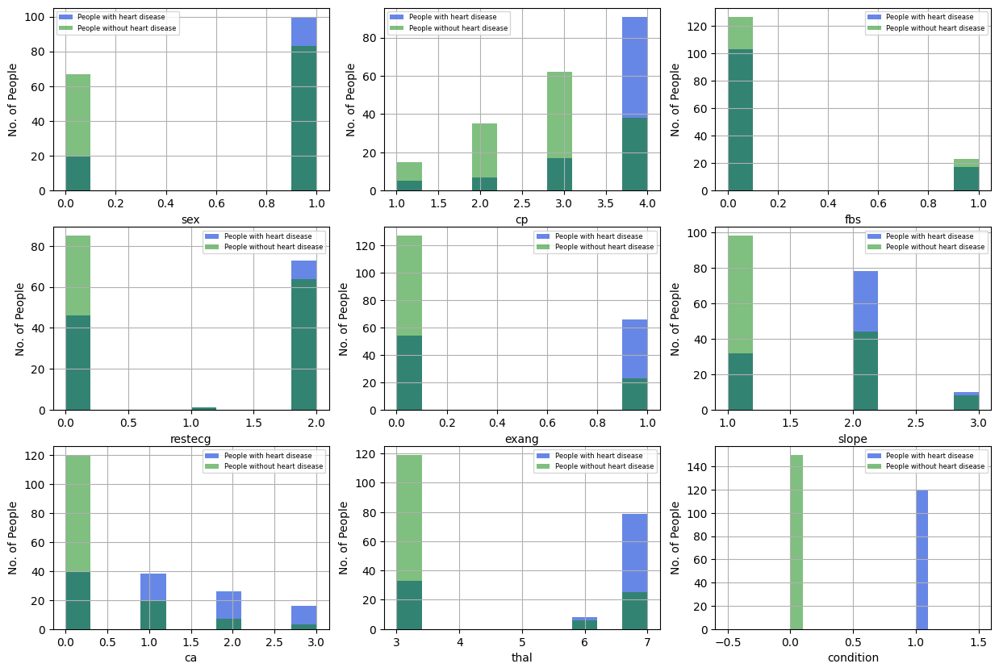

In [ ]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(categorical_val, 1):
    plt.subplot(3, 3, i)
    statlog_df[statlog_df["condition"] == 1][column].hist(bins=10, color='royalblue', label='People with heart disease',alpha=0.8)
    statlog_df[statlog_df["condition"] == 0][column].hist(bins=10, color='green', label='People without heart disease',alpha=0.5)
    plt.legend(fontsize=6)
    plt.xlabel(column)
    plt.ylabel("No. of People")


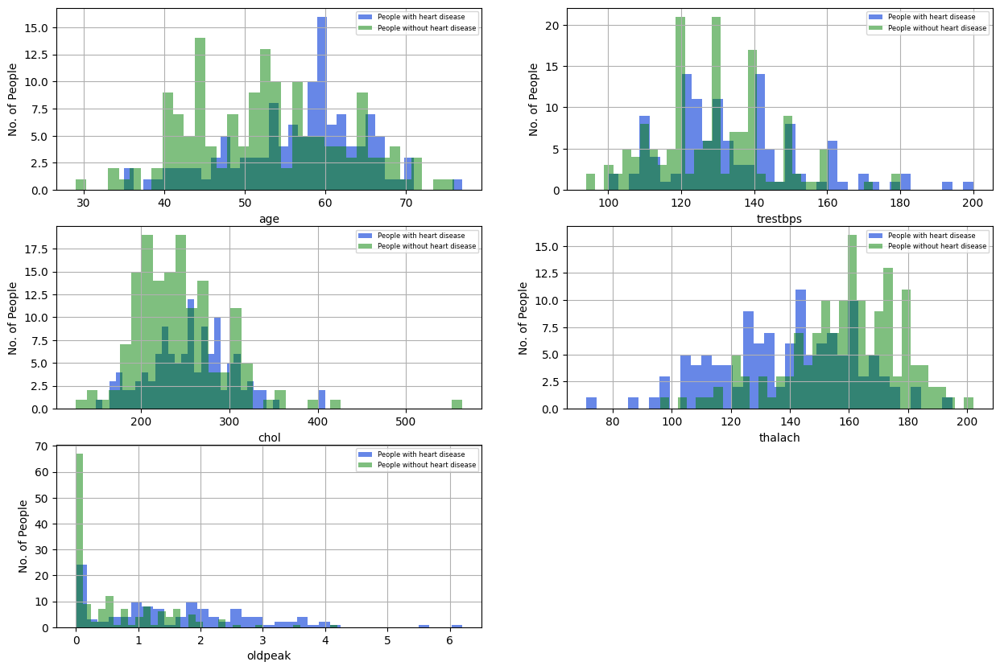

In [ ]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(continous_val, 1):
    plt.subplot(3, 2, i)
    statlog_df[statlog_df["condition"] == 1][column].hist(bins=35, color='royalblue', label='People with heart disease', alpha=0.8)
    statlog_df[statlog_df["condition"] == 0][column].hist(bins=35, color='green', label='People without heart disease',alpha=0.5)
    plt.legend(fontsize=6)
    plt.xlabel(column)
    plt.ylabel("No. of People")

Clevland

In [ ]:
cleve_df.shape

(297, 14)

In [ ]:
cleve_df.groupby('condition').mean()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
condition,,,,,,,,,,,,,
0,52.643750,0.556250,1.793750,129.175000,243.493750,0.143750,0.843750,158.581250,0.143750,0.598750,0.412500,0.275000,0.375000
1,56.759124,0.817518,2.583942,134.635036,251.854015,0.145985,1.175182,139.109489,0.540146,1.589051,0.824818,1.145985,1.372263


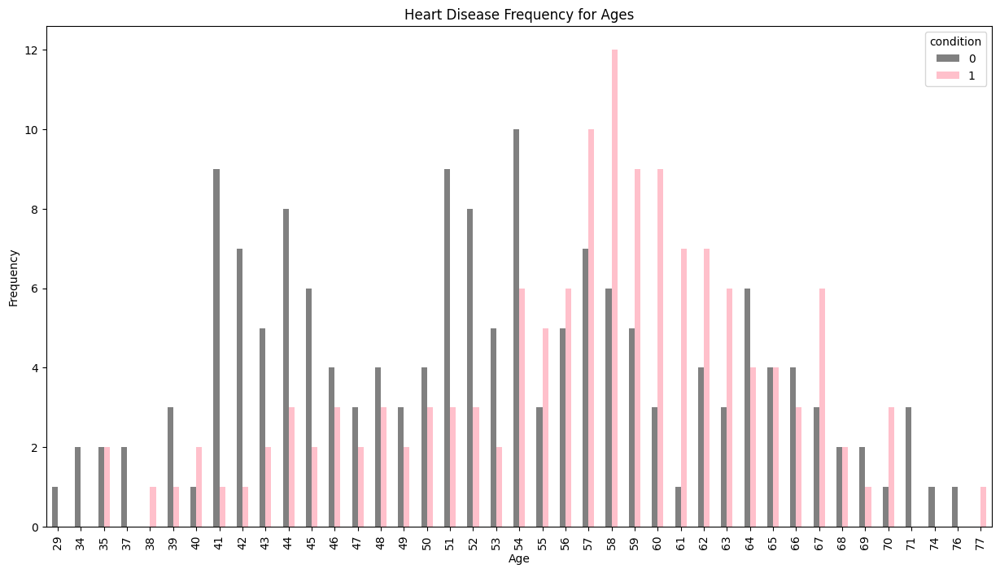

In [ ]:
pd.crosstab(cleve_df.age,cleve_df.condition).plot(kind="bar",figsize=(15,8),color=['grey','pink' ])
plt.title('Heart Disease Frequency for Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

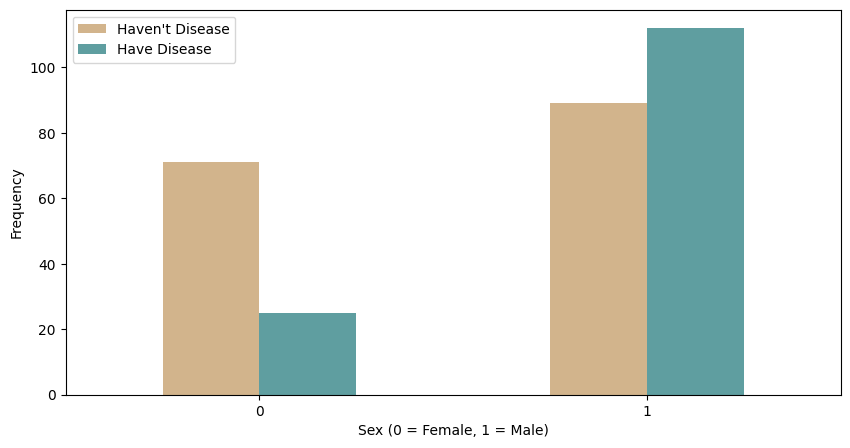

In [ ]:
pd.crosstab(cleve_df.sex,cleve_df.condition).plot(kind="bar",figsize=(10,5),color=['tan','cadetblue' ])
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.xticks(rotation=0)
plt.legend(["Haven't Disease", "Have Disease"])
plt.ylabel('Frequency')
plt.show()

Text(0.5, 1.0, 'Relation of tresbps with target')

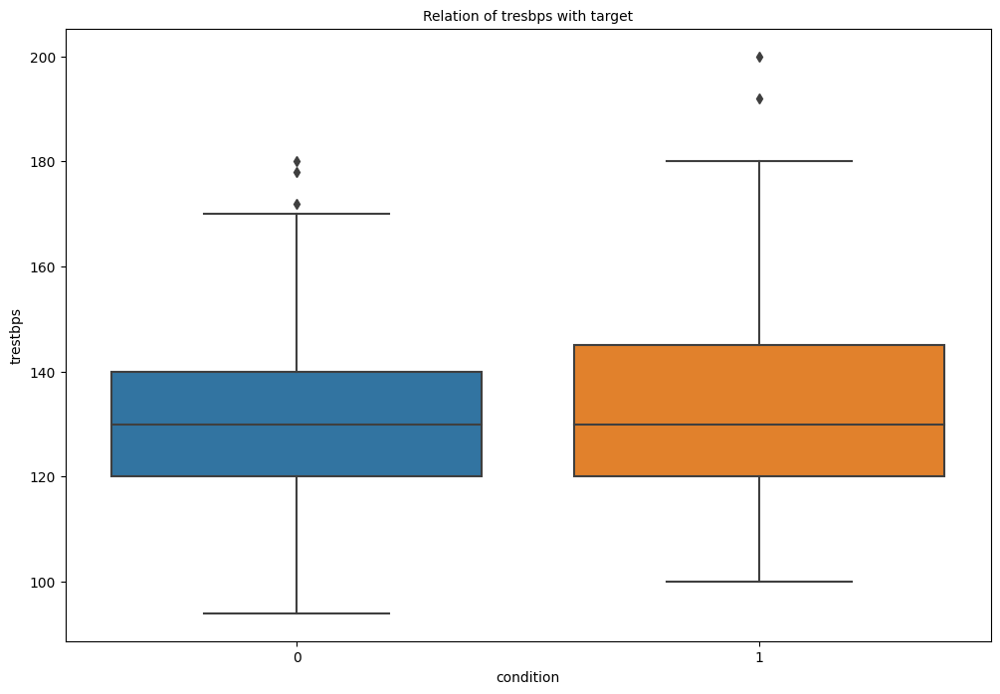

In [ ]:
plt.figure(figsize=(12,8))
sns.boxplot(x= cleve_df['condition'], y= cleve_df['trestbps'], palette = 'tab10')
plt.title('Relation of tresbps with target', fontsize = 10)

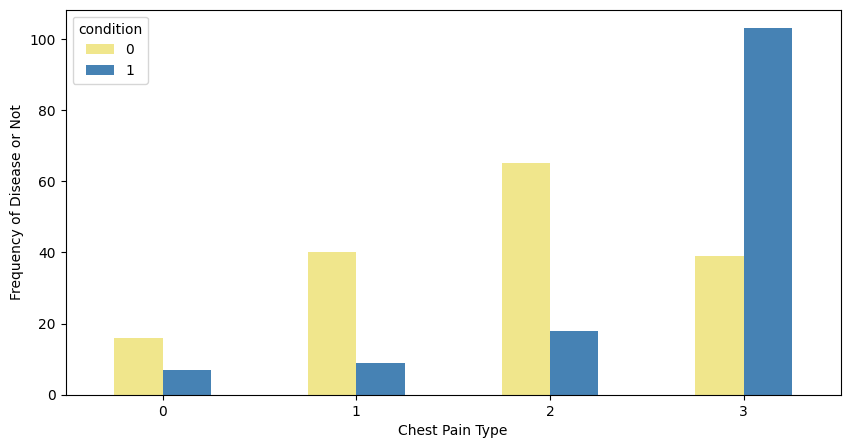

In [ ]:
pd.crosstab(cleve_df.cp,cleve_df.condition).plot(kind="bar",figsize=(10,5),color=['khaki','steelblue' ])
plt.xlabel('Chest Pain Type')
plt.xticks(rotation = 0)
plt.ylabel('Frequency of Disease or Not')
plt.show()

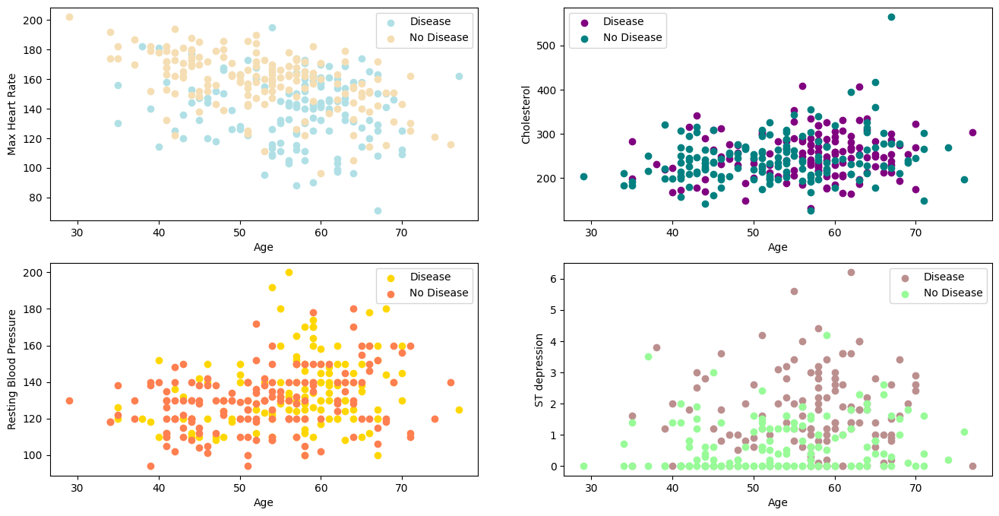

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.scatter(x=cleve_df.age[cleve_df.condition==1],y=cleve_df.thalach[cleve_df.condition==1],c='powderblue')
plt.scatter(x=cleve_df.age[cleve_df.condition==0],y=cleve_df.thalach[cleve_df.condition==0],c='wheat')
plt.xlabel('Age')
plt.ylabel('Max Heart Rate')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,2)
plt.scatter(x=cleve_df.age[cleve_df.condition==1],y=cleve_df.chol[cleve_df.condition==1],c='purple')
plt.scatter(x=cleve_df.age[cleve_df.condition==0],y=cleve_df.chol[cleve_df.condition==0],c='teal')
plt.xlabel('Age')
plt.ylabel('Cholesterol')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,3)
plt.scatter(x=cleve_df.age[cleve_df.condition==1],y=cleve_df.trestbps[cleve_df.condition==1],c='gold')
plt.scatter(x=cleve_df.age[cleve_df.condition==0],y=cleve_df.trestbps[cleve_df.condition==0],c='coral')
plt.xlabel('Age')
plt.ylabel('Resting Blood Pressure')
plt.legend(['Disease','No Disease'])


plt.subplot(2,2,4)
plt.scatter(x=cleve_df.age[cleve_df.condition==1],y=cleve_df.oldpeak[cleve_df.condition==1],c='rosybrown')
plt.scatter(x=cleve_df.age[cleve_df.condition==0],y=cleve_df.oldpeak[cleve_df.condition==0],c='palegreen')
plt.xlabel('Age')
plt.ylabel('ST depression')
plt.legend(['Disease','No Disease'])
plt.show()

In [ ]:
categorical_val = []
continous_val = []
for column in cleve_df.columns:
    print('-------------------------------')
    print(f"{column} : {cleve_df[column].unique()}")
    if len(cleve_df[column].unique()) <= 10:
        categorical_val.append(column)
    else:
        continous_val.append(column)

-------------------------------
age : [69 66 65 64 63 61 60 59 58 56 52 51 45 42 40 38 34 74 71 70 62 57 55 54
 50 49 48 46 44 41 35 29 76 68 67 53 47 43 39 37 77]
-------------------------------
sex : [1 0]
-------------------------------
cp : [0 1 2 3]
-------------------------------
trestbps : [160 140 150 138 110 170 145 134 178 120 118 152 125 148 156 128 136 130
 124 154 135 132 108 192 101 105 112 126 122 180 115 146 155 102 172 100
  94 129 142 144 106 117 158 174 164 114 165 200 123 104]
-------------------------------
chol : [234 239 226 282 211 227 233 240 270 288 273 204 283 193 186 298 213 264
 244 199 231 182 269 302 245 246 195 281 208 221 284 319 236 261 232 294
 250 262 342 309 325 201 205 271 266 229 197 160 308 263 219 220 295 203
 198 235 306 157 192 210 265 254 274 277 564 212 278 417 360 335 313 252
 243 185 318 178 218 230 224 340 168 126 256 258 214 304 267 196 222 175
 188 149 275 255 257 253 177 141 242 315 209 180 268 321 215 174 322 286
 299 237 223 228 225 

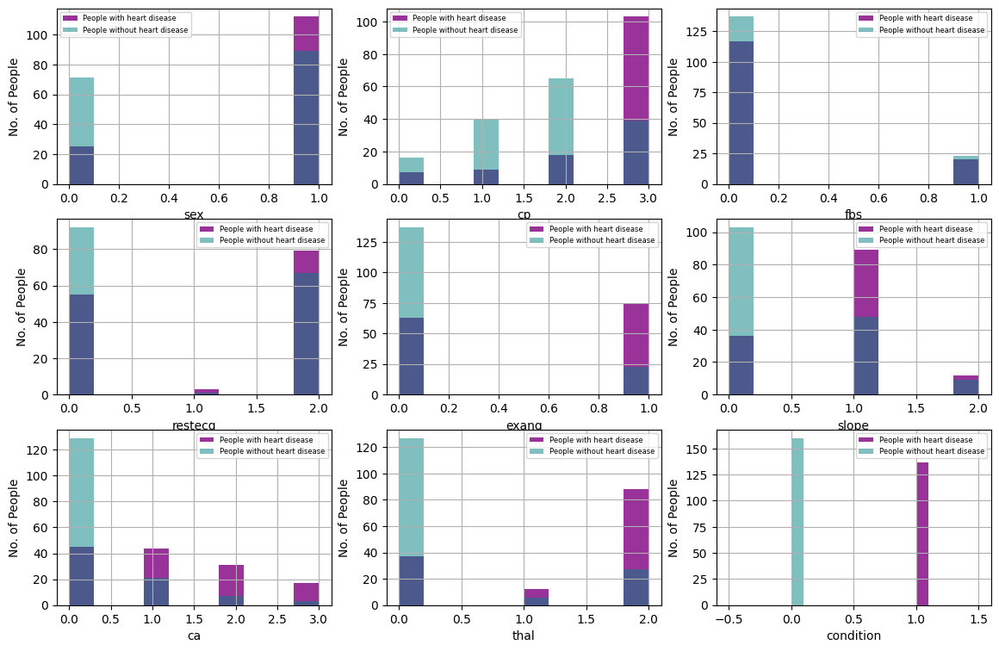

In [ ]:
plt.figure(figsize=(14, 9))
for i, column in enumerate(categorical_val, 1):
    plt.subplot(3, 3, i)
    cleve_df[cleve_df["condition"] == 1][column].hist(bins=10, color='purple', label='People with heart disease',alpha=0.8)
    cleve_df[cleve_df["condition"] == 0][column].hist(bins=10, color='teal', label='People without heart disease',alpha=0.5)
    plt.legend(fontsize=6)
    plt.xlabel(column)
    plt.ylabel("No. of People")


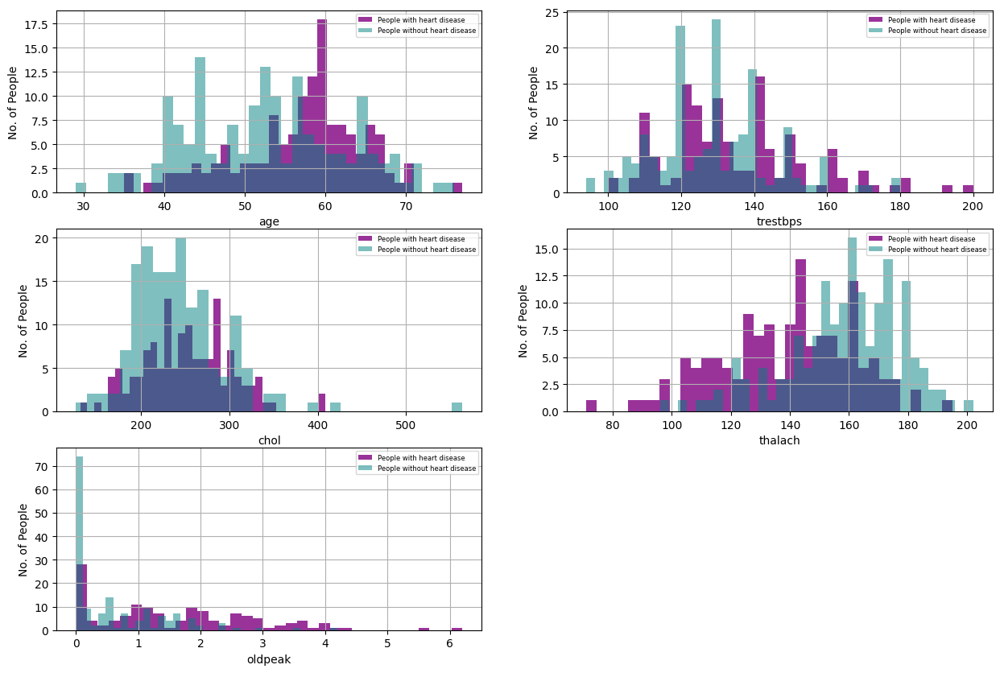

In [ ]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(continous_val, 1):
    plt.subplot(3, 2, i)
    cleve_df[cleve_df["condition"] == 1][column].hist(bins=35, color='purple', label='People with heart disease', alpha=0.8)
    cleve_df[cleve_df["condition"] == 0][column].hist(bins=35, color='teal', label='People without heart disease',alpha=0.5)
    plt.legend(fontsize=6)
    plt.xlabel(column)
    plt.ylabel("No. of People")

Merged

In [ ]:
combined_df.shape

(746, 12)

In [ ]:
combined_df.groupby('condition').mean()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope
condition,,,,,,,,,,,
0,50.171795,0.635897,1.741026,130.164103,238.769231,0.110256,0.548718,149.058974,0.128205,0.393846,0.248718
1,55.851124,0.887640,2.626404,136.154494,251.061798,0.230337,0.738764,130.550562,0.665730,1.457865,0.963483


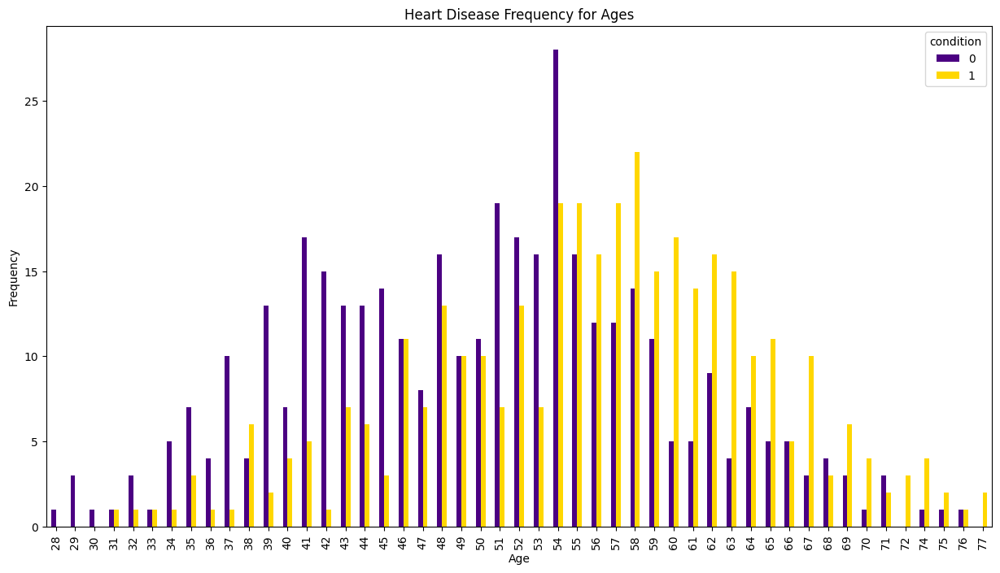

In [ ]:
pd.crosstab(combined_df.age,combined_df.condition).plot(kind="bar",figsize=(15,8),color=['indigo','gold' ])
plt.title('Heart Disease Frequency for Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

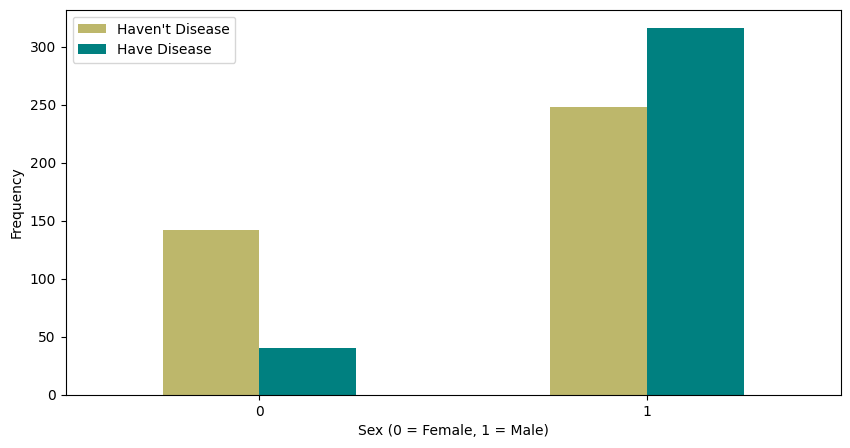

In [ ]:
pd.crosstab(combined_df.sex,combined_df.condition).plot(kind="bar",figsize=(10,5),color=['darkkhaki','teal' ])
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.xticks(rotation=0)
plt.legend(["Haven't Disease", "Have Disease"])
plt.ylabel('Frequency')
plt.show()

Text(0.5, 1.0, 'Relation of tresbps with target')

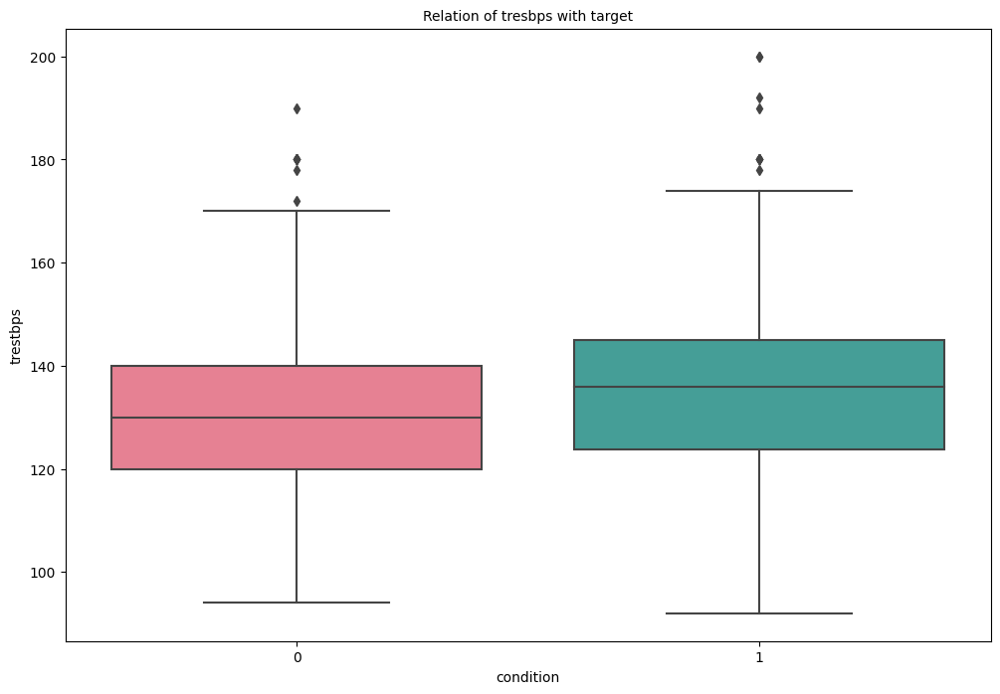

In [ ]:

plt.figure(figsize=(12,8))
sns.boxplot(x= combined_df['condition'], y= combined_df['trestbps'], palette = 'husl')
plt.title('Relation of tresbps with target', fontsize = 10)

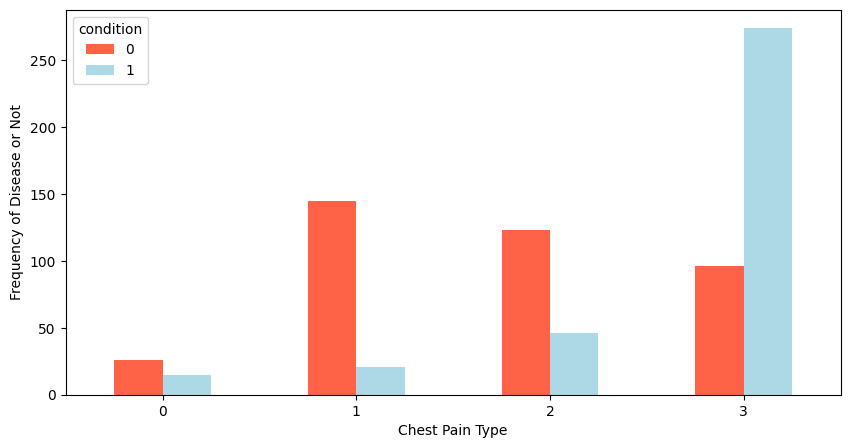

In [ ]:
pd.crosstab(combined_df.cp,combined_df.condition).plot(kind="bar",figsize=(10,5),color=['tomato','lightblue' ])
plt.xlabel('Chest Pain Type')
plt.xticks(rotation = 0)
plt.ylabel('Frequency of Disease or Not')
plt.show()

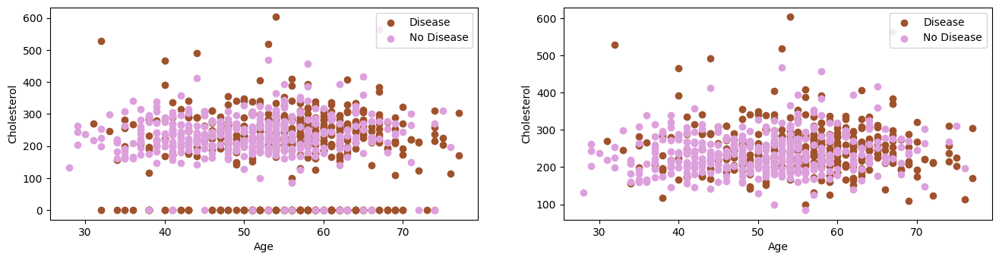

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.scatter(x=combined_df_copy.age[combined_df_copy.condition==1],y=combined_df_copy.chol[combined_df_copy.condition==1],c='sienna')
plt.scatter(x=combined_df_copy.age[combined_df_copy.condition==0],y=combined_df_copy.chol[combined_df_copy.condition==0],c='plum')
plt.xlabel('Age')
plt.ylabel('Cholesterol')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,2)
plt.scatter(x=combined_df.age[combined_df.condition==1],y=combined_df.chol[combined_df.condition==1],c='sienna')
plt.scatter(x=combined_df.age[combined_df.condition==0],y=combined_df.chol[combined_df.condition==0],c='plum')
plt.xlabel('Age')
plt.ylabel('Cholesterol')
plt.legend(['Disease','No Disease'])

In [ ]:
categorical_val = []
continous_val = []
for column in combined_df.columns:
    print('-------------------------------')
    print(f"{column} : {combined_df[column].unique()}")
    if len(combined_df[column].unique()) <= 10:
        categorical_val.append(column)
    else:
        continous_val.append(column)

-------------------------------
age : [40 49 37 48 54 39 45 58 42 38 43 60 36 44 53 52 51 56 41 32 65 35 59 50
 47 31 46 57 55 63 66 34 33 61 29 62 28 30 77 67 72 75 64 69 68 74 76 70
 71]
-------------------------------
sex : [1 0]
-------------------------------
cp : [1 2 3 0]
-------------------------------
trestbps : [140 160 130 138 150 120 110 136 115 100 124 113 125 145 112 132 118 170
 142 190 135 180 108 155 128 106  92 200 122  98 105 133 126 139 134 152
 141 137 146 158 123  96 144 131 143 116 104 172 156 114 127 101 174  94
 148 178 165 117 192 129 102 154 164]
-------------------------------
chol : [289 180 283 214 195 339 237 208 207 284 211 164 204 234 273 196 201 248
 267 223 184 288 215 209 260 468 188 518 167 224 172 186 254 306 250 177
 227 230 294 264 259 175 318 216 340 233 205 245 194 270 213 365 342 253
 277 202 297 225 246 412 265 182 218 268 163 529 100 206 238 139 263 291
 229 307 210 329 147  85 269 275 179 392 466 129 241 255 276 282 338 160
 156 272 240 393

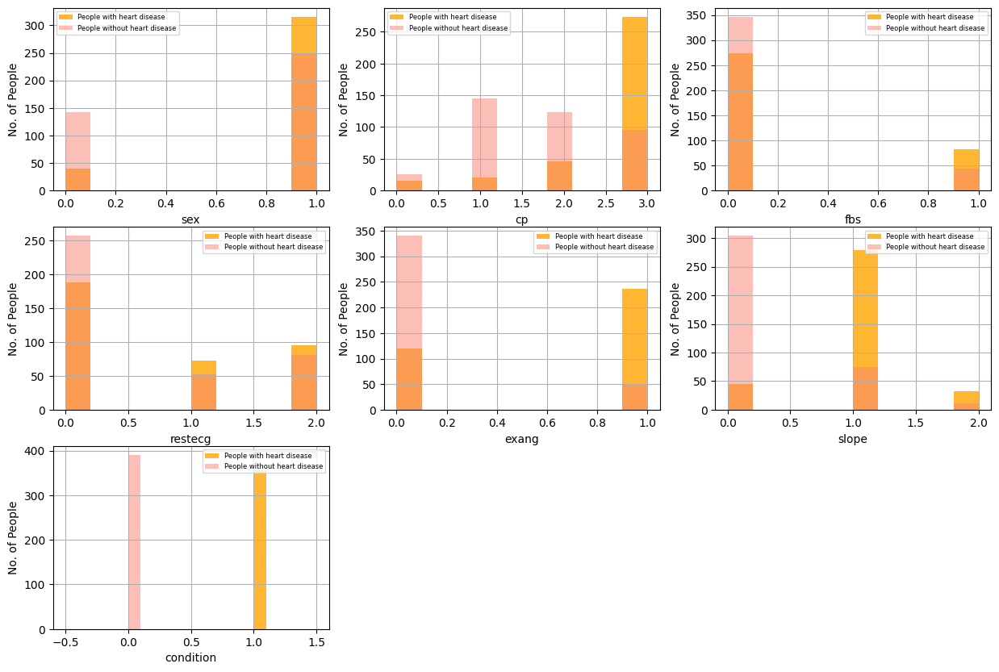

In [ ]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(categorical_val, 1):
    plt.subplot(3, 3, i)
    combined_df[combined_df["condition"] == 1][column].hist(bins=10, color='orange', label='People with heart disease',alpha=0.8)
    combined_df[combined_df["condition"] == 0][column].hist(bins=10, color='salmon', label='People without heart disease',alpha=0.5)
    plt.legend(fontsize=6)
    plt.xlabel(column)
    plt.ylabel("No. of People")


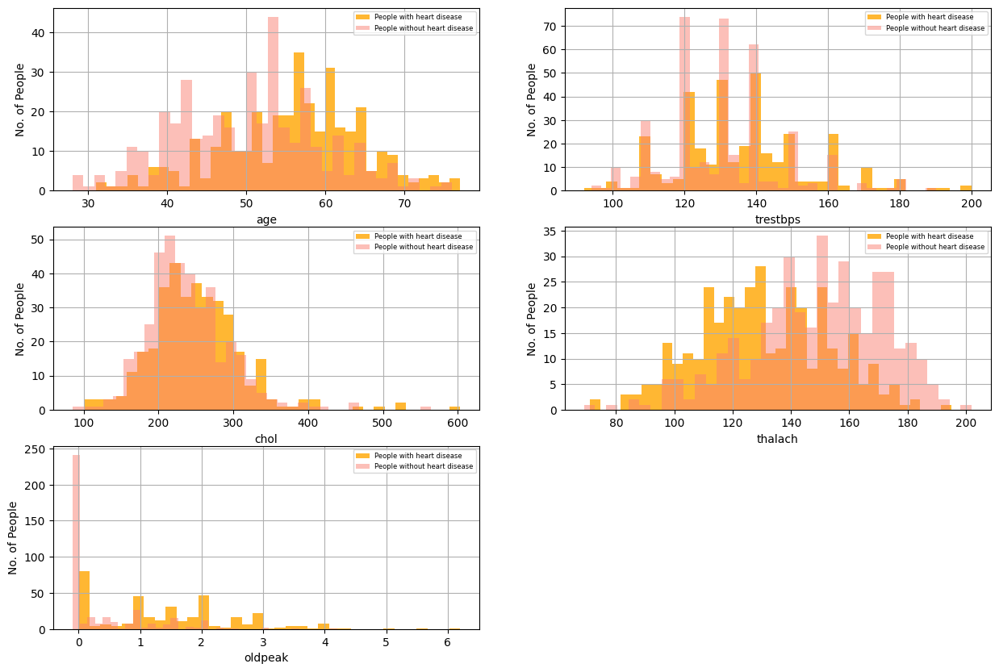

In [ ]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(continous_val, 1):
    plt.subplot(3, 2, i)
    combined_df[combined_df["condition"] == 1][column].hist(bins=35, color='orange', label='People with heart disease', alpha=0.8)
    combined_df[combined_df["condition"] == 0][column].hist(bins=35, color='salmon', label='People without heart disease',alpha=0.5)
    plt.legend(fontsize=6)
    plt.xlabel(column)
    plt.ylabel("No. of People")

<Axes: >

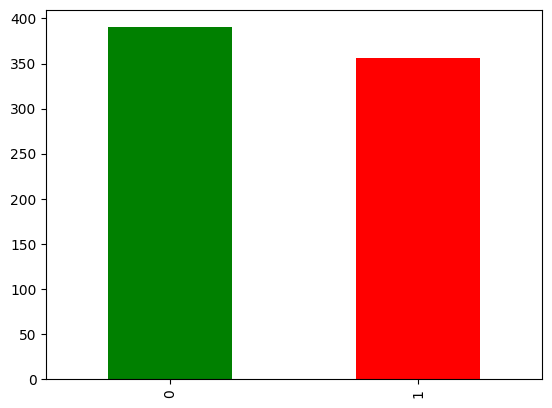

In [ ]:
combined_df["condition"].value_counts().plot.bar(color=['green', 'red'])

Text(0, 0.5, 'number of patients')

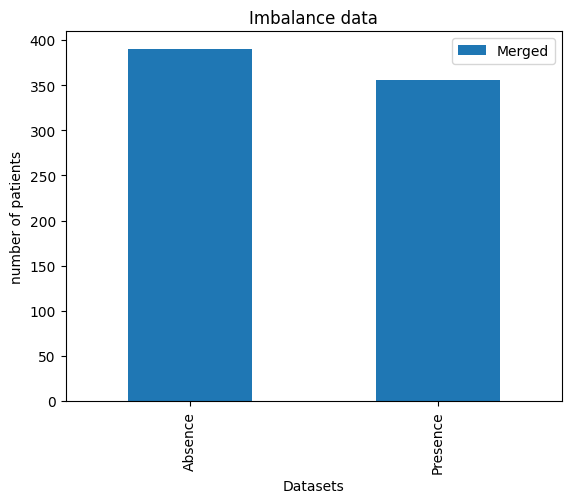

In [ ]:
combined_df['condition'].value_counts()
plotdata = pd.DataFrame({
    "Merged":[390, 356]
    }, index=['Absence', 'Presence']
)
plotdata.head()
plotdata.reset_index().plot(
    x="index", y=["Merged"], kind="bar"
)
plt.title("Imbalance data")
plt.xlabel("Datasets")
plt.ylabel("number of patients")

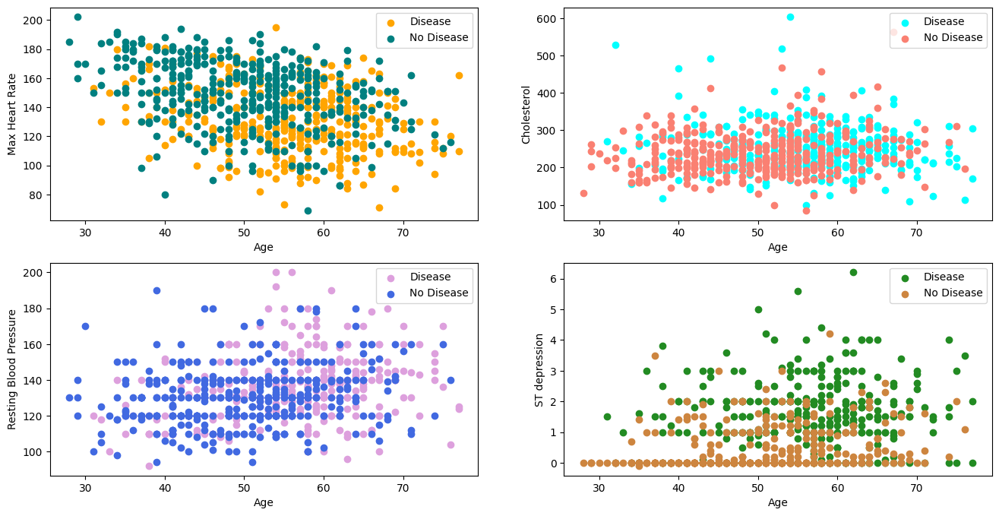

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.scatter(x=combined_df.age[combined_df.condition==1],y=combined_df.thalach[combined_df.condition==1],c='orange')
plt.scatter(x=combined_df.age[combined_df.condition==0],y=combined_df.thalach[combined_df.condition==0],c='teal')
plt.xlabel('Age')
plt.ylabel('Max Heart Rate')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,2)
plt.scatter(x=combined_df.age[combined_df.condition==1],y=combined_df.chol[combined_df.condition==1],c='cyan')
plt.scatter(x=combined_df.age[combined_df.condition==0],y=combined_df.chol[combined_df.condition==0],c='salmon')
plt.xlabel('Age')
plt.ylabel('Cholesterol')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,3)
plt.scatter(x=combined_df.age[combined_df.condition==1],y=combined_df.trestbps[combined_df.condition==1],c='plum')
plt.scatter(x=combined_df.age[combined_df.condition==0],y=combined_df.trestbps[combined_df.condition==0],c='royalblue')
plt.xlabel('Age')
plt.ylabel('Resting Blood Pressure')
plt.legend(['Disease','No Disease'])

plt.subplot(2,2,4)
plt.scatter(x=combined_df.age[combined_df.condition==1],y=combined_df.oldpeak[combined_df.condition==1],c='forestgreen')
plt.scatter(x=combined_df.age[combined_df.condition==0],y=combined_df.oldpeak[combined_df.condition==0],c='peru')
plt.xlabel('Age')
plt.ylabel('ST depression')
plt.legend(['Disease','No Disease'])
plt.show()


In [ ]:
combined_df.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,condition
count,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000
mean,52.882038,0.756032,2.163539,133.022788,244.635389,0.167560,0.639410,140.226542,0.384718,0.901609,0.589812,0.477212
std,9.505888,0.429762,0.955414,17.282750,59.153524,0.373726,0.838664,24.524107,0.486855,1.072861,0.598076,0.499816
min,28.000000,0.000000,0.000000,92.000000,85.000000,0.000000,0.000000,69.000000,0.000000,-0.100000,0.000000,0.000000
25%,46.000000,1.000000,1.000000,120.000000,207.250000,0.000000,0.000000,122.000000,0.000000,0.000000,0.000000,0.000000
50%,54.000000,1.000000,2.000000,130.000000,237.000000,0.000000,0.000000,140.000000,0.000000,0.500000,1.000000,0.000000
75%,59.000000,1.000000,3.000000,140.000000,275.000000,0.000000,1.000000,160.000000,1.000000,1.500000,1.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,603.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,1.000000


Graphs datasets all together

In [ ]:
combined_df.sex.value_counts()

1    564
0    182
Name: sex, dtype: int64

In [ ]:
#check for null values in each dataset
print("STATELOG null values:", statlog_df.isnull().sum())
print("CLEVLAND null values:", cleve_df.isnull().sum())
print("Combined null values:", combined_df.isnull().sum())


STATELOG null values: age          0
sex          0
cp           0
trestbps     0
chol         0
fbs          0
restecg      0
thalach      0
exang        0
oldpeak      0
slope        0
ca           0
thal         0
condition    0
dtype: int64
CLEVLAND null values: age          0
sex          0
cp           0
trestbps     0
chol         0
fbs          0
restecg      0
thalach      0
exang        0
oldpeak      0
slope        0
ca           0
thal         0
condition    0
dtype: int64
Combined null values: age          0
sex          0
cp           0
trestbps     0
chol         0
fbs          0
restecg      0
thalach      0
exang        0
oldpeak      0
slope        0
condition    0
dtype: int64


In [ ]:
print("Combined null values:", combined_df.isna().sum())


Combined null values: age          0
sex          0
cp           0
trestbps     0
chol         0
fbs          0
restecg      0
thalach      0
exang        0
oldpeak      0
slope        0
condition    0
dtype: int64


In [ ]:
#check for duplicates in each dataset
print("STATELOG duplicates:", statlog_df.duplicated().sum())
print("Combined duplicates:", combined_df.duplicated().sum())
print("CLEVLAND duplicates:", cleve_df.duplicated().sum())


STATELOG duplicates: 0
Combined duplicates: 0
CLEVLAND duplicates: 0


#Split Datasets train/test

Statlog

In [ ]:


#Define random state
rs = 42

X_s = statlog
y_s = statlog_df['condition'].astype('int')


X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X_s, y_s, test_size=0.20, stratify=y_s, random_state=rs)
print(X_train_s.shape, X_test_s.shape, y_train_s.shape, y_test_s.shape)


(216, 25) (54, 25) (216,) (54,)


Cleveland

In [ ]:
X_c = cleve
y_c = cleve_df['condition'].astype('int')


X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X_c, y_c, test_size=0.20, stratify=y_c, random_state=rs)
print(X_train_c.shape, X_test_c.shape, y_train_c.shape, y_test_c.shape)

(237, 25) (60, 25) (237,) (60,)


Merged

In [ ]:
X_a = combined
y_a = combined_df['condition'].astype('int')


X_train_a, X_test_a, y_train_a, y_test_a = train_test_split(X_a, y_a, test_size=0.20, stratify=y_a, random_state=rs)
print(X_train_a.shape, X_test_a.shape, y_train_a.shape, y_test_a.shape)

(596, 18) (150, 18) (596,) (150,)


#Sampling techniques for imbalanced datasets RandomOverSampler

Statlog

<Axes: >

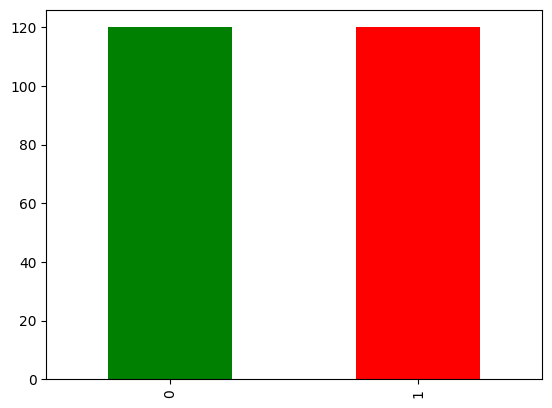

In [ ]:
"""Random over sampler for STATLOG dataset"""

ros = RandomOverSampler(random_state=rs)
X_res_s, y_res_s = ros.fit_resample(X_train_s, y_train_s)
# Visualize classes
y_res_s.value_counts().plot.bar(color=['green', 'red'])

clevland

<Axes: >

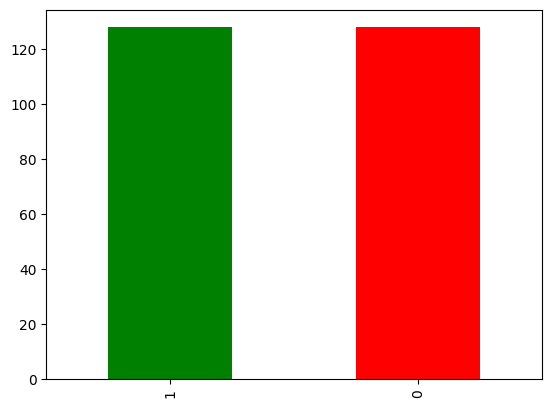

In [ ]:
X_res_c, y_res_c = ros.fit_resample(X_train_c, y_train_c)
# Visualize classes
y_res_c.value_counts().plot.bar(color=['green', 'red'])

All combined

<Axes: >

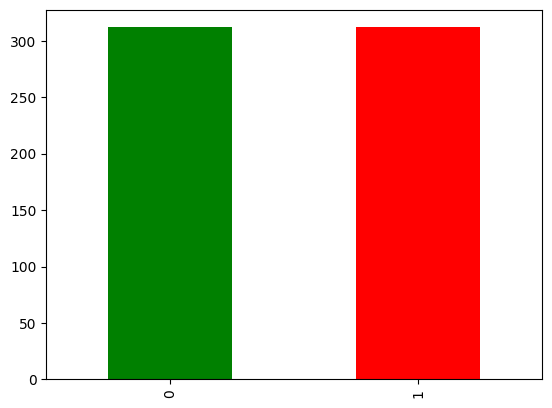

In [ ]:
X_res_a, y_res_a = ros.fit_resample(X_train_a, y_train_a)
# Visualize classes
y_res_a.value_counts().plot.bar(color=['green', 'red'])

#SMOTE sampling technique

Statlog

<Axes: >

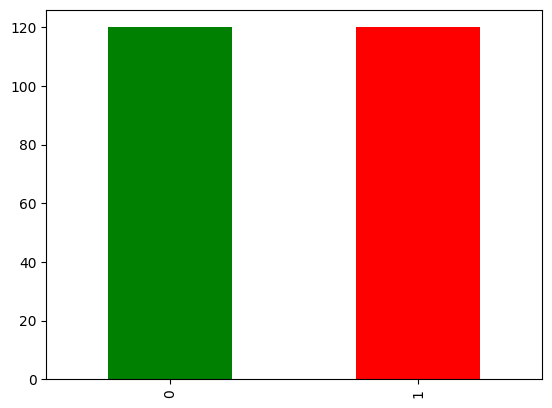

In [ ]:
# Create a SMOTE sampler
smote_sampler = SMOTE(random_state = rs)
# Resample training data using SMOTE
X_smo_s, y_smo_s = smote_sampler.fit_resample(X_train_s, y_train_s)
# Visualize classes
y_smo_s.value_counts().plot.bar(color=['green', 'red'])

Clevland

<Axes: >

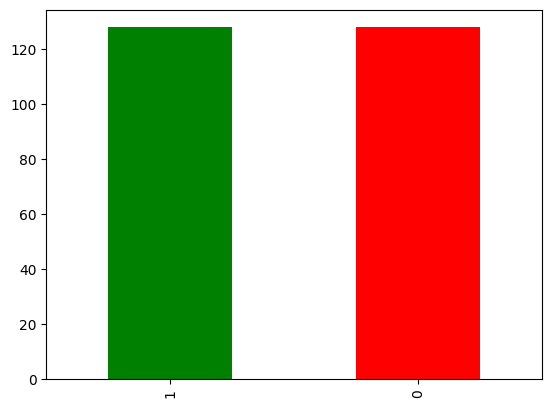

In [ ]:
# Resample training data using SMOTE
X_smo_c, y_smo_c = smote_sampler.fit_resample(X_train_c, y_train_c)
# Visualize classes
y_smo_c.value_counts().plot.bar(color=['green', 'red'])

All combined

In [ ]:
X_train_a.isna().sum()

age                    0
trestbps               0
chol                   0
thalach                0
oldpeak                0
sex                    0
fbs                    0
exang                  0
cp_typicalangina       0
cp_atypical_angina     0
cp_non_anginalpain     0
cp_asymptomatic        0
restecg_normal         0
restecg_abnormal       0
restecg_hypertrophy    0
slope_up               0
slope_flat             0
slope_down             0
dtype: int64

<Axes: >

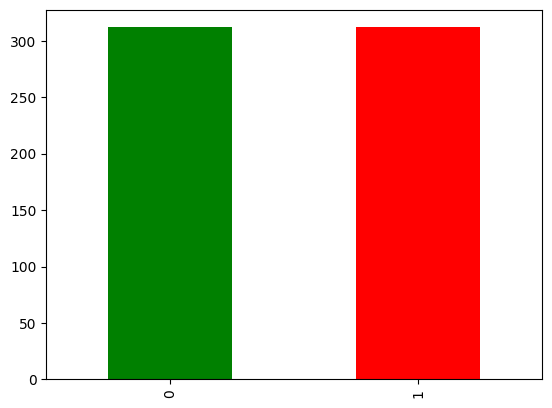

In [ ]:
# Resample training data using SMOTE
X_smo_a, y_smo_a = smote_sampler.fit_resample(X_train_a, y_train_a)
# Visualize classes
y_smo_a.value_counts().plot.bar(color=['green', 'red'])

#Sampling methods applied to entire datasets as later datasets will be divided using CV ---> SMOTE and ROS

Statlog

<Axes: >

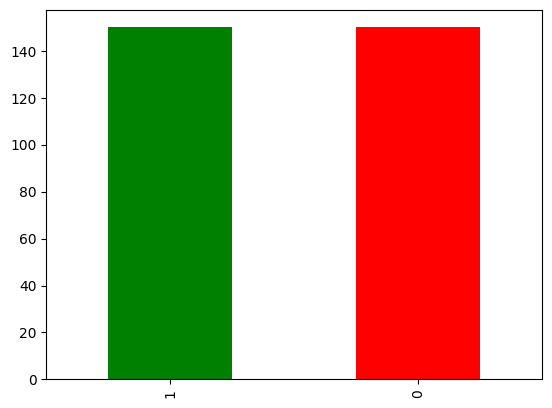

In [ ]:
# Resample training data using SMOTE
X_smo_stat, y_smo_stat = smote_sampler.fit_resample(X_s, y_s)
# Visualize classes
y_smo_stat.value_counts().plot.bar(color=['green', 'red'])


<Axes: >

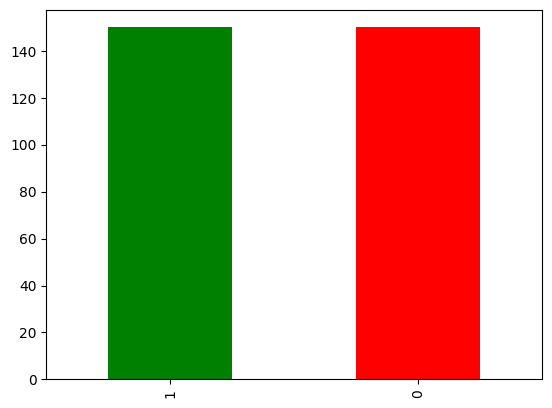

In [ ]:
#ROS
X_res_stat, y_res_stat = ros.fit_resample(X_s, y_s)
# Visualize classes
y_res_stat.value_counts().plot.bar(color=['green', 'red'])



Clevland

<Axes: >

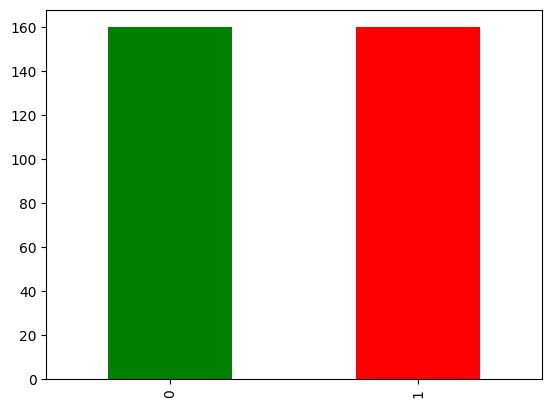

In [ ]:
# Resample training data using SMOTE
X_smo_cleve, y_smo_cleve = smote_sampler.fit_resample(X_c, y_c)
# Visualize classes
y_smo_cleve.value_counts().plot.bar(color=['green', 'red'])


<Axes: >

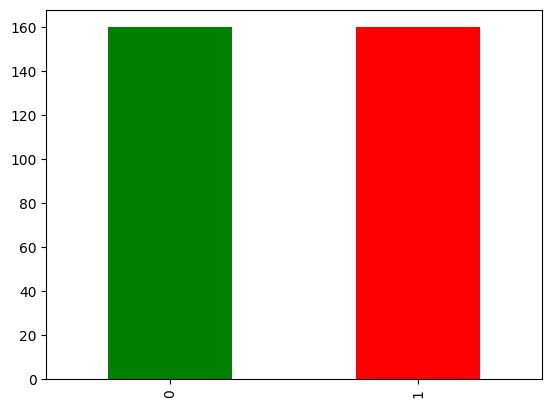

In [ ]:
#ROS
X_res_cleve, y_res_cleve = ros.fit_resample(X_c, y_c)
# Visualize classes
y_res_cleve.value_counts().plot.bar(color=['green', 'red'])

Combined all

<Axes: >

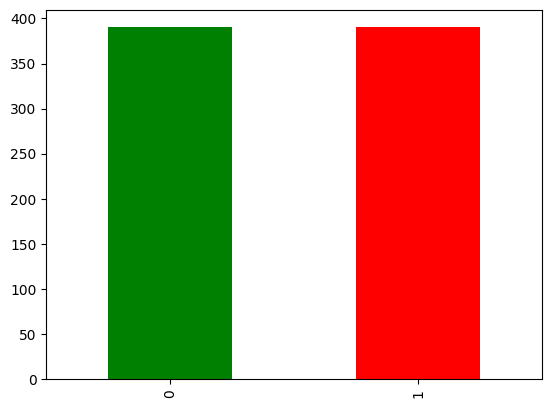

In [ ]:
# Resample training data using SMOTE
X_smo_all, y_smo_all = smote_sampler.fit_resample(X_a, y_a)
# Visualize classes
y_smo_all.value_counts().plot.bar(color=['green', 'red'])

<Axes: >

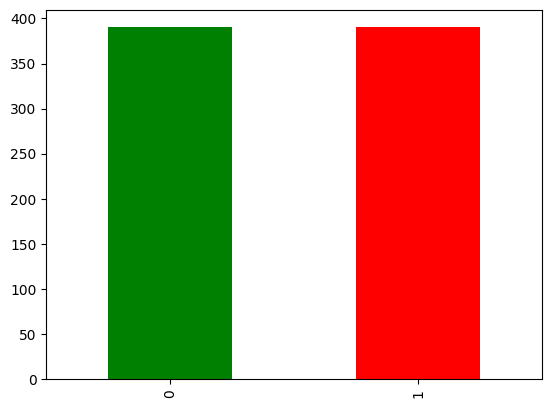

In [ ]:
#ROS
X_res_all, y_res_all = ros.fit_resample(X_a, y_a)
# Visualize classes
y_res_all.value_counts().plot.bar(color=['green', 'red'])

#Machine learning models Pipelines





Pipelines of machine learning models

In [ ]:
# Logistic Regression
LR_pipe = Pipeline([
                    ("logistic regression", LogisticRegression(random_state=rs))])
NB_pipe = Pipeline([
                    ("NB Gaussian", GaussianNB())])

DT_pipe = Pipeline([
                    ("Decision Tree", DecisionTreeClassifier(random_state=rs))])

SVLC_pipe = Pipeline([
                    ("SVLC", SVC(random_state=rs))])

GB_pipe = Pipeline([
                    ("GradientBoosting", GradientBoostingClassifier(random_state=rs))])

ADA_pipe = Pipeline([
                    ("ADABoost", AdaBoostClassifier(random_state=rs))])

Bagg_pipe = Pipeline([
                    ("Bagging", BaggingClassifier(random_state=rs))])

RF_pipe = Pipeline([
                    ("Random Forest", RandomForestClassifier(random_state=rs))])

MLP_pipe = Pipeline([
                    ("MLP", MLPClassifier(random_state=rs))])

XGB_pipe = Pipeline([
                    ("XGB", XGBClassifier(random_state=rs))])

KNN_pipe = Pipeline([
                    ("KNN", KNeighborsClassifier())])



#all pipes
all_pipes = [LR_pipe, NB_pipe, DT_pipe, SVLC_pipe, GB_pipe, ADA_pipe, Bagg_pipe, RF_pipe, MLP_pipe, XGB_pipe, KNN_pipe]

# best model metrics
accuracy = 0.0
classifier= 0
pipeline= ""


#Dict of pipelines and training models
PipelineDict = {0: 'LR', 1: 'NB', 2: 'DT', 3: 'SVLC', 4:'GB', 5:'ADA', 6: 'Bagg', 7: 'RF', 8: 'MLP', 9: 'XGB', 10: 'KNN'}

#Functions for training, testing, evaluating, tunning

In [ ]:
from pandas.io.formats.info import DataFrameInfoPrinter
#variables for cross-validation
splits = 10


cv_LOOC = LeaveOneOut()# report performance

def model_training(all_pipes, X_train, y_train):
  for mypipe in all_pipes:
    mypipe.fit(X_train, y_train)
  return all_pipes

def model_testing(PipelineDict, all_pipes, X_test, y_test):
  scores = []
  for i,model in enumerate(all_pipes):
    pred = model.predict(X_test)
    precision, recall, fscore, _ = precision_recall_fscore_support(y_test, pred)
    acc = model.score(X_test,y_test)
    print("{} Test Accuracy: {}".format(PipelineDict[i], round(acc,2) * 100 ))
    print("{} Test f1_score: {}".format(PipelineDict[i], round(mean(fscore),2) * 100))
    print("{} Test precision_score: {}".format(PipelineDict[i], round(mean(precision),2) * 100))
    print("{} Test recall_score: {}".format(PipelineDict[i], round(mean(recall),2) * 100))
    fpr, tpr, thresholds = metrics.roc_curve(y_test, pred)
    roc_auc = metrics.auc(fpr, tpr)
    display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,
                                   estimator_name=PipelineDict[i])
    display.plot()
    # metrics.roc_curve(model, X_test, y_test, ax=plt.gca())
    plt.show()# evaluate model
    scores.append({
          'model': PipelineDict[i],
          'best_acc': acc,

      })

  model_col = ['red','blue', 'yellow', 'black', 'green',  'cyan', 'orange', 'bisque', 'brown','grey', 'purple']
  model_lst = ['LR' , 'NB', 'DT' , 'SVLC' , 'GB' , 'ADA' , 'Bagg' , 'RF', 'MLP','XGB', 'KNN']
  df_normal = pd.DataFrame(scores,columns=['model','best_acc'])
  df_normal.plot.bar(x='model', y='best_acc', color=model_col, rot=0)
  return df_normal





def bar_plot(df,df2, palette):
  model_col = ['red','blue', 'yellow', 'black', 'green',  'cyan', 'orange', 'bisque', 'brown','grey', 'purple']
  concat_df = pd.concat([df, df2],axis=0, ignore_index=False)
  concat_df['col'] = (len(df)*('base_model',) + len(df2)*('tuned_model',))
  concat_df.reset_index(inplace=True)
  sns.catplot(x='model', y='best_acc', hue='col', kind='bar', data=concat_df, palette=palette)


  # concat_df = concat_df.drop(concat_df.index[0])
  # concat_df.plot.bar(x='model', stacked=False, color=model_col, rot=0)

  return concat_df


def cv_evaluation(PipelineDict, all_pipes, X, y):

  scores_ = []

  for i,model in enumerate(all_pipes):

    #LOOC
    scores_LOOC = cross_val_score(model, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)

    scores_.append({
          'CV' :'LOOC',
          'model': PipelineDict[i],
          'best_acc': round(mean(scores_LOOC),2) * 100

      })

    df_normal = pd.DataFrame(scores_,columns=['CV', 'model','best_acc'])

  return df_normal









#Model training and evaluation Statlog

training

In [ ]:
base_statlog_train = model_training(all_pipes, X_train_s, y_train_s)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


testing

LR Test Accuracy: 85.0
LR Test f1_score: 85.0
LR Test precision_score: 85.0
LR Test recall_score: 86.0


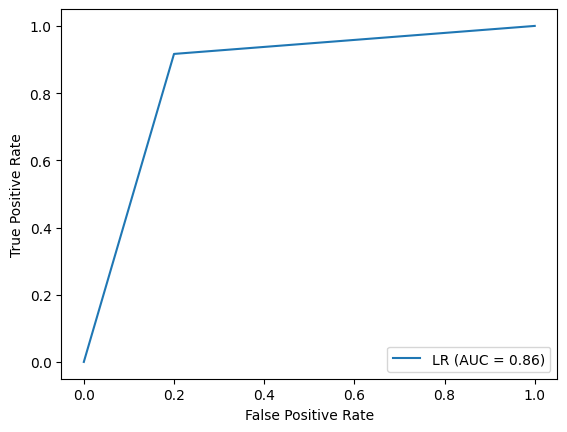

NB Test Accuracy: 70.0
NB Test f1_score: 69.0
NB Test precision_score: 71.0
NB Test recall_score: 69.0


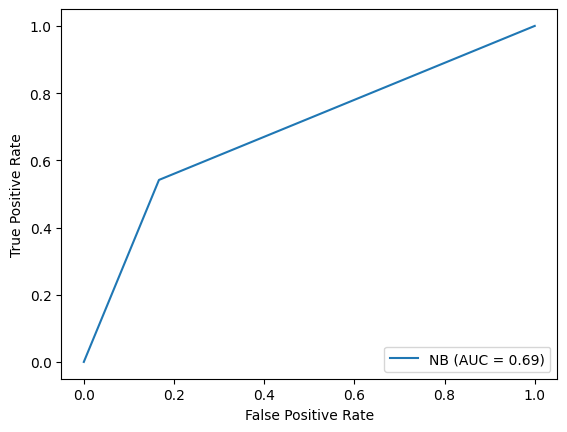

DT Test Accuracy: 74.0
DT Test f1_score: 74.0
DT Test precision_score: 74.0
DT Test recall_score: 75.0


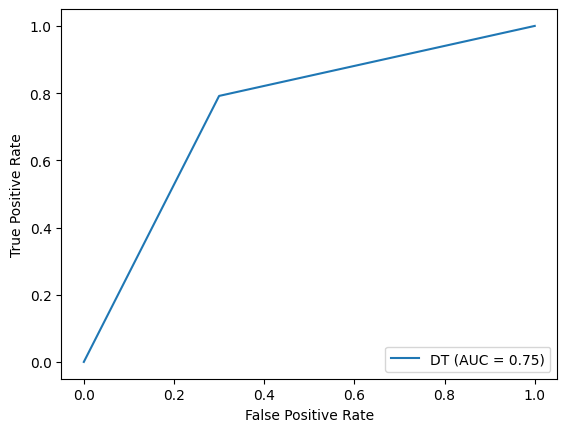

SVLC Test Accuracy: 87.0
SVLC Test f1_score: 87.0
SVLC Test precision_score: 87.0
SVLC Test recall_score: 87.0


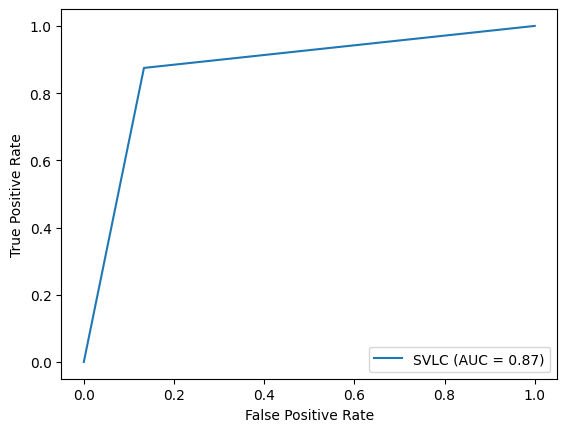

GB Test Accuracy: 81.0
GB Test f1_score: 81.0
GB Test precision_score: 81.0
GB Test recall_score: 82.0


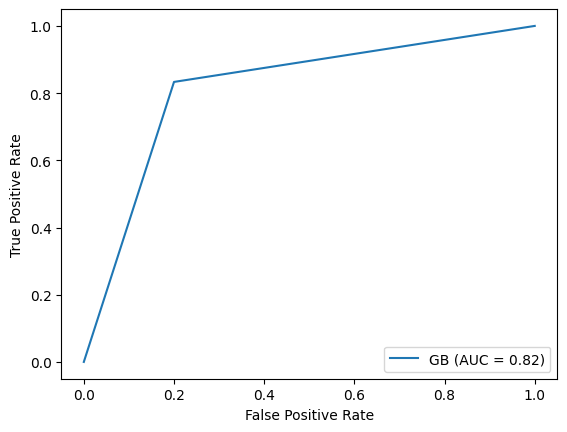

ADA Test Accuracy: 74.0
ADA Test f1_score: 74.0
ADA Test precision_score: 74.0
ADA Test recall_score: 74.0


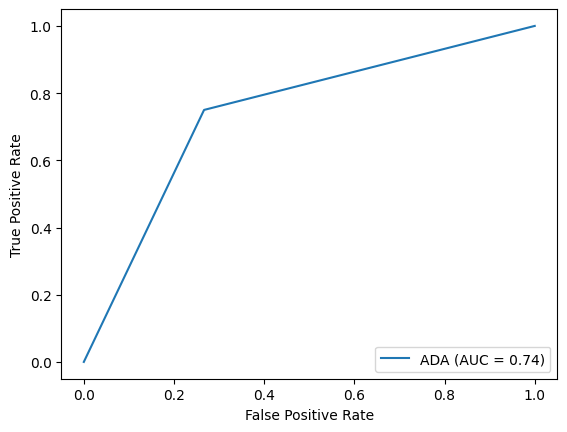

Bagg Test Accuracy: 85.0
Bagg Test f1_score: 85.0
Bagg Test precision_score: 85.0
Bagg Test recall_score: 85.0


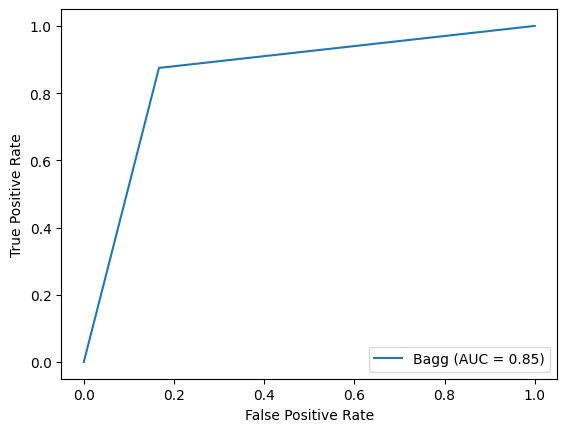

RF Test Accuracy: 80.0
RF Test f1_score: 80.0
RF Test precision_score: 80.0
RF Test recall_score: 80.0


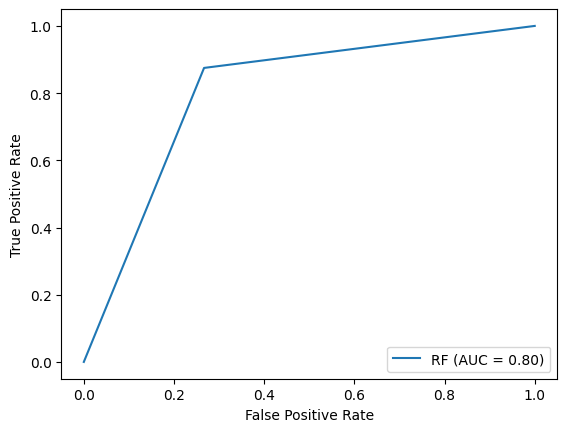

MLP Test Accuracy: 83.0
MLP Test f1_score: 83.0
MLP Test precision_score: 84.0
MLP Test recall_score: 84.0


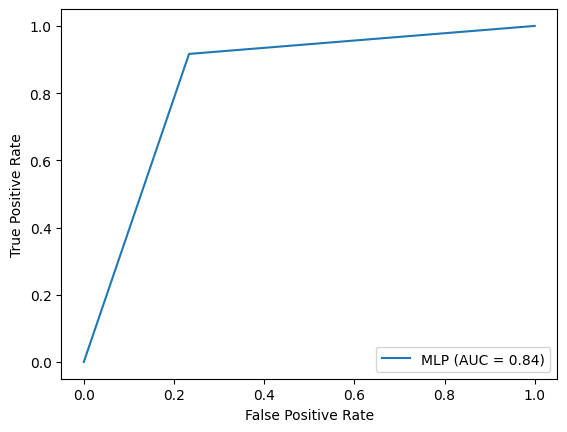

XGB Test Accuracy: 80.0
XGB Test f1_score: 80.0
XGB Test precision_score: 80.0
XGB Test recall_score: 80.0


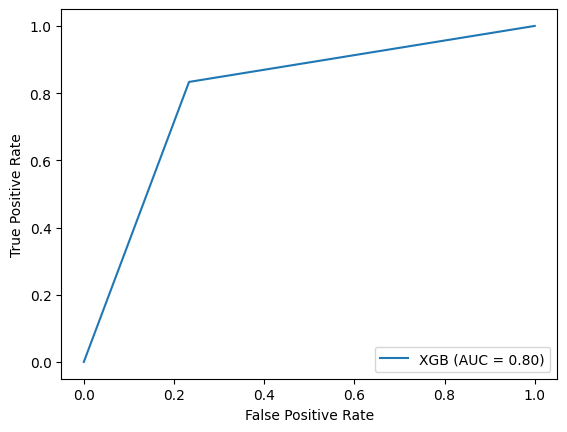

KNN Test Accuracy: 80.0
KNN Test f1_score: 79.0
KNN Test precision_score: 79.0
KNN Test recall_score: 80.0


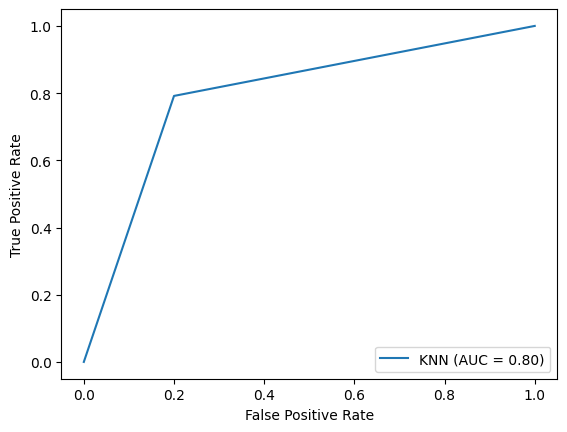

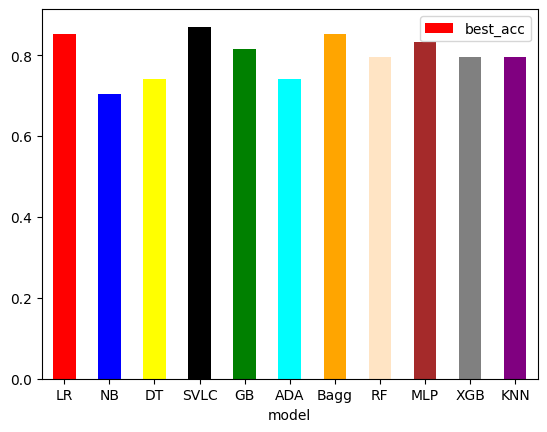

In [ ]:
base_test_statlog = model_testing(PipelineDict, base_statlog_train, X_test_s, y_test_s)



Cross-validation

In [ ]:
base_cv_statlog = cv_evaluation(PipelineDict, all_pipes, X_s, y_s)

KeyboardInterrupt: ignored

In [ ]:
base_cv_statlog

#Statlog + SMOTE

In [ ]:
base_smote_statlog_train = model_training(all_pipes, X_smo_s, y_smo_s)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 85.0
LR Test f1_score: 85.0
LR Test precision_score: 86.0
LR Test recall_score: 86.0


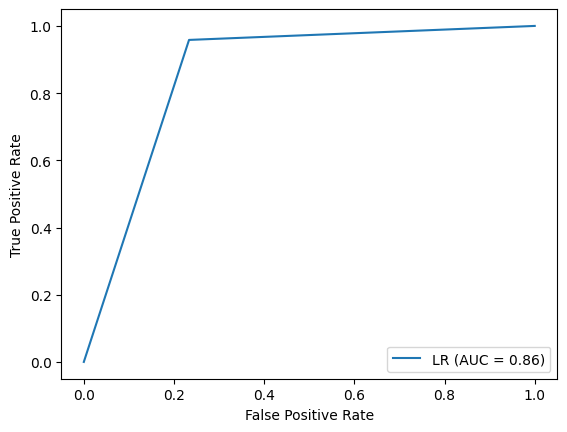

NB Test Accuracy: 74.0
NB Test f1_score: 73.0
NB Test precision_score: 74.0
NB Test recall_score: 73.0


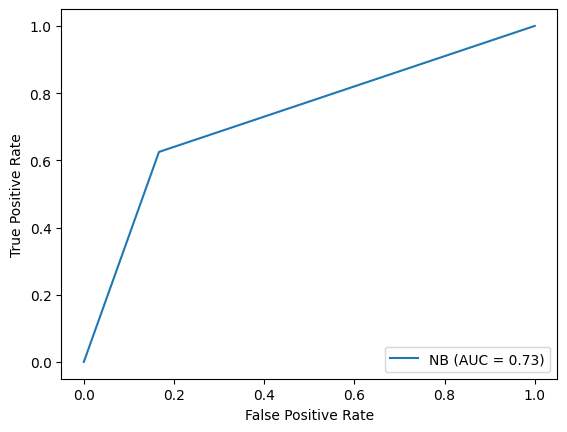

DT Test Accuracy: 83.0
DT Test f1_score: 83.0
DT Test precision_score: 83.0
DT Test recall_score: 84.0


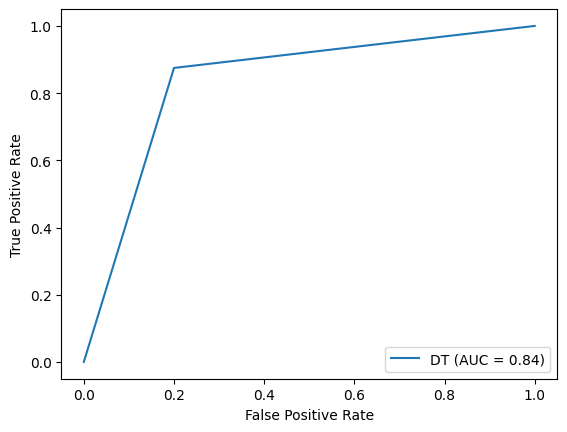

SVLC Test Accuracy: 87.0
SVLC Test f1_score: 87.0
SVLC Test precision_score: 87.0
SVLC Test recall_score: 87.0


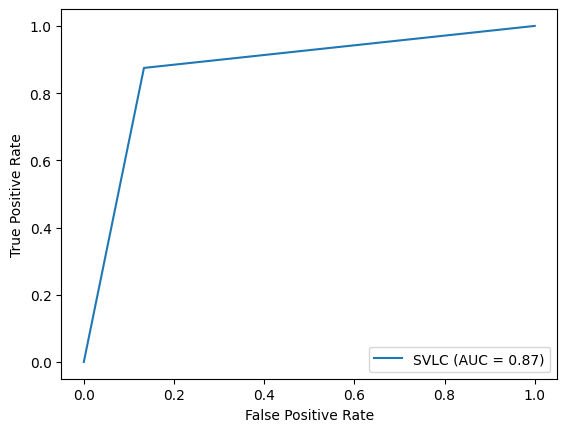

GB Test Accuracy: 81.0
GB Test f1_score: 81.0
GB Test precision_score: 81.0
GB Test recall_score: 82.0


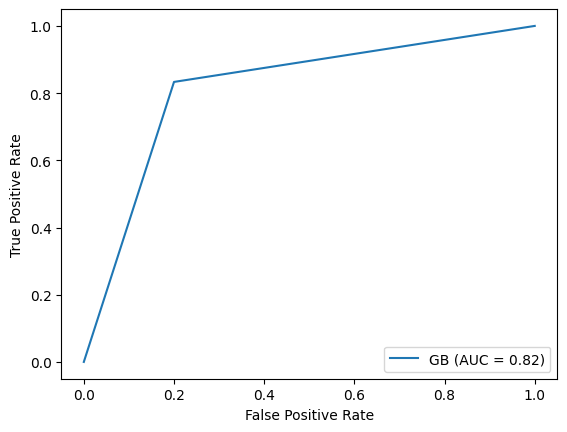

ADA Test Accuracy: 80.0
ADA Test f1_score: 80.0
ADA Test precision_score: 80.0
ADA Test recall_score: 80.0


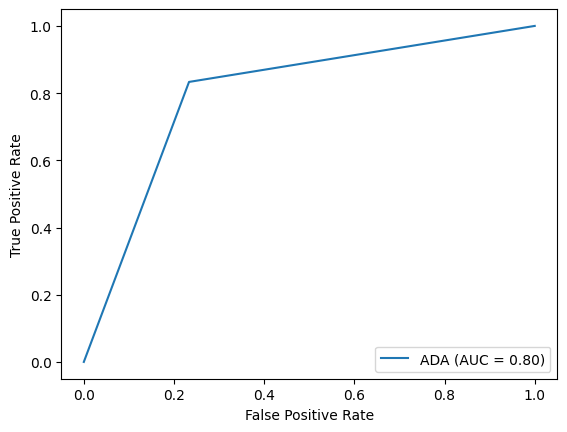

Bagg Test Accuracy: 80.0
Bagg Test f1_score: 80.0
Bagg Test precision_score: 80.0
Bagg Test recall_score: 80.0


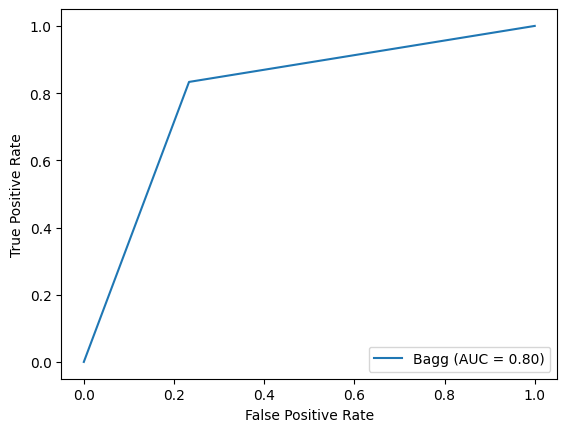

RF Test Accuracy: 81.0
RF Test f1_score: 81.0
RF Test precision_score: 81.0
RF Test recall_score: 82.0


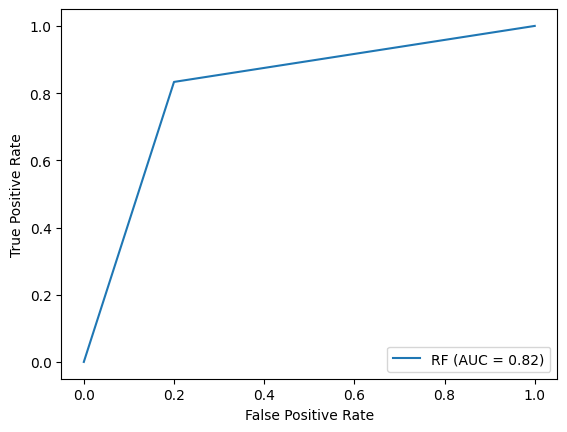

MLP Test Accuracy: 87.0
MLP Test f1_score: 87.0
MLP Test precision_score: 87.0
MLP Test recall_score: 88.0


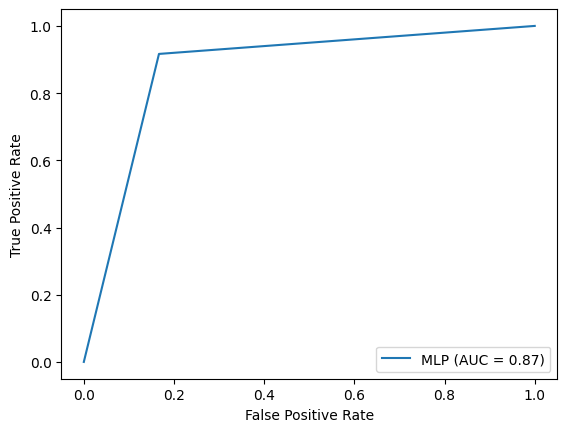

XGB Test Accuracy: 81.0
XGB Test f1_score: 81.0
XGB Test precision_score: 81.0
XGB Test recall_score: 82.0


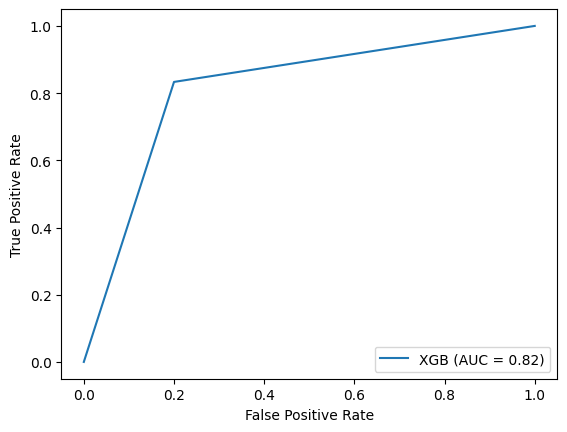

KNN Test Accuracy: 83.0
KNN Test f1_score: 83.0
KNN Test precision_score: 84.0
KNN Test recall_score: 84.0


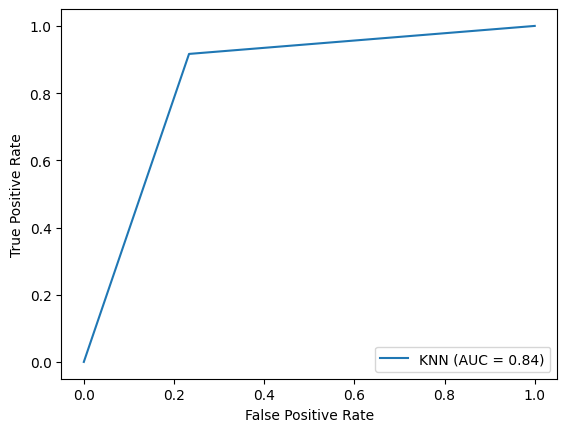

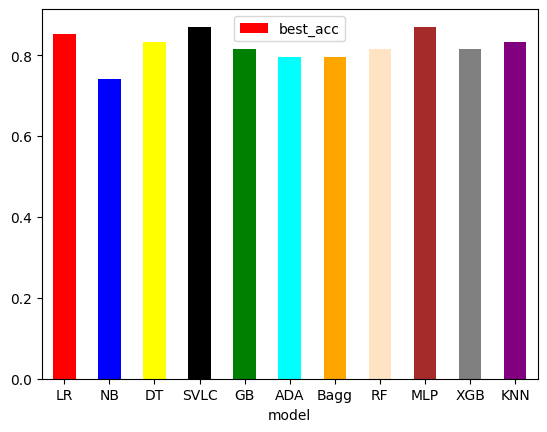

In [ ]:
base_smote_statlog = model_testing(PipelineDict, base_smote_statlog_train, X_test_s, y_test_s)

In [ ]:
base_smote_cv_statlog = cv_evaluation(PipelineDict, all_pipes, X_smo_stat, y_smo_stat)

#Statlog + ROS

In [ ]:
base_ros_statlog_train = model_training(all_pipes, X_res_s, y_res_s)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 87.0
LR Test f1_score: 87.0
LR Test precision_score: 88.0
LR Test recall_score: 88.0


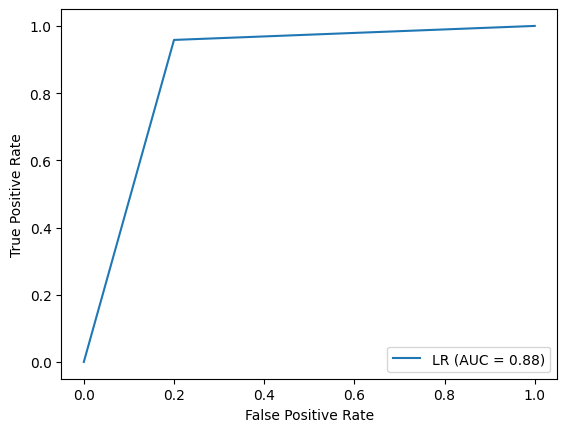

NB Test Accuracy: 70.0
NB Test f1_score: 69.0
NB Test precision_score: 71.0
NB Test recall_score: 69.0


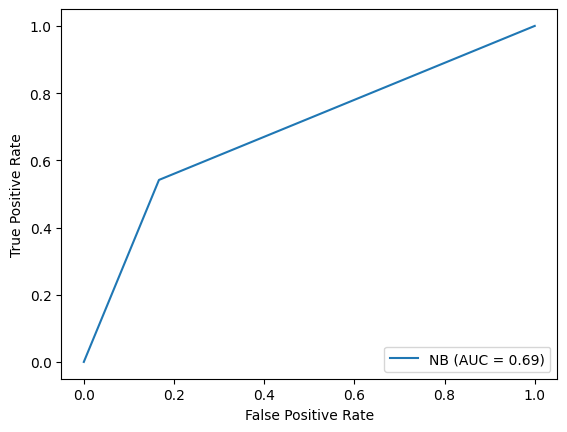

DT Test Accuracy: 80.0
DT Test f1_score: 80.0
DT Test precision_score: 80.0
DT Test recall_score: 80.0


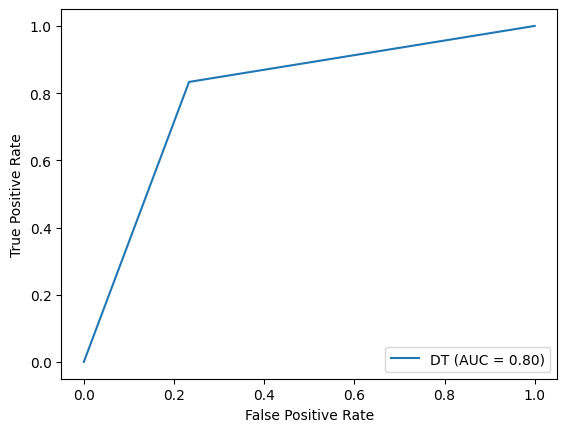

SVLC Test Accuracy: 89.0
SVLC Test f1_score: 89.0
SVLC Test precision_score: 89.0
SVLC Test recall_score: 89.0


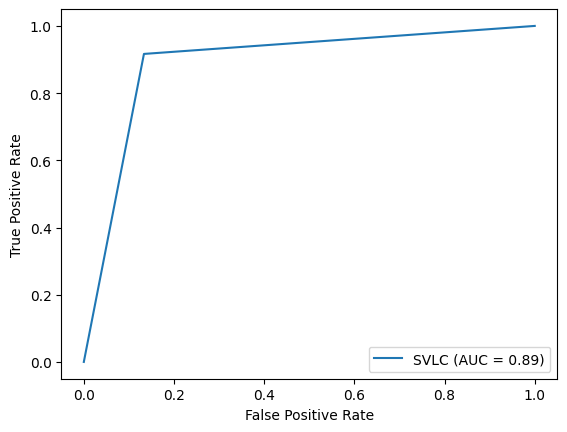

GB Test Accuracy: 81.0
GB Test f1_score: 81.0
GB Test precision_score: 82.0
GB Test recall_score: 82.0


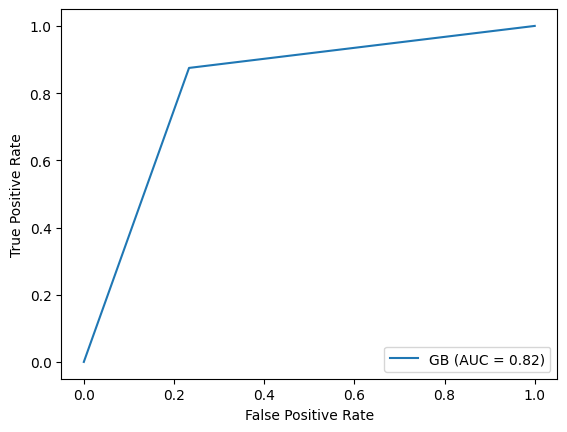

ADA Test Accuracy: 81.0
ADA Test f1_score: 81.0
ADA Test precision_score: 82.0
ADA Test recall_score: 82.0


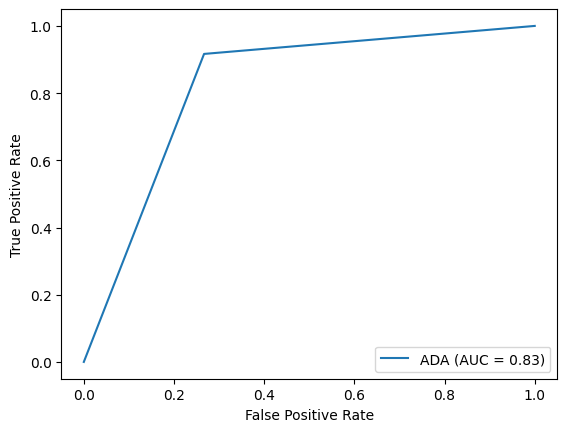

Bagg Test Accuracy: 81.0
Bagg Test f1_score: 81.0
Bagg Test precision_score: 82.0
Bagg Test recall_score: 82.0


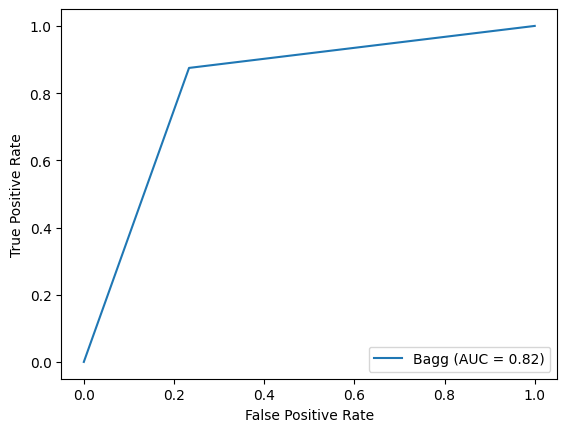

RF Test Accuracy: 83.0
RF Test f1_score: 83.0
RF Test precision_score: 83.0
RF Test recall_score: 84.0


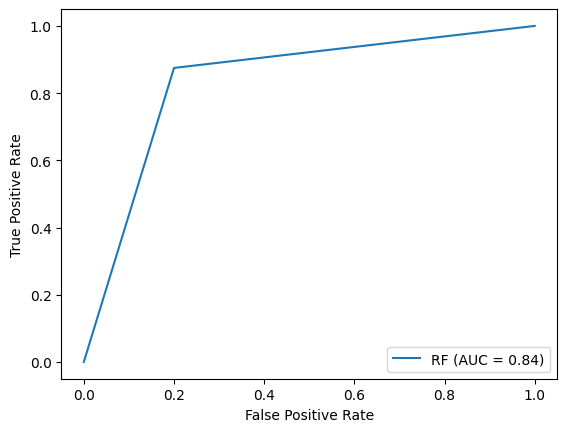

MLP Test Accuracy: 87.0
MLP Test f1_score: 87.0
MLP Test precision_score: 87.0
MLP Test recall_score: 87.0


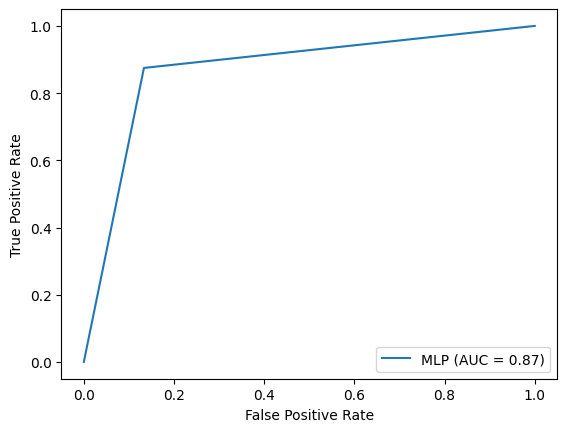

XGB Test Accuracy: 83.0
XGB Test f1_score: 83.0
XGB Test precision_score: 83.0
XGB Test recall_score: 83.0


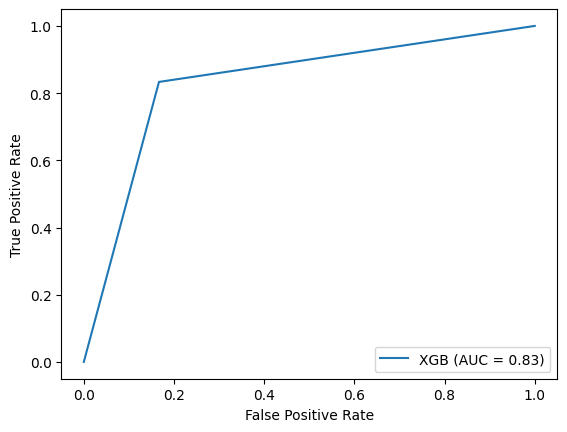

KNN Test Accuracy: 78.0
KNN Test f1_score: 78.0
KNN Test precision_score: 78.0
KNN Test recall_score: 78.0


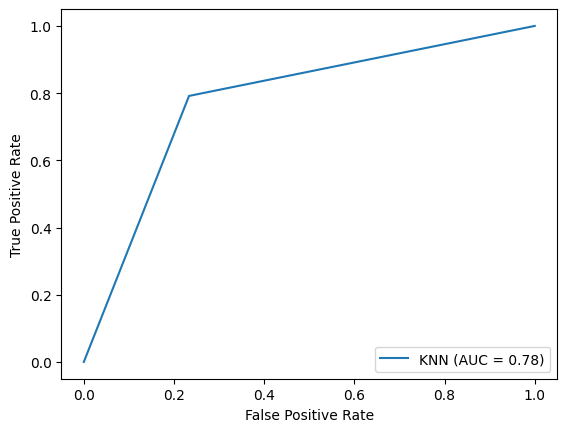

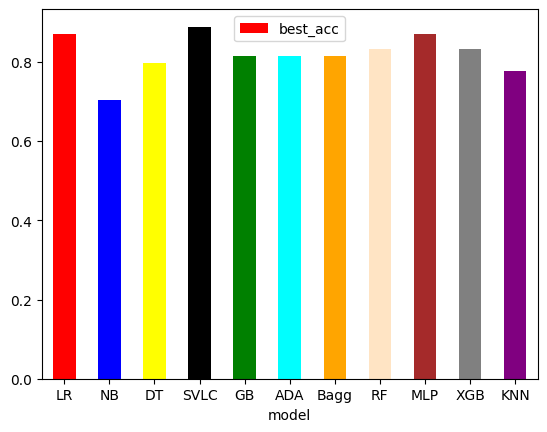

In [ ]:
base_ros_statlog = model_testing(PipelineDict, base_ros_statlog_train, X_test_s, y_test_s)

In [ ]:
base_ros_cv_statlog = cv_evaluation(PipelineDict, all_pipes, X_res_stat, y_res_stat)

#Clevland training and testing

In [ ]:
base_clevland_train=model_training(all_pipes, X_train_c, y_train_c)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 90.0
LR Test f1_score: 90.0
LR Test precision_score: 92.0
LR Test recall_score: 89.0


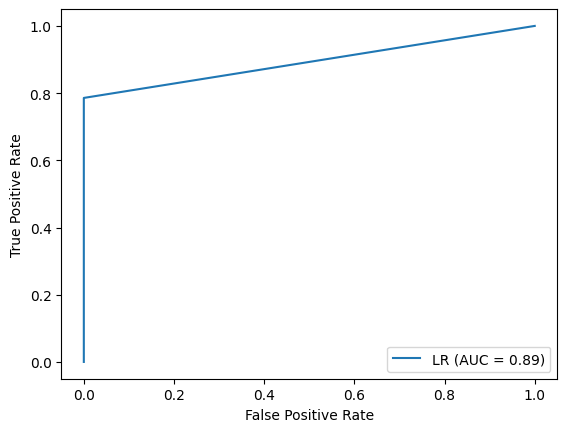

NB Test Accuracy: 88.0
NB Test f1_score: 88.0
NB Test precision_score: 91.0
NB Test recall_score: 88.0


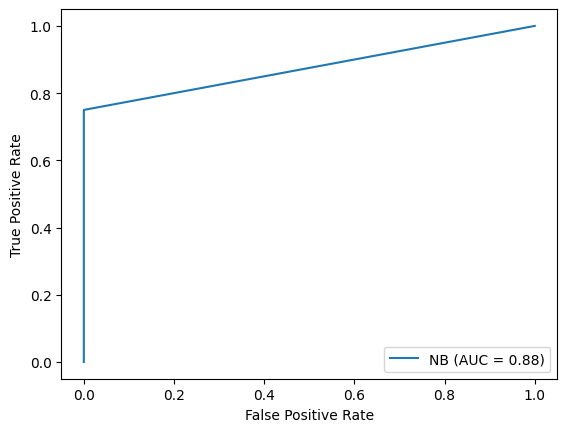

DT Test Accuracy: 75.0
DT Test f1_score: 75.0
DT Test precision_score: 75.0
DT Test recall_score: 75.0


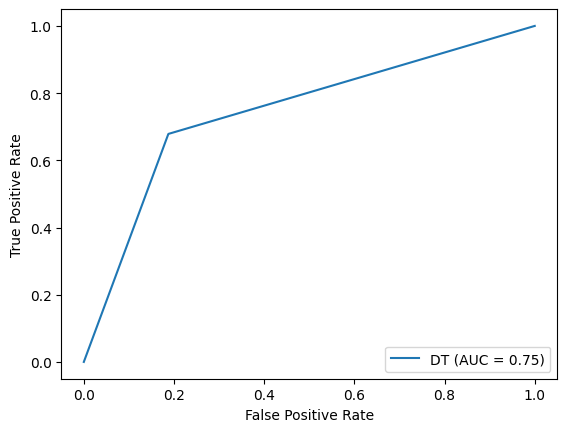

SVLC Test Accuracy: 93.0
SVLC Test f1_score: 93.0
SVLC Test precision_score: 94.0
SVLC Test recall_score: 93.0


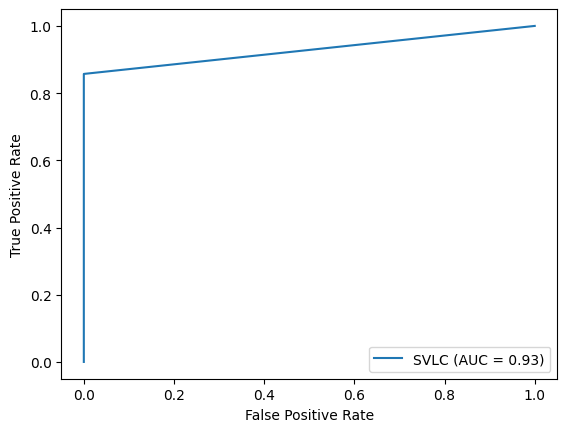

GB Test Accuracy: 82.0
GB Test f1_score: 81.0
GB Test precision_score: 83.0
GB Test recall_score: 81.0


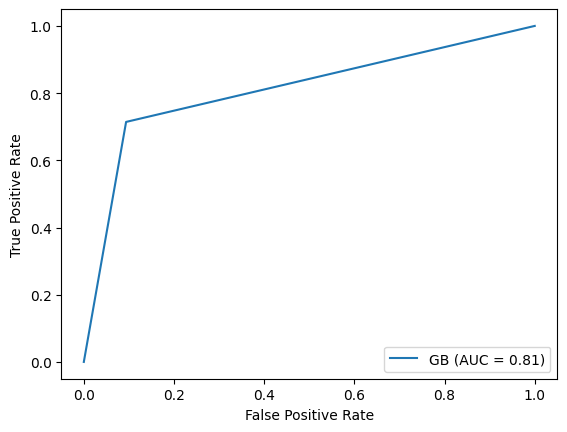

ADA Test Accuracy: 83.0
ADA Test f1_score: 83.0
ADA Test precision_score: 84.0
ADA Test recall_score: 83.0


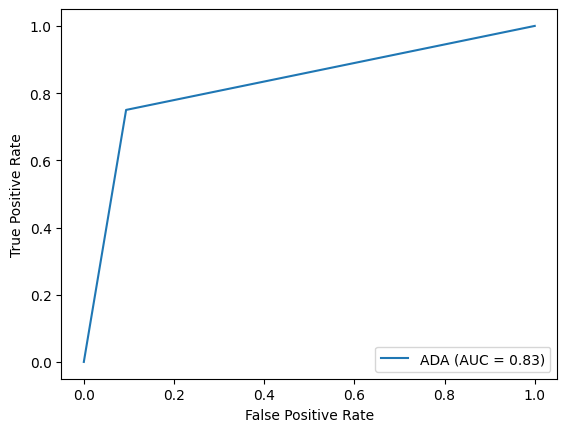

Bagg Test Accuracy: 80.0
Bagg Test f1_score: 80.0
Bagg Test precision_score: 81.0
Bagg Test recall_score: 79.0


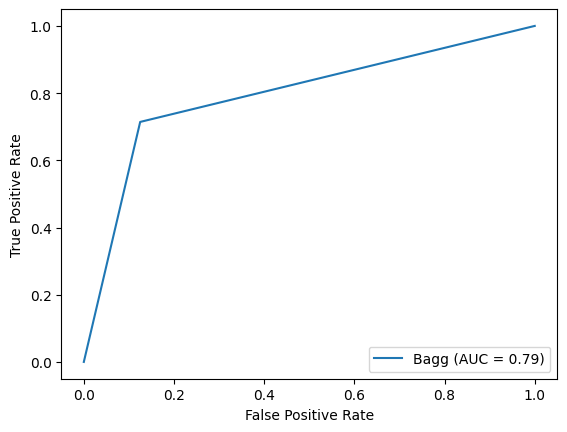

RF Test Accuracy: 85.0
RF Test f1_score: 85.0
RF Test precision_score: 86.0
RF Test recall_score: 84.0


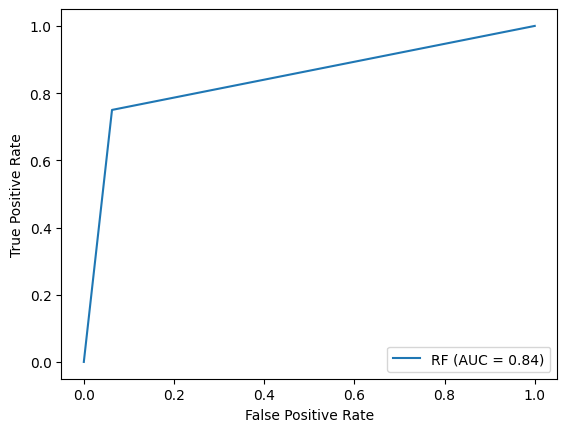

MLP Test Accuracy: 92.0
MLP Test f1_score: 91.0
MLP Test precision_score: 93.0
MLP Test recall_score: 91.0


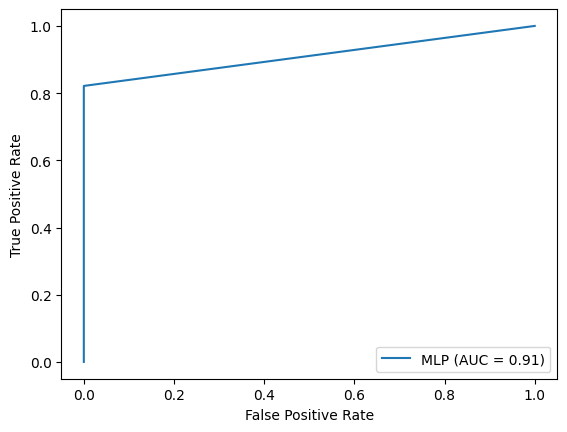

XGB Test Accuracy: 85.0
XGB Test f1_score: 85.0
XGB Test precision_score: 85.0
XGB Test recall_score: 85.0


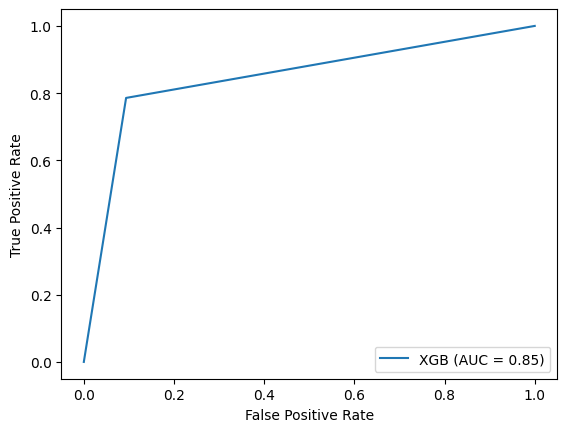

KNN Test Accuracy: 90.0
KNN Test f1_score: 90.0
KNN Test precision_score: 91.0
KNN Test recall_score: 90.0


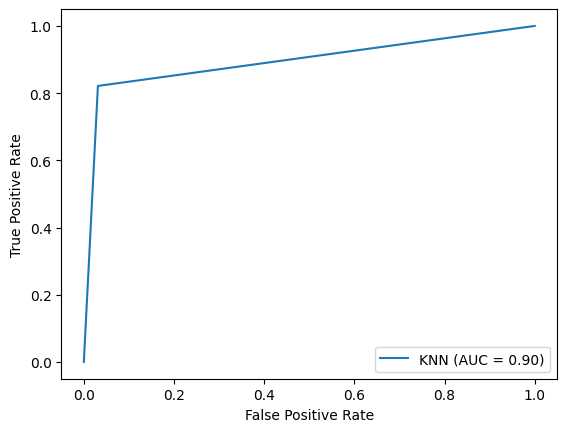

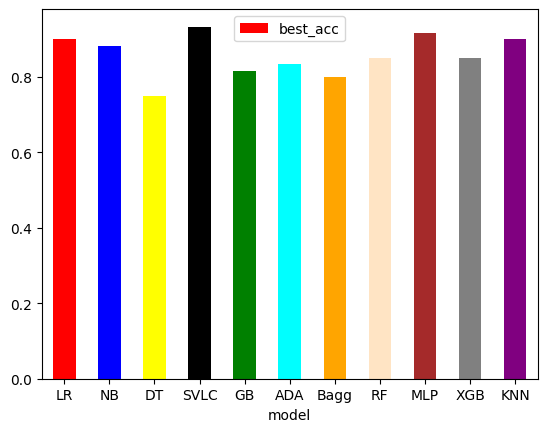

In [ ]:
base_clevland = model_testing(PipelineDict, base_clevland_train, X_test_c, y_test_c)

In [ ]:
base_clevland_cv = cv_evaluation(PipelineDict, all_pipes, X_c, y_c)

#Clevland + SMOTE

In [ ]:
base_smote_clevland_train = model_training(all_pipes, X_smo_c, y_smo_c)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 93.0
LR Test f1_score: 93.0
LR Test precision_score: 94.0
LR Test recall_score: 93.0


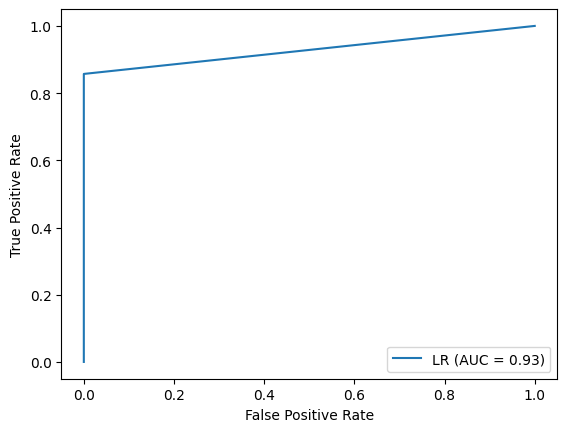

NB Test Accuracy: 88.0
NB Test f1_score: 88.0
NB Test precision_score: 91.0
NB Test recall_score: 88.0


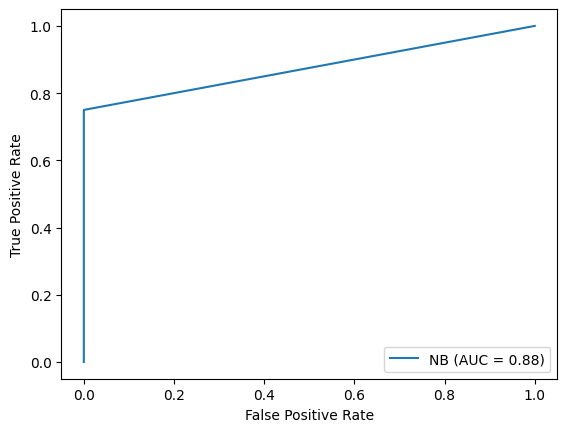

DT Test Accuracy: 83.0
DT Test f1_score: 83.0
DT Test precision_score: 83.0
DT Test recall_score: 83.0


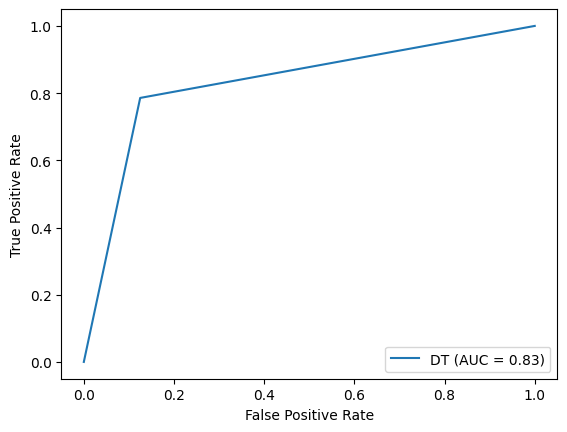

SVLC Test Accuracy: 93.0
SVLC Test f1_score: 93.0
SVLC Test precision_score: 94.0
SVLC Test recall_score: 93.0


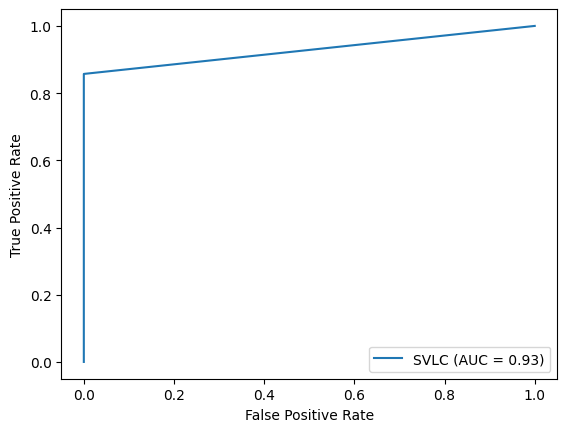

GB Test Accuracy: 85.0
GB Test f1_score: 85.0
GB Test precision_score: 86.0
GB Test recall_score: 84.0


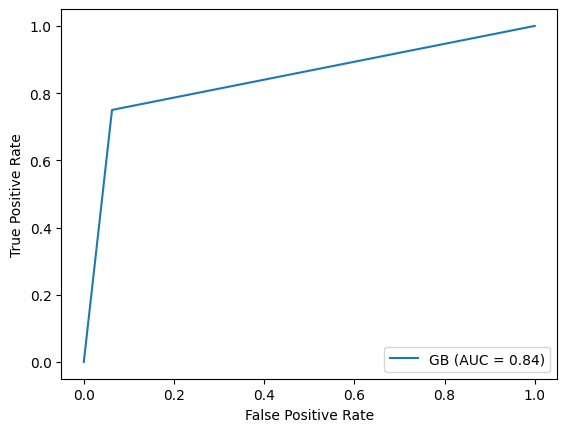

ADA Test Accuracy: 85.0
ADA Test f1_score: 85.0
ADA Test precision_score: 85.0
ADA Test recall_score: 85.0


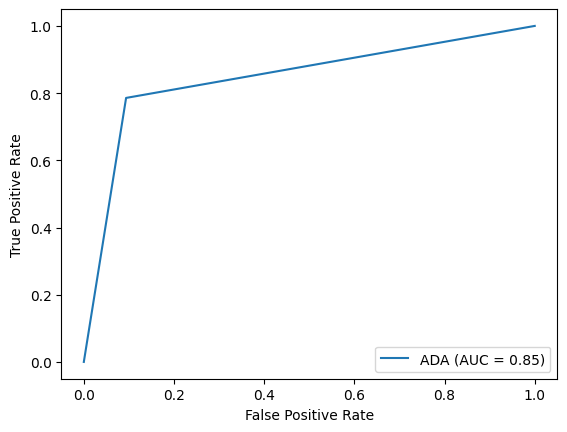

Bagg Test Accuracy: 82.0
Bagg Test f1_score: 81.0
Bagg Test precision_score: 82.0
Bagg Test recall_score: 81.0


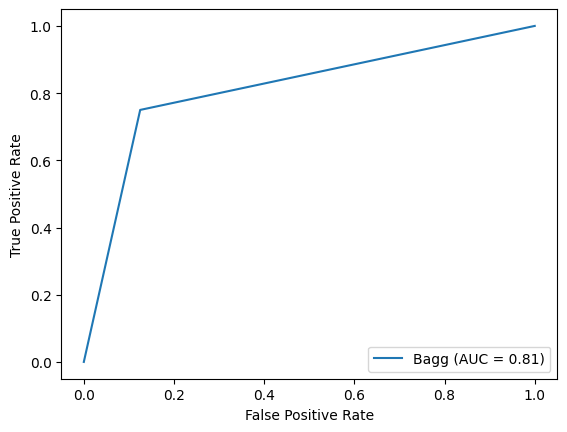

RF Test Accuracy: 87.0
RF Test f1_score: 86.0
RF Test precision_score: 89.0
RF Test recall_score: 86.0


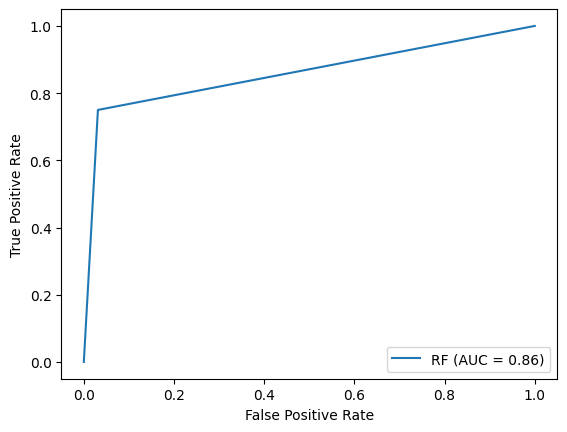

MLP Test Accuracy: 93.0
MLP Test f1_score: 93.0
MLP Test precision_score: 94.0
MLP Test recall_score: 93.0


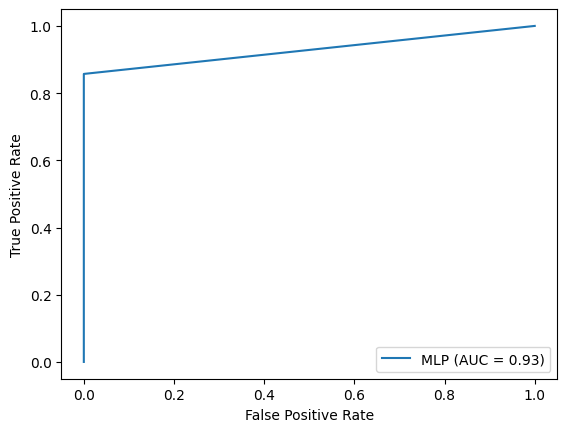

XGB Test Accuracy: 85.0
XGB Test f1_score: 85.0
XGB Test precision_score: 86.0
XGB Test recall_score: 84.0


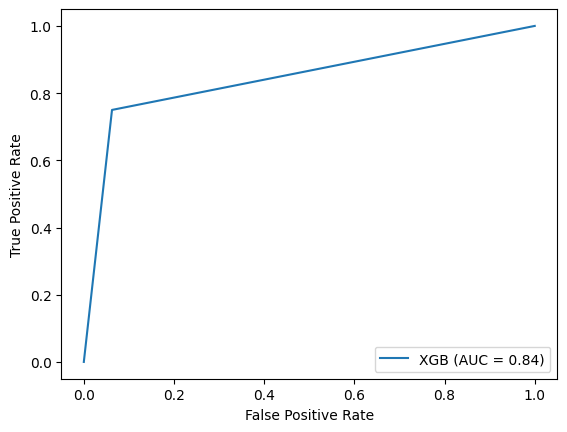

KNN Test Accuracy: 92.0
KNN Test f1_score: 92.0
KNN Test precision_score: 92.0
KNN Test recall_score: 91.0


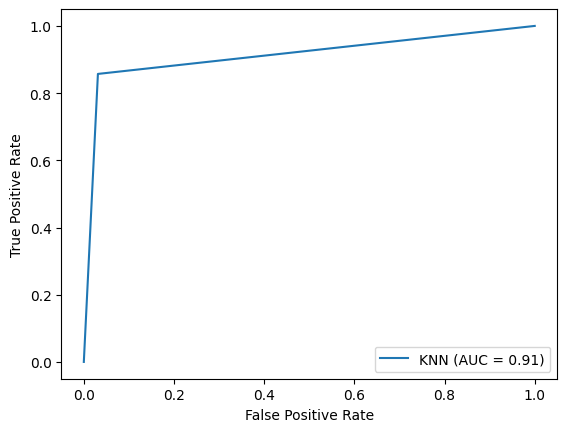

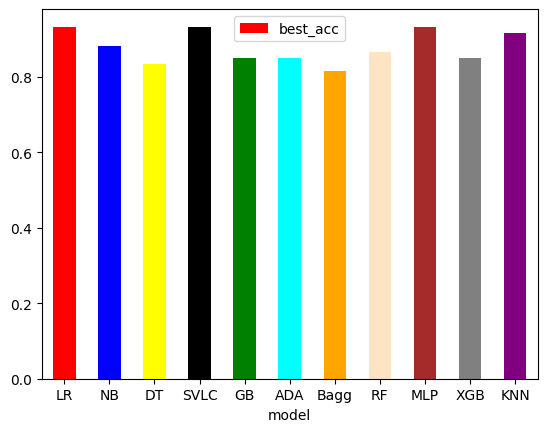

In [ ]:

base_smote_clevland = model_testing(PipelineDict, base_smote_clevland_train, X_test_c, y_test_c)

In [ ]:
base_smote_clevland_cv = cv_evaluation(PipelineDict, all_pipes, X_smo_cleve, y_smo_cleve)

#Clevland + ROS

In [ ]:
base_ros_clevland_train = model_training(all_pipes, X_res_c, y_res_c)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 92.0
LR Test f1_score: 91.0
LR Test precision_score: 93.0
LR Test recall_score: 91.0


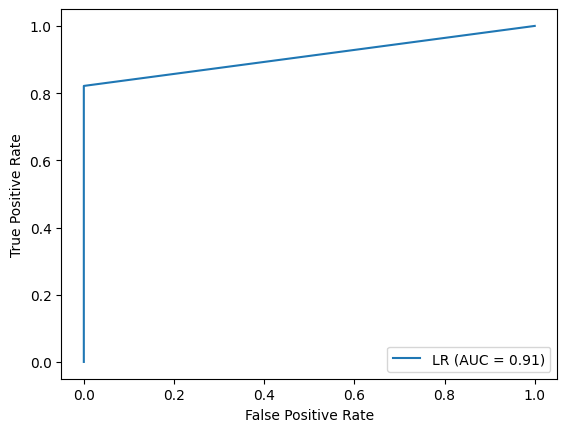

NB Test Accuracy: 87.0
NB Test f1_score: 86.0
NB Test precision_score: 89.0
NB Test recall_score: 86.0


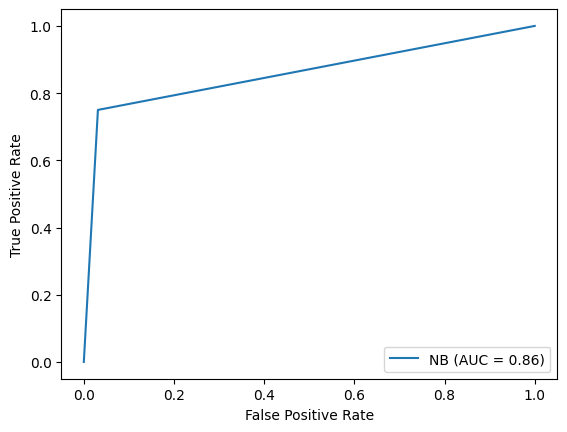

DT Test Accuracy: 82.0
DT Test f1_score: 82.0
DT Test precision_score: 82.0
DT Test recall_score: 81.0


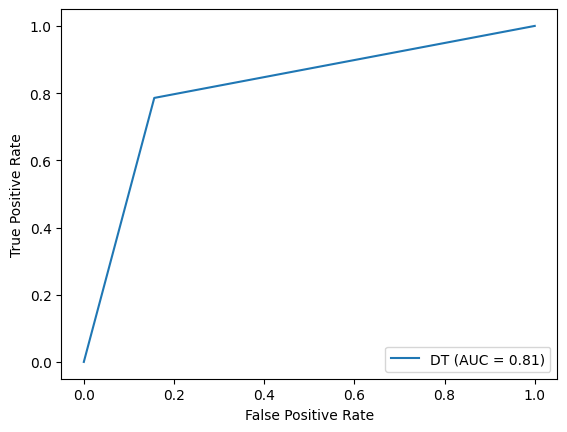

SVLC Test Accuracy: 92.0
SVLC Test f1_score: 91.0
SVLC Test precision_score: 93.0
SVLC Test recall_score: 91.0


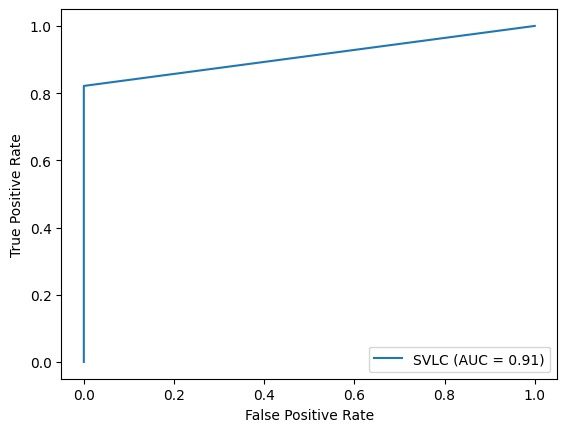

GB Test Accuracy: 85.0
GB Test f1_score: 85.0
GB Test precision_score: 86.0
GB Test recall_score: 84.0


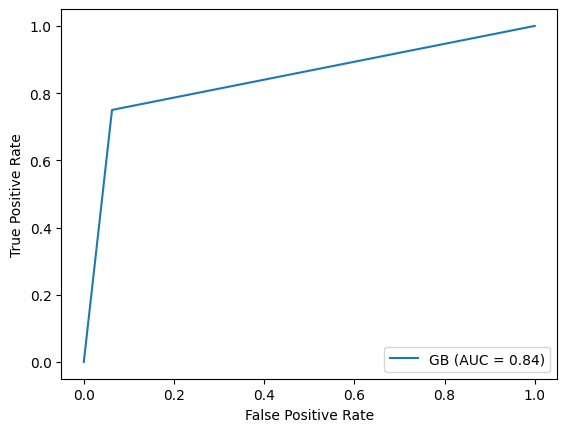

ADA Test Accuracy: 87.0
ADA Test f1_score: 87.0
ADA Test precision_score: 87.0
ADA Test recall_score: 86.0


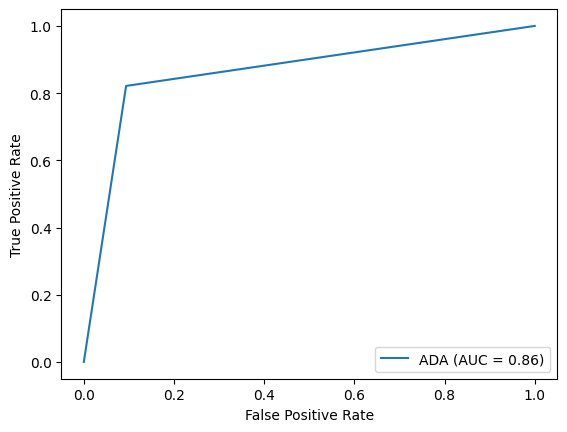

Bagg Test Accuracy: 80.0
Bagg Test f1_score: 80.0
Bagg Test precision_score: 80.0
Bagg Test recall_score: 80.0


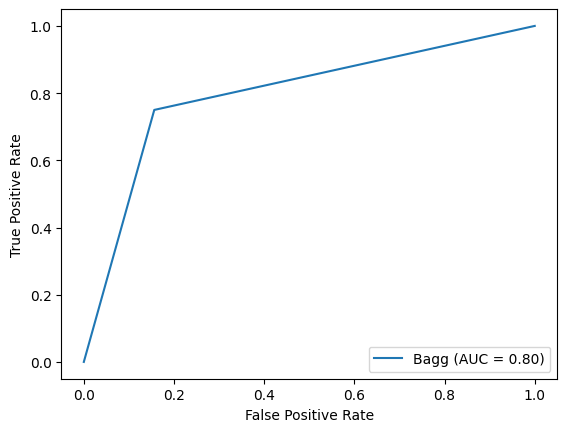

RF Test Accuracy: 87.0
RF Test f1_score: 86.0
RF Test precision_score: 89.0
RF Test recall_score: 86.0


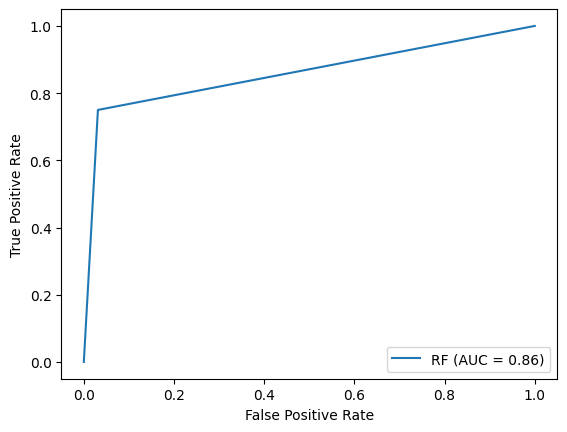

MLP Test Accuracy: 92.0
MLP Test f1_score: 91.0
MLP Test precision_score: 93.0
MLP Test recall_score: 91.0


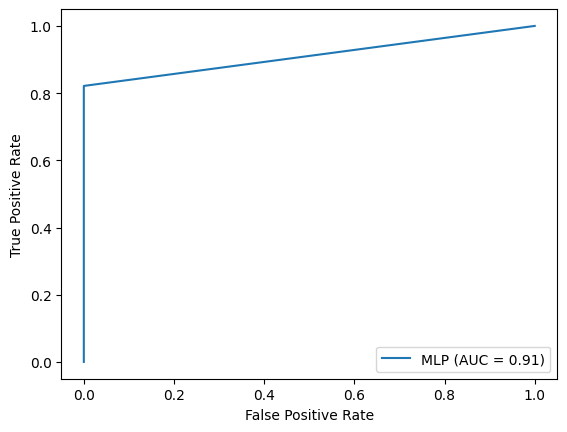

XGB Test Accuracy: 85.0
XGB Test f1_score: 85.0
XGB Test precision_score: 85.0
XGB Test recall_score: 85.0


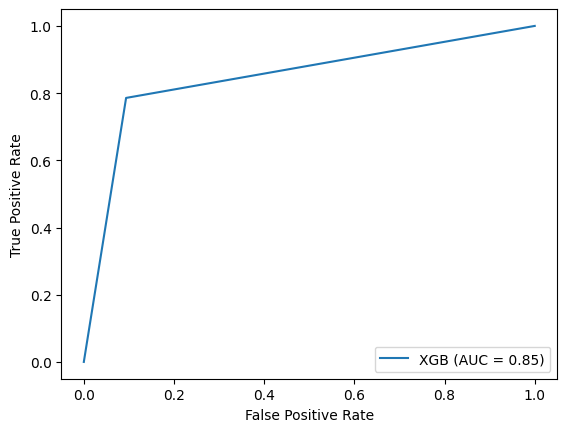

KNN Test Accuracy: 90.0
KNN Test f1_score: 90.0
KNN Test precision_score: 91.0
KNN Test recall_score: 90.0


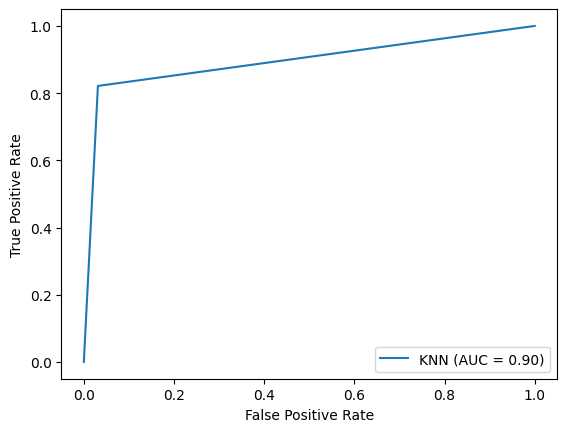

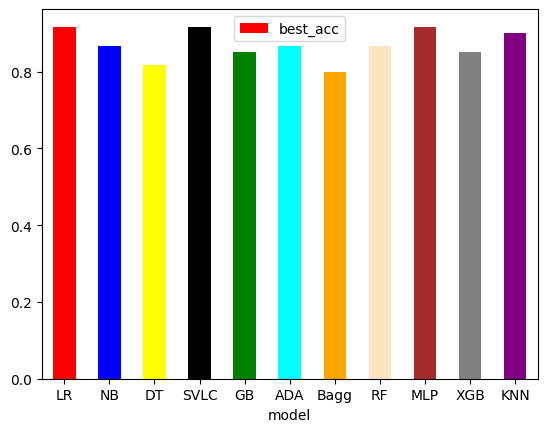

In [ ]:

base_ros_clevland = model_testing(PipelineDict, base_ros_clevland_train, X_test_c, y_test_c)

In [ ]:
base_ros_cleve_cv = cv_evaluation(PipelineDict, all_pipes, X_res_cleve, y_res_cleve)

#Merged train/test

In [ ]:
base_merge_train = model_training(all_pipes,X_train_a, y_train_a)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 85.0
LR Test f1_score: 85.0
LR Test precision_score: 85.0
LR Test recall_score: 85.0


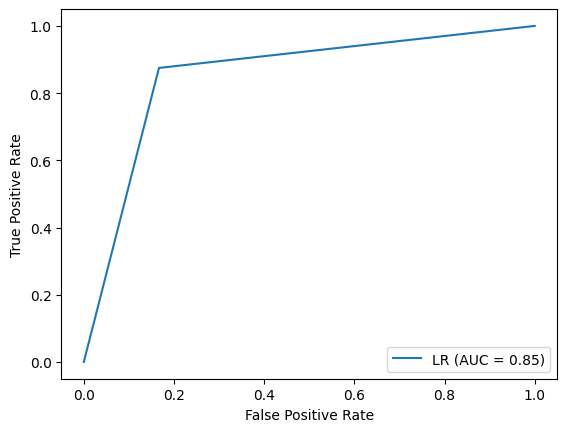

NB Test Accuracy: 86.0
NB Test f1_score: 86.0
NB Test precision_score: 86.0
NB Test recall_score: 86.0


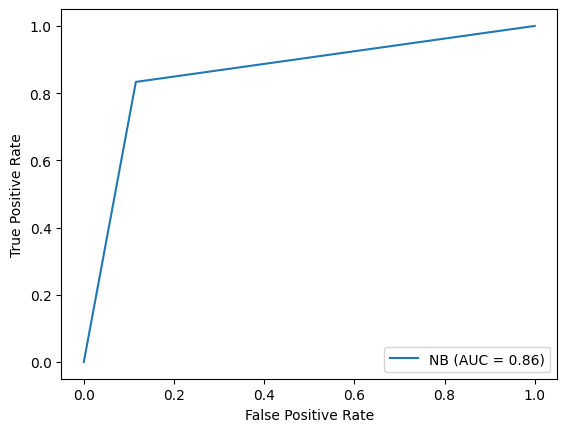

DT Test Accuracy: 83.0
DT Test f1_score: 83.0
DT Test precision_score: 84.0
DT Test recall_score: 83.0


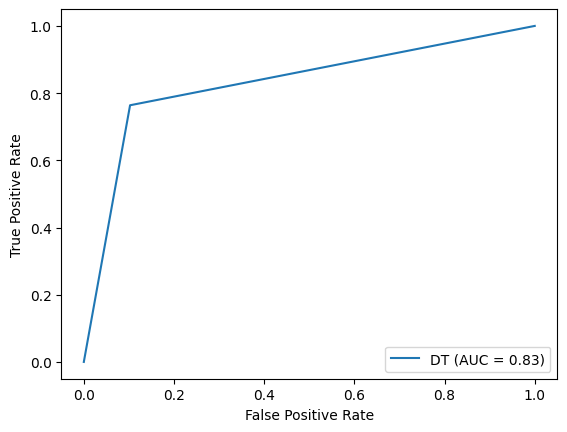

SVLC Test Accuracy: 85.0
SVLC Test f1_score: 85.0
SVLC Test precision_score: 85.0
SVLC Test recall_score: 85.0


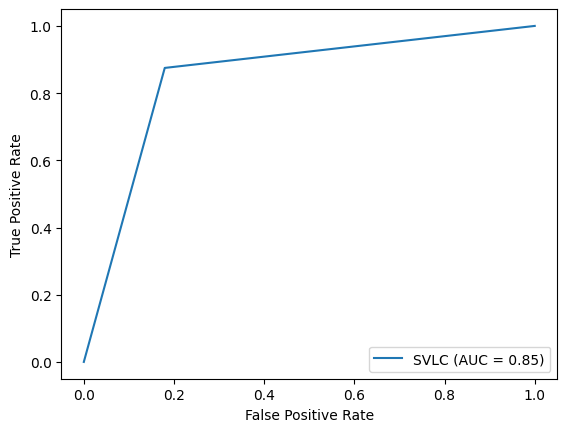

GB Test Accuracy: 85.0
GB Test f1_score: 85.0
GB Test precision_score: 85.0
GB Test recall_score: 85.0


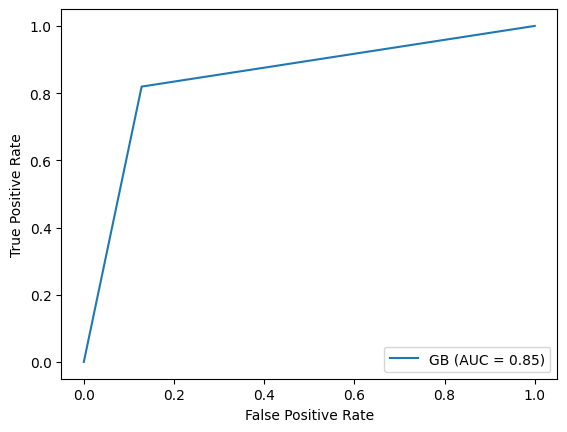

ADA Test Accuracy: 83.0
ADA Test f1_score: 83.0
ADA Test precision_score: 84.0
ADA Test recall_score: 83.0


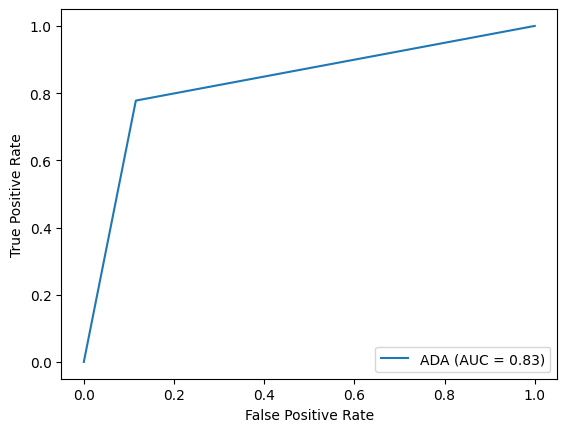

Bagg Test Accuracy: 84.0
Bagg Test f1_score: 84.0
Bagg Test precision_score: 84.0
Bagg Test recall_score: 84.0


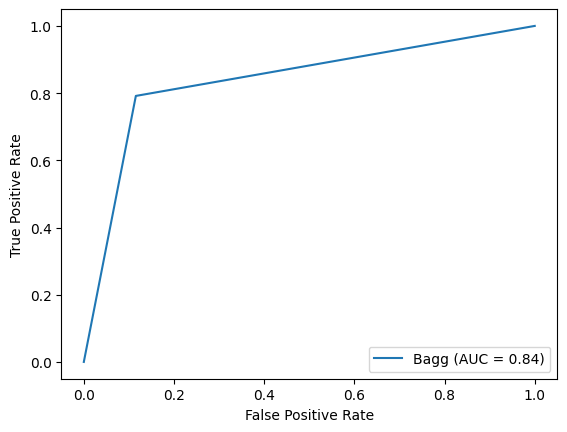

RF Test Accuracy: 86.0
RF Test f1_score: 86.0
RF Test precision_score: 86.0
RF Test recall_score: 86.0


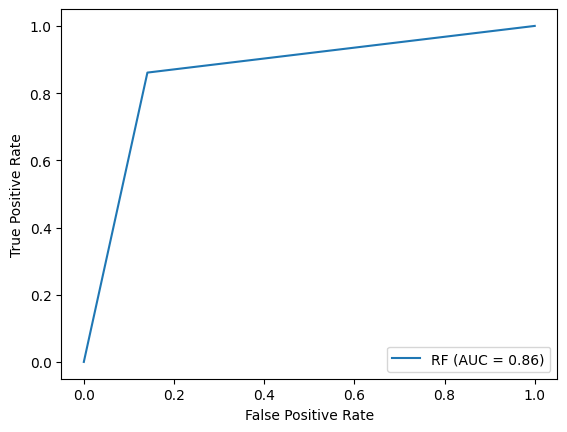

MLP Test Accuracy: 85.0
MLP Test f1_score: 85.0
MLP Test precision_score: 86.0
MLP Test recall_score: 86.0


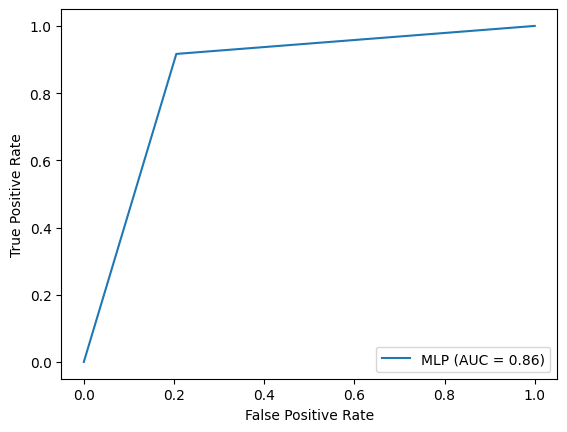

XGB Test Accuracy: 83.0
XGB Test f1_score: 83.0
XGB Test precision_score: 83.0
XGB Test recall_score: 83.0


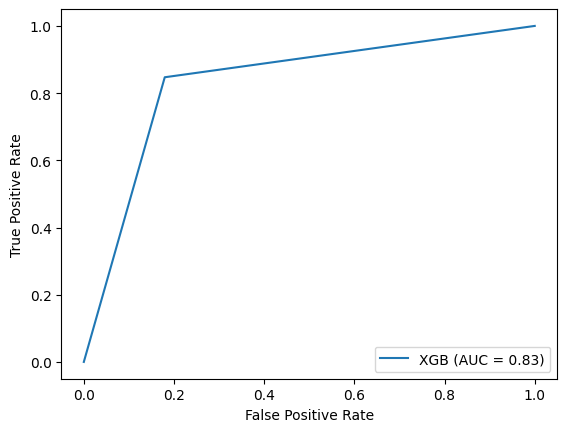

KNN Test Accuracy: 84.0
KNN Test f1_score: 84.0
KNN Test precision_score: 84.0
KNN Test recall_score: 84.0


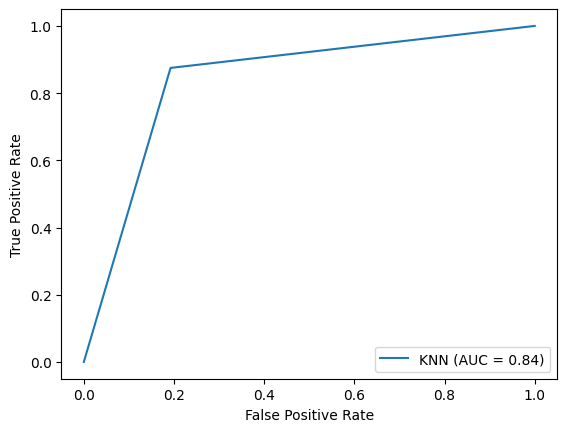

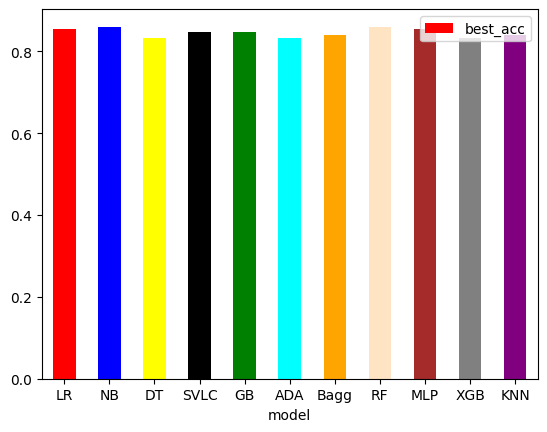

In [ ]:
base_merge = model_testing(PipelineDict, base_merge_train, X_test_a, y_test_a)

In [ ]:
base_merge_cv = cv_evaluation(PipelineDict, all_pipes, X_a, y_a)

#Merged + SMOTE

In [ ]:
base_smote_merge_train = model_training(all_pipes, X_smo_a, y_smo_a)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 86.0
LR Test f1_score: 86.0
LR Test precision_score: 86.0
LR Test recall_score: 86.0


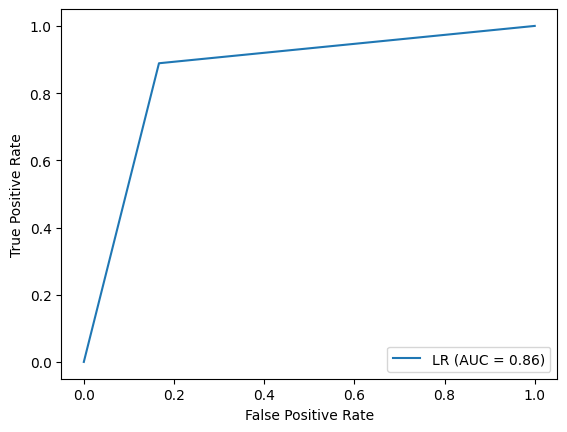

NB Test Accuracy: 87.0
NB Test f1_score: 87.0
NB Test precision_score: 87.0
NB Test recall_score: 87.0


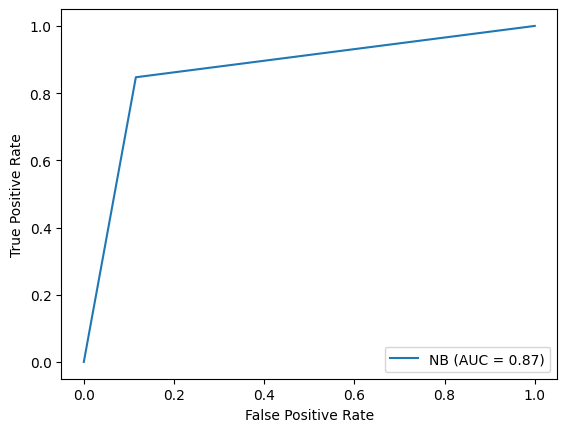

DT Test Accuracy: 83.0
DT Test f1_score: 83.0
DT Test precision_score: 84.0
DT Test recall_score: 83.0


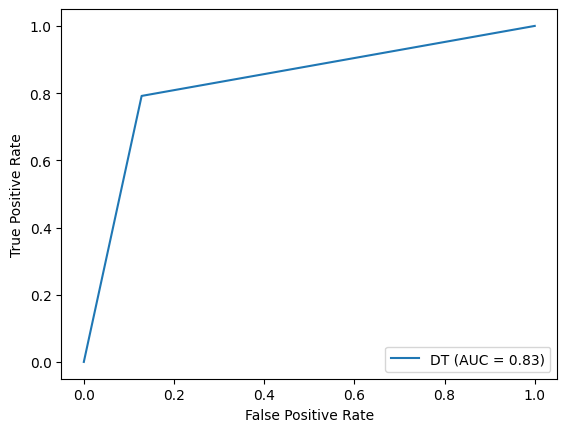

SVLC Test Accuracy: 85.0
SVLC Test f1_score: 85.0
SVLC Test precision_score: 85.0
SVLC Test recall_score: 85.0


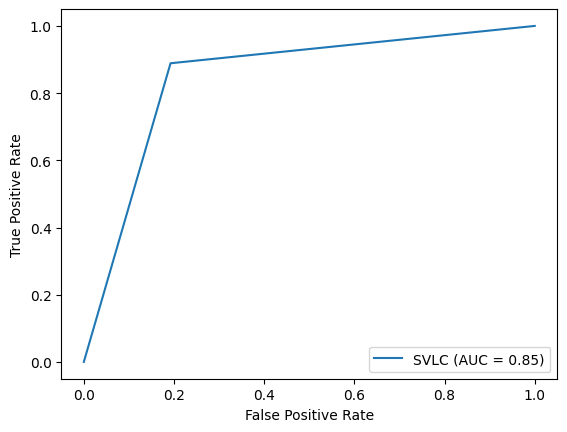

GB Test Accuracy: 85.0
GB Test f1_score: 85.0
GB Test precision_score: 85.0
GB Test recall_score: 85.0


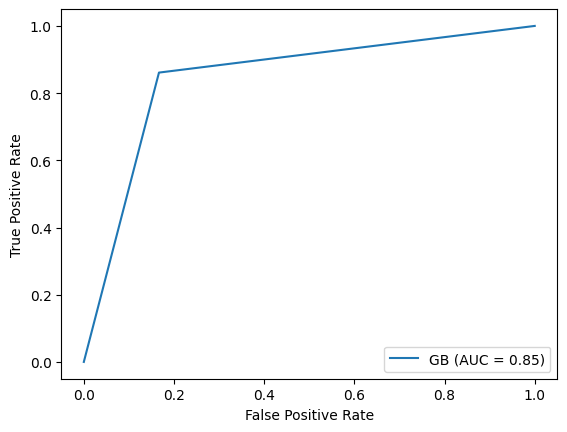

ADA Test Accuracy: 84.0
ADA Test f1_score: 84.0
ADA Test precision_score: 84.0
ADA Test recall_score: 84.0


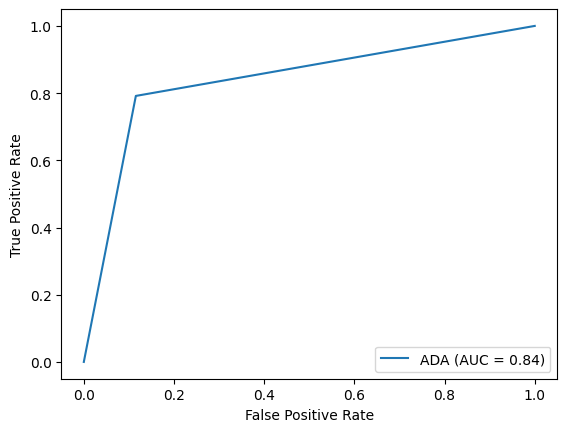

Bagg Test Accuracy: 86.0
Bagg Test f1_score: 86.0
Bagg Test precision_score: 86.0
Bagg Test recall_score: 86.0


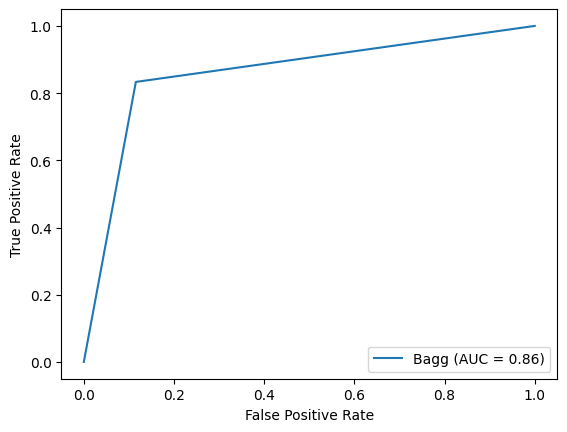

RF Test Accuracy: 87.0
RF Test f1_score: 87.0
RF Test precision_score: 87.0
RF Test recall_score: 87.0


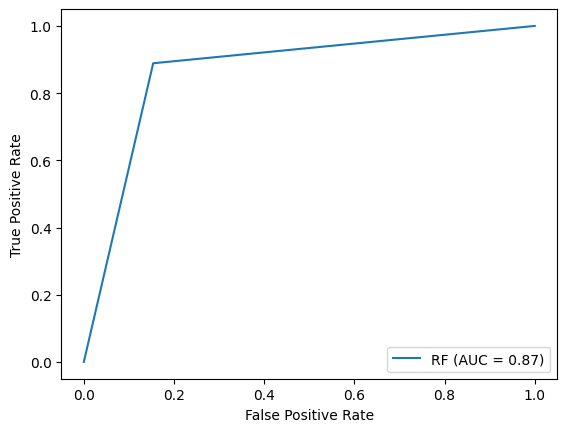

MLP Test Accuracy: 85.0
MLP Test f1_score: 85.0
MLP Test precision_score: 85.0
MLP Test recall_score: 85.0


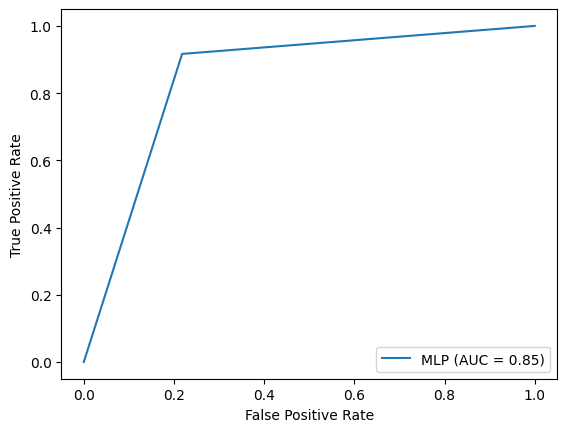

XGB Test Accuracy: 79.0
XGB Test f1_score: 79.0
XGB Test precision_score: 79.0
XGB Test recall_score: 79.0


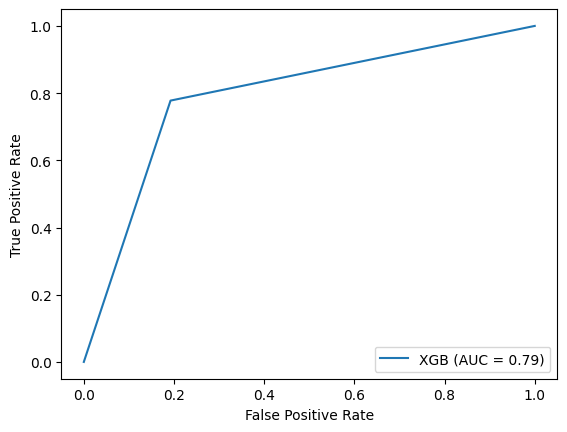

KNN Test Accuracy: 83.0
KNN Test f1_score: 83.0
KNN Test precision_score: 84.0
KNN Test recall_score: 83.0


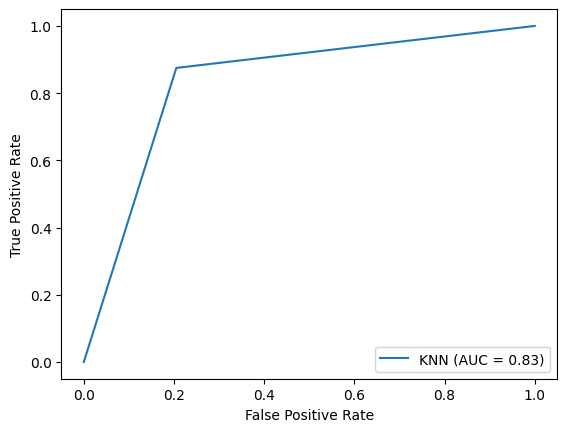

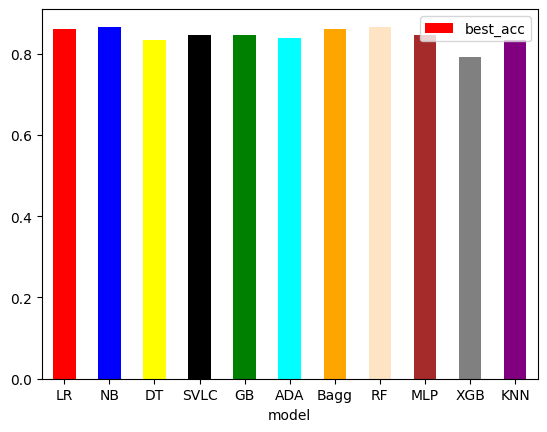

In [ ]:

base_smote_merge = model_testing(PipelineDict, base_smote_merge_train, X_test_a, y_test_a)

In [ ]:
base_smote_merge_cv = cv_evaluation(PipelineDict, all_pipes, X_smo_all, y_smo_all)

#Merged + ROS

In [ ]:
base_ros_merge_train = model_training(all_pipes, X_res_a, y_res_a)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


LR Test Accuracy: 86.0
LR Test f1_score: 86.0
LR Test precision_score: 86.0
LR Test recall_score: 86.0


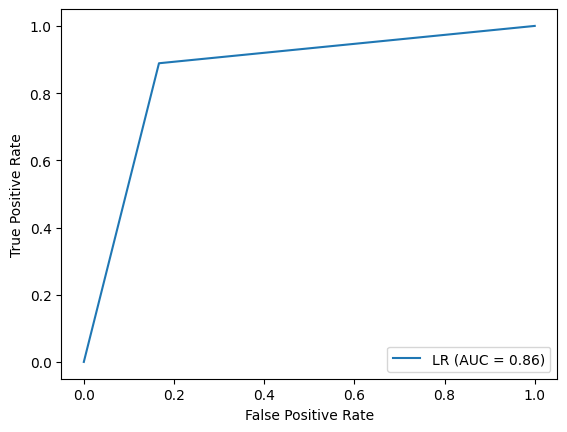

NB Test Accuracy: 87.0
NB Test f1_score: 87.0
NB Test precision_score: 87.0
NB Test recall_score: 87.0


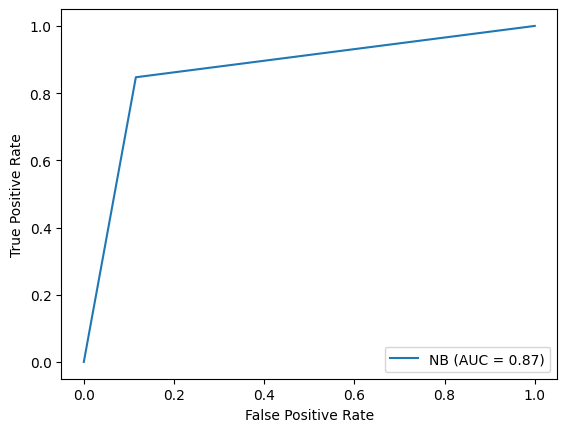

DT Test Accuracy: 82.0
DT Test f1_score: 82.0
DT Test precision_score: 83.0
DT Test recall_score: 82.0


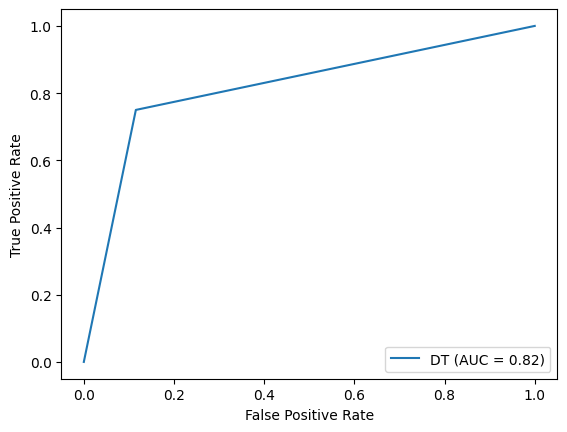

SVLC Test Accuracy: 85.0
SVLC Test f1_score: 85.0
SVLC Test precision_score: 85.0
SVLC Test recall_score: 85.0


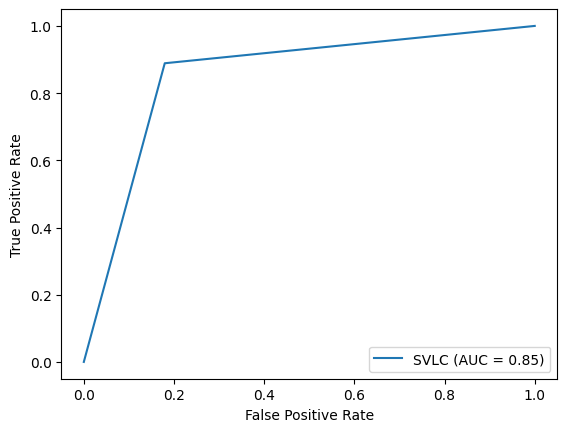

GB Test Accuracy: 83.0
GB Test f1_score: 83.0
GB Test precision_score: 83.0
GB Test recall_score: 83.0


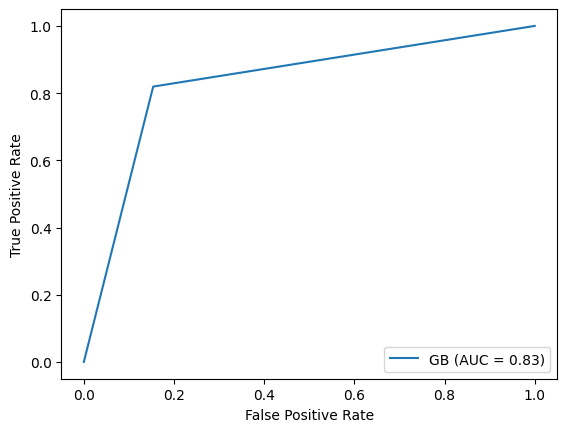

ADA Test Accuracy: 84.0
ADA Test f1_score: 84.0
ADA Test precision_score: 84.0
ADA Test recall_score: 84.0


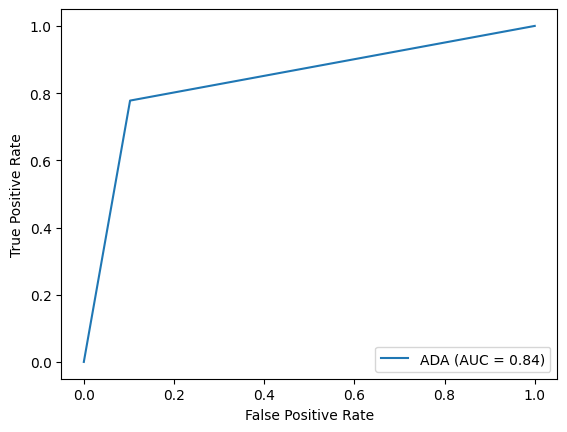

Bagg Test Accuracy: 87.0
Bagg Test f1_score: 87.0
Bagg Test precision_score: 88.0
Bagg Test recall_score: 87.0


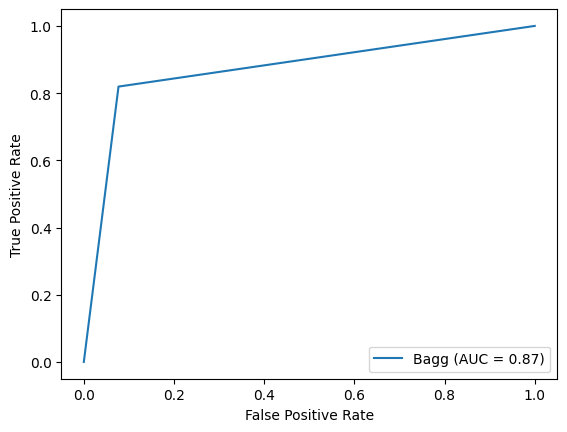

RF Test Accuracy: 85.0
RF Test f1_score: 85.0
RF Test precision_score: 85.0
RF Test recall_score: 85.0


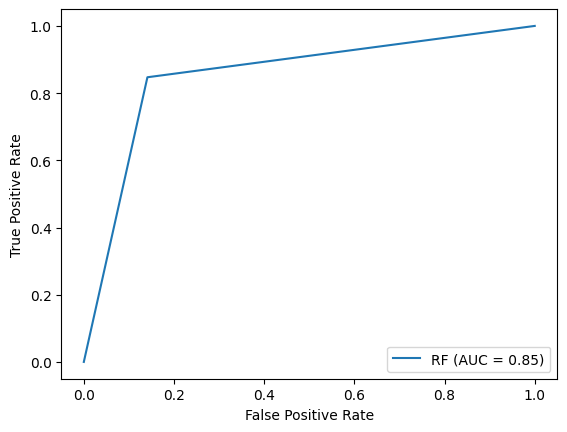

MLP Test Accuracy: 85.0
MLP Test f1_score: 85.0
MLP Test precision_score: 85.0
MLP Test recall_score: 85.0


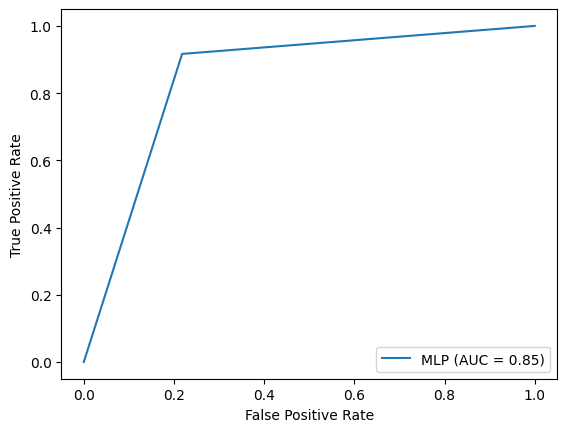

XGB Test Accuracy: 83.0
XGB Test f1_score: 83.0
XGB Test precision_score: 83.0
XGB Test recall_score: 83.0


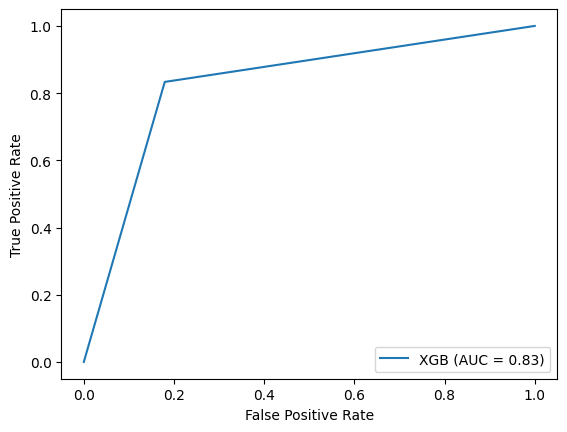

KNN Test Accuracy: 85.0
KNN Test f1_score: 85.0
KNN Test precision_score: 85.0
KNN Test recall_score: 85.0


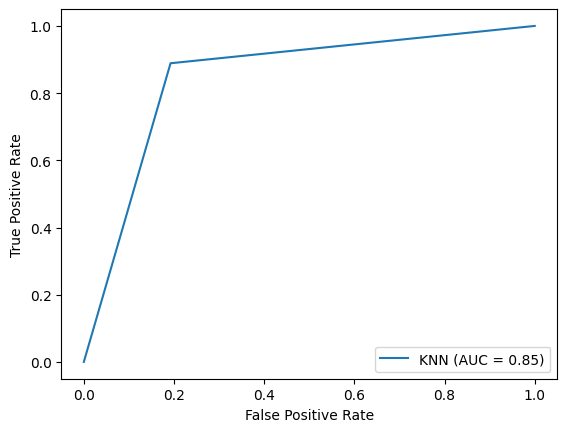

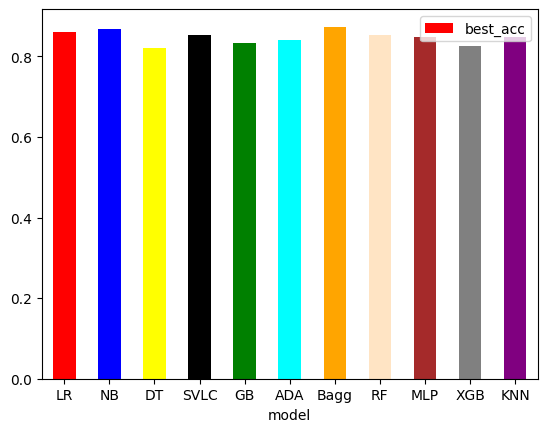

In [ ]:

base_ros_merge = model_testing(PipelineDict, base_ros_merge_train, X_test_a,y_test_a)

In [ ]:
base_ros_merge_cv = cv_evaluation(PipelineDict, all_pipes, X_res_all, y_res_all)

#Hyperparameter functions





In [ ]:
# from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import MaxNLocator
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

from sklearn.model_selection import GridSearchCV



def evaluate_model(cv, X, y, model):
  scores_mse = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
  # return scores
  return mean(scores_mse), scores_mse.min(), scores_mse.max()


def find_fold(X,y,model):
  # calculate the ideal test condition
  ideal, _, _ = evaluate_model(LeaveOneOut(),X,y,model)
  print('Ideal: %.3f' % ideal)
  # define folds to test
  folds = range(2,31)
  # record mean and min/max of each set of results
  means, mins, maxs = list(),list(),list()
  # evaluate each k value
  for k in folds:
    # define the test condition
    cv = KFold(n_splits=k, shuffle=True, random_state=1)
    # evaluate k value
    k_mean, k_min, k_max = evaluate_model(cv,X,y,model)
    # report performance
    print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
    # store mean accuracy
    means.append(k_mean)
    # store min and max relative to the mean
    mins.append(k_mean - k_min)
    maxs.append(k_max - k_mean)



  # line plot of k mean values with min/max error bars
  plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
  # plot the ideal case in a separate color
  plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
  # show the plot
  plt.show()



def grid_searchCV(model_params, X_train, y_train, k):
  scores = []
  cv = KFold(n_splits=k, shuffle=True, random_state=1)

  for model_name, mp in model_params.items():
      clf =  GridSearchCV(mp['model'], mp['params'], cv=cv, return_train_score=False)
      clf.fit(X_train,y_train)
      scores.append({
          'model': model_name,
          'best_score': clf.best_score_,
          'best_params': clf.best_params_
      })

  df_GS = pd.DataFrame(scores,columns=['model','best_score','best_params'])
  return df_GS


def model_testingGS(PipelineDict, all_pipes, X_test, y_test):
  scoresGS = []
  for i,model in enumerate(all_pipes):
    pred = model.predict(X_test)
    precision, recall, fscore, _ = precision_recall_fscore_support(y_test, pred)
    acc = model.score(X_test,y_test)
    print("{} Test Accuracy: {}".format(PipelineDict[i], round(acc,2) * 100 ))
    print("{} Test f1_score: {}".format(PipelineDict[i], round(mean(fscore),2) * 100))
    print("{} Test precision_score: {}".format(PipelineDict[i], round(mean(precision),2) * 100))
    print("{} Test recall_score: {}".format(PipelineDict[i], round(mean(recall),2) *100))
    fpr, tpr, thresholds = metrics.roc_curve(y_test, pred)
    roc_auc = metrics.auc(fpr, tpr)
    display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,
                                   estimator_name=PipelineDict[i])
    display.plot()
    plt.show()# evaluate model
    scoresGS.append({
          'model': PipelineDict[i],
          'best_acc': acc,

      })

  model_col = ['red','blue', 'yellow', 'black', 'green',  'cyan', 'orange', 'bisque', 'brown','grey', 'purple']
  model_lst = ['LR' , 'NB', 'DT' , 'SVLC' , 'GB' , 'ADA' , 'Bagg' , 'RF', 'MLP','XGB', 'KNN']
  dfGS = pd.DataFrame(scoresGS,columns=['model','best_acc'])
  dfGS.plot.bar(x='model', y='best_acc', color=model_col, rot=0)
  return dfGS

def horizontal_plot(dataFrame, x, y, title):
  dataFrame.plot.barh(x=x, y=y, title=title)

def bar_plot_update(df, c1, c2, dataset_label):
  fig, ax = plt.subplots(figsize=(13.33,7.5), dpi = 96)
  bar1 = ax.bar(df[c1], df[c2], width=0.6)
  # Create the grid
  ax.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
  ax.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

  # Reformat x-axis label and tick labels
  ax.set_xlabel('', fontsize=12, labelpad=10) # No need for an axis label
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.xaxis.set_major_locator(MaxNLocator(integer=True))
  ax.xaxis.set_tick_params(pad=2, labelbottom=True, bottom=True, labelsize=12, labelrotation=0)
  labels = ['LR' , 'NB', 'DT' , 'SVLC' , 'GB' , 'ADA' , 'Bagg' , 'RF', 'MLP','XGB', 'KNN']

  ax.set_xticks(df[c1], labels) # Map integers numbers from the series to labels list

  # Reformat y-axis
  ax.set_ylabel('Accuracy %', fontsize=12, labelpad=10)
  ax.yaxis.set_label_position("left")
  ax.yaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.yaxis.set_major_locator(MaxNLocator(integer=True))
  ax.yaxis.set_tick_params(pad=2, labeltop=False, labelbottom=True, bottom=False, labelsize=12)

  # Add label on top of each bar
  ax.bar_label(bar1, labels=[f'{e:,.1f}' for e in df[c2]], padding=3, color='black', fontsize=8)

    # Remove the spines
  ax.spines[['top','left','bottom']].set_visible(False)

  # Make the left spine thicker
  ax.spines['right'].set_linewidth(1.1)

  # Add in red line and rectangle on top
  ax.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color='#E3120B', linewidth=.6)
  ax.add_patch(plt.Rectangle((0.12,.98), 0.04, -0.02, facecolor='#E3120B', transform=fig.transFigure, clip_on=False, linewidth = 0))

  # Add in title and subtitle
  ax.text(x=0.12, y=.93, s="LOOCV accuracy % evaluation for tuned models", transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
  ax.text(x=0.12, y=.90, s= "%s dataset" %(dataset_label), transform=fig.transFigure, ha='left', fontsize=12, alpha=.8)



  # Adjust the margins around the plot area
  plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.85, wspace=None, hspace=None)

  # Set a white background
  fig.patch.set_facecolor('white')

    # Colours - Choose the extreme colours of the colour map
  colours = ["#2196f3", "#bbdefb"]

  # Colormap - Build the colour maps
  cmap = mpl.colors.LinearSegmentedColormap.from_list("colour_map", colours, N=256)
  norm = mpl.colors.Normalize(df[c2].min(), df[c2].max()) # linearly normalizes data into the [0.0, 1.0] interval

  # Plot bars
  bar1 = ax.bar(df[c1], df[c2], color=cmap(norm(df[c2])), width=0.6, zorder=2)

  # Find the average data point and split the series in 2
  average = df[c2].mean()
  below_average = df[df[c2]<average]
  above_average = df[df[c2]>=average]
  # Colours - Choose the extreme colours of the colour map
  colors_high = ["#ff5a5f", "#c81d25"] # Extreme colours of the high scale
  colors_low = ["#2196f3","#bbdefb"] # Extreme colours of the low scale

  # Colormap - Build the colour maps
  cmap_low = mpl.colors.LinearSegmentedColormap.from_list("low_map", colors_low, N=256)
  cmap_high = mpl.colors.LinearSegmentedColormap.from_list("high_map", colors_high, N=256)
  norm_low = mpl.colors.Normalize(below_average[c2].min(), average) # linearly normalizes data into the [0.0, 1.0] interval
  norm_high = mpl.colors.Normalize(average, above_average[c2].max())

  # Plot bars and average (horizontal) line
  bar1 = ax.bar(below_average[c1], below_average[c2], color=cmap_low(norm_low(below_average[c2])), width=0.6, label='Below Average', zorder=2)
  bar2 = ax.bar(above_average[c1], above_average[c2], color=cmap_high(norm_high(above_average[c2])), width=0.6, label='Above Average', zorder=2)
  plt.axhline(y=average, color = 'grey', linewidth=1)

  # Determine the y-limits of the plot
  ymin, ymax = ax.get_ylim()
  # Calculate a suitable y position for the text label
  y_pos = average/ymax + 0.03
  # Annotate the average line
  # ax.text(0.88, y_pos, f'Average = {average:.1f}', ha='center', va='center', transform=ax.transAxes, size=8, zorder=3)

  # Add legend
  ax.legend(loc="best", ncol=2, bbox_to_anchor=[1, 1.07], borderaxespad=0, frameon=False, fontsize=8)

In [ ]:

def bar_plot_cv(df,df2, palette):
  concat_df = pd.concat([df, df2],axis=0, ignore_index=False)
  concat_df['col'] = (len(df)*('base_model',) + len(df2)*('tuned',))
  concat_df.reset_index(inplace=True)
  sns.catplot(x='model', y='best_acc', hue='col', kind='bar', data=concat_df, palette=palette)


  # concat_df = concat_df.drop(concat_df.index[0])
  # concat_df.plot.bar(x='model', stacked=False, color=model_col, rot=0)

  return concat_df

#GridSearchCV Statlog

LR

Ideal: 0.850
> folds=2, accuracy=0.808 (0.808,0.808)
> folds=3, accuracy=0.821 (0.800,0.838)
> folds=4, accuracy=0.829 (0.800,0.850)
> folds=5, accuracy=0.846 (0.750,0.896)
> folds=6, accuracy=0.804 (0.750,0.875)
> folds=7, accuracy=0.821 (0.706,0.882)
> folds=8, accuracy=0.846 (0.700,0.933)
> folds=9, accuracy=0.842 (0.667,0.963)
> folds=10, accuracy=0.846 (0.667,1.000)
> folds=11, accuracy=0.859 (0.727,0.955)
> folds=12, accuracy=0.837 (0.700,0.950)
> folds=13, accuracy=0.847 (0.684,0.944)
> folds=14, accuracy=0.850 (0.647,1.000)
> folds=15, accuracy=0.854 (0.750,1.000)
> folds=16, accuracy=0.854 (0.733,1.000)
> folds=17, accuracy=0.859 (0.643,1.000)
> folds=18, accuracy=0.856 (0.643,1.000)
> folds=19, accuracy=0.860 (0.615,1.000)
> folds=20, accuracy=0.863 (0.583,1.000)
> folds=21, accuracy=0.865 (0.583,1.000)
> folds=22, accuracy=0.860 (0.545,1.000)
> folds=23, accuracy=0.861 (0.545,1.000)
> folds=24, accuracy=0.858 (0.600,1.000)
> folds=25, accuracy=0.856 (0.600,1.000)
> folds=26,

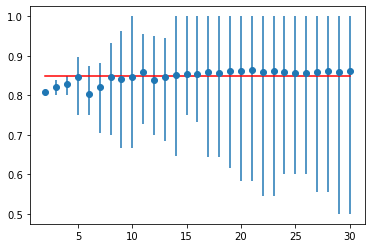

In [ ]:
find_fold(X_res_s,y_res_s,LogisticRegression(random_state=rs))

In [ ]:
LR_params = {
    'Logistic_regression' : {
        'model': LogisticRegression(random_state=rs),
        'params': {
            'max_iter' : [5, 10, 15, 20, 30, 40, 50, 1000],
            'penalty' : ['l1', 'l2'],
            'C': [0.01,.09, 1, 1.1, 1.2, 1.5, 1.8, 2],
            'solver' : ['liblinear', 'saga']

        }
    }}

LR_params = {
    'Logistic_regression' : {
        'model': LogisticRegression(random_state=rs),
        'params': {
            'max_iter' : [7,8, 9, 10, 20, 50, 100, 500],
            'penalty' : ['l2'],
            'C': [0.1,.2, .3, .4, .5, .6, .7, .8, .9, 1, 1.1, 1.2, 1.5, 1.8, 2],
            'solver' : ['liblinear']

        }
    }}



In [ ]:
grid_searchCV(LR_params, X_res_s, y_res_s, 14)

,model,best_score,best_params
0,Logistic_regression,0.850373,"{'C': 1.1, 'max_iter': 7, 'penalty': 'l2', 'so..."


NB

In [ ]:
nb_params = {'Naive_bayes_gaussian': {
        'model': GaussianNB(),
        'params': {
            'var_smoothing': np.logspace(0,-9, num=100)
        }
    }}

nb_label = {1: 'NB'}

Ideal: 0.771
> folds=2, accuracy=0.750 (0.717,0.783)
> folds=3, accuracy=0.775 (0.738,0.812)
> folds=4, accuracy=0.758 (0.600,0.850)
> folds=5, accuracy=0.779 (0.729,0.854)
> folds=6, accuracy=0.779 (0.750,0.850)
> folds=7, accuracy=0.763 (0.559,0.912)
> folds=8, accuracy=0.758 (0.633,0.867)
> folds=9, accuracy=0.771 (0.667,0.889)
> folds=10, accuracy=0.775 (0.708,0.875)
> folds=11, accuracy=0.775 (0.682,0.909)
> folds=12, accuracy=0.779 (0.650,0.900)
> folds=13, accuracy=0.780 (0.667,0.944)
> folds=14, accuracy=0.780 (0.706,0.941)
> folds=15, accuracy=0.771 (0.562,0.938)
> folds=16, accuracy=0.767 (0.600,0.933)
> folds=17, accuracy=0.768 (0.571,0.929)
> folds=18, accuracy=0.768 (0.571,1.000)
> folds=19, accuracy=0.768 (0.538,1.000)
> folds=20, accuracy=0.775 (0.500,1.000)
> folds=21, accuracy=0.777 (0.500,1.000)
> folds=22, accuracy=0.767 (0.455,1.000)
> folds=23, accuracy=0.765 (0.455,1.000)
> folds=24, accuracy=0.771 (0.500,1.000)
> folds=25, accuracy=0.773 (0.500,1.000)
> folds=26,

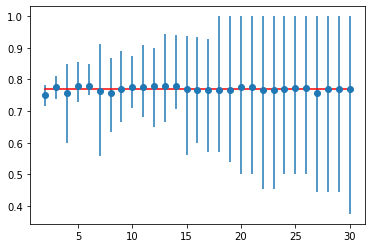

In [ ]:
find_fold(X_res_s,y_res_s,GaussianNB())

In [ ]:
grid_searchCV(nb_params, X_res_s, y_res_s, 9)

,model,best_score,best_params
0,Naive_bayes_gaussian,0.855017,{'var_smoothing': 3.511191734215127e-05}


DT

In [ ]:
dt_params = {'Decision_tree': {
        'model': DecisionTreeClassifier(random_state=rs),
        'params': {
            'criterion': ['gini','entropy'],
            'max_depth' : [2,4,6,8,10,12, 15, 20],
            'ccp_alpha': [0.1, .01, .001, .0001],
            'max_features': ['auto', 'sqrt', 'log2']



        }
    }}

dt_params1 = {'Decision_tree': {
        'model': DecisionTreeClassifier(random_state=rs),
        'params': {
            'criterion': ['gini','entropy'],
            'max_depth' : [2,4,6,8,10,12, 15, 20, 30, 40 ,50],
            'ccp_alpha': [0.1, .01, .001, .0001],
            'max_features': ['auto', 'sqrt']



        }
    }}

Ideal: 0.833
> folds=2, accuracy=0.767 (0.750,0.783)
> folds=3, accuracy=0.762 (0.750,0.775)
> folds=4, accuracy=0.775 (0.700,0.867)
> folds=5, accuracy=0.767 (0.688,0.812)
> folds=6, accuracy=0.758 (0.650,0.875)
> folds=7, accuracy=0.776 (0.686,0.912)
> folds=8, accuracy=0.754 (0.633,0.900)
> folds=9, accuracy=0.800 (0.667,0.963)
> folds=10, accuracy=0.788 (0.708,0.917)
> folds=11, accuracy=0.805 (0.682,0.955)
> folds=12, accuracy=0.800 (0.650,1.000)
> folds=13, accuracy=0.784 (0.611,0.947)
> folds=14, accuracy=0.767 (0.529,1.000)
> folds=15, accuracy=0.767 (0.688,0.938)
> folds=16, accuracy=0.808 (0.600,1.000)
> folds=17, accuracy=0.813 (0.600,1.000)
> folds=18, accuracy=0.793 (0.643,1.000)
> folds=19, accuracy=0.795 (0.538,1.000)
> folds=20, accuracy=0.800 (0.500,1.000)
> folds=21, accuracy=0.787 (0.500,1.000)
> folds=22, accuracy=0.816 (0.545,1.000)
> folds=23, accuracy=0.804 (0.545,1.000)
> folds=24, accuracy=0.787 (0.600,1.000)
> folds=25, accuracy=0.800 (0.600,1.000)
> folds=26,

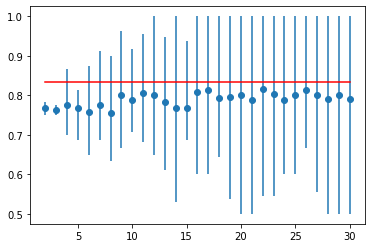

In [ ]:
find_fold(X_res_s,y_res_s,DecisionTreeClassifier(random_state=rs))

In [ ]:
grid_searchCV(dt_params, X_res_s, y_res_s, 17)

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9

,model,best_score,best_params
0,Decision_tree,0.82605,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_..."


SVLC

In [ ]:
svc_params = {'SVC': {
        'model': SVC(random_state=rs),
        'params' : {
                'C': [0.001,0.01,0.1,0.8,0.9,1,1.1,1.2,1.3,1.4],
                'kernel':['linear', 'rbf' ,'poly'],
                'gamma' :[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,1.1,1.2,1.3,1.4]

        }
    }}

Ideal: 0.854
> folds=2, accuracy=0.812 (0.800,0.825)
> folds=3, accuracy=0.825 (0.812,0.838)
> folds=4, accuracy=0.842 (0.783,0.867)
> folds=5, accuracy=0.833 (0.708,0.875)
> folds=6, accuracy=0.833 (0.725,0.875)
> folds=7, accuracy=0.829 (0.686,0.941)
> folds=8, accuracy=0.825 (0.700,0.900)
> folds=9, accuracy=0.838 (0.667,0.926)
> folds=10, accuracy=0.842 (0.708,0.958)
> folds=11, accuracy=0.842 (0.727,0.952)
> folds=12, accuracy=0.846 (0.750,0.950)
> folds=13, accuracy=0.851 (0.737,0.944)
> folds=14, accuracy=0.838 (0.706,1.000)
> folds=15, accuracy=0.850 (0.750,1.000)
> folds=16, accuracy=0.850 (0.733,1.000)
> folds=17, accuracy=0.864 (0.714,1.000)
> folds=18, accuracy=0.847 (0.692,1.000)
> folds=19, accuracy=0.859 (0.667,1.000)
> folds=20, accuracy=0.854 (0.667,1.000)
> folds=21, accuracy=0.847 (0.636,1.000)
> folds=22, accuracy=0.843 (0.636,1.000)
> folds=23, accuracy=0.852 (0.636,1.000)
> folds=24, accuracy=0.858 (0.700,1.000)
> folds=25, accuracy=0.855 (0.667,1.000)
> folds=26,

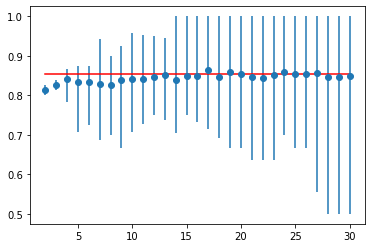

In [ ]:
find_fold(X_res_s,y_res_s,SVC(random_state=rs))

In [ ]:
grid_searchCV(svc_params, X_res_s, y_res_s, 13)

,model,best_score,best_params
0,SVC,0.870895,"{'C': 0.8, 'gamma': 0.7, 'kernel': 'rbf'}"


GB

In [ ]:
gb_params = {'GB': {
        'model': GradientBoostingClassifier(random_state=rs),
        'params': {
            "n_estimators":[100,110,125,150,175,200, 210, 220, 230, 250],
            "max_depth":[1,3,5,7,9, 10, 15, 20],
            "learning_rate":[0.1,0.5,0.8,1,1.2,1.5,1.7,2]
        }
    }}

Ideal: 0.838
> folds=2, accuracy=0.808 (0.775,0.842)
> folds=3, accuracy=0.800 (0.787,0.812)
> folds=4, accuracy=0.838 (0.750,0.867)
> folds=5, accuracy=0.850 (0.729,0.917)
> folds=6, accuracy=0.812 (0.725,0.900)
> folds=7, accuracy=0.830 (0.714,0.941)
> folds=8, accuracy=0.858 (0.800,0.933)
> folds=9, accuracy=0.842 (0.731,0.963)
> folds=10, accuracy=0.846 (0.750,0.958)
> folds=11, accuracy=0.859 (0.773,0.955)
> folds=12, accuracy=0.846 (0.750,0.950)
> folds=13, accuracy=0.841 (0.684,0.947)
> folds=14, accuracy=0.859 (0.706,1.000)
> folds=15, accuracy=0.821 (0.625,1.000)
> folds=16, accuracy=0.829 (0.667,1.000)
> folds=17, accuracy=0.855 (0.714,1.000)
> folds=18, accuracy=0.829 (0.615,1.000)
> folds=19, accuracy=0.862 (0.667,1.000)
> folds=20, accuracy=0.858 (0.583,1.000)
> folds=21, accuracy=0.846 (0.583,1.000)
> folds=22, accuracy=0.851 (0.636,1.000)
> folds=23, accuracy=0.855 (0.636,1.000)
> folds=24, accuracy=0.858 (0.700,1.000)
> folds=25, accuracy=0.866 (0.667,1.000)
> folds=26,

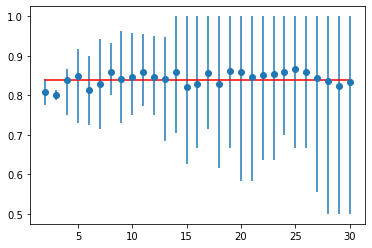

In [ ]:
find_fold(X_res_s,y_res_s,GradientBoostingClassifier(random_state=rs))

In [ ]:
grid_searchCV(gb_params, X_res_s, y_res_s, 4)

,model,best_score,best_params
0,GB,0.875,"{'learning_rate': 0.5, 'max_depth': 3, 'n_esti..."


ADA

In [ ]:
ada_params = {'ADA': {
        'model': AdaBoostClassifier(random_state=rs),
        'params': {
            "n_estimators":[10,20,50,100, 120, 140, 160, 180, 200, 300],
            "learning_rate":[0.001,0.01,0.02,0.04,0.06,0.08,0.1,1]
        }
    }}

Ideal: 0.838
> folds=2, accuracy=0.829 (0.800,0.858)
> folds=3, accuracy=0.821 (0.812,0.838)
> folds=4, accuracy=0.821 (0.817,0.833)
> folds=5, accuracy=0.838 (0.771,0.917)
> folds=6, accuracy=0.842 (0.750,0.875)
> folds=7, accuracy=0.838 (0.771,0.941)
> folds=8, accuracy=0.846 (0.733,0.900)
> folds=9, accuracy=0.829 (0.704,0.963)
> folds=10, accuracy=0.846 (0.708,0.958)
> folds=11, accuracy=0.829 (0.636,0.955)
> folds=12, accuracy=0.838 (0.750,0.950)
> folds=13, accuracy=0.825 (0.722,0.944)
> folds=14, accuracy=0.822 (0.667,0.941)
> folds=15, accuracy=0.842 (0.688,1.000)
> folds=16, accuracy=0.842 (0.533,1.000)
> folds=17, accuracy=0.839 (0.533,1.000)
> folds=18, accuracy=0.850 (0.643,1.000)
> folds=19, accuracy=0.838 (0.538,1.000)
> folds=20, accuracy=0.838 (0.417,1.000)
> folds=21, accuracy=0.834 (0.417,1.000)
> folds=22, accuracy=0.830 (0.364,1.000)
> folds=23, accuracy=0.839 (0.364,1.000)
> folds=24, accuracy=0.842 (0.600,1.000)
> folds=25, accuracy=0.837 (0.556,1.000)
> folds=26,

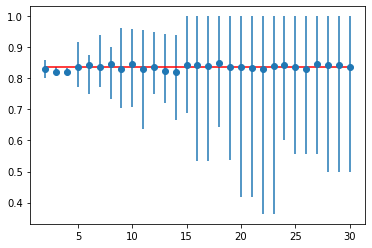

In [ ]:
find_fold(X_res_s,y_res_s,AdaBoostClassifier(random_state=rs))

In [ ]:
grid_searchCV(ada_params, X_res_s, y_res_s, 5)

,model,best_score,best_params
0,ADA,0.858333,"{'learning_rate': 0.04, 'n_estimators': 180}"


Bagg

In [ ]:
bagg_params = {'Bagging': {
        'model': BaggingClassifier(random_state=rs),
        'params': {
            'max_features': [0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0, 1.5, 2],
            'max_samples': [0.1,0.2,0.3,0.4,0.5, 0.7, 1.0],
            'n_estimators': [10, 20, 30, 50, 100, 150, 170, 190, 200, 220, 250]
        }
    }}

bagg_params1 = {'Bagging': {
        'model': BaggingClassifier(random_state=rs),
        'params': {
            'max_features': [0.1,0.2,0.3,0.4],
            'max_samples': [0.5, 0.7, 0.8, 0.9, 1.0],
            'n_estimators': [ 170, 190, 200, 220, 250]
        }
    }}

Ideal: 0.833
> folds=2, accuracy=0.821 (0.817,0.825)
> folds=3, accuracy=0.792 (0.750,0.812)
> folds=4, accuracy=0.838 (0.733,0.917)
> folds=5, accuracy=0.838 (0.729,0.896)
> folds=6, accuracy=0.846 (0.750,0.925)
> folds=7, accuracy=0.834 (0.714,0.912)
> folds=8, accuracy=0.833 (0.700,0.933)
> folds=9, accuracy=0.833 (0.692,0.963)
> folds=10, accuracy=0.838 (0.708,0.958)
> folds=11, accuracy=0.833 (0.682,0.955)
> folds=12, accuracy=0.862 (0.800,0.900)
> folds=13, accuracy=0.858 (0.632,1.000)
> folds=14, accuracy=0.826 (0.647,1.000)
> folds=15, accuracy=0.846 (0.688,1.000)
> folds=16, accuracy=0.825 (0.600,1.000)
> folds=17, accuracy=0.830 (0.600,1.000)
> folds=18, accuracy=0.847 (0.643,1.000)
> folds=19, accuracy=0.833 (0.615,1.000)
> folds=20, accuracy=0.825 (0.583,1.000)
> folds=21, accuracy=0.847 (0.583,1.000)
> folds=22, accuracy=0.830 (0.545,1.000)
> folds=23, accuracy=0.848 (0.545,1.000)
> folds=24, accuracy=0.837 (0.400,1.000)
> folds=25, accuracy=0.821 (0.400,1.000)
> folds=26,

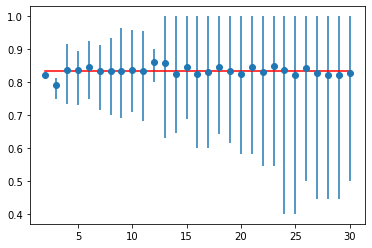

In [ ]:
find_fold(X_res_s,y_res_s,BaggingClassifier(random_state=rs))

In [ ]:
grid_searchCV(bagg_params1, X_res_s, y_res_s, 8)

,model,best_score,best_params
0,Bagging,0.870833,"{'max_features': 0.4, 'max_samples': 0.7, 'n_e..."


RF

In [ ]:
rf_params = {'Random Forest': {
        'model': RandomForestClassifier(random_state=rs),
        'params': {
            'n_estimators' : [10, 25,90,95, 100,105,110,120, 150, 200],
            'max_features' : ['auto', 'sqrt', 'log2'],
            'max_depth' : [4,5,6,7,8],
            'criterion' :['gini', 'entropy','log_loss'],


        }
    }}

Ideal: 0.871
> folds=2, accuracy=0.817 (0.800,0.833)
> folds=3, accuracy=0.842 (0.838,0.850)
> folds=4, accuracy=0.850 (0.783,0.917)
> folds=5, accuracy=0.858 (0.771,0.938)
> folds=6, accuracy=0.850 (0.725,0.925)
> folds=7, accuracy=0.834 (0.714,0.886)
> folds=8, accuracy=0.863 (0.767,0.933)
> folds=9, accuracy=0.858 (0.741,1.000)
> folds=10, accuracy=0.838 (0.708,1.000)
> folds=11, accuracy=0.867 (0.773,0.955)
> folds=12, accuracy=0.867 (0.700,1.000)
> folds=13, accuracy=0.863 (0.778,1.000)
> folds=14, accuracy=0.826 (0.706,1.000)
> folds=15, accuracy=0.854 (0.750,1.000)
> folds=16, accuracy=0.867 (0.733,1.000)
> folds=17, accuracy=0.867 (0.714,1.000)
> folds=18, accuracy=0.871 (0.714,1.000)
> folds=19, accuracy=0.872 (0.692,1.000)
> folds=20, accuracy=0.867 (0.667,1.000)
> folds=21, accuracy=0.855 (0.667,1.000)
> folds=22, accuracy=0.867 (0.636,1.000)
> folds=23, accuracy=0.868 (0.636,1.000)
> folds=24, accuracy=0.858 (0.600,1.000)
> folds=25, accuracy=0.860 (0.600,1.000)
> folds=26,

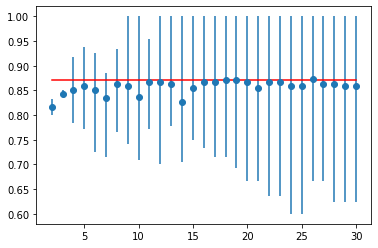

In [ ]:
find_fold(X_res_s,y_res_s,RandomForestClassifier(random_state=rs))

In [ ]:
grid_searchCV(rf_params, X_res_s, y_res_s, 18)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this paramet

,model,best_score,best_params
0,Random Forest,0.888278,"{'criterion': 'entropy', 'max_depth': 8, 'max_..."


MLP

In [ ]:
#discard 'adam' as its recomennded with bigger datasets
mlp_params = {'MLP' : {
        'model' : MLPClassifier(random_state=rs),
        'params':{
            'hidden_layer_sizes': [(1,),(5,),(10,),(20,),(50,), (100,)],
            'activation': ['identity', 'logistic','tanh', 'relu'],
            'solver': ['lbfgs','sgd'],
            'alpha': [0.0001, 0.001, 0.01, 0.1 ],
            'learning_rate': ['constant','adaptive'],
            'max_iter' : [100, 200, 300, 400]
        }
    }}

mlp_params = {'MLP' : {
        'model' : MLPClassifier(random_state=rs),
        'params':{
            'hidden_layer_sizes': [(10,),(20,)],
            'activation': ['identity', 'logistic','tanh', 'relu'],
            'solver': ['lbfgs','sgd'],
            'alpha': [0.0001, 0.001],
            'learning_rate': ['constant','adaptive'],
            'max_iter' : [1000]
        }
    }}

#The best that converge max_iter = 200

Ideal: 0.850
> folds=2, accuracy=0.817 (0.817,0.817)
> folds=3, accuracy=0.817 (0.800,0.850)
> folds=4, accuracy=0.833 (0.817,0.850)
> folds=5, accuracy=0.846 (0.792,0.896)
> folds=6, accuracy=0.825 (0.775,0.875)
> folds=7, accuracy=0.825 (0.735,0.914)
> folds=8, accuracy=0.821 (0.700,0.900)
> folds=9, accuracy=0.846 (0.741,0.962)
> folds=10, accuracy=0.833 (0.708,1.000)
> folds=11, accuracy=0.854 (0.727,0.952)
> folds=12, accuracy=0.846 (0.750,0.950)
> folds=13, accuracy=0.842 (0.778,0.944)
> folds=14, accuracy=0.846 (0.647,1.000)
> folds=15, accuracy=0.850 (0.750,1.000)
> folds=16, accuracy=0.854 (0.733,1.000)
> folds=17, accuracy=0.859 (0.643,1.000)
> folds=18, accuracy=0.851 (0.643,1.000)
> folds=19, accuracy=0.859 (0.667,1.000)
> folds=20, accuracy=0.850 (0.583,1.000)
> folds=21, accuracy=0.868 (0.583,1.000)
> folds=22, accuracy=0.855 (0.636,1.000)
> folds=23, accuracy=0.855 (0.636,1.000)
> folds=24, accuracy=0.854 (0.700,1.000)
> folds=25, accuracy=0.851 (0.667,1.000)
> folds=26,

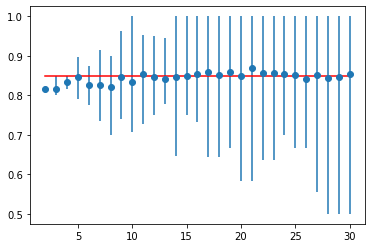

In [ ]:
find_fold(X_res_s,y_res_s,MLPClassifier(random_state=rs))

In [ ]:
grid_searchCV(mlp_params, X_res_s, y_res_s, 5)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron

,model,best_score,best_params
0,MLP,0.85,"{'activation': 'relu', 'alpha': 0.0001, 'hidde..."


XGB

In [ ]:
xgb_params = {'XGB' : {
        'model': XGBClassifier(random_state=rs),
        'params': {
            'reg_alpha':[1e-5, 1e-2, 0.1, 0.5, 1],
            'subsample':[i/10.0 for i in range(0,6)],
            'colsample_bytree':[i/10.0 for i in range(0,6)],
            'gamma':[i/10.0 for i in range(0,5)],
            'max_depth':[3,4,5,6],
            'min_child_weight': [3,4,5,6]

        }
    }}

In [ ]:
[i/10.0 for i in range(0,6)]


[0.0, 0.1, 0.2]

Ideal: 0.863
> folds=2, accuracy=0.804 (0.775,0.833)
> folds=3, accuracy=0.833 (0.775,0.875)
> folds=4, accuracy=0.842 (0.750,0.917)
> folds=5, accuracy=0.854 (0.729,0.938)
> folds=6, accuracy=0.829 (0.750,0.875)
> folds=7, accuracy=0.834 (0.743,0.912)
> folds=8, accuracy=0.842 (0.800,0.933)
> folds=9, accuracy=0.850 (0.769,0.963)
> folds=10, accuracy=0.863 (0.750,1.000)
> folds=11, accuracy=0.859 (0.727,0.955)
> folds=12, accuracy=0.833 (0.700,0.950)
> folds=13, accuracy=0.854 (0.778,0.944)
> folds=14, accuracy=0.846 (0.706,1.000)
> folds=15, accuracy=0.858 (0.625,1.000)
> folds=16, accuracy=0.846 (0.667,1.000)
> folds=17, accuracy=0.855 (0.667,1.000)
> folds=18, accuracy=0.845 (0.692,1.000)
> folds=19, accuracy=0.845 (0.615,1.000)
> folds=20, accuracy=0.850 (0.583,1.000)
> folds=21, accuracy=0.863 (0.583,1.000)
> folds=22, accuracy=0.859 (0.636,1.000)
> folds=23, accuracy=0.862 (0.636,1.000)
> folds=24, accuracy=0.858 (0.500,1.000)
> folds=25, accuracy=0.858 (0.500,1.000)
> folds=26,

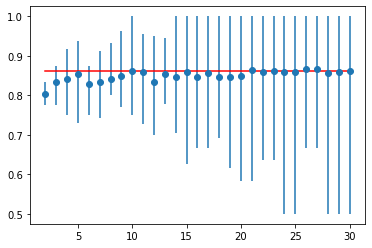

In [ ]:
find_fold(X_res_s,y_res_s,XGBClassifier(random_state=rs))

In [ ]:
grid_searchCV(xgb_params, X_res_s, y_res_s, 10)

,model,best_score,best_params
0,XGB,0.870833,"{'colsample_bytree': 0.4, 'gamma': 0.4, 'max_d..."


KNN

In [ ]:
knn_params = {'KNN' : {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [i+1 for i in range(0,200)],
            'weights': ['uniform', 'distance']

        }
    }
}

Ideal: 0.854
> folds=2, accuracy=0.838 (0.833,0.842)
> folds=3, accuracy=0.825 (0.787,0.850)
> folds=4, accuracy=0.846 (0.800,0.917)
> folds=5, accuracy=0.850 (0.771,0.917)
> folds=6, accuracy=0.846 (0.725,0.900)
> folds=7, accuracy=0.838 (0.714,0.971)
> folds=8, accuracy=0.858 (0.767,0.933)
> folds=9, accuracy=0.863 (0.741,0.963)
> folds=10, accuracy=0.854 (0.708,0.958)
> folds=11, accuracy=0.859 (0.727,0.955)
> folds=12, accuracy=0.854 (0.750,1.000)
> folds=13, accuracy=0.863 (0.737,0.944)
> folds=14, accuracy=0.859 (0.647,1.000)
> folds=15, accuracy=0.867 (0.750,1.000)
> folds=16, accuracy=0.858 (0.733,1.000)
> folds=17, accuracy=0.863 (0.714,1.000)
> folds=18, accuracy=0.860 (0.692,1.000)
> folds=19, accuracy=0.868 (0.615,1.000)
> folds=20, accuracy=0.858 (0.583,1.000)
> folds=21, accuracy=0.860 (0.583,1.000)
> folds=22, accuracy=0.859 (0.545,1.000)
> folds=23, accuracy=0.860 (0.545,1.000)
> folds=24, accuracy=0.862 (0.600,1.000)
> folds=25, accuracy=0.864 (0.600,1.000)
> folds=26,

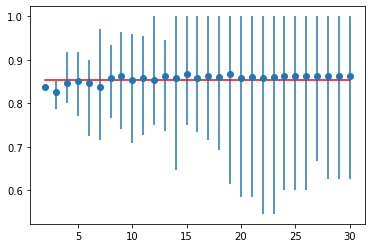

In [ ]:
find_fold(X_res_s,y_res_s,KNeighborsClassifier())

In [ ]:
grid_searchCV(knn_params, X_res_s, y_res_s, 10)

,model,best_score,best_params
0,KNN,0.895833,"{'n_neighbors': 87, 'weights': 'distance'}"


#Tuned Statlog

In [ ]:
LR_GS = LogisticRegression(C=1.1, max_iter=7, penalty='l2', solver='liblinear',random_state=rs)
NB_GS =  GaussianNB(var_smoothing=3.511191734215127e-05)

DT_GS =DecisionTreeClassifier(criterion='gini', max_depth=8, ccp_alpha=0.01, max_features='log2',random_state=rs)
SVLC_GS =SVC(C=0.8, gamma=0.7, kernel='rbf', probability=True, random_state=rs)

GB_GS = GradientBoostingClassifier(learning_rate=0.5, max_depth=3, n_estimators=100, random_state=rs )

ADA_GS = AdaBoostClassifier(learning_rate=0.04, n_estimators=180, random_state=rs)

Bagg_GS = BaggingClassifier(max_features=0.4, max_samples=0.7, n_estimators=200, random_state=rs)


RF_GS = RandomForestClassifier(criterion='gini', max_depth=6, max_features='log2', n_estimators=100, random_state=rs)
MLP_GS = MLPClassifier(activation='relu', alpha= 0.0001, hidden_layer_sizes=(10,), learning_rate='constant', max_iter=1000, solver='sgd', random_state=rs)
XGB_GS =  XGBClassifier(colsample_bytree = 0.4, gamma= 0.4, max_depth= 3, min_child_weight= 3, reg_alpha=0.5, subsample= 0.4, random_state=rs)
KNN_GS = KNeighborsClassifier(n_neighbors=87, weights='distance')

LR_pipeGS = Pipeline([
                    ("logistic regression", LR_GS)])

NB_pipeGS = Pipeline([
                    ("NB Gaussian", NB_GS)])

DT_pipeGS = Pipeline([
                    ("Decision Tree", DT_GS)])

SVLC_pipeGS = Pipeline([
                    ("SVLC", SVLC_GS)])

GB_pipeGS = Pipeline([
                    ("GradientBoosting", GB_GS)])

ADA_pipeGS = Pipeline([
                    ("ADABoost", ADA_GS)])

Bagg_pipeGS = Pipeline([
                    ("Bagging", Bagg_GS)])

RF_pipeGS = Pipeline([
                    ("Random Forest", RF_GS)])

MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])

XGB_pipeGS = Pipeline([
                    ("XGB", XGB_GS)])


KNN_pipeGS = Pipeline([
                    ("KNN", KNN_GS)])

#all pipes
all_pipesGS = [LR_pipeGS, NB_pipeGS, DT_pipeGS, SVLC_pipeGS, GB_pipeGS, ADA_pipeGS, Bagg_pipeGS, RF_pipeGS, MLP_pipeGS, XGB_pipeGS, KNN_pipeGS]

In [ ]:
tuned_statlog_train=model_training(all_pipesGS, X_res_s, y_res_s)

LR Test Accuracy: 87.0
LR Test f1_score: 87.0
LR Test precision_score: 88.0
LR Test recall_score: 88.0


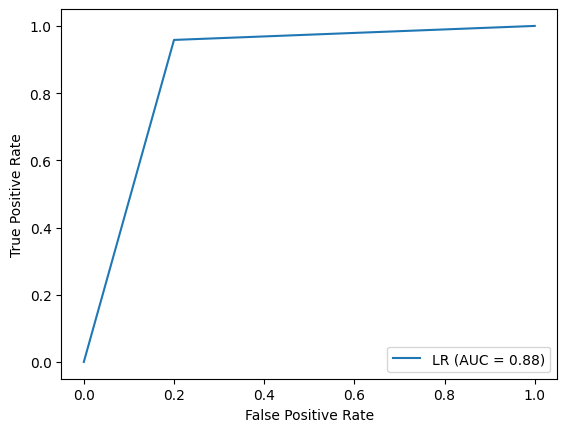

NB Test Accuracy: 80.0
NB Test f1_score: 79.0
NB Test precision_score: 79.0
NB Test recall_score: 80.0


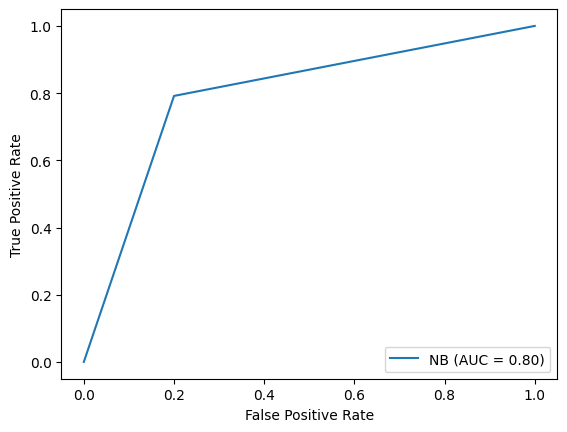

DT Test Accuracy: 78.0
DT Test f1_score: 78.0
DT Test precision_score: 80.0
DT Test recall_score: 79.0


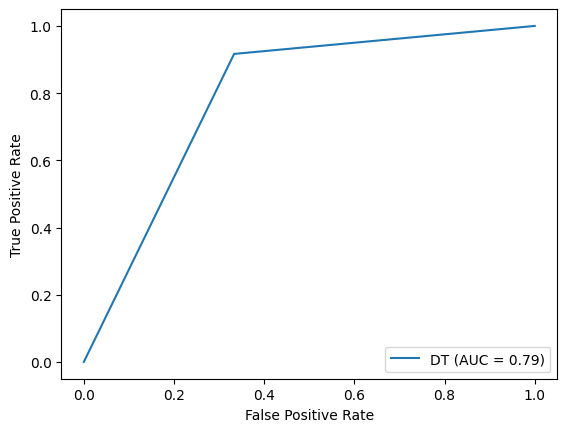

SVLC Test Accuracy: 83.0
SVLC Test f1_score: 83.0
SVLC Test precision_score: 83.0
SVLC Test recall_score: 84.0


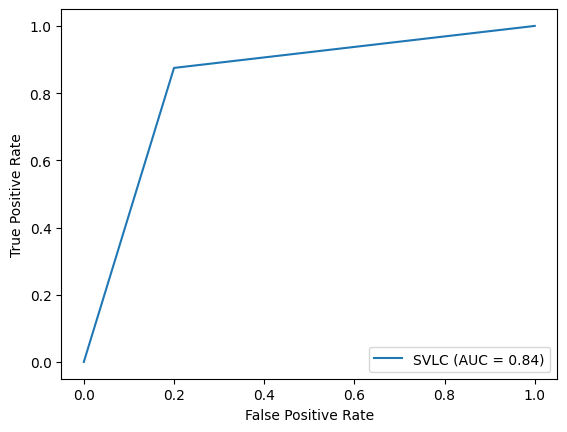

GB Test Accuracy: 85.0
GB Test f1_score: 85.0
GB Test precision_score: 85.0
GB Test recall_score: 85.0


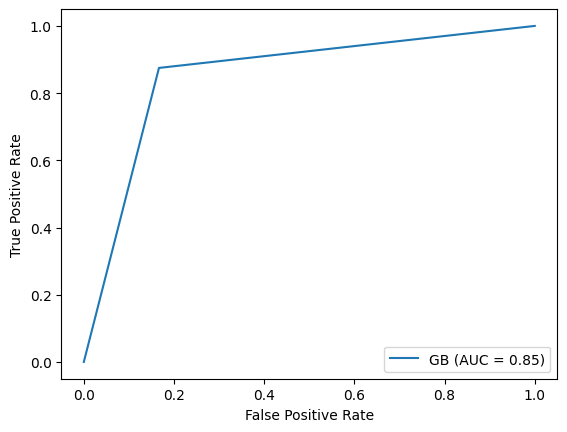

ADA Test Accuracy: 87.0
ADA Test f1_score: 87.0
ADA Test precision_score: 88.0
ADA Test recall_score: 88.0


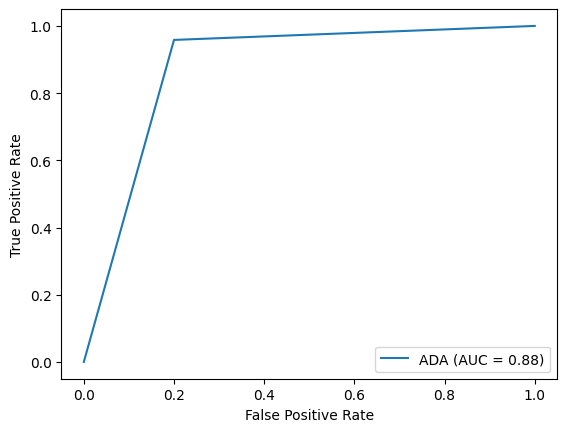

Bagg Test Accuracy: 80.0
Bagg Test f1_score: 80.0
Bagg Test precision_score: 80.0
Bagg Test recall_score: 80.0


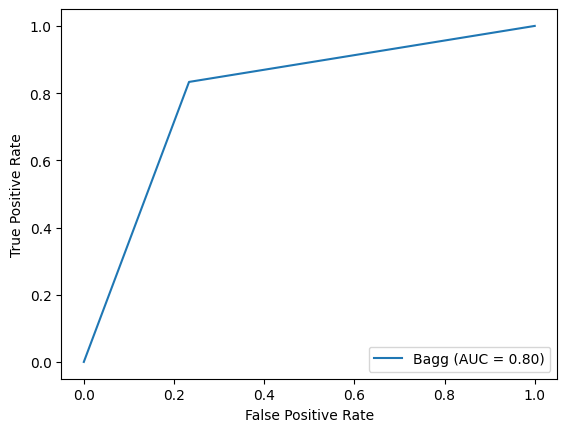

RF Test Accuracy: 83.0
RF Test f1_score: 83.0
RF Test precision_score: 83.0
RF Test recall_score: 84.0


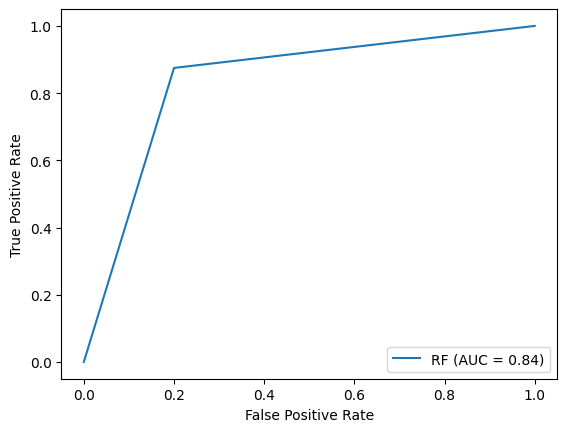

MLP Test Accuracy: 83.0
MLP Test f1_score: 83.0
MLP Test precision_score: 84.0
MLP Test recall_score: 84.0


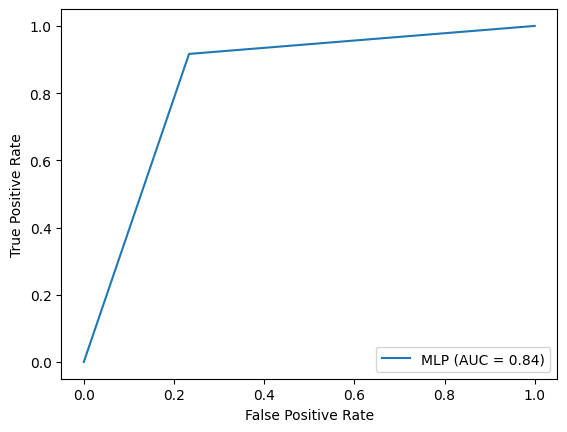

XGB Test Accuracy: 80.0
XGB Test f1_score: 80.0
XGB Test precision_score: 81.0
XGB Test recall_score: 81.0


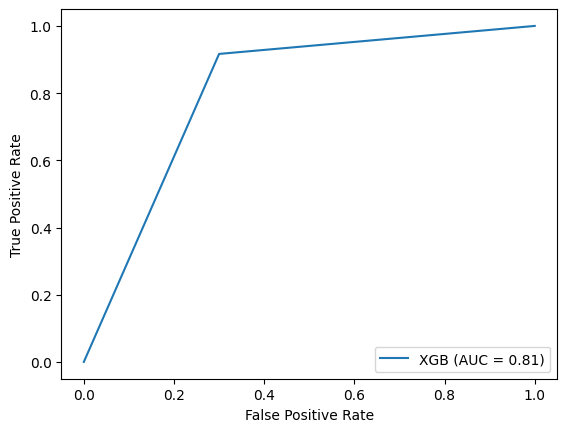

KNN Test Accuracy: 83.0
KNN Test f1_score: 83.0
KNN Test precision_score: 84.0
KNN Test recall_score: 84.0


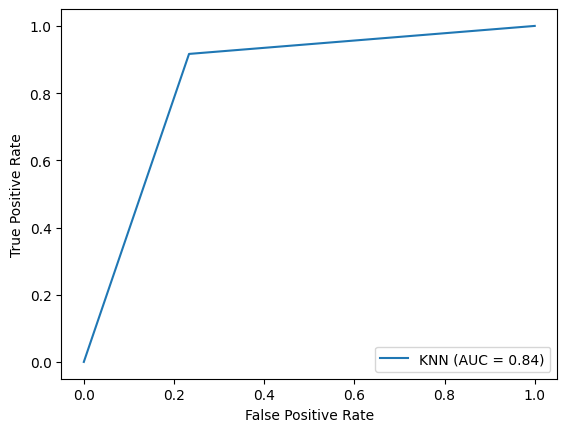

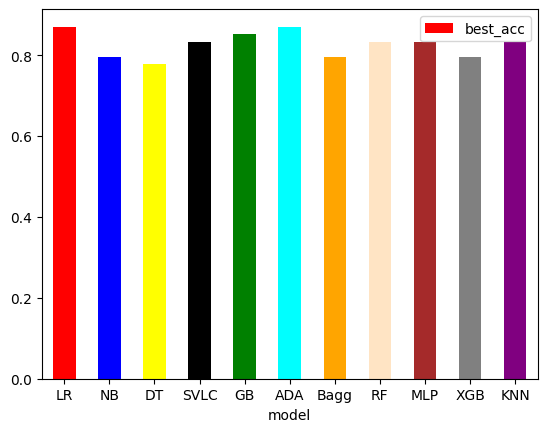

In [ ]:
tuned_ros_statlog  = model_testing(PipelineDict, tuned_statlog_train, X_test_s, y_test_s)
# model_testingGS(PipelineDict, all_pipes, X_test_s, y_test_s)

,index,model,best_acc,col
0,0,LR,0.870370,base_model
1,1,NB,0.703704,base_model
2,2,DT,0.796296,base_model
3,3,SVLC,0.888889,base_model
4,4,GB,0.814815,base_model
5,5,ADA,0.814815,base_model
6,6,Bagg,0.814815,base_model
7,7,RF,0.833333,base_model
8,8,MLP,0.870370,base_model
9,9,XGB,0.833333,base_model


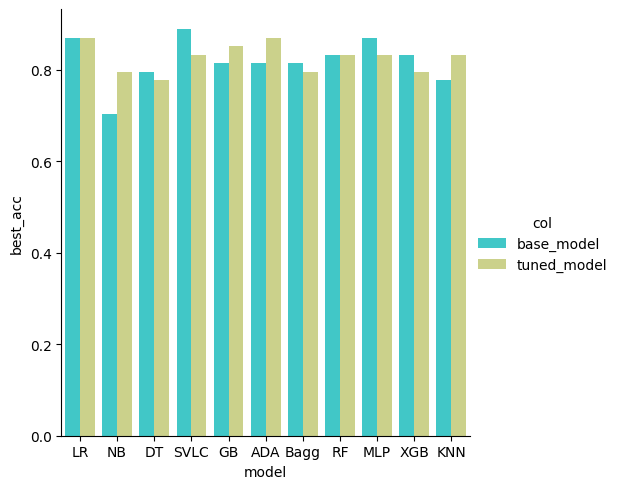

In [ ]:
bar_plot(base_ros_statlog,tuned_ros_statlog, 'rainbow')

In [ ]:
tuned_ros_statlog_cv = cv_evaluation(PipelineDict, all_pipesGS, X_res_stat, y_res_stat)

/usr/local/lib/python3.8/dist-packages/seaborn/categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


,index,CV,model,best_acc,col
0,0,LOOC,LR,86.0,base_model
1,1,LOOC,NB,83.0,base_model
2,2,LOOC,DT,79.0,base_model
3,3,LOOC,SVLC,85.0,base_model
4,4,LOOC,GB,85.0,base_model
5,5,LOOC,ADA,84.0,base_model
6,6,LOOC,Bagg,83.0,base_model
7,7,LOOC,RF,85.0,base_model
8,8,LOOC,MLP,87.0,base_model
9,9,LOOC,XGB,84.0,base_model


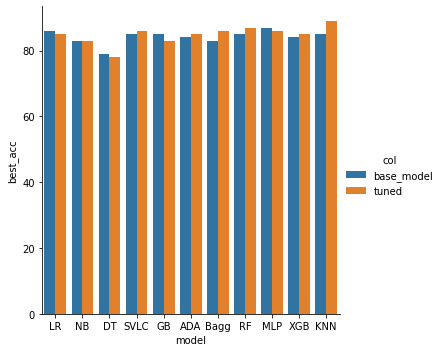

In [ ]:
bar_plot_cv(base_ros_cv_statlog,tuned_ros_statlog_cv)

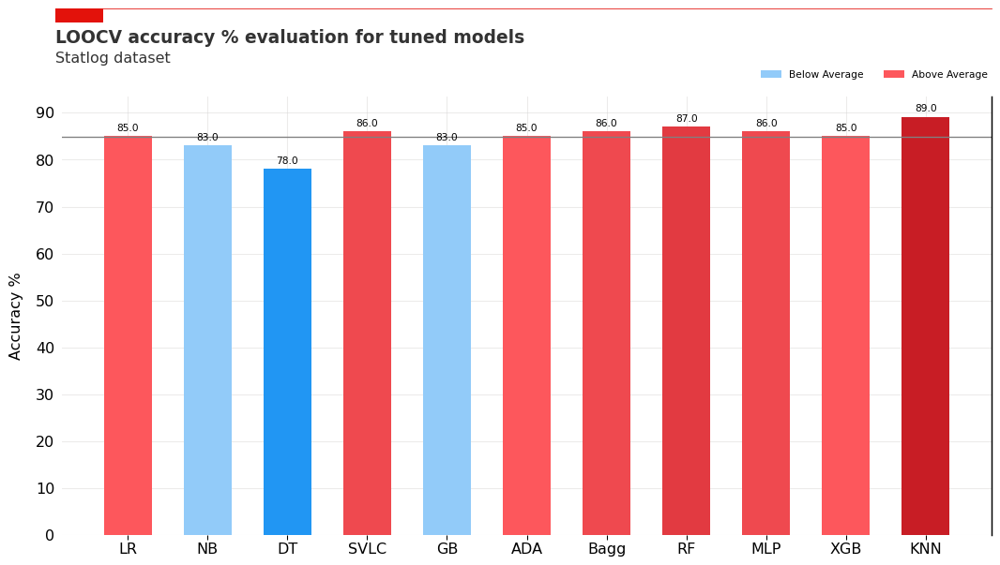

In [ ]:
bar_plot_update(tuned_ros_statlog_cv, 'model', 'best_acc', 'Statlog')

#GridSearchCV Clevland SMOTE

LR

Ideal: 0.816
> folds=2, accuracy=0.816 (0.805,0.828)
> folds=3, accuracy=0.816 (0.765,0.859)
> folds=4, accuracy=0.812 (0.781,0.828)
> folds=5, accuracy=0.816 (0.784,0.865)
> folds=6, accuracy=0.817 (0.721,0.905)
> folds=7, accuracy=0.813 (0.730,0.917)
> folds=8, accuracy=0.820 (0.719,0.906)
> folds=9, accuracy=0.824 (0.724,0.964)
> folds=10, accuracy=0.820 (0.720,0.920)
> folds=11, accuracy=0.805 (0.696,0.957)
> folds=12, accuracy=0.812 (0.714,0.952)
> folds=13, accuracy=0.821 (0.684,0.947)
> folds=14, accuracy=0.812 (0.667,0.944)
> folds=15, accuracy=0.812 (0.647,0.941)
> folds=16, accuracy=0.812 (0.625,0.938)
> folds=17, accuracy=0.820 (0.600,0.933)
> folds=18, accuracy=0.824 (0.571,1.000)
> folds=19, accuracy=0.813 (0.571,1.000)
> folds=20, accuracy=0.816 (0.583,0.923)
> folds=21, accuracy=0.824 (0.583,0.923)
> folds=22, accuracy=0.814 (0.583,1.000)
> folds=23, accuracy=0.821 (0.545,1.000)
> folds=24, accuracy=0.813 (0.545,1.000)
> folds=25, accuracy=0.820 (0.600,1.000)
> folds=26,

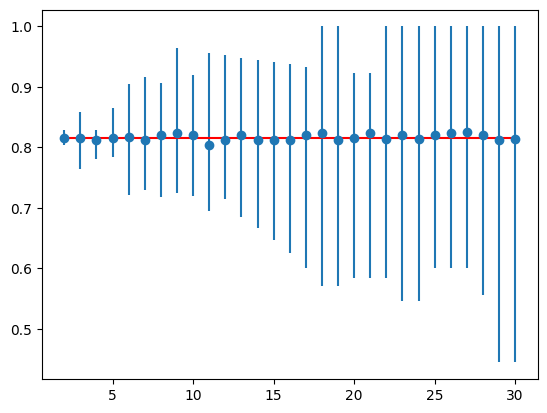

In [ ]:
find_fold(X_smo_c,y_smo_c,LogisticRegression(random_state=rs))

In [ ]:
# LR_params = {
#     'Logistic_regression' : {
#         'model': LogisticRegression(),
#         'params': {
#             'max_iter' : [5,10,13,15, 20, 30, 40, 50, 100],
#             'penalty' : ['l1', 'l2'],
#             'C': [0.01,.09, 1, 1.1, 1.2, 1.5, 1.8, 2],
#             'solver' : ['liblinear', 'saga']

#         }
#     }}

# LR_label = {1: 'LR'}

LR_params = {
    'Logistic_regression' : {
        'model': LogisticRegression(random_state=rs),
        'params': {
            'max_iter' : [5, 10, 15, 20, 30, 40, 50, 100],
            'penalty' : ['l1', 'l2'],
            'C': [0.01,.09, 1, 1.1, 1.2, 1.5, 1.8, 2],
            'solver' : ['liblinear', 'saga']

        }
    }}

#Finding parameter max iter for saga solver that fully converge
LR_params = {
    'Logistic_regression' : {
        'model': LogisticRegression(random_state=rs),
        'params': {
            'max_iter' : [21, 22, 23, 24, 25, 26, 27 , 28 , 29 , 30],
            'penalty' : ['l2'],
            'C': [0.001,0.01,.02, .03, .04, .05, .06, .07, .08, .09, .1],
            'solver' : ['saga']

        }
    }}



In [ ]:
grid_searchCV(LR_params, X_smo_c, y_smo_c, 5)

,model,best_score,best_params
0,Logistic_regression,0.824057,"{'C': 0.01, 'max_iter': 21, 'penalty': 'l2', '..."


NB

In [ ]:
nb_params = {'Naive_bayes_gaussian': {
        'model': GaussianNB(),
        'params': {
            'var_smoothing': np.logspace(0,-9, num=100)
        }
    }}

nb_label = {1: 'NB'}

Ideal: 0.809
> folds=2, accuracy=0.770 (0.750,0.789)
> folds=3, accuracy=0.773 (0.718,0.802)
> folds=4, accuracy=0.805 (0.750,0.875)
> folds=5, accuracy=0.801 (0.706,0.882)
> folds=6, accuracy=0.789 (0.738,0.837)
> folds=7, accuracy=0.781 (0.722,0.833)
> folds=8, accuracy=0.801 (0.656,0.906)
> folds=9, accuracy=0.801 (0.714,0.929)
> folds=10, accuracy=0.805 (0.640,0.920)
> folds=11, accuracy=0.797 (0.696,0.913)
> folds=12, accuracy=0.801 (0.591,0.905)
> folds=13, accuracy=0.809 (0.650,0.947)
> folds=14, accuracy=0.801 (0.667,0.944)
> folds=15, accuracy=0.801 (0.647,0.941)
> folds=16, accuracy=0.812 (0.562,0.938)
> folds=17, accuracy=0.808 (0.533,0.933)
> folds=18, accuracy=0.813 (0.600,1.000)
> folds=19, accuracy=0.797 (0.571,1.000)
> folds=20, accuracy=0.808 (0.615,0.923)
> folds=21, accuracy=0.813 (0.583,0.917)
> folds=22, accuracy=0.813 (0.583,1.000)
> folds=23, accuracy=0.817 (0.455,1.000)
> folds=24, accuracy=0.800 (0.545,1.000)
> folds=25, accuracy=0.798 (0.545,1.000)
> folds=26,

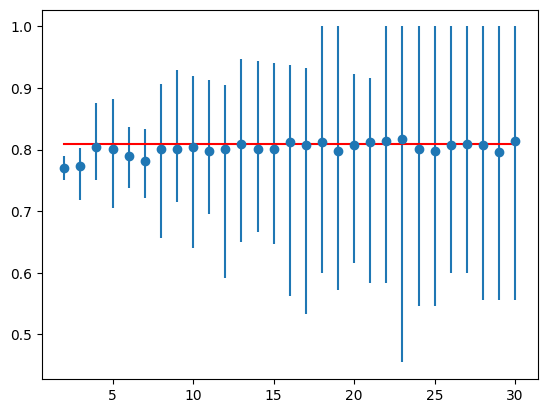

In [ ]:
find_fold(X_smo_c,y_smo_c,GaussianNB())

In [ ]:
grid_searchCV(nb_params, X_smo_c, y_smo_c, 13)

,model,best_score,best_params
0,Naive_bayes_gaussian,0.828745,{'var_smoothing': 0.1873817422860384}


DT

In [ ]:
dt_params = {'Decision_tree': {
        'model': DecisionTreeClassifier(random_state=rs),
        'params': {
            'criterion': ['gini','entropy'],
            'max_depth' : [2,4,6,8,10,12, 15, 20],
            'ccp_alpha': [0.1, .01, .001, .0001],
            'max_features': ['auto', 'sqrt', 'log2']



        }
    }}





Ideal: 0.742
> folds=2, accuracy=0.750 (0.688,0.812)
> folds=3, accuracy=0.730 (0.694,0.779)
> folds=4, accuracy=0.750 (0.688,0.828)
> folds=5, accuracy=0.746 (0.667,0.784)
> folds=6, accuracy=0.731 (0.651,0.791)
> folds=7, accuracy=0.700 (0.622,0.778)
> folds=8, accuracy=0.746 (0.594,0.844)
> folds=9, accuracy=0.715 (0.607,0.862)
> folds=10, accuracy=0.750 (0.654,0.846)
> folds=11, accuracy=0.747 (0.667,0.826)
> folds=12, accuracy=0.758 (0.591,0.864)
> folds=13, accuracy=0.746 (0.650,0.900)
> folds=14, accuracy=0.751 (0.474,0.889)
> folds=15, accuracy=0.722 (0.588,0.941)
> folds=16, accuracy=0.742 (0.562,0.875)
> folds=17, accuracy=0.761 (0.467,1.000)
> folds=18, accuracy=0.751 (0.467,0.929)
> folds=19, accuracy=0.755 (0.500,0.923)
> folds=20, accuracy=0.734 (0.385,0.846)
> folds=21, accuracy=0.734 (0.615,0.846)
> folds=22, accuracy=0.731 (0.417,0.917)
> folds=23, accuracy=0.731 (0.455,0.833)
> folds=24, accuracy=0.746 (0.455,1.000)
> folds=25, accuracy=0.754 (0.455,0.909)
> folds=26,

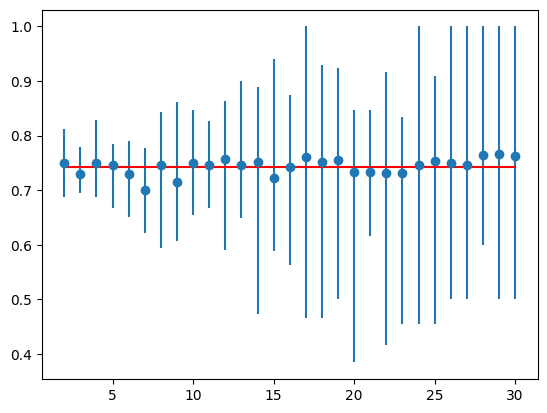

In [ ]:
find_fold(X_smo_c,y_smo_c,DecisionTreeClassifier(random_state=rs))

In [ ]:
grid_searchCV(dt_params, X_smo_c, y_smo_c, 16)

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9

,model,best_score,best_params
0,Decision_tree,0.792969,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_..."


SVLC

In [ ]:
svc_params = {'SVC': {
        'model': SVC(random_state=rs),
        'params' : {
                'C': [0.001,0.01,0.1,0.8,0.9,1,1.1,1.2,1.3,1.4],
                'kernel':['linear', 'rbf' ,'poly'],
                'gamma' :[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,1.1,1.2,1.3,1.4]

        }
    }}

Ideal: 0.844
> folds=2, accuracy=0.848 (0.836,0.859)
> folds=3, accuracy=0.816 (0.776,0.847)
> folds=4, accuracy=0.832 (0.812,0.859)
> folds=5, accuracy=0.844 (0.804,0.882)
> folds=6, accuracy=0.828 (0.744,0.884)
> folds=7, accuracy=0.840 (0.784,0.892)
> folds=8, accuracy=0.840 (0.781,0.938)
> folds=9, accuracy=0.832 (0.786,0.929)
> folds=10, accuracy=0.836 (0.769,0.885)
> folds=11, accuracy=0.828 (0.783,0.913)
> folds=12, accuracy=0.832 (0.762,0.905)
> folds=13, accuracy=0.821 (0.700,1.000)
> folds=14, accuracy=0.836 (0.737,0.944)
> folds=15, accuracy=0.840 (0.706,0.941)
> folds=16, accuracy=0.840 (0.750,1.000)
> folds=17, accuracy=0.820 (0.667,0.933)
> folds=18, accuracy=0.833 (0.714,1.000)
> folds=19, accuracy=0.833 (0.714,1.000)
> folds=20, accuracy=0.832 (0.750,0.923)
> folds=21, accuracy=0.832 (0.750,1.000)
> folds=22, accuracy=0.832 (0.667,1.000)
> folds=23, accuracy=0.837 (0.636,1.000)
> folds=24, accuracy=0.828 (0.600,1.000)
> folds=25, accuracy=0.837 (0.600,1.000)
> folds=26,

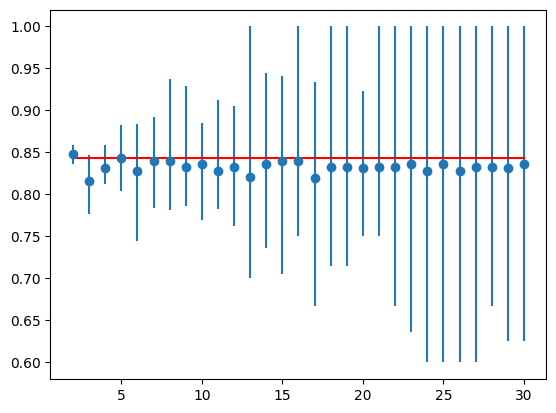

In [ ]:
find_fold(X_smo_c,y_smo_c,SVC(random_state=rs))

In [ ]:
grid_searchCV(svc_params, X_res_c, y_res_c, 5)

,model,best_score,best_params
0,SVC,0.839894,"{'C': 1.2, 'gamma': 0.4, 'kernel': 'rbf'}"


GB

In [ ]:
gb_params = {'GB': {
        'model': GradientBoostingClassifier(random_state=rs),
        'params': {
            "n_estimators":[100,110,125,150,160, 170,175,180],
            "max_depth":[1,3,5,7,9, 10, 15, 20],
            "learning_rate":[0.1,0.5,0.8,1,1.2,1.5,1.7,2]
        }
    }}


gb_params1 = {'GB': {
        'model': GradientBoostingClassifier(random_state=rs),
        'params': {
            "n_estimators":[70,71, 72, 73, 74, 75, 76,77,78,79,80,81,82,83,84,85,86,87,88,89],
            "max_depth":[1,2,3,4,5,6,7],
            "learning_rate":[.01,0.1,0.2,0.3]
        }
    }}

Ideal: 0.809
> folds=2, accuracy=0.793 (0.742,0.844)
> folds=3, accuracy=0.805 (0.756,0.847)
> folds=4, accuracy=0.805 (0.750,0.875)
> folds=5, accuracy=0.801 (0.750,0.882)
> folds=6, accuracy=0.801 (0.738,0.860)
> folds=7, accuracy=0.797 (0.703,0.865)
> folds=8, accuracy=0.809 (0.688,0.906)
> folds=9, accuracy=0.821 (0.690,0.893)
> folds=10, accuracy=0.809 (0.654,0.960)
> folds=11, accuracy=0.821 (0.708,0.913)
> folds=12, accuracy=0.825 (0.682,0.905)
> folds=13, accuracy=0.817 (0.650,0.900)
> folds=14, accuracy=0.826 (0.632,0.889)
> folds=15, accuracy=0.820 (0.529,0.941)
> folds=16, accuracy=0.820 (0.625,1.000)
> folds=17, accuracy=0.820 (0.600,1.000)
> folds=18, accuracy=0.825 (0.600,0.929)
> folds=19, accuracy=0.825 (0.643,1.000)
> folds=20, accuracy=0.816 (0.615,1.000)
> folds=21, accuracy=0.813 (0.500,1.000)
> folds=22, accuracy=0.817 (0.667,0.917)
> folds=23, accuracy=0.818 (0.545,1.000)
> folds=24, accuracy=0.836 (0.455,1.000)
> folds=25, accuracy=0.817 (0.455,1.000)
> folds=26,

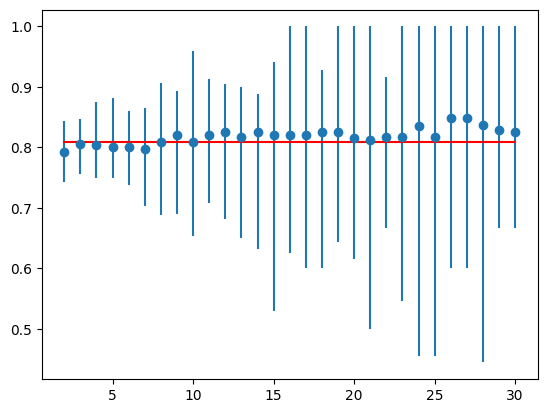

In [ ]:
find_fold(X_smo_c,y_smo_c,GradientBoostingClassifier(random_state=rs))

In [ ]:
grid_searchCV(gb_params1, X_smo_c, y_smo_c, 8)

,model,best_score,best_params
0,GB,0.828125,"{'learning_rate': 0.1, 'max_depth': 1, 'n_esti..."


ADA

In [ ]:
ada_params = {'ADA': {
        'model': AdaBoostClassifier(random_state=rs),
        'params': {
            "n_estimators":[100, 120, 140, 160, 180, 200, 300],
            "learning_rate":[0.001,0.01,0.02,0.04,0.06,0.08,0.1,1]
        }
    }}

ada_params1 = {'ADA': {
        'model': AdaBoostClassifier(random_state=rs),
        'params': {
            "n_estimators":[ 200, 210,220, 230, 240,250,260, 270, 280, 290],
            "learning_rate":[0.04]
        }
    }}

Ideal: 0.816
> folds=2, accuracy=0.742 (0.734,0.750)
> folds=3, accuracy=0.793 (0.776,0.824)
> folds=4, accuracy=0.781 (0.719,0.812)
> folds=5, accuracy=0.805 (0.745,0.882)
> folds=6, accuracy=0.805 (0.698,0.860)
> folds=7, accuracy=0.805 (0.757,0.889)
> folds=8, accuracy=0.824 (0.719,0.906)
> folds=9, accuracy=0.779 (0.655,0.893)
> folds=10, accuracy=0.793 (0.680,0.885)
> folds=11, accuracy=0.829 (0.750,0.870)
> folds=12, accuracy=0.809 (0.636,0.905)
> folds=13, accuracy=0.813 (0.600,0.947)
> folds=14, accuracy=0.821 (0.632,0.947)
> folds=15, accuracy=0.808 (0.588,0.889)
> folds=16, accuracy=0.824 (0.500,0.938)
> folds=17, accuracy=0.820 (0.467,0.938)
> folds=18, accuracy=0.817 (0.571,0.929)
> folds=19, accuracy=0.818 (0.643,0.923)
> folds=20, accuracy=0.817 (0.538,1.000)
> folds=21, accuracy=0.825 (0.583,1.000)
> folds=22, accuracy=0.809 (0.667,0.917)
> folds=23, accuracy=0.801 (0.545,0.909)
> folds=24, accuracy=0.820 (0.364,1.000)
> folds=25, accuracy=0.806 (0.364,1.000)
> folds=26,

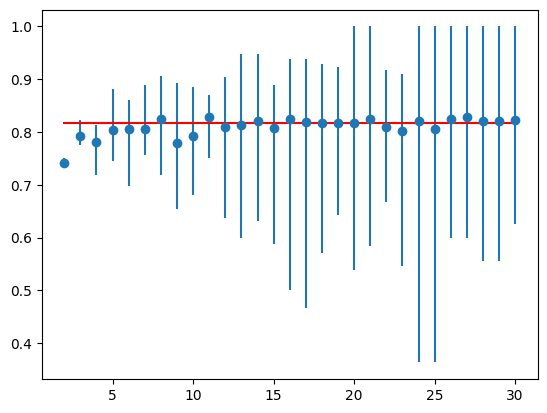

In [ ]:
find_fold(X_smo_c,y_smo_c,AdaBoostClassifier(random_state=rs))

In [ ]:
grid_searchCV(ada_params1, X_smo_c, y_smo_c, 8)

,model,best_score,best_params
0,ADA,0.835938,"{'learning_rate': 0.04, 'n_estimators': 200}"


Bagg

In [ ]:
bagg_params = {'Bagging': {
        'model': BaggingClassifier(random_state=rs),
        'params': {
            'max_features': [0.3,0.4,0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
            'max_samples': [0.3,0.4,0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
            'n_estimators': [10, 15, 20, 25, 30, 50, 100, 150, 200]
        }
    }}
bagg_params1 = {'Bagging': {
        'model': BaggingClassifier(random_state=rs),
        'params': {
            'max_features': [1.0, 1.2, 1.3, 1.4, 1.5],
            'max_samples': [ 0.4],
            'n_estimators': [25]
        }
    }}

Ideal: 0.801
> folds=2, accuracy=0.777 (0.758,0.797)
> folds=3, accuracy=0.750 (0.733,0.765)
> folds=4, accuracy=0.793 (0.750,0.844)
> folds=5, accuracy=0.797 (0.725,0.843)
> folds=6, accuracy=0.792 (0.667,0.860)
> folds=7, accuracy=0.813 (0.778,0.861)
> folds=8, accuracy=0.770 (0.656,0.844)
> folds=9, accuracy=0.782 (0.621,0.857)
> folds=10, accuracy=0.789 (0.654,0.885)
> folds=11, accuracy=0.786 (0.667,0.870)
> folds=12, accuracy=0.809 (0.619,0.952)
> folds=13, accuracy=0.782 (0.550,0.900)
> folds=14, accuracy=0.790 (0.632,0.944)
> folds=15, accuracy=0.789 (0.647,0.882)
> folds=16, accuracy=0.793 (0.562,0.938)
> folds=17, accuracy=0.793 (0.600,1.000)
> folds=18, accuracy=0.810 (0.533,1.000)
> folds=19, accuracy=0.805 (0.615,1.000)
> folds=20, accuracy=0.801 (0.615,1.000)
> folds=21, accuracy=0.809 (0.583,1.000)
> folds=22, accuracy=0.785 (0.583,1.000)
> folds=23, accuracy=0.801 (0.636,1.000)
> folds=24, accuracy=0.759 (0.455,0.909)
> folds=25, accuracy=0.780 (0.455,1.000)
> folds=26,

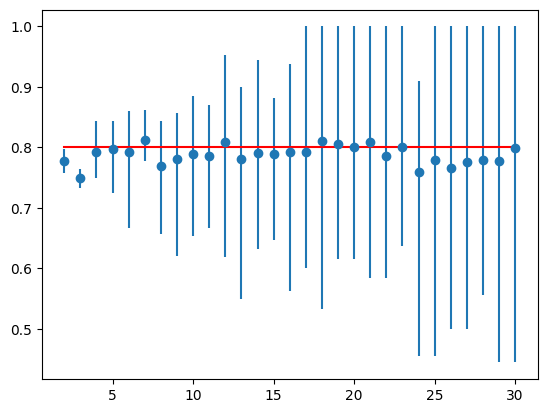

In [ ]:
find_fold(X_smo_c,y_smo_c,BaggingClassifier(random_state=rs))

In [ ]:
grid_searchCV(bagg_params1, X_smo_c, y_smo_c, 7)

/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
28 fits failed out of a total of 35.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
7 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_bagging.py", line 326, in fit
    self._validate_params()
  File "/usr/local/lib/python3.9/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.9/dist-packages/sklearn/utils/_par

,model,best_score,best_params
0,Bagging,0.851673,"{'max_features': 1.0, 'max_samples': 0.4, 'n_e..."


RF

In [ ]:
rf_params = {'Random Forest': {
        'model': RandomForestClassifier(random_state=rs),
        'params': {
            'n_estimators' : [10, 25, 100, 150, 200],
            'max_features' : ['auto', 'sqrt', 'log2'],
            'max_depth' : [4,5,6,7,8, 10, 12],
            'criterion' :['gini', 'entropy', 'log_loss'],

        }
    }}


rf_params1 = {'Random Forest': {
        'model': RandomForestClassifier(random_state=rs),
        'params': {
            'n_estimators' : [150,160,170,180,190],
            'max_features' : ['log2'],
            'max_depth' : [12,13,14,15,20,30,50],
            'criterion' :['gini'],

        }
    }}

Ideal: 0.832
> folds=2, accuracy=0.805 (0.805,0.805)
> folds=3, accuracy=0.824 (0.802,0.847)
> folds=4, accuracy=0.828 (0.797,0.844)
> folds=5, accuracy=0.828 (0.788,0.863)
> folds=6, accuracy=0.836 (0.791,0.884)
> folds=7, accuracy=0.844 (0.730,0.944)
> folds=8, accuracy=0.820 (0.719,0.969)
> folds=9, accuracy=0.856 (0.724,0.931)
> folds=10, accuracy=0.832 (0.731,0.960)
> folds=11, accuracy=0.829 (0.750,0.957)
> folds=12, accuracy=0.833 (0.682,1.000)
> folds=13, accuracy=0.828 (0.650,1.000)
> folds=14, accuracy=0.829 (0.632,0.944)
> folds=15, accuracy=0.828 (0.647,1.000)
> folds=16, accuracy=0.820 (0.562,0.938)
> folds=17, accuracy=0.828 (0.600,0.933)
> folds=18, accuracy=0.841 (0.600,1.000)
> folds=19, accuracy=0.825 (0.692,1.000)
> folds=20, accuracy=0.844 (0.615,1.000)
> folds=21, accuracy=0.864 (0.667,1.000)
> folds=22, accuracy=0.821 (0.667,1.000)
> folds=23, accuracy=0.829 (0.636,1.000)
> folds=24, accuracy=0.820 (0.455,1.000)
> folds=25, accuracy=0.821 (0.455,1.000)
> folds=26,

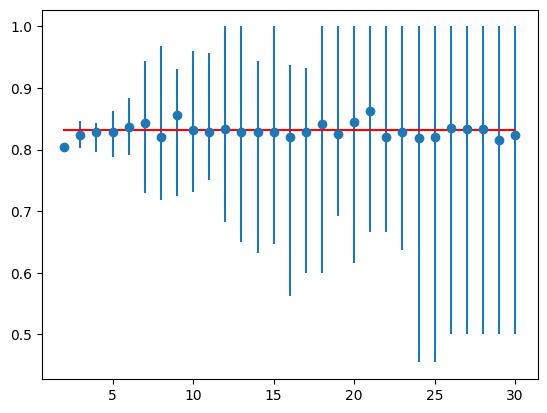

In [ ]:
find_fold(X_smo_c,y_smo_c,RandomForestClassifier(random_state=rs))

In [ ]:
grid_searchCV(rf_params1, X_smo_c, y_smo_c, 10)

,model,best_score,best_params
0,Random Forest,0.855385,"{'criterion': 'gini', 'max_depth': 12, 'max_fe..."


MLP

In [ ]:
mlp_params = {'MLP' : {
        'model' : MLPClassifier(random_state=rs),
        'params':{
            'hidden_layer_sizes': [(1,),(5,),(10,),(20,),(50,), (100,)],
            'activation': ['identity', 'logistic','tanh', 'relu'],
            'solver': ['lbfgs','sgd'],
            'alpha': [0.0001, 0.001, 0.01, 0.1 ],
            'learning_rate': ['constant','adaptive'],
            'max_iter' : [100,200, 300,400]
        }
    }}

#'activation': 'identity', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'max_iter': 300, 'solver': 'sgd'

mlp_params1 = {'MLP' : {
        'model' : MLPClassifier(random_state=rs),
        'params':{
            'hidden_layer_sizes': [(100,)],
            'activation': ['identity'],
            'solver': ['sgd'],
            'alpha': [0.0001],
            'learning_rate': ['constant'],
            'max_iter' : [500]
        }
    }}


Ideal: 0.848
> folds=2, accuracy=0.836 (0.836,0.836)
> folds=3, accuracy=0.828 (0.812,0.837)
> folds=4, accuracy=0.828 (0.812,0.844)
> folds=5, accuracy=0.812 (0.784,0.846)
> folds=6, accuracy=0.820 (0.721,0.884)
> folds=7, accuracy=0.820 (0.750,0.917)
> folds=8, accuracy=0.840 (0.750,0.969)
> folds=9, accuracy=0.832 (0.714,0.929)
> folds=10, accuracy=0.832 (0.680,0.923)
> folds=11, accuracy=0.836 (0.739,0.957)
> folds=12, accuracy=0.839 (0.714,1.000)
> folds=13, accuracy=0.844 (0.700,1.000)
> folds=14, accuracy=0.832 (0.667,0.944)
> folds=15, accuracy=0.844 (0.647,0.941)
> folds=16, accuracy=0.844 (0.625,1.000)
> folds=17, accuracy=0.851 (0.667,1.000)
> folds=18, accuracy=0.848 (0.643,1.000)
> folds=19, accuracy=0.843 (0.615,1.000)
> folds=20, accuracy=0.855 (0.583,1.000)
> folds=21, accuracy=0.847 (0.583,1.000)
> folds=22, accuracy=0.851 (0.636,1.000)
> folds=23, accuracy=0.851 (0.636,1.000)
> folds=24, accuracy=0.844 (0.545,1.000)
> folds=25, accuracy=0.852 (0.600,1.000)
> folds=26,

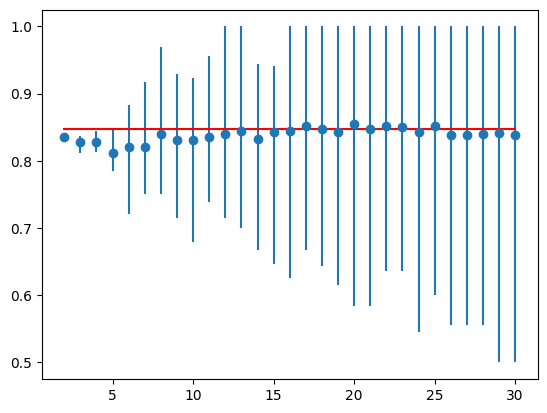

In [ ]:
find_fold(X_smo_c,y_smo_c,MLPClassifier(random_state=rs))

In [ ]:
grid_searchCV(mlp_params1, X_smo_c, y_smo_c, 13)

,model,best_score,best_params
0,MLP,0.843725,"{'activation': 'identity', 'alpha': 0.0001, 'h..."


XGB

In [ ]:
xgb_params = {'XGB' : {
        'model': XGBClassifier(random_state=rs),
        'params': {
            'reg_alpha':[1e-5, 1e-2, 0.1, 0.5, 1],
            'subsample':[i/10.0 for i in range(0,6)],
            'colsample_bytree':[i/10.0 for i in range(0,6)],
            'gamma':[i/10.0 for i in range(0,5)],
            'max_depth':[3,4,5,6],
            'min_child_weight': [3,4,5,6]

        }
    }}

Ideal: 0.773
> folds=2, accuracy=0.793 (0.781,0.805)
> folds=3, accuracy=0.793 (0.756,0.824)
> folds=4, accuracy=0.805 (0.766,0.844)
> folds=5, accuracy=0.797 (0.745,0.882)
> folds=6, accuracy=0.789 (0.738,0.884)
> folds=7, accuracy=0.770 (0.676,0.838)
> folds=8, accuracy=0.805 (0.688,0.906)
> folds=9, accuracy=0.786 (0.724,0.893)
> folds=10, accuracy=0.797 (0.692,0.920)
> folds=11, accuracy=0.778 (0.625,0.913)
> folds=12, accuracy=0.790 (0.636,0.909)
> folds=13, accuracy=0.797 (0.650,0.947)
> folds=14, accuracy=0.809 (0.684,0.944)
> folds=15, accuracy=0.793 (0.647,0.941)
> folds=16, accuracy=0.785 (0.438,1.000)
> folds=17, accuracy=0.793 (0.533,0.933)
> folds=18, accuracy=0.790 (0.600,0.929)
> folds=19, accuracy=0.783 (0.571,1.000)
> folds=20, accuracy=0.788 (0.462,0.923)
> folds=21, accuracy=0.800 (0.500,1.000)
> folds=22, accuracy=0.796 (0.583,1.000)
> folds=23, accuracy=0.777 (0.364,1.000)
> folds=24, accuracy=0.796 (0.455,1.000)
> folds=25, accuracy=0.794 (0.455,1.000)
> folds=26,

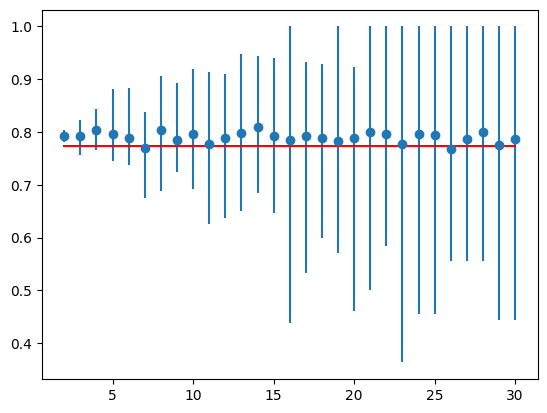

In [ ]:
find_fold(X_smo_c,y_smo_c,XGBClassifier(random_state=rs))

In [ ]:
grid_searchCV(xgb_params, X_res_c, y_res_c, 7)

,model,best_score,best_params
0,XGB,0.847919,"{'colsample_bytree': 0.4, 'gamma': 0.0, 'max_d..."


KNN

In [ ]:
knn_params = {'KNN' : {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [i+1 for i in range(0,100)]

        }
    }
}

Ideal: 0.824
> folds=2, accuracy=0.785 (0.766,0.805)
> folds=3, accuracy=0.809 (0.767,0.835)
> folds=4, accuracy=0.828 (0.766,0.875)
> folds=5, accuracy=0.828 (0.804,0.863)
> folds=6, accuracy=0.832 (0.786,0.952)
> folds=7, accuracy=0.821 (0.757,0.944)
> folds=8, accuracy=0.828 (0.750,0.906)
> folds=9, accuracy=0.828 (0.750,0.929)
> folds=10, accuracy=0.832 (0.720,1.000)
> folds=11, accuracy=0.813 (0.708,1.000)
> folds=12, accuracy=0.813 (0.682,0.955)
> folds=13, accuracy=0.829 (0.700,1.000)
> folds=14, accuracy=0.817 (0.684,1.000)
> folds=15, accuracy=0.824 (0.647,0.944)
> folds=16, accuracy=0.812 (0.688,0.938)
> folds=17, accuracy=0.816 (0.667,1.000)
> folds=18, accuracy=0.821 (0.667,1.000)
> folds=19, accuracy=0.813 (0.643,1.000)
> folds=20, accuracy=0.816 (0.692,1.000)
> folds=21, accuracy=0.821 (0.692,1.000)
> folds=22, accuracy=0.814 (0.667,1.000)
> folds=23, accuracy=0.817 (0.545,1.000)
> folds=24, accuracy=0.817 (0.545,1.000)
> folds=25, accuracy=0.821 (0.545,1.000)
> folds=26,

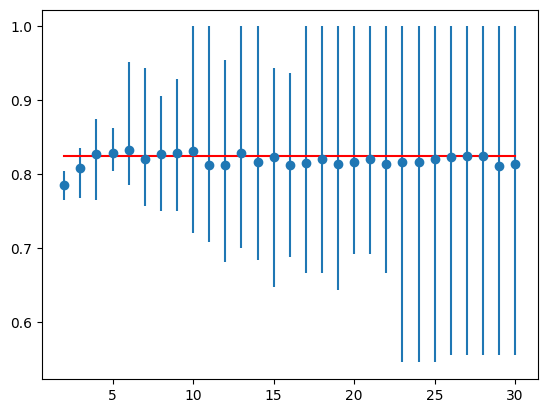

In [ ]:
find_fold(X_smo_c,y_smo_c,KNeighborsClassifier())

In [ ]:
grid_searchCV(knn_params, X_smo_c, y_smo_c, 15)

,model,best_score,best_params
0,KNN,0.851416,{'n_neighbors': 20}


In [ ]:
"""
'C': 0.01, 'max_iter': 21, 'penalty': 'l2', 'solver': 'saga'
'var_smoothing': 0.1873817422860384}
ccp_alpha': 0.01, 'criterion': 'gini', 'max_depth': 12, 'max_features': 'log2
C': 1.2, 'gamma': 0.4, 'kernel': 'rbf'
learning_rate': 0.1, 'max_depth': 1, 'n_estimators': 70
'max_features': 1.0, 'max_samples': 0.4, 'n_estimators': 25
criterion': 'gini', 'max_depth': 12, 'max_features': 'log2', 'n_estimators': 150
{'activation': 'identity', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'max_iter': 500, 'solver': 'sgd'}
colsample_bytree': 0.4, 'gamma': 0.0, 'max_depth': 4, 'min_child_weight': 3, 'reg_alpha': 0.5, 'subsample': 0.5
'n_neighbors': 20
"""

#Tuned Clevland SMOTE

In [ ]:
LR_GS = LogisticRegression( C=0.01, max_iter=21, penalty='l2', solver='saga',random_state=rs)
NB_GS =  GaussianNB(var_smoothing= 0.1873817422860384)
DT_GS =DecisionTreeClassifier(criterion='gini', max_depth=12, ccp_alpha=0.01, max_features='log2',random_state=rs )
SVLC_GS =SVC(C=1.2, gamma=0.4, kernel='rbf',random_state=rs)
GB_GS = GradientBoostingClassifier(learning_rate=0.1, max_depth=1, n_estimators=70,random_state=rs )
ADA_GS = AdaBoostClassifier(learning_rate=0.04, n_estimators=200,random_state=rs)
Bagg_GS = BaggingClassifier(max_features=1.0, max_samples=0.4, n_estimators=25,random_state=rs)
RF_GS = RandomForestClassifier(criterion='gini', max_depth=12, max_features='log2', n_estimators=150,random_state=rs)
MLP_GS = MLPClassifier(activation='identity', alpha=0.0001, hidden_layer_sizes=(100,), learning_rate='constant', max_iter=600, solver='sgd',random_state=rs)
XGB_GS =  XGBClassifier( colsample_bytree = 0.4, gamma= 0.0, max_depth= 4, min_child_weight= 3, reg_alpha=0.5, subsample= 0.5,random_state=rs)
KNN_GS = KNeighborsClassifier(n_neighbors=20)

LR_pipeGS = Pipeline([
                    ("logistic regression", LR_GS)])

NB_pipeGS = Pipeline([
                    ("NB Gaussian", NB_GS)])

DT_pipeGS = Pipeline([
                    ("Decision Tree", DT_GS)])

SVLC_pipeGS = Pipeline([
                    ("SVLC", SVLC_GS)])

GB_pipeGS = Pipeline([
                    ("GradientBoosting", GB_GS)])

ADA_pipeGS = Pipeline([
                    ("ADABoost", ADA_GS)])

Bagg_pipeGS = Pipeline([
                    ("Bagging", Bagg_GS)])

RF_pipeGS = Pipeline([
                    ("Random Forest", RF_GS)])

MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])


XGB_pipeGS = Pipeline([
                    ("XGB", XGB_GS)])


KNN_pipeGS = Pipeline([
                    ("KNN", KNN_GS)])

#all pipes
all_pipesGS = [LR_pipeGS, NB_pipeGS, DT_pipeGS, SVLC_pipeGS, GB_pipeGS, ADA_pipeGS, Bagg_pipeGS, RF_pipeGS, MLP_pipeGS, XGB_pipeGS, KNN_pipeGS]

In [ ]:
tuned_clevland_train= model_training(all_pipesGS, X_smo_c, y_smo_c)

LR Test Accuracy: 93.0
LR Test f1_score: 93.0
LR Test precision_score: 94.0
LR Test recall_score: 93.0


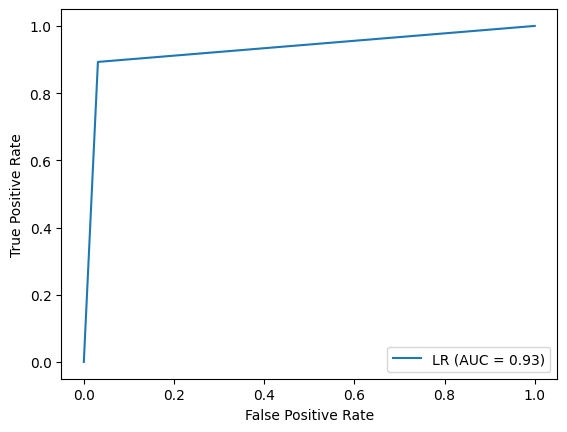

NB Test Accuracy: 92.0
NB Test f1_score: 91.0
NB Test precision_score: 93.0
NB Test recall_score: 91.0


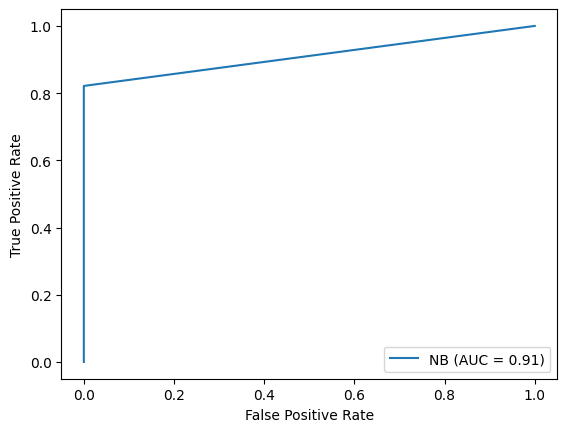

DT Test Accuracy: 88.0
DT Test f1_score: 88.0
DT Test precision_score: 91.0
DT Test recall_score: 88.0


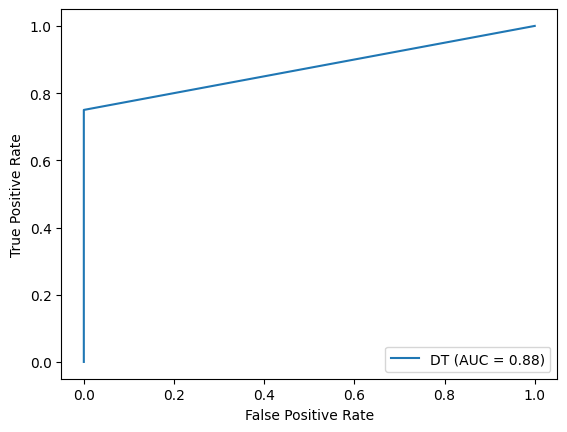

SVLC Test Accuracy: 92.0
SVLC Test f1_score: 92.0
SVLC Test precision_score: 92.0
SVLC Test recall_score: 91.0


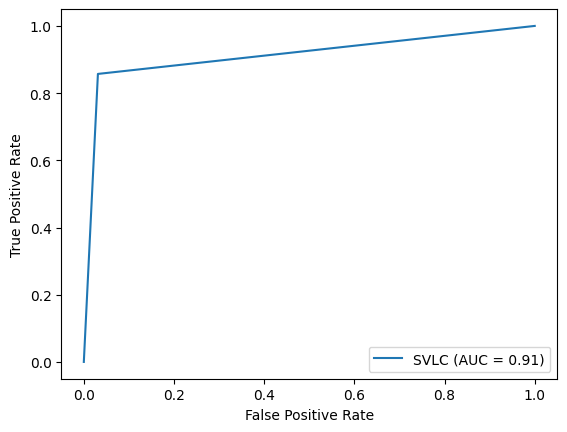

GB Test Accuracy: 88.0
GB Test f1_score: 88.0
GB Test precision_score: 90.0
GB Test recall_score: 88.0


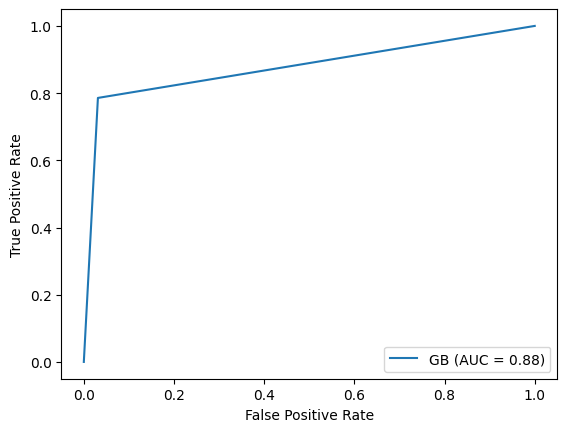

ADA Test Accuracy: 87.0
ADA Test f1_score: 86.0
ADA Test precision_score: 88.0
ADA Test recall_score: 86.0


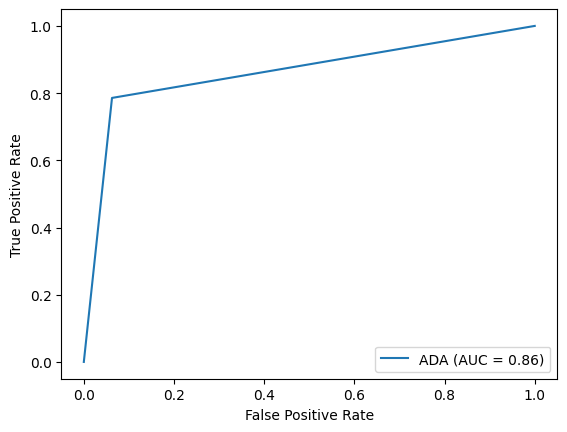

Bagg Test Accuracy: 83.0
Bagg Test f1_score: 83.0
Bagg Test precision_score: 84.0
Bagg Test recall_score: 83.0


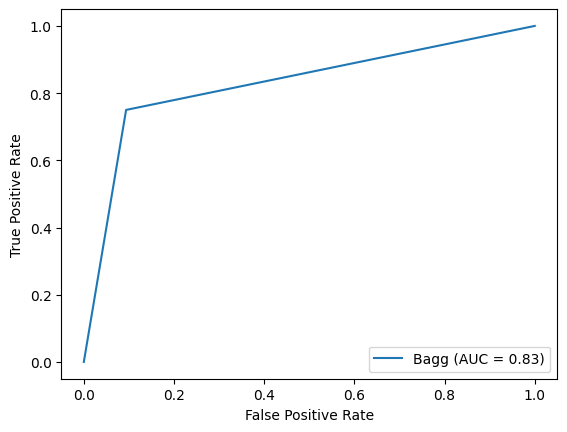

RF Test Accuracy: 88.0
RF Test f1_score: 88.0
RF Test precision_score: 91.0
RF Test recall_score: 88.0


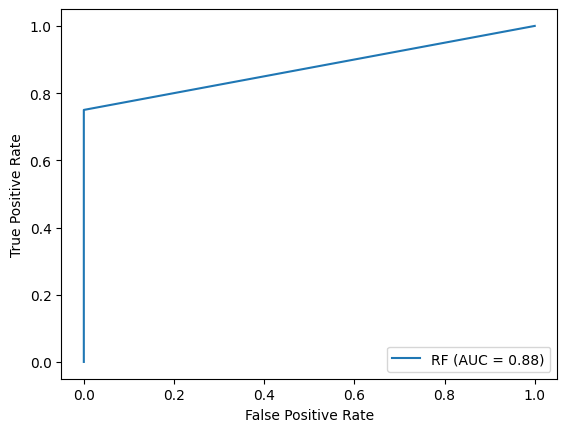

MLP Test Accuracy: 95.0
MLP Test f1_score: 95.0
MLP Test precision_score: 95.0
MLP Test recall_score: 95.0


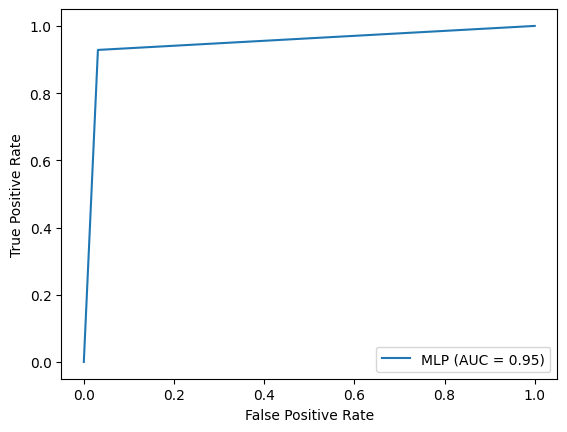

XGB Test Accuracy: 90.0
XGB Test f1_score: 90.0
XGB Test precision_score: 91.0
XGB Test recall_score: 90.0


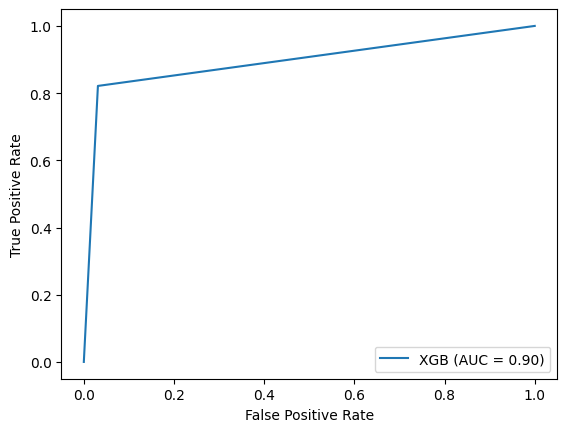

KNN Test Accuracy: 92.0
KNN Test f1_score: 91.0
KNN Test precision_score: 93.0
KNN Test recall_score: 91.0


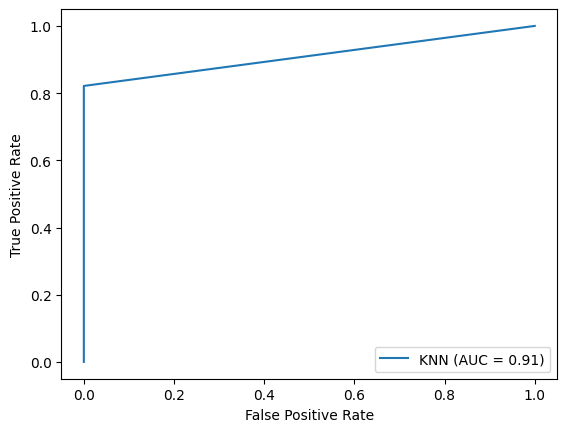

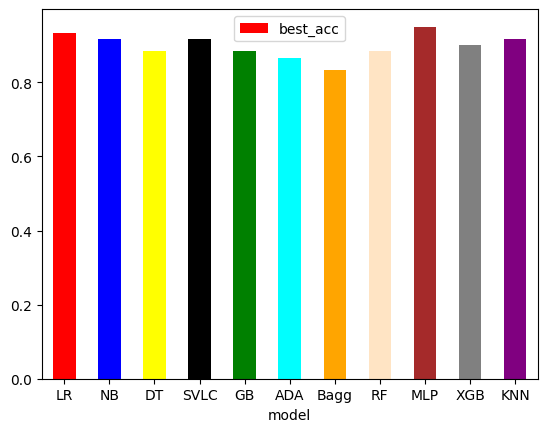

In [ ]:
tuned_smo_clevland = model_testing(PipelineDict, tuned_clevland_train, X_test_c, y_test_c)

bar plot comparison

,index,model,best_acc,col
0,0,LR,0.933333,base_model
1,1,NB,0.883333,base_model
2,2,DT,0.833333,base_model
3,3,SVLC,0.933333,base_model
4,4,GB,0.850000,base_model
5,5,ADA,0.850000,base_model
6,6,Bagg,0.816667,base_model
7,7,RF,0.866667,base_model
8,8,MLP,0.933333,base_model
9,9,XGB,0.850000,base_model


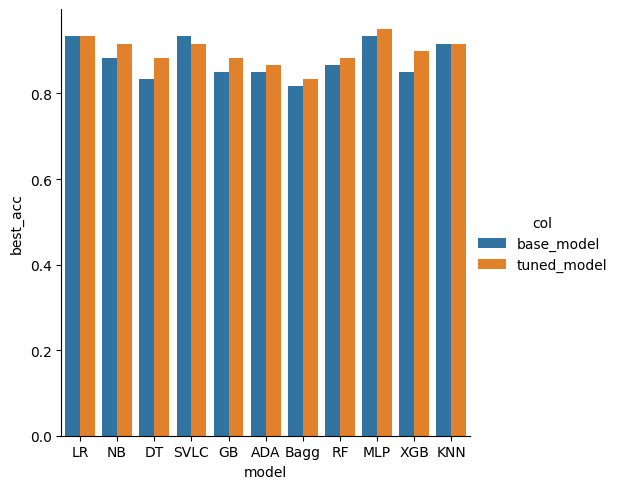

In [ ]:
bar_plot(base_smote_clevland, tuned_smo_clevland, 'tab10')

In [ ]:
tuned_smo_clevland_cv = cv_evaluation(PipelineDict, all_pipesGS, X_smo_cleve, y_smo_cleve)

In [ ]:
base_ros_cv_statlog
base_smote_clevland_cv
base_ros_merge_cv
tuned_ros_statlog_cv
tuned_smo_clevland_cv

In [ ]:
tuned_smo_clevland_cv

,CV,model,best_acc
0,LOOC,LR,83.0
1,LOOC,NB,85.0
2,LOOC,DT,76.0
3,LOOC,SVLC,85.0
4,LOOC,GB,84.0
5,LOOC,ADA,85.0
6,LOOC,Bagg,84.0
7,LOOC,RF,84.0
8,LOOC,MLP,84.0
9,LOOC,XGB,85.0


/usr/local/lib/python3.8/dist-packages/seaborn/categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


,index,CV,model,best_acc,col
0,0,LOOC,LR,85.0,base_model
1,1,LOOC,NB,83.0,base_model
2,2,LOOC,DT,75.0,base_model
3,3,LOOC,SVLC,82.0,base_model
4,4,LOOC,GB,82.0,base_model
5,5,LOOC,ADA,83.0,base_model
6,6,LOOC,Bagg,83.0,base_model
7,7,LOOC,RF,84.0,base_model
8,8,LOOC,MLP,85.0,base_model
9,9,LOOC,XGB,81.0,base_model


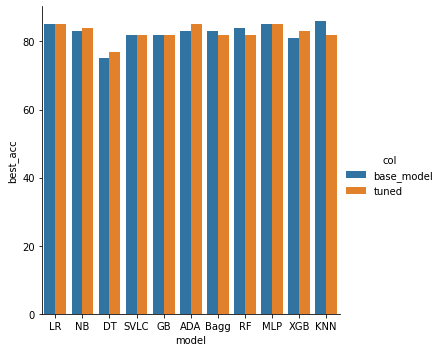

In [ ]:
bar_plot_cv(base_ros_cleve_cv,tuned_smo_clevland_cv)

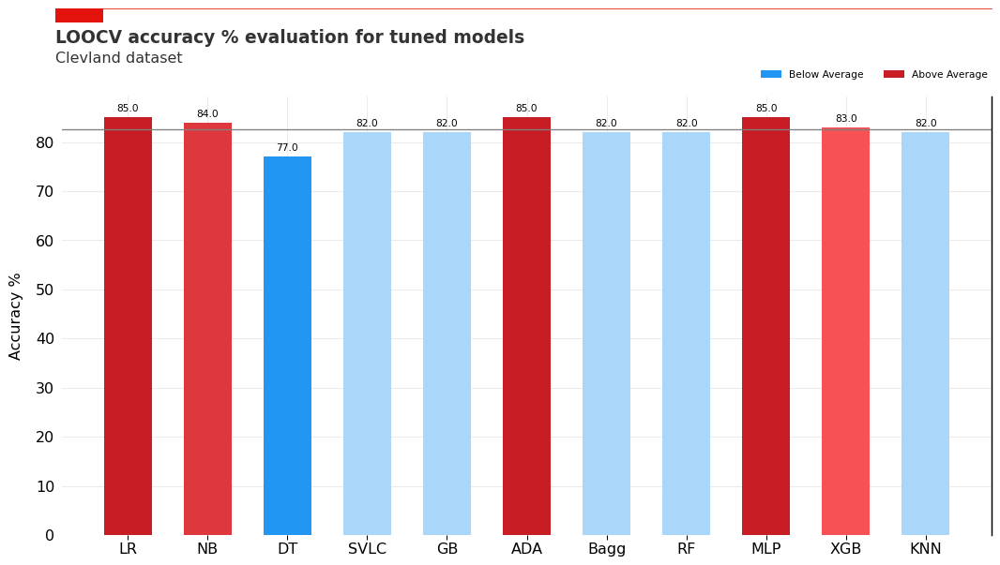

In [ ]:
bar_plot_update(tuned_smo_clevland_cv, 'model', 'best_acc', 'Clevland')

#GridSearchCV Merged

LR

Ideal: 0.870
> folds=2, accuracy=0.870 (0.853,0.888)
> folds=3, accuracy=0.872 (0.856,0.880)
> folds=4, accuracy=0.864 (0.827,0.885)
> folds=5, accuracy=0.873 (0.840,0.903)
> folds=6, accuracy=0.869 (0.817,0.894)
> folds=7, accuracy=0.867 (0.809,0.900)
> folds=8, accuracy=0.865 (0.782,0.897)
> folds=9, accuracy=0.862 (0.797,0.913)
> folds=10, accuracy=0.865 (0.774,0.903)
> folds=11, accuracy=0.864 (0.807,0.911)
> folds=12, accuracy=0.861 (0.731,0.904)
> folds=13, accuracy=0.865 (0.792,0.938)
> folds=14, accuracy=0.862 (0.733,0.933)
> folds=15, accuracy=0.869 (0.786,0.929)
> folds=16, accuracy=0.864 (0.744,0.923)
> folds=17, accuracy=0.867 (0.784,0.946)
> folds=18, accuracy=0.864 (0.743,0.914)
> folds=19, accuracy=0.864 (0.788,0.909)
> folds=20, accuracy=0.867 (0.742,0.935)
> folds=21, accuracy=0.862 (0.767,0.933)
> folds=22, accuracy=0.862 (0.750,0.964)
> folds=23, accuracy=0.864 (0.778,0.963)
> folds=24, accuracy=0.864 (0.731,0.962)
> folds=25, accuracy=0.864 (0.760,0.960)
> folds=26,

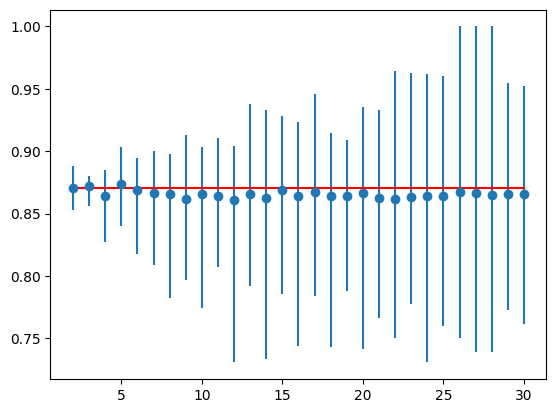

In [ ]:
find_fold(X_res_a,y_res_a,LogisticRegression(random_state=rs))

In [ ]:
LR_params = {
    'Logistic_regression' : {
        'model': LogisticRegression(random_state=rs),
        'params': {
            'max_iter' : [15, 20, 30, 40, 50, 100],
            'penalty' : ['l1', 'l2'],
            'C': [0.01,.09, 1, 1.1, 1.2, 1.5, 1.8, 2],
            'solver' : ['liblinear', 'saga']

        }
    }}

#


LR_params1 = {
    'Logistic_regression' : {
        'model': LogisticRegression(random_state=rs),
        'params': {
            'max_iter' : [20],
            'penalty' : ['l2'],
            'C': [0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09],
            'solver' : ['saga']

        }
    }}

In [ ]:
grid_searchCV(LR_params1, X_res_a, y_res_a, 2)

,model,best_score,best_params
0,Logistic_regression,0.878205,"{'C': 0.05, 'max_iter': 20, 'penalty': 'l2', '..."


NB

In [ ]:
nb_params = {'Naive_bayes_gaussian': {
        'model': GaussianNB(),
        'params': {
            'var_smoothing': np.logspace(0,-9, num=100)
        }
    }}

nb_label = {1: 'NB'}

Ideal: 0.845
> folds=2, accuracy=0.841 (0.837,0.846)
> folds=3, accuracy=0.845 (0.832,0.865)
> folds=4, accuracy=0.837 (0.808,0.859)
> folds=5, accuracy=0.840 (0.808,0.888)
> folds=6, accuracy=0.841 (0.798,0.894)
> folds=7, accuracy=0.840 (0.820,0.889)
> folds=8, accuracy=0.840 (0.744,0.897)
> folds=9, accuracy=0.843 (0.797,0.886)
> folds=10, accuracy=0.844 (0.774,0.905)
> folds=11, accuracy=0.845 (0.768,0.912)
> folds=12, accuracy=0.841 (0.750,0.942)
> folds=13, accuracy=0.841 (0.771,0.958)
> folds=14, accuracy=0.840 (0.756,0.933)
> folds=15, accuracy=0.843 (0.786,0.905)
> folds=16, accuracy=0.845 (0.744,0.949)
> folds=17, accuracy=0.845 (0.757,0.946)
> folds=18, accuracy=0.843 (0.714,0.914)
> folds=19, accuracy=0.841 (0.727,0.939)
> folds=20, accuracy=0.841 (0.742,0.968)
> folds=21, accuracy=0.841 (0.690,0.933)
> folds=22, accuracy=0.841 (0.679,0.964)
> folds=23, accuracy=0.844 (0.704,0.963)
> folds=24, accuracy=0.841 (0.731,0.962)
> folds=25, accuracy=0.843 (0.720,0.960)
> folds=26,

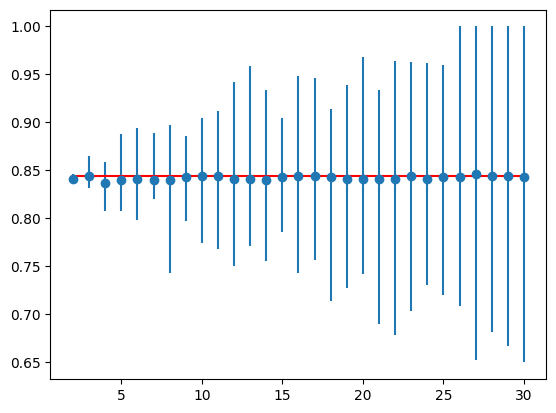

In [ ]:
find_fold(X_res_a,y_res_a,GaussianNB())

In [ ]:
grid_searchCV(nb_params, X_res_a, y_res_a, 11)

,model,best_score,best_params
0,Naive_bayes_gaussian,0.868677,{'var_smoothing': 1.0}


DT

In [ ]:
dt_params = {'Decision_tree': {
        'model': DecisionTreeClassifier(random_state=rs),
        'params': {
            'criterion': ['gini','entropy'],
            'max_depth' : [2,4,6,8,10,12, 15, 20],
            'ccp_alpha': [0.1, .01, .001, .0001],
            'max_features': ['auto', 'sqrt', 'log2']



        }
    }}

#ccp_alpha': 0.01, 'criterion': 'gini', 'max_depth': 4, 'max_features': 'auto'

dt_params1 = {'Decision_tree': {
        'model': DecisionTreeClassifier(random_state=rs),
        'params': {
            'criterion': ['gini'],
            'max_depth' : [3,4,5],
            'ccp_alpha': [.01, .02, .03, .04, .05],
            'max_features': ['auto']



        }
    }}

Ideal: 0.832
> folds=2, accuracy=0.784 (0.766,0.801)
> folds=3, accuracy=0.798 (0.793,0.803)
> folds=4, accuracy=0.822 (0.795,0.846)
> folds=5, accuracy=0.817 (0.768,0.855)
> folds=6, accuracy=0.825 (0.712,0.875)
> folds=7, accuracy=0.828 (0.775,0.867)
> folds=8, accuracy=0.819 (0.731,0.872)
> folds=9, accuracy=0.832 (0.768,0.928)
> folds=10, accuracy=0.851 (0.742,0.905)
> folds=11, accuracy=0.842 (0.754,0.895)
> folds=12, accuracy=0.841 (0.712,0.904)
> folds=13, accuracy=0.825 (0.771,0.896)
> folds=14, accuracy=0.826 (0.689,0.909)
> folds=15, accuracy=0.824 (0.738,0.902)
> folds=16, accuracy=0.824 (0.692,0.923)
> folds=17, accuracy=0.824 (0.730,0.919)
> folds=18, accuracy=0.833 (0.714,0.914)
> folds=19, accuracy=0.812 (0.667,0.909)
> folds=20, accuracy=0.825 (0.677,0.968)
> folds=21, accuracy=0.840 (0.655,0.931)
> folds=22, accuracy=0.825 (0.714,0.931)
> folds=23, accuracy=0.824 (0.704,0.926)
> folds=24, accuracy=0.821 (0.692,0.962)
> folds=25, accuracy=0.820 (0.560,0.920)
> folds=26,

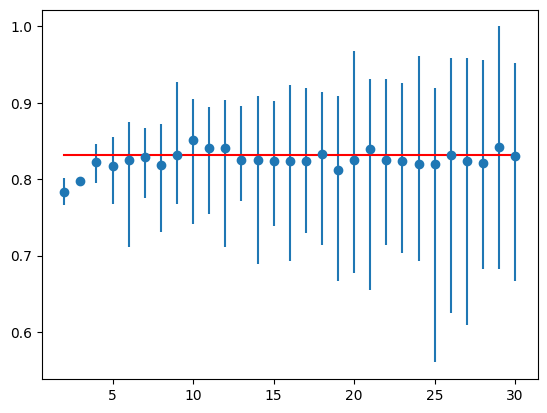

In [ ]:
find_fold(X_res_a,y_res_a,DecisionTreeClassifier(random_state=rs))

In [ ]:
grid_searchCV(dt_params1, X_res_a, y_res_a, 9)

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9

,model,best_score,best_params
0,Decision_tree,0.854083,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_..."


SVLC

In [ ]:
svc_params = {'SVC': {
        'model': SVC(random_state=rs),
        'params' : {
                'C': [0.001,0.01,0.1,0.8,0.9,1,1.1,1.2,1.3,1.4],
                'kernel':['linear', 'rbf' ,'poly'],
                'gamma' :[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,1.1,1.2,1.3,1.4]

        }
    }}

svc_params1 = {'SVC': {
        'model': SVC(random_state=rs),
        'params' : {
                'C': [0.001, 0.002, 0.005, 0.008],
                'kernel':['poly' ],
                'gamma' :[0.001, 0.01, 1]

        }
    }}

Ideal: 0.856
> folds=2, accuracy=0.853 (0.843,0.862)
> folds=3, accuracy=0.865 (0.851,0.885)
> folds=4, accuracy=0.861 (0.840,0.878)
> folds=5, accuracy=0.865 (0.832,0.888)
> folds=6, accuracy=0.869 (0.837,0.885)
> folds=7, accuracy=0.859 (0.820,0.889)
> folds=8, accuracy=0.862 (0.782,0.897)
> folds=9, accuracy=0.864 (0.797,0.913)
> folds=10, accuracy=0.861 (0.774,0.889)
> folds=11, accuracy=0.861 (0.807,0.893)
> folds=12, accuracy=0.862 (0.769,0.904)
> folds=13, accuracy=0.862 (0.812,0.917)
> folds=14, accuracy=0.859 (0.756,0.909)
> folds=15, accuracy=0.859 (0.786,0.902)
> folds=16, accuracy=0.862 (0.718,0.897)
> folds=17, accuracy=0.864 (0.784,0.919)
> folds=18, accuracy=0.861 (0.714,0.941)
> folds=19, accuracy=0.862 (0.788,0.909)
> folds=20, accuracy=0.862 (0.710,0.906)
> folds=21, accuracy=0.851 (0.800,0.933)
> folds=22, accuracy=0.856 (0.750,0.931)
> folds=23, accuracy=0.856 (0.778,0.929)
> folds=24, accuracy=0.862 (0.731,0.962)
> folds=25, accuracy=0.859 (0.760,0.960)
> folds=26,

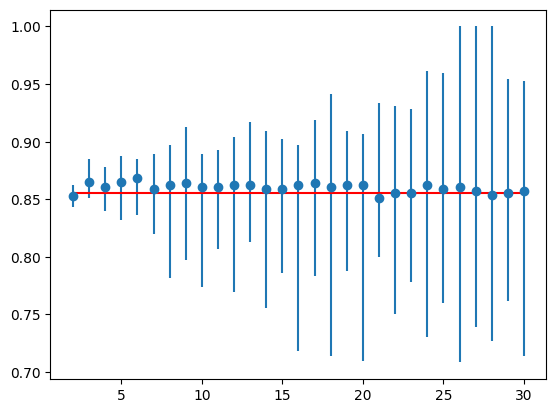

In [ ]:
find_fold(X_res_a,y_res_a,SVC(random_state=rs))

In [ ]:
grid_searchCV(svc_params1, X_res_a, y_res_a, 7)

,model,best_score,best_params
0,SVC,0.866952,"{'C': 0.001, 'gamma': 1, 'kernel': 'poly'}"


GB

In [ ]:
gb_params = {'GB': {
        'model': GradientBoostingClassifier(random_state=rs),
        'params': {
            "n_estimators":[50,100,110,125,150,175,200],
            "max_depth":[1,3,5,7,9, 10, 15, 20],
            "learning_rate":[0.1,0.5,0.8,1,1.2,1.5,1.7,2]
        }
    }}

gb_params1 = {'GB': {
        'model': GradientBoostingClassifier(random_state=rs),
        'params': {
            "n_estimators":[10,15,25,50,75],
            "max_depth":[2,3,4],
            "learning_rate":[0.1,0.2,0.4, 0.6, 0.8]
        }
    }}

Ideal: 0.870
> folds=2, accuracy=0.872 (0.849,0.894)
> folds=3, accuracy=0.870 (0.851,0.899)
> folds=4, accuracy=0.875 (0.840,0.923)
> folds=5, accuracy=0.867 (0.840,0.896)
> folds=6, accuracy=0.869 (0.817,0.923)
> folds=7, accuracy=0.856 (0.820,0.910)
> folds=8, accuracy=0.864 (0.782,0.897)
> folds=9, accuracy=0.870 (0.812,0.914)
> folds=10, accuracy=0.865 (0.774,0.919)
> folds=11, accuracy=0.861 (0.807,0.911)
> folds=12, accuracy=0.869 (0.769,0.904)
> folds=13, accuracy=0.873 (0.792,0.917)
> folds=14, accuracy=0.867 (0.778,0.911)
> folds=15, accuracy=0.864 (0.810,0.905)
> folds=16, accuracy=0.862 (0.744,0.923)
> folds=17, accuracy=0.869 (0.784,0.944)
> folds=18, accuracy=0.874 (0.714,0.943)
> folds=19, accuracy=0.867 (0.727,0.939)
> folds=20, accuracy=0.872 (0.710,0.938)
> folds=21, accuracy=0.862 (0.793,0.933)
> folds=22, accuracy=0.861 (0.759,0.964)
> folds=23, accuracy=0.864 (0.778,0.926)
> folds=24, accuracy=0.865 (0.731,0.962)
> folds=25, accuracy=0.864 (0.760,0.920)
> folds=26,

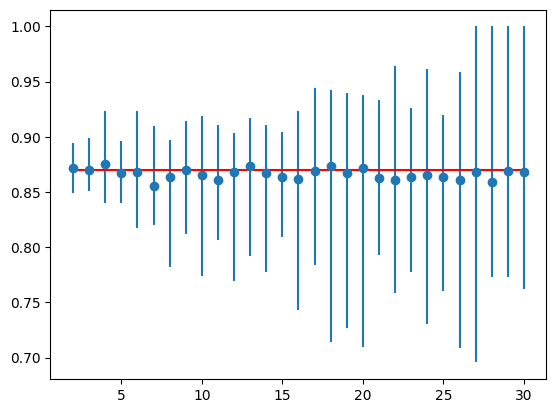

In [ ]:
find_fold(X_res_a,y_res_a,GradientBoostingClassifier(random_state=rs))

In [ ]:
grid_searchCV(gb_params1, X_res_a, y_res_a, 3)

,model,best_score,best_params
0,GB,0.878205,"{'learning_rate': 0.2, 'max_depth': 3, 'n_esti..."


ADA

In [ ]:
ada_params = {'ADA': {
        'model': AdaBoostClassifier(random_state=rs),
        'params': {
            "n_estimators":[100,150,200,250],
            "learning_rate":[0.001,0.01,0.05,0.07,0.08]
        }
    }}

Ideal: 0.837
> folds=2, accuracy=0.832 (0.798,0.865)
> folds=3, accuracy=0.833 (0.812,0.861)
> folds=4, accuracy=0.840 (0.788,0.897)
> folds=5, accuracy=0.841 (0.768,0.880)
> folds=6, accuracy=0.845 (0.808,0.885)
> folds=7, accuracy=0.829 (0.764,0.865)
> folds=8, accuracy=0.840 (0.731,0.897)
> folds=9, accuracy=0.845 (0.768,0.899)
> folds=10, accuracy=0.835 (0.726,0.903)
> folds=11, accuracy=0.845 (0.789,0.893)
> folds=12, accuracy=0.845 (0.750,0.904)
> folds=13, accuracy=0.837 (0.750,0.896)
> folds=14, accuracy=0.842 (0.733,0.933)
> folds=15, accuracy=0.842 (0.786,0.881)
> folds=16, accuracy=0.845 (0.692,0.923)
> folds=17, accuracy=0.843 (0.757,0.917)
> folds=18, accuracy=0.850 (0.714,0.941)
> folds=19, accuracy=0.843 (0.788,0.909)
> folds=20, accuracy=0.845 (0.677,0.903)
> folds=21, accuracy=0.837 (0.733,0.900)
> folds=22, accuracy=0.832 (0.724,0.929)
> folds=23, accuracy=0.848 (0.778,0.963)
> folds=24, accuracy=0.845 (0.731,0.962)
> folds=25, accuracy=0.837 (0.720,0.960)
> folds=26,

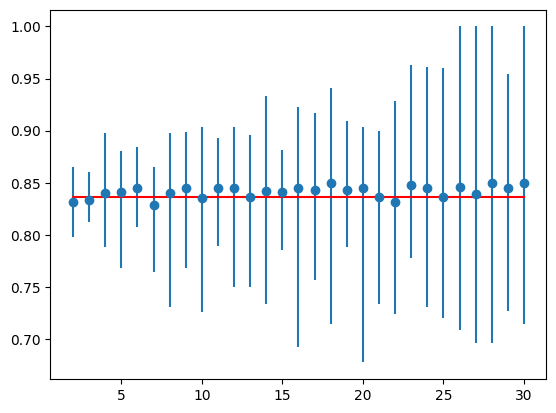

In [ ]:
find_fold(X_res_a,y_res_a,AdaBoostClassifier(random_state=rs))

In [ ]:
grid_searchCV(ada_params, X_res_a, y_res_a, 13)

,model,best_score,best_params
0,ADA,0.863782,"{'learning_rate': 0.05, 'n_estimators': 250}"


Bagg

In [ ]:
bagg_params = {'Bagging': {
        'model': BaggingClassifier(random_state=rs),
        'params': {
            'max_features': [0.1,0.2,0.3,0.4,0.5, 0.7, 1.0],
            'max_samples': [0.5, 0.7, 1.0, 1.1, 1.2, 1.3],
            'n_estimators': [10, 20, 30, 50, 100, 150, 200]
        }
    }}

Ideal: 0.849
> folds=2, accuracy=0.833 (0.817,0.849)
> folds=3, accuracy=0.840 (0.822,0.875)
> folds=4, accuracy=0.859 (0.833,0.891)
> folds=5, accuracy=0.840 (0.784,0.879)
> folds=6, accuracy=0.838 (0.798,0.885)
> folds=7, accuracy=0.853 (0.809,0.899)
> folds=8, accuracy=0.851 (0.744,0.910)
> folds=9, accuracy=0.862 (0.797,0.914)
> folds=10, accuracy=0.857 (0.742,0.887)
> folds=11, accuracy=0.845 (0.772,0.929)
> folds=12, accuracy=0.841 (0.769,0.904)
> folds=13, accuracy=0.856 (0.771,0.917)
> folds=14, accuracy=0.864 (0.778,0.977)
> folds=15, accuracy=0.849 (0.762,0.905)
> folds=16, accuracy=0.849 (0.692,0.923)
> folds=17, accuracy=0.858 (0.757,0.944)
> folds=18, accuracy=0.860 (0.686,0.971)
> folds=19, accuracy=0.846 (0.758,0.909)
> folds=20, accuracy=0.849 (0.656,0.935)
> folds=21, accuracy=0.861 (0.767,1.000)
> folds=22, accuracy=0.840 (0.714,0.931)
> folds=23, accuracy=0.849 (0.704,0.963)
> folds=24, accuracy=0.861 (0.692,1.000)
> folds=25, accuracy=0.857 (0.680,1.000)
> folds=26,

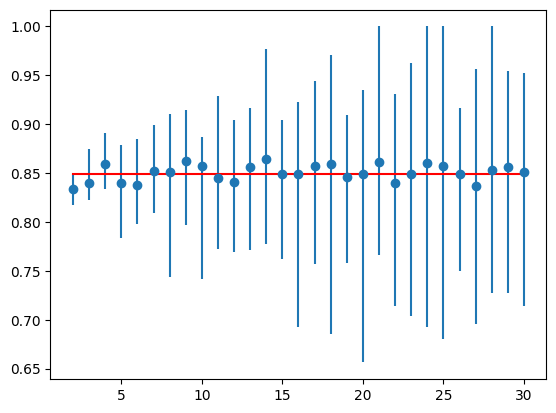

In [ ]:
find_fold(X_res_a,y_res_a,BaggingClassifier(random_state=rs))

In [ ]:
grid_searchCV(bagg_params, X_res_a, y_res_a, 15)

/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
2205 fits failed out of a total of 4410.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
735 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_bagging.py", line 326, in fit
    self._validate_params()
  File "/usr/local/lib/python3.9/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.9/dist-packages/sklearn/util

,model,best_score,best_params
0,Bagging,0.873558,"{'max_features': 0.7, 'max_samples': 0.7, 'n_e..."


RF

In [ ]:
rf_params = {'Random Forest': {
        'model': RandomForestClassifier(random_state=rs),
        'params': {
            'n_estimators' : [10, 25, 100, 150, 200],
            'max_features' : ['auto', 'sqrt', 'log2'],
            'max_depth' : [12,13,14,15,16,17,18,19,20],
            'criterion' :['gini', 'entropy','log_loss'],

        }
    }}

Ideal: 0.875
> folds=2, accuracy=0.875 (0.856,0.894)
> folds=3, accuracy=0.883 (0.865,0.899)
> folds=4, accuracy=0.878 (0.827,0.904)
> folds=5, accuracy=0.872 (0.840,0.895)
> folds=6, accuracy=0.870 (0.808,0.904)
> folds=7, accuracy=0.865 (0.820,0.910)
> folds=8, accuracy=0.877 (0.782,0.923)
> folds=9, accuracy=0.873 (0.812,0.929)
> folds=10, accuracy=0.873 (0.774,0.921)
> folds=11, accuracy=0.869 (0.825,0.946)
> folds=12, accuracy=0.877 (0.788,0.923)
> folds=13, accuracy=0.872 (0.833,0.917)
> folds=14, accuracy=0.874 (0.756,0.911)
> folds=15, accuracy=0.877 (0.810,0.927)
> folds=16, accuracy=0.873 (0.744,0.949)
> folds=17, accuracy=0.883 (0.811,0.972)
> folds=18, accuracy=0.869 (0.714,0.943)
> folds=19, accuracy=0.865 (0.758,0.939)
> folds=20, accuracy=0.870 (0.710,0.938)
> folds=21, accuracy=0.869 (0.800,0.966)
> folds=22, accuracy=0.873 (0.786,1.000)
> folds=23, accuracy=0.870 (0.741,1.000)
> folds=24, accuracy=0.872 (0.731,0.962)
> folds=25, accuracy=0.869 (0.720,0.960)
> folds=26,

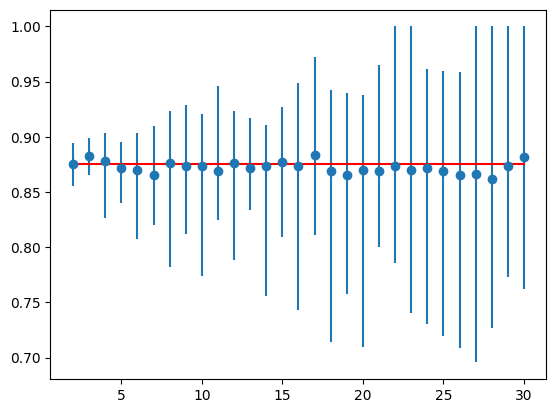

In [ ]:
find_fold(X_res_a,y_res_a,RandomForestClassifier(random_state=rs))

In [ ]:
grid_searchCV(rf_params, X_res_a, y_res_a, 2)

/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForest

,model,best_score,best_params
0,Random Forest,0.884615,"{'criterion': 'entropy', 'max_depth': 12, 'max..."


MLP

In [ ]:
mlp_params = {'MLP' : {
        'model' : MLPClassifier(random_state=rs),
        'params':{
            'hidden_layer_sizes': [(5,),(10,),(20,),(50,), (100,)],
            'activation': ['identity', 'logistic','tanh', 'relu'],
            'solver': ['lbfgs','sgd', 'adam'],
            'alpha': [0.001, 0.01, 0.1 ],
            'learning_rate': ['constant','adaptive'],
            'max_iter' : [100,300, 500]
        }
    }}

# activation': 'relu', 'alpha': 0.1, 'hidden_layer_sizes': (20,), 'learning_rate': 'constant', 'max_iter': 100, 'solver': 'lbfgs'


Ideal: 0.870
> folds=2, accuracy=0.867 (0.856,0.878)
> folds=3, accuracy=0.857 (0.822,0.885)
> folds=4, accuracy=0.869 (0.833,0.904)
> folds=5, accuracy=0.875 (0.824,0.911)
> folds=6, accuracy=0.873 (0.817,0.904)
> folds=7, accuracy=0.867 (0.820,0.910)
> folds=8, accuracy=0.865 (0.769,0.923)
> folds=9, accuracy=0.870 (0.797,0.913)
> folds=10, accuracy=0.867 (0.774,0.903)
> folds=11, accuracy=0.872 (0.825,0.929)
> folds=12, accuracy=0.865 (0.750,0.904)
> folds=13, accuracy=0.872 (0.812,0.938)
> folds=14, accuracy=0.870 (0.778,0.909)
> folds=15, accuracy=0.872 (0.762,0.927)
> folds=16, accuracy=0.872 (0.744,0.949)
> folds=17, accuracy=0.870 (0.757,0.944)
> folds=18, accuracy=0.867 (0.714,0.941)
> folds=19, accuracy=0.872 (0.788,0.938)
> folds=20, accuracy=0.869 (0.742,0.935)
> folds=21, accuracy=0.869 (0.800,0.933)
> folds=22, accuracy=0.869 (0.786,0.964)
> folds=23, accuracy=0.870 (0.778,0.963)
> folds=24, accuracy=0.867 (0.769,0.962)
> folds=25, accuracy=0.869 (0.760,0.960)
> folds=26,

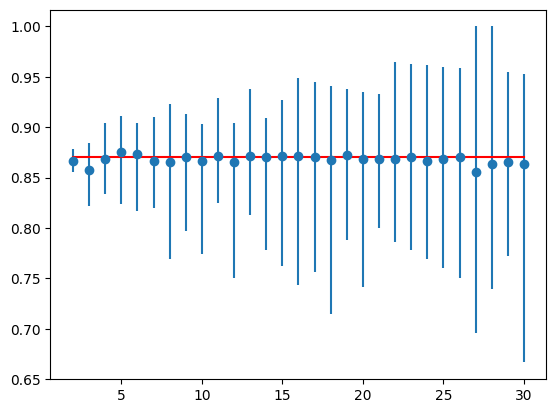

In [ ]:
find_fold(X_res_a,y_res_a,MLPClassifier(random_state=rs))

In [ ]:
grid_searchCV(mlp_params, X_res_a, y_res_a, 9)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


KeyboardInterrupt: ignored

XGB

In [ ]:
xgb_params = {'XGB' : {
        'model': XGBClassifier(random_state=rs),
        'params': {
            'reg_alpha':[1e-5, 1e-2, 0.1, 1, 100],
            'subsample':[i/10.0 for i in range(0,3)],
            'colsample_bytree':[i/10.0 for i in range(0,3)],
            'gamma':[i/10.0 for i in range(0,5)],
            'max_depth':[2,3,4,5,6],
            'min_child_weight': [2,3,4,5,6]

        }
    }}


Ideal: 0.859
> folds=2, accuracy=0.864 (0.843,0.885)
> folds=3, accuracy=0.873 (0.846,0.913)
> folds=4, accuracy=0.880 (0.840,0.917)
> folds=5, accuracy=0.862 (0.832,0.896)
> folds=6, accuracy=0.870 (0.827,0.913)
> folds=7, accuracy=0.870 (0.798,0.933)
> folds=8, accuracy=0.867 (0.795,0.923)
> folds=9, accuracy=0.881 (0.797,0.942)
> folds=10, accuracy=0.857 (0.774,0.919)
> folds=11, accuracy=0.864 (0.807,0.912)
> folds=12, accuracy=0.873 (0.788,0.942)
> folds=13, accuracy=0.862 (0.812,0.917)
> folds=14, accuracy=0.870 (0.756,0.933)
> folds=15, accuracy=0.870 (0.810,0.951)
> folds=16, accuracy=0.867 (0.718,0.923)
> folds=17, accuracy=0.871 (0.784,0.944)
> folds=18, accuracy=0.869 (0.686,0.943)
> folds=19, accuracy=0.870 (0.758,0.939)
> folds=20, accuracy=0.861 (0.645,0.968)
> folds=21, accuracy=0.874 (0.767,0.966)
> folds=22, accuracy=0.866 (0.750,0.964)
> folds=23, accuracy=0.868 (0.741,1.000)
> folds=24, accuracy=0.862 (0.654,0.962)
> folds=25, accuracy=0.865 (0.720,0.960)
> folds=26,

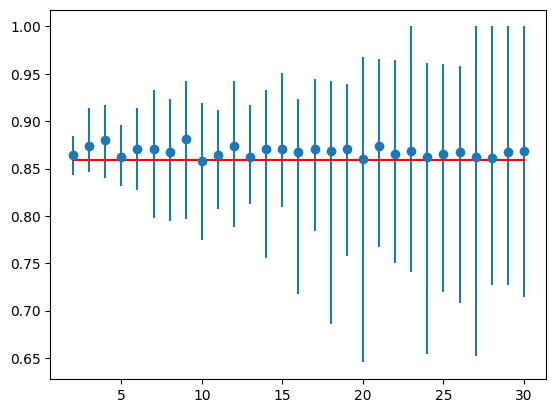

In [ ]:
find_fold(X_res_a,y_res_a,XGBClassifier(random_state=rs))

In [ ]:
grid_searchCV(xgb_params, X_res_a, y_res_a, 5)

,model,best_score,best_params
0,XGB,0.871871,"{'colsample_bytree': 0.2, 'gamma': 0.2, 'max_d..."


KNN

In [ ]:
knn_params = {'KNN' : {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [i+1 for i in range(0,100)]

        }
    }
}

Ideal: 0.846
> folds=2, accuracy=0.833 (0.817,0.849)
> folds=3, accuracy=0.861 (0.841,0.880)
> folds=4, accuracy=0.859 (0.821,0.885)
> folds=5, accuracy=0.840 (0.800,0.864)
> folds=6, accuracy=0.851 (0.817,0.875)
> folds=7, accuracy=0.854 (0.798,0.878)
> folds=8, accuracy=0.848 (0.744,0.885)
> folds=9, accuracy=0.849 (0.768,0.886)
> folds=10, accuracy=0.841 (0.742,0.873)
> folds=11, accuracy=0.848 (0.789,0.911)
> folds=12, accuracy=0.840 (0.731,0.885)
> folds=13, accuracy=0.843 (0.771,0.896)
> folds=14, accuracy=0.851 (0.711,0.911)
> folds=15, accuracy=0.846 (0.762,0.902)
> folds=16, accuracy=0.846 (0.667,0.923)
> folds=17, accuracy=0.848 (0.757,0.917)
> folds=18, accuracy=0.845 (0.657,0.914)
> folds=19, accuracy=0.848 (0.727,0.909)
> folds=20, accuracy=0.846 (0.677,0.906)
> folds=21, accuracy=0.846 (0.733,0.933)
> folds=22, accuracy=0.846 (0.714,0.964)
> folds=23, accuracy=0.846 (0.704,0.963)
> folds=24, accuracy=0.846 (0.692,0.962)
> folds=25, accuracy=0.848 (0.720,0.960)
> folds=26,

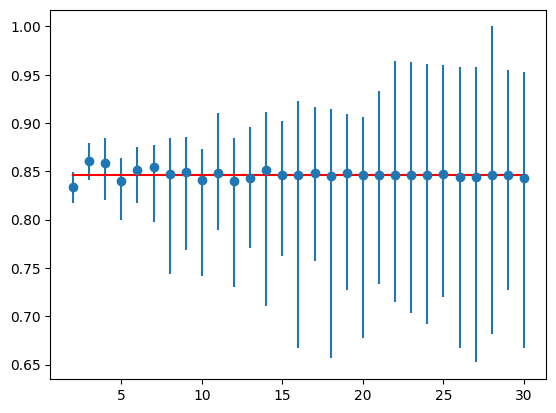

In [ ]:
find_fold(X_res_a,y_res_a,KNeighborsClassifier())

In [ ]:
grid_searchCV(knn_params, X_res_a, y_res_a, 15)

,model,best_score,best_params
0,KNN,0.879868,{'n_neighbors': 20}


#Tuned Merge

In [ ]:
LR_GS = LogisticRegression(C=0.05, max_iter=20, penalty='l2', solver='saga',random_state=rs)
NB_GS =  GaussianNB(var_smoothing=1.0)
DT_GS =DecisionTreeClassifier(criterion='gini', max_depth=4, ccp_alpha=0.01, max_features='auto',random_state=rs )
SVLC_GS =SVC(C=0.001, gamma=1, kernel='poly',random_state=rs)
GB_GS = GradientBoostingClassifier(learning_rate=0.2, max_depth=3, n_estimators=15,random_state=rs )
ADA_GS = AdaBoostClassifier(learning_rate=0.05, n_estimators=250,random_state=rs)
Bagg_GS = BaggingClassifier(max_features=0.7, max_samples=0.7, n_estimators=150,random_state=rs)
RF_GS = RandomForestClassifier(criterion='entropy', max_depth=12, max_features='auto', n_estimators=100,random_state=rs)
MLP_GS = MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs)
XGB_GS =  XGBClassifier( colsample_bytree = 0.2, gamma= 0.2, max_depth= 6, min_child_weight= 2, reg_alpha=0.1, subsample= 0.2,random_state=rs)
KNN_GS = KNeighborsClassifier(n_neighbors=20)


LR_pipeGS = Pipeline([
                    ("logistic regression", LR_GS)])

NB_pipeGS = Pipeline([
                    ("NB Gaussian", NB_GS)])

DT_pipeGS = Pipeline([
                    ("Decision Tree", DT_GS)])

SVLC_pipeGS = Pipeline([
                    ("SVLC", SVLC_GS)])

GB_pipeGS = Pipeline([
                    ("GradientBoosting", GB_GS)])

ADA_pipeGS = Pipeline([
                    ("ADABoost", ADA_GS)])

Bagg_pipeGS = Pipeline([
                    ("Bagging", Bagg_GS)])

RF_pipeGS = Pipeline([
                    ("Random Forest", RF_GS)])

MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])


XGB_pipeGS = Pipeline([
                    ("XGB", XGB_GS)])


KNN_pipeGS = Pipeline([
                    ("KNN", KNN_GS)])
#all pipes
all_pipesGS = [LR_pipeGS, NB_pipeGS, DT_pipeGS, SVLC_pipeGS, GB_pipeGS, ADA_pipeGS, Bagg_pipeGS, RF_pipeGS, MLP_pipeGS, XGB_pipeGS, KNN_pipeGS]

In [ ]:
tuned_ros_merge_train = model_training(all_pipesGS, X_res_a, y_res_a)

/usr/local/lib/python3.9/dist-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)

LR Test Accuracy: 85.0
LR Test f1_score: 85.0
LR Test precision_score: 85.0
LR Test recall_score: 85.0


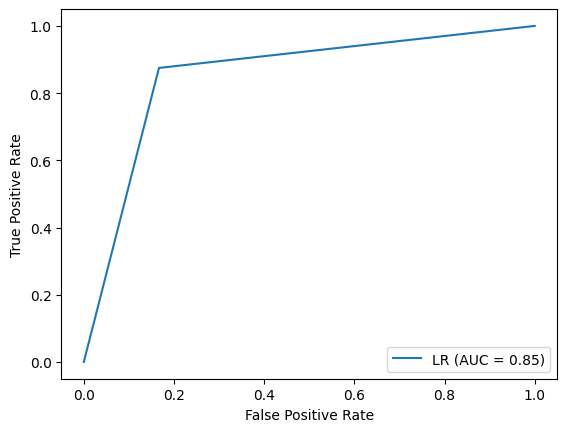

NB Test Accuracy: 86.0
NB Test f1_score: 86.0
NB Test precision_score: 86.0
NB Test recall_score: 86.0


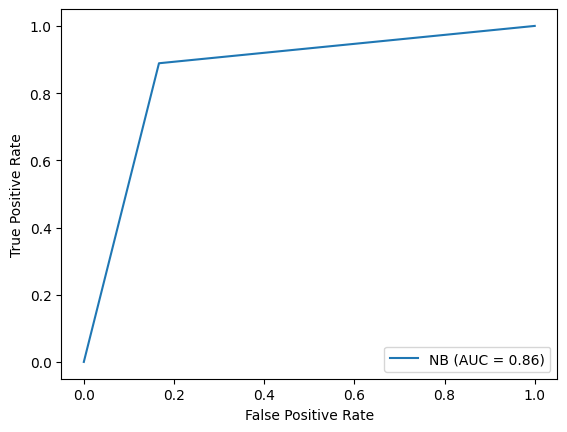

DT Test Accuracy: 83.0
DT Test f1_score: 83.0
DT Test precision_score: 84.0
DT Test recall_score: 84.0


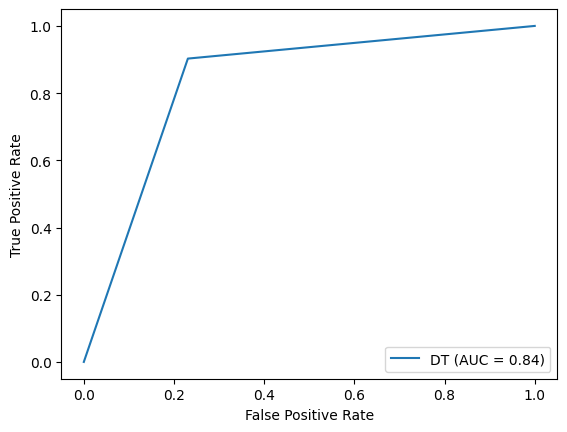

SVLC Test Accuracy: 85.0
SVLC Test f1_score: 85.0
SVLC Test precision_score: 85.0
SVLC Test recall_score: 85.0


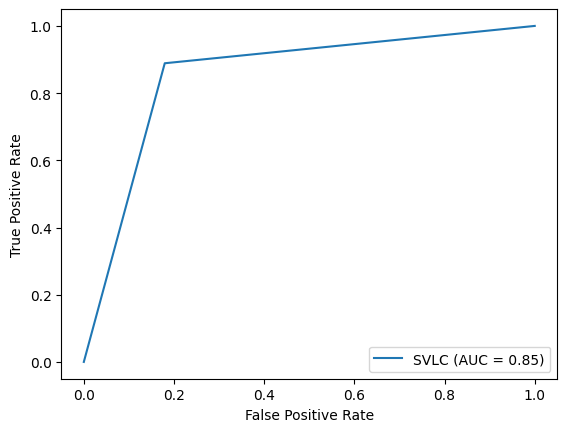

GB Test Accuracy: 84.0
GB Test f1_score: 84.0
GB Test precision_score: 84.0
GB Test recall_score: 84.0


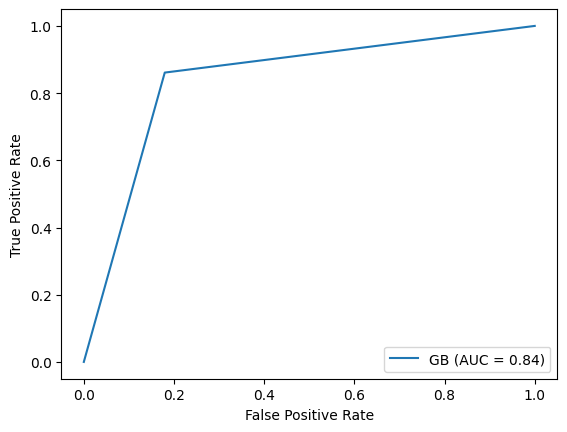

ADA Test Accuracy: 87.0
ADA Test f1_score: 87.0
ADA Test precision_score: 87.0
ADA Test recall_score: 87.0


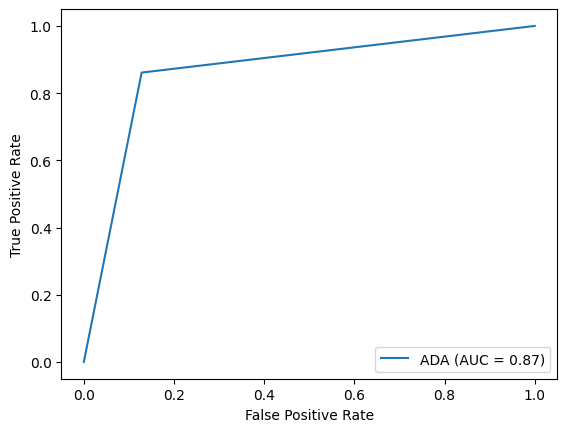

Bagg Test Accuracy: 87.0
Bagg Test f1_score: 87.0
Bagg Test precision_score: 87.0
Bagg Test recall_score: 87.0


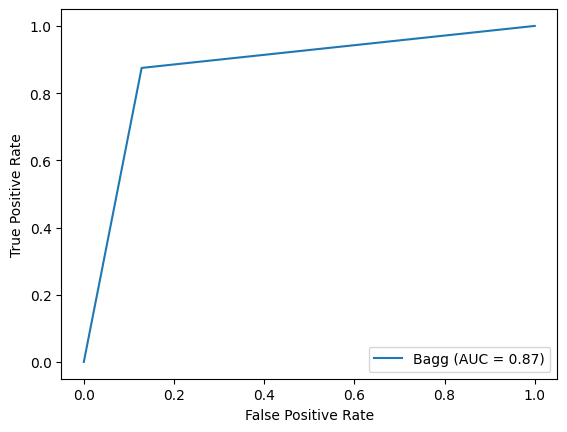

RF Test Accuracy: 86.0
RF Test f1_score: 86.0
RF Test precision_score: 86.0
RF Test recall_score: 86.0


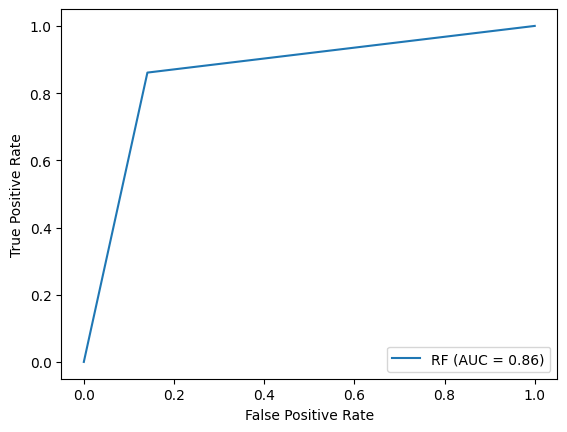

MLP Test Accuracy: 84.0
MLP Test f1_score: 84.0
MLP Test precision_score: 84.0
MLP Test recall_score: 84.0


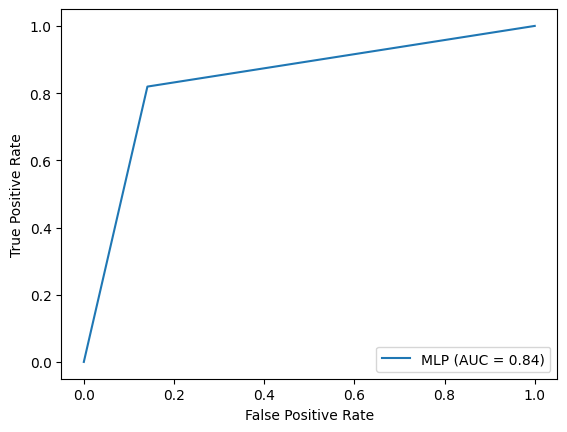

XGB Test Accuracy: 83.0
XGB Test f1_score: 83.0
XGB Test precision_score: 83.0
XGB Test recall_score: 82.0


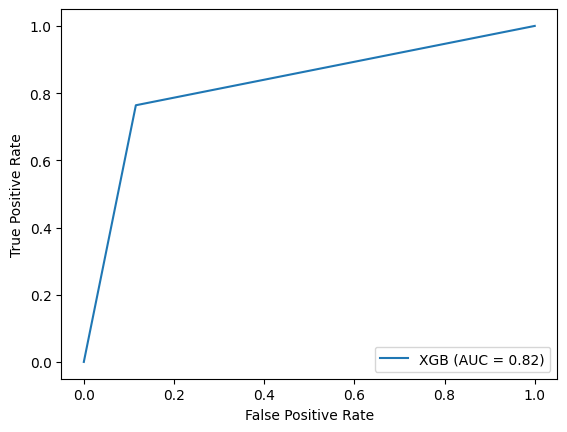

KNN Test Accuracy: 85.0
KNN Test f1_score: 85.0
KNN Test precision_score: 85.0
KNN Test recall_score: 85.0


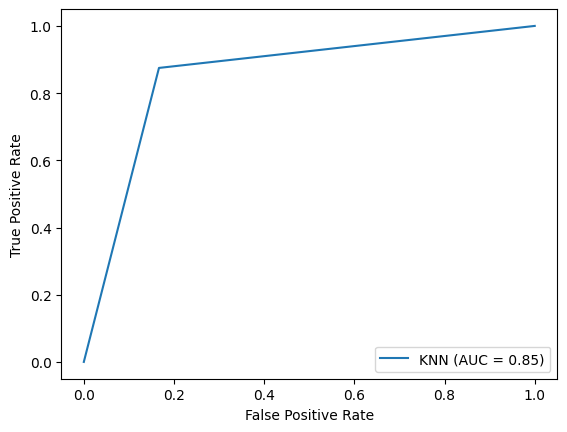

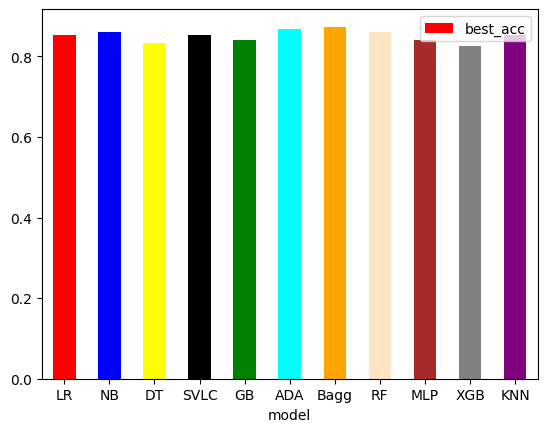

In [ ]:
tuned_ros_merge = model_testing(PipelineDict, tuned_ros_merge_train, X_test_a, y_test_a)

barplot

,index,model,best_acc,col
0,0,LR,0.860000,base_model
1,1,NB,0.866667,base_model
2,2,DT,0.820000,base_model
3,3,SVLC,0.853333,base_model
4,4,GB,0.833333,base_model
5,5,ADA,0.840000,base_model
6,6,Bagg,0.873333,base_model
7,7,RF,0.853333,base_model
8,8,MLP,0.846667,base_model
9,9,XGB,0.826667,base_model


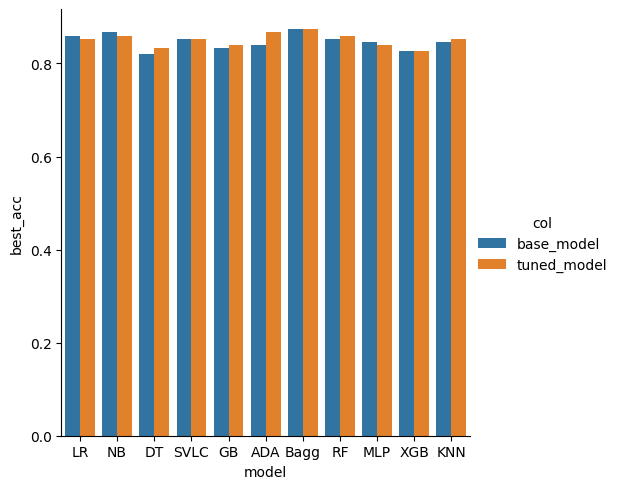

In [ ]:
bar_plot(base_ros_merge, tuned_ros_merge)

In [ ]:
tuned_ros_merge_cv = cv_evaluation(PipelineDict, all_pipesGS, X_res_all, y_res_all)

In [ ]:
base_ros_cv_statlog
base_smote_clevland_cv
base_ros_merge_cv
tuned_ros_statlog_cv
tuned_smo_clevland_cv
tuned_ros_merge_cv

/usr/local/lib/python3.8/dist-packages/seaborn/categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


,index,CV,model,best_acc,col
0,0,LOOC,LR,86.0,base_model
1,1,LOOC,NB,85.0,base_model
2,2,LOOC,DT,85.0,base_model
3,3,LOOC,SVLC,86.0,base_model
4,4,LOOC,GB,89.0,base_model
5,5,LOOC,ADA,86.0,base_model
6,6,LOOC,Bagg,86.0,base_model
7,7,LOOC,RF,89.0,base_model
8,8,LOOC,MLP,87.0,base_model
9,9,LOOC,XGB,90.0,base_model


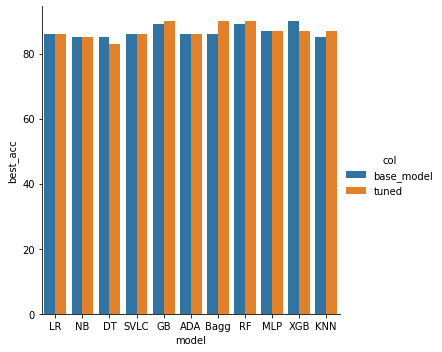

In [ ]:
bar_plot_cv(base_ros_merge_cv,tuned_ros_merge_cv)

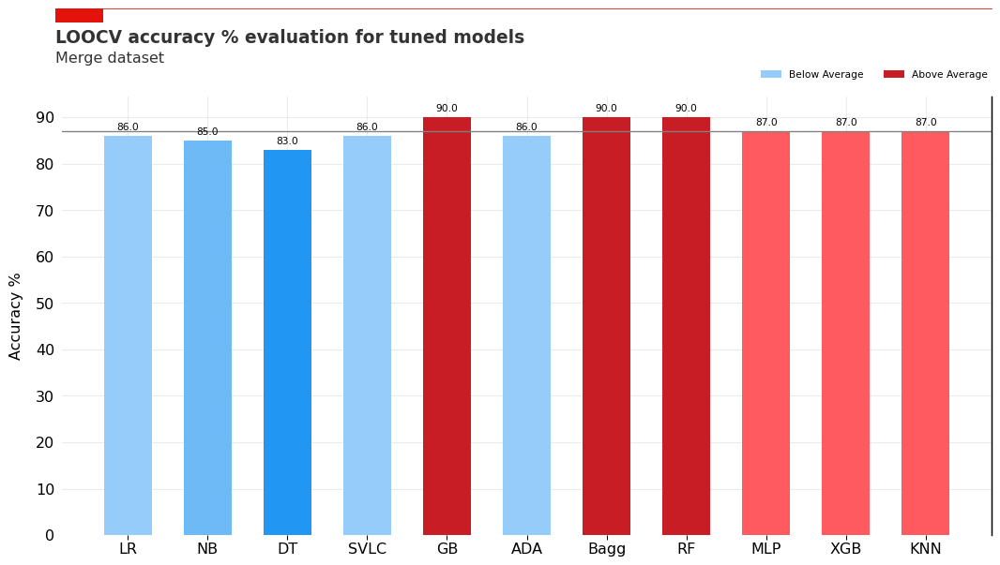

In [ ]:
bar_plot_update(tuned_ros_merge_cv, 'model', 'best_acc', 'Merge')

#TabPFN

In [ ]:
!pip install tabpfn
from tabpfn import TabPFNClassifier

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.3/153.3 kB 4.6 MB/s eta 0:00:00


In [ ]:
model_params = {

    'TabPFN' : {
        'model': TabPFNClassifier(device='cpu', seed=rs),
        'params': {
            'N_ensemble_configurations': [i+1 for i in range(0,20)]

        }
    }
}



def tabPFN(X_train, y_train, X_test, y_test, X_smo_, y_smo_, X_res_, y_res_, n):
  scores_ = []
  classifier = TabPFNClassifier(device='cpu', N_ensemble_configurations=3,seed=rs)
  classifier.fit(X_train, y_train)
  y_eval, p_eval = classifier.predict(X_test, return_winning_probability=True)
  acc = accuracy_score(y_test, y_eval)
  print('Accuracy', acc )

  scores_.append({
          'model': 'TabPFN',
          'best_acc': acc,

      })

  classifier = TabPFNClassifier(device='cpu', N_ensemble_configurations=n, seed=rs)
  classifier.fit(X_smo_, y_smo_)
  y_eval, p_eval = classifier.predict(X_test, return_winning_probability=True)
  acc_smo = accuracy_score(y_test, y_eval)
  print('Accuracy', acc_smo )

  scores_.append({
          'model': 'TabPFN_smo',
          'best_acc': acc_smo,

      })

  classifier = TabPFNClassifier(device='cpu', N_ensemble_configurations=n, seed=rs)
  classifier.fit(X_res_, y_res_)
  y_eval, p_eval = classifier.predict(X_test, return_winning_probability=True)
  acc_res =  accuracy_score(y_test, y_eval)
  print('Accuracy', acc_res)

  scores_.append({
          'model': 'TabPFN_ros',
          'best_acc': acc_res,

      })


  classifier = TabPFNClassifier(device='cpu', N_ensemble_configurations=n, seed=rs)
  classifier.fit(X_train, y_train)
  y_eval, p_eval = classifier.predict(X_test, return_winning_probability=True)
  acc_GS = accuracy_score(y_test, y_eval)
  print('Accuracy', acc_GS)

  scores_.append({
          'model': 'TabPFN_GS',
          'best_acc': acc_GS,

      })

  model_col = ['red','blue', 'yellow', 'black']
  model_lst = ['TabPFN' , 'TabPFN_smo', 'TabPFN_ros' , 'TabPFN_GS']
  df_normal = pd.DataFrame(scores_,columns=['model','best_acc'])
  df_normal.plot.bar(x='model', y='best_acc', color=model_col, rot=0)
  return df_normal



def grid_searchCV(model_params, X_train, y_train,n):
  scores_GS = []

  for model_name, mp in model_params.items():
      clf =  GridSearchCV(mp['model'], mp['params'], cv=n, return_train_score=False)
      clf.fit(X_train,y_train)
      scores_GS.append({
          'model': model_name,
          'best_score': clf.best_score_,
          'best_params': clf.best_params_
      })

  df_GS = pd.DataFrame(scores_GS,columns=['model','best_score','best_params'])
  return df_GS

#, X_smo, y_smo, X_res, y_res,

def cv_eval(X,y):
  model = TabPFNClassifier(device='cpu', seed=rs)
  scores_= []

  scores_LOOC = cross_val_score(model, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)

  scores_.append({
          'model': 'LOOC',
          'best_acc': mean(scores_LOOC),

      })

  df_normal = pd.DataFrame(scores_,columns=['model','best_acc'])

  return df_normal



def cv_eval_GS(X,y, n):
  model = TabPFNClassifier(device='cpu', N_ensemble_configurations=n, seed=rs)
  scores_= []

  #LOOC
  scores_LOOC = cross_val_score(model, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)

  scores_.append({
          'model': 'LOOC',
          'best_acc': mean(scores_LOOC),

      })

  df_normal = pd.DataFrame(scores_,columns=['model','best_acc'])

  return df_normal

def find_fold(X,y,model):
  # calculate the ideal test condition
  ideal, _, _ = evaluate_model(LeaveOneOut(),X,y,model)
  print('Ideal: %.3f' % ideal)
  # define folds to test
  folds = range(2,16)
  # record mean and min/max of each set of results
  means, mins, maxs = list(),list(),list()
  # evaluate each k value
  for k in folds:
    # define the test condition
    cv = KFold(n_splits=k, shuffle=True, random_state=1)
    # evaluate k value
    k_mean, k_min, k_max = evaluate_model(cv,X,y,model)
    # report performance
    print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
    # store mean accuracy
    means.append(k_mean)
    # store min and max relative to the mean
    mins.append(k_mean - k_min)
    maxs.append(k_max - k_mean)



  # line plot of k mean values with min/max error bars
  plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
  # plot the ideal case in a separate color
  plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
  # show the plot
  plt.show()

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

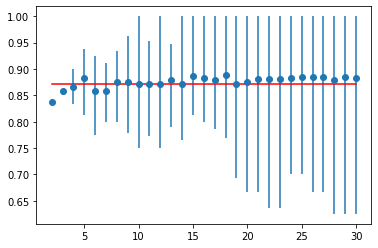

In [ ]:
find_fold(X_res_s,y_res_s,TabPFNClassifier(device='cpu', seed=rs))

In [ ]:
grid_searchCV(model_params, X_res_s, y_res_s,11)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_score,best_params
0,TabPFN,0.879575,{'N_ensemble_configurations': 2}


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8703703703703703
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8703703703703703
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8518518518518519
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8703703703703703


,model,best_acc
0,TabPFN,0.870370
1,TabPFN_smo,0.870370
2,TabPFN_ros,0.851852
3,TabPFN_GS,0.870370


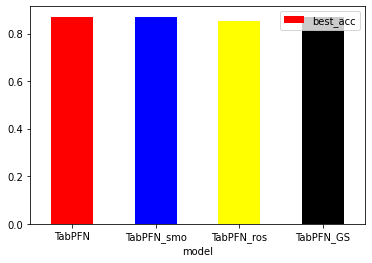

In [ ]:
tabPFN(X_train_s, y_train_s, X_test_s, y_test_s, X_smo_s, y_smo_s, X_res_s, y_res_s, n=2)

In [ ]:
cv_eval(X_res_stat, y_res_stat)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_acc
0,LOOC,0.88


In [ ]:
cv_eval_GS(X_res_stat, y_res_stat, n=2)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_acc
0,LOOC,0.88


Clevland

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

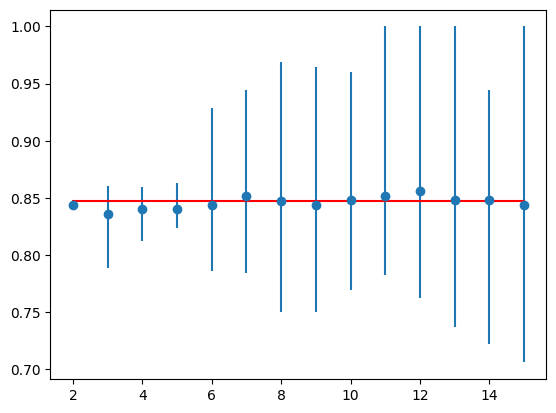

In [ ]:
find_fold(X_smo_c,y_smo_c,TabPFNClassifier(device='cpu', seed=rs))

In [ ]:
grid_searchCV(model_params, X_smo_c, y_smo_c,8)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_score,best_params
0,TabPFN,0.84375,{'N_ensemble_configurations': 1}


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.9333333333333333
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.9333333333333333
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.9333333333333333
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.9333333333333333


,model,best_acc
0,TabPFN,0.933333
1,TabPFN_smo,0.933333
2,TabPFN_ros,0.933333
3,TabPFN_GS,0.933333


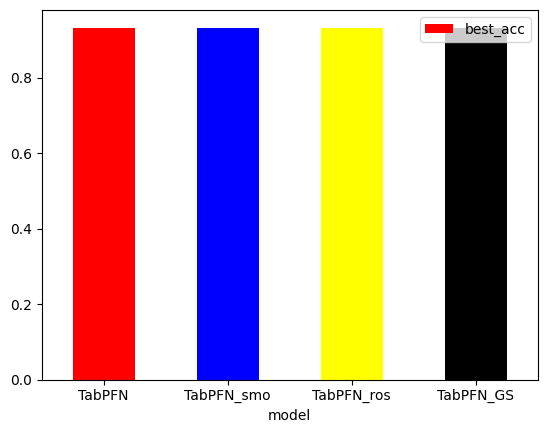

In [ ]:
tabPFN(X_train_c, y_train_c, X_test_c, y_test_c, X_smo_c, y_smo_c, X_res_c, y_res_c, n=1)

In [ ]:
cv_eval(X_smo_cleve, y_smo_cleve)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_acc
0,LOOC,0.85625


In [ ]:
cv_eval_GS(X_smo_cleve, y_smo_cleve, n=2)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_acc
0,LOOC,0.85625


Merge

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

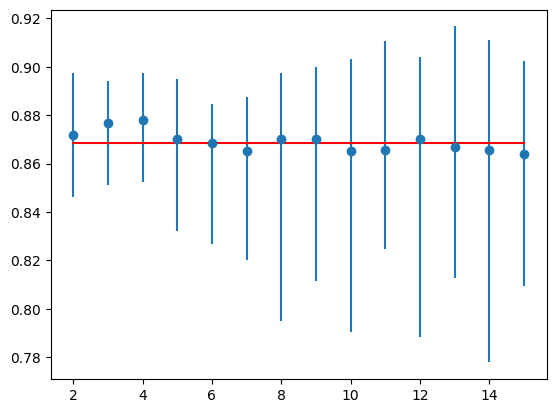

In [ ]:
find_fold(X_res_a,y_res_a,TabPFNClassifier(device='cpu', seed=rs))

In [ ]:
grid_searchCV(model_params, X_res_a, y_res_a,6)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_score,best_params
0,TabPFN,0.866987,{'N_ensemble_configurations': 7}


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8666666666666667
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8733333333333333
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8733333333333333
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Accuracy 0.8733333333333333


,model,best_acc
0,TabPFN,0.866667
1,TabPFN_smo,0.873333
2,TabPFN_ros,0.873333
3,TabPFN_GS,0.873333


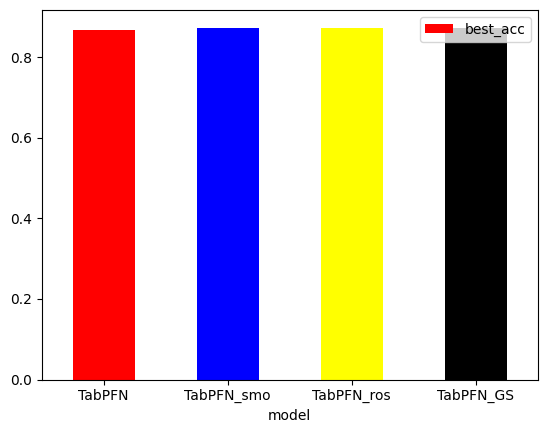

In [ ]:
tabPFN(X_train_a, y_train_a, X_test_a, y_test_a, X_smo_a, y_smo_a, X_res_a, y_res_a, n=7)

In [ ]:
cv_eval(X_res_all, y_res_all)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_acc
0,LOOC,0.880769


In [ ]:
cv_eval_GS(X_res_all, y_res_all, n=7)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,model,best_acc
0,LOOC,0.875641


#LightGBM and ExtraTrees classifiers

In [ ]:
import lightgbm as lgb
from sklearn.ensemble import ExtraTreesClassifier
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

model_params_extra = {

    'ExtraTrees' : {
        'model': ExtraTreesClassifier(random_state=rs),
        'params': {
            'n_estimators': [50,70, 100, 120, 150, 200, 250, 300, 500],
            'max_depth': [4,5,6,7,8, 10, 12],
            'max_leaf_nodes': [5,10,15, 20, 25],
            'criterion': ['gini', 'entropy']
        }
    }
}

#'colsample_bytree': 0.2, 'learning_rate': 1, 'min_child_samples': 50, 'min_child_weight': 0.01, 'num_leaves': 5, 'reg_alpha': 0.1, 'reg_lambda': 20, 'subsample': 0.001
model_params_lgbm = {
    'LGBM' : {
        'model': lgb.LGBMClassifier(random_state=rs),
        'params': {
             'num_leaves': [5,10,20,50,100],
             'min_child_samples': [50,100,200],
             'min_child_weight': [ 1e-2, 1e-1, 1, 1e1, 1e2],
             'subsample': [0.001, 0.01, 0.1, 1],
             'colsample_bytree': [i/10.0 for i in range(0,3)],
             'reg_alpha': [ 1e-1, 1, 2, 5],
             'reg_lambda': [ 1e-1, 1, 5, 10, 20],
             "learning_rate":[0.001,0.01,0.1,1]

        }
    }
}



def models_train_test(X_train, y_train, X_test, y_test):
  scores_ = []


  classifier = lgb.LGBMClassifier(random_state=rs)
  classifier.fit(X_train, y_train)
  y_eval = classifier.predict(X_test)
  acc = accuracy_score(y_test, y_eval)

  classifier1 = ExtraTreesClassifier(random_state=rs)
  classifier1.fit(X_train, y_train)
  y_eval1 = classifier1.predict(X_test)
  acc1 = accuracy_score(y_test, y_eval1)

  scores_.append({
          'model': 'LGBM',
          'best_acc': acc,

      })
  scores_.append({
        'model': 'ExtraTrees',
        'best_acc': acc1,

    })




  model_col = ['grey','black']
  model_lst = ['LGBM' , 'ExtraTrees']
  df_normal = pd.DataFrame(scores_,columns=['model','best_acc'])
  df_normal.plot.bar(x='model', y='best_acc', color=model_col, rot=0)
  return df_normal



def grid_searchCV(model_params, X_train, y_train,n):
  scores_GS = []

  for model_name, mp in model_params.items():
      clf =  GridSearchCV(mp['model'], mp['params'], cv=n, return_train_score=False)
      clf.fit(X_train,y_train)
      scores_GS.append({
          'model': model_name,
          'best_score': clf.best_score_,
          'best_params': clf.best_params_
      })

  df_GS = pd.DataFrame(scores_GS,columns=['model','best_score','best_params'])
  return df_GS







def models_cv(X,y):
  model =  ExtraTreesClassifier(random_state=rs)
  model1 =  lgb.LGBMClassifier(random_state=rs)
  scores_= []

  #LOOC
  scores_LOOC_extra = cross_val_score(model, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)
  scores_LOOC_lgbm = cross_val_score(model1, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)

  scores_.append({
          'model': 'LOOC_ExtraTrees',
          'best_acc': mean(scores_LOOC_extra),

      })

  scores_.append({
          'model': 'LOOC_LGBM',
          'best_acc': mean(scores_LOOC_lgbm),

      })

  df_normal = pd.DataFrame(scores_,columns=['model','best_acc'])

  return df_normal

def models_cv_GS(X,y):

  model = ExtraTreesClassifier(random_state=rs,criterion='gini', max_depth=5, max_leaf_nodes= 15, n_estimators= 70)
  model1 = lgb.LGBMClassifier(random_state=rs,colsample_bytree= 0.1, learning_rate= 1, min_child_samples= 50, min_child_weight= 0.01, num_leaves= 5, reg_alpha= 0.1, reg_lambda= 10, subsample= 0.001)


  scores_= []

  #LOOC
  scores_LOOC_extra = cross_val_score(model, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)
  scores_LOOC_lgbm = cross_val_score(model1, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)

  scores_.append({
          'model': 'LOOC_ExtraTrees',
          'best_acc': mean(scores_LOOC_extra),

      })

  scores_.append({
          'model': 'LOOC_LGBM',
          'best_acc': mean(scores_LOOC_lgbm),

      })

  df_normal = pd.DataFrame(scores_,columns=['model','best_acc'])

  return df_normal

def models_train_test_tuned(X_train, y_train, X_test, y_test, classifier_lgbm, classifier_xtra):
  scores_ = []


  classifier_lgbm.fit(X_train, y_train)
  y_eval = classifier_lgbm.predict(X_test)
  acc = accuracy_score(y_test, y_eval)
  classifier_xtra.fit(X_train, y_train)
  y_eval1 = classifier_xtra.predict(X_test)
  acc1 = accuracy_score(y_test, y_eval1)

  scores_.append({
          'model': 'LGBM',
          'best_acc': acc,

      })
  scores_.append({
        'model': 'ExtraTrees',
        'best_acc': acc1,

    })




  model_col = ['green','blue']
  model_lst = ['LGBM' , 'ExtraTrees']
  df_normal = pd.DataFrame(scores_,columns=['model','best_acc'])
  df_normal.plot.bar(x='model', y='best_acc', color=model_col, rot=0)
  return df_normal

Statlog

ROS

,model,best_acc
0,LGBM,0.814815
1,ExtraTrees,0.814815


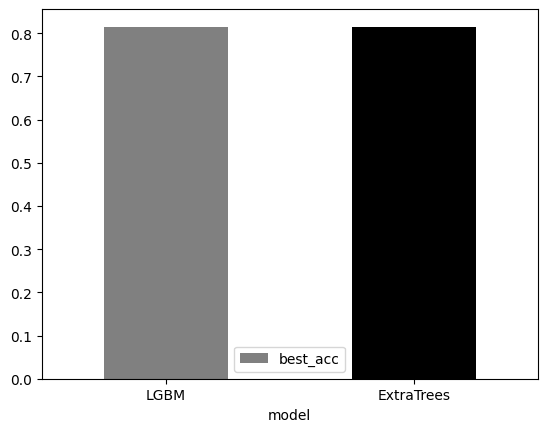

In [ ]:
models_train_test(X_res_s, y_res_s, X_test_s, y_test_s)

SMOTE

,model,best_acc
0,LGBM,0.814815
1,ExtraTrees,0.796296


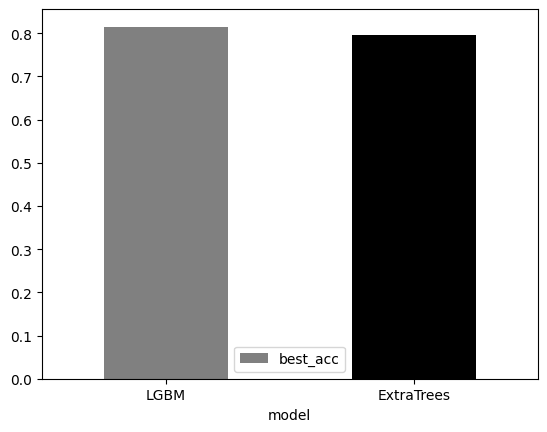

In [ ]:
models_train_test(X_smo_s, y_smo_s, X_test_s, y_test_s)

BASE

,model,best_acc
0,LGBM,0.814815
1,ExtraTrees,0.833333


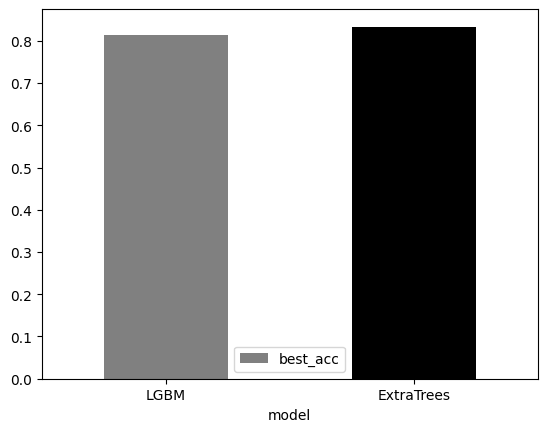

In [ ]:
models_train_test(X_train_s, y_train_s, X_test_s, y_test_s)

Ideal: 0.883
> folds=2, accuracy=0.821 (0.817,0.825)
> folds=3, accuracy=0.842 (0.838,0.850)
> folds=4, accuracy=0.854 (0.800,0.900)
> folds=5, accuracy=0.867 (0.771,0.938)
> folds=6, accuracy=0.846 (0.725,0.925)
> folds=7, accuracy=0.842 (0.657,0.941)
> folds=8, accuracy=0.850 (0.733,0.933)
> folds=9, accuracy=0.863 (0.704,0.963)
> folds=10, accuracy=0.854 (0.708,0.958)
> folds=11, accuracy=0.863 (0.773,1.000)
> folds=12, accuracy=0.850 (0.700,1.000)
> folds=13, accuracy=0.863 (0.737,0.947)
> folds=14, accuracy=0.859 (0.722,1.000)
> folds=15, accuracy=0.883 (0.812,1.000)
> folds=16, accuracy=0.867 (0.667,1.000)
> folds=17, accuracy=0.868 (0.714,1.000)
> folds=18, accuracy=0.872 (0.692,1.000)
> folds=19, accuracy=0.867 (0.615,1.000)
> folds=20, accuracy=0.858 (0.583,1.000)
> folds=21, accuracy=0.868 (0.583,1.000)
> folds=22, accuracy=0.864 (0.545,1.000)
> folds=23, accuracy=0.863 (0.545,1.000)
> folds=24, accuracy=0.867 (0.600,1.000)
> folds=25, accuracy=0.867 (0.600,1.000)
> folds=26,

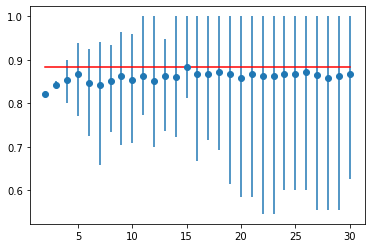

In [ ]:
find_fold(X_res_s,y_res_s, ExtraTreesClassifier(random_state=rs))

In [ ]:
grid_searchCV(model_params_extra, X_res_s, y_res_s,15)

,model,best_score,best_params
0,ExtraTrees,0.866667,"{'criterion': 'gini', 'max_depth': 12, 'max_le..."


Ideal: 0.850
> folds=2, accuracy=0.792 (0.783,0.800)
> folds=3, accuracy=0.846 (0.800,0.887)
> folds=4, accuracy=0.846 (0.767,0.917)
> folds=5, accuracy=0.838 (0.688,0.896)
> folds=6, accuracy=0.821 (0.725,0.875)
> folds=7, accuracy=0.838 (0.714,0.941)
> folds=8, accuracy=0.838 (0.733,0.900)
> folds=9, accuracy=0.846 (0.731,1.000)
> folds=10, accuracy=0.846 (0.708,0.958)
> folds=11, accuracy=0.867 (0.818,0.955)
> folds=12, accuracy=0.875 (0.750,1.000)
> folds=13, accuracy=0.854 (0.778,0.944)
> folds=14, accuracy=0.854 (0.706,1.000)
> folds=15, accuracy=0.858 (0.750,1.000)
> folds=16, accuracy=0.842 (0.667,1.000)
> folds=17, accuracy=0.855 (0.643,1.000)
> folds=18, accuracy=0.853 (0.714,1.000)
> folds=19, accuracy=0.855 (0.538,1.000)
> folds=20, accuracy=0.867 (0.583,1.000)
> folds=21, accuracy=0.872 (0.583,1.000)
> folds=22, accuracy=0.867 (0.636,1.000)
> folds=23, accuracy=0.875 (0.636,1.000)
> folds=24, accuracy=0.875 (0.600,1.000)
> folds=25, accuracy=0.874 (0.600,1.000)
> folds=26,

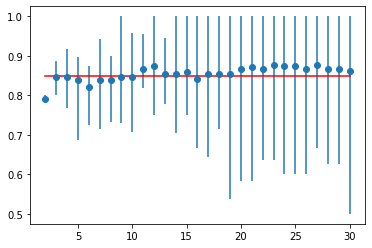

In [ ]:
find_fold(X_res_s,y_res_s, lgb.LGBMClassifier(random_state=rs))

In [ ]:

model_params_lgbm = {
    'LGBM' : {
        'model': lgb.LGBMClassifier(random_state=rs),
        'params': {
             'num_leaves': [3,5,7],
             'min_child_samples': [10,20,50,70],
             'min_child_weight': [0.01,0.02,0.05],
             'subsample': [0.0001,0.001],
             'colsample_bytree': [0.2],
             'reg_alpha': [ 1e-1, 0.02, 0.05],
             'reg_lambda': [20,30],
             "learning_rate":[1]

        }
    }
}

In [ ]:
grid_searchCV(model_params_lgbm, X_res_s, y_res_s, 10)

,model,best_score,best_params
0,LGBM,0.870833,"{'colsample_bytree': 0.2, 'learning_rate': 1, ..."


,model,best_acc
0,LGBM,0.833333
1,ExtraTrees,0.851852


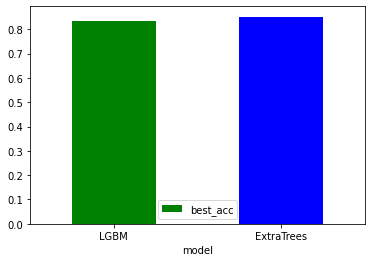

In [ ]:
cls_xtra = ExtraTreesClassifier(random_state=rs, criterion='gini', max_depth=12, max_leaf_nodes=25, n_estimators=50)
cls_lgbm = lgb.LGBMClassifier(random_state=rs, colsample_bytree=0.2, learning_rate=1, min_child_samples=50, min_child_weight=0.01, num_leaves=5, reg_alpha=0.1, reg_lambda=20, subsample=0.0001)
models_train_test_tuned(X_res_s, y_res_s, X_test_s, y_test_s, cls_lgbm, cls_xtra)


In [ ]:
models_cv(X_res_stat,y_res_stat)

,model,best_acc
0,LOOC_ExtraTrees,0.87
1,LOOC_LGBM,0.85


In [ ]:
models_cv_GS(X_res_stat,y_res_stat)

,model,best_acc
0,LOOC_ExtraTrees,0.833333
1,LOOC_LGBM,0.846667


clevland

,model,best_acc
0,LGBM,0.850000
1,ExtraTrees,0.933333


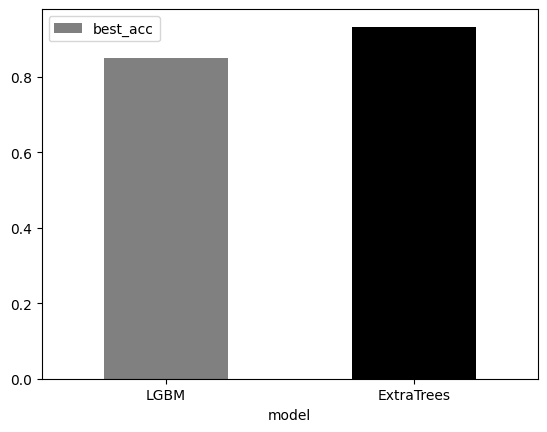

In [ ]:
models_train_test(X_res_c, y_res_c, X_test_c, y_test_c)

,model,best_acc
0,LGBM,0.850000
1,ExtraTrees,0.916667


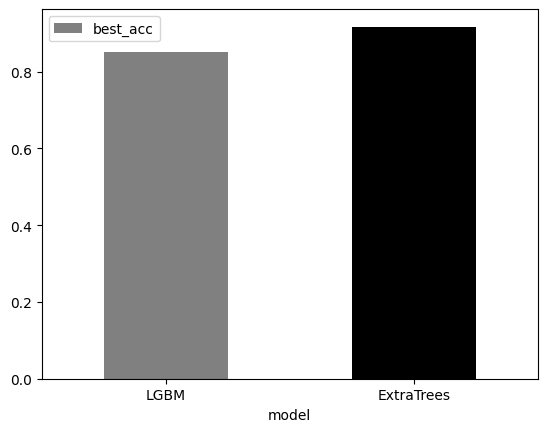

In [ ]:
models_train_test(X_smo_c, y_smo_c, X_test_c, y_test_c)

,model,best_acc
0,LGBM,0.833333
1,ExtraTrees,0.950000


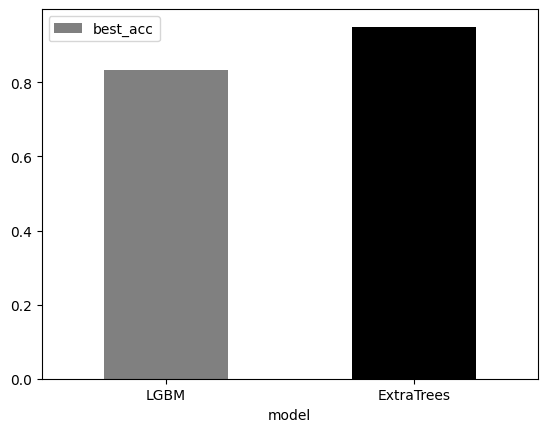

In [ ]:
models_train_test(X_train_c, y_train_c, X_test_c, y_test_c)

Ideal: 0.844
> folds=2, accuracy=0.812 (0.805,0.820)
> folds=3, accuracy=0.817 (0.791,0.835)
> folds=4, accuracy=0.836 (0.781,0.875)
> folds=5, accuracy=0.852 (0.804,0.902)
> folds=6, accuracy=0.851 (0.810,0.930)
> folds=7, accuracy=0.832 (0.757,0.892)
> folds=8, accuracy=0.832 (0.719,0.906)
> folds=9, accuracy=0.844 (0.690,0.964)
> folds=10, accuracy=0.852 (0.769,0.962)
> folds=11, accuracy=0.840 (0.667,0.957)
> folds=12, accuracy=0.852 (0.727,1.000)
> folds=13, accuracy=0.833 (0.750,0.950)
> folds=14, accuracy=0.845 (0.737,0.944)
> folds=15, accuracy=0.852 (0.706,0.941)
> folds=16, accuracy=0.844 (0.688,1.000)
> folds=17, accuracy=0.848 (0.667,1.000)
> folds=18, accuracy=0.840 (0.643,1.000)
> folds=19, accuracy=0.848 (0.769,1.000)
> folds=20, accuracy=0.844 (0.615,1.000)
> folds=21, accuracy=0.844 (0.615,1.000)
> folds=22, accuracy=0.844 (0.667,1.000)
> folds=23, accuracy=0.856 (0.727,1.000)
> folds=24, accuracy=0.843 (0.500,1.000)
> folds=25, accuracy=0.848 (0.500,1.000)
> folds=26,

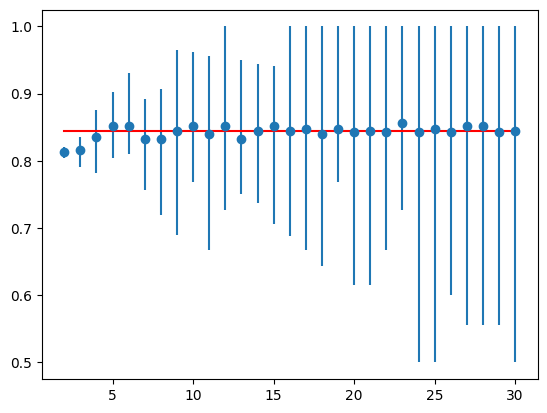

In [ ]:
find_fold(X_smo_c,y_smo_c, ExtraTreesClassifier(random_state=rs))

In [ ]:
model_params_extra = {

    'ExtraTrees' : {
        'model': ExtraTreesClassifier(random_state=rs),
        'params': {
            'n_estimators': [25, 50],
            'max_depth': [10, 20, 50, 100],
            'max_leaf_nodes': [25, 40],
            'criterion': ['gini']
        }
    }
}

In [ ]:
grid_searchCV(model_params_extra, X_smo_c, y_smo_c,9)

,model,best_score,best_params
0,ExtraTrees,0.825123,"{'criterion': 'gini', 'max_depth': 10, 'max_le..."


Ideal: 0.805
> folds=2, accuracy=0.816 (0.781,0.852)
> folds=3, accuracy=0.801 (0.788,0.814)
> folds=4, accuracy=0.793 (0.750,0.844)
> folds=5, accuracy=0.797 (0.745,0.882)
> folds=6, accuracy=0.809 (0.744,0.884)
> folds=7, accuracy=0.778 (0.649,0.865)
> folds=8, accuracy=0.777 (0.594,0.875)
> folds=9, accuracy=0.797 (0.690,0.893)
> folds=10, accuracy=0.805 (0.654,0.920)
> folds=11, accuracy=0.802 (0.625,0.913)
> folds=12, accuracy=0.793 (0.636,0.864)
> folds=13, accuracy=0.813 (0.600,0.947)
> folds=14, accuracy=0.798 (0.684,0.889)
> folds=15, accuracy=0.801 (0.647,0.941)
> folds=16, accuracy=0.801 (0.562,1.000)
> folds=17, accuracy=0.808 (0.533,1.000)
> folds=18, accuracy=0.802 (0.533,1.000)
> folds=19, accuracy=0.782 (0.500,0.929)
> folds=20, accuracy=0.824 (0.538,1.000)
> folds=21, accuracy=0.820 (0.500,0.923)
> folds=22, accuracy=0.805 (0.500,1.000)
> folds=23, accuracy=0.793 (0.455,1.000)
> folds=24, accuracy=0.801 (0.545,1.000)
> folds=25, accuracy=0.810 (0.545,1.000)
> folds=26,

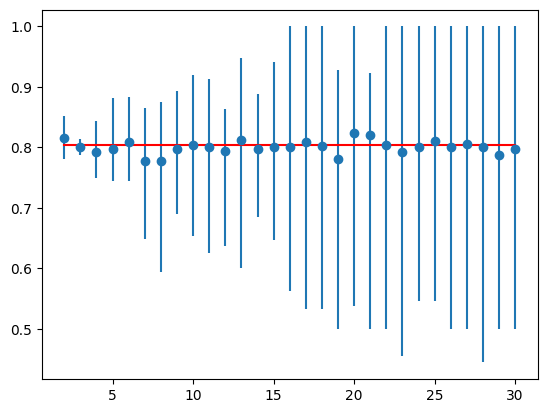

In [ ]:
find_fold(X_smo_c,y_smo_c, lgb.LGBMClassifier(random_state=rs))

In [ ]:
grid_searchCV(model_params_lgbm, X_smo_c, y_smo_c,10)

[LightGBM] [Warning] Unknown parameter: min_child_sample


,model,best_acc
0,LGBM,0.85
1,ExtraTrees,0.90


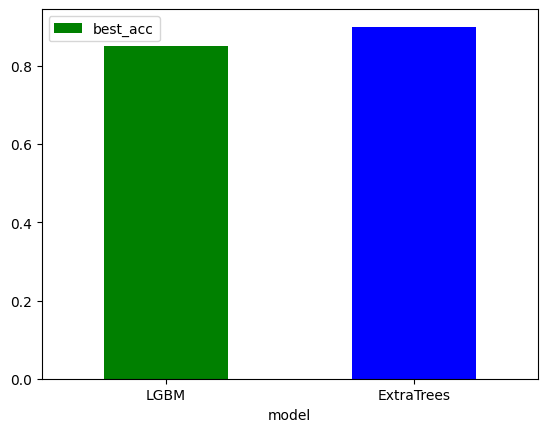

In [ ]:
cls_xtra = ExtraTreesClassifier(random_state=rs, criterion= 'gini', max_depth=10, max_leaf_nodes= 25, n_estimators=25 )
cls_lgbm = lgb.LGBMClassifier(random_state=rs,colsample_bytree=0.2, learning_rate=1, min_child_sample=50, min_child_weight=0.01, num_leaves=5, reg_alpha=0.1, reg_lambda=5, subsample=0.001)
models_train_test_tuned(X_smo_c, y_smo_c, X_test_c, y_test_c, cls_lgbm, cls_xtra)

In [ ]:
models_cv(X_smo_cleve,y_smo_cleve)

,model,best_acc
0,LOOC_ExtraTrees,0.846875
1,LOOC_LGBM,0.812500


In [ ]:
models_cv_GS(X_smo_cleve,y_smo_cleve)

,model,best_acc
0,LOOC_ExtraTrees,0.815625
1,LOOC_LGBM,0.806250


Merged

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,model,best_acc
0,LGBM,0.840000
1,ExtraTrees,0.866667


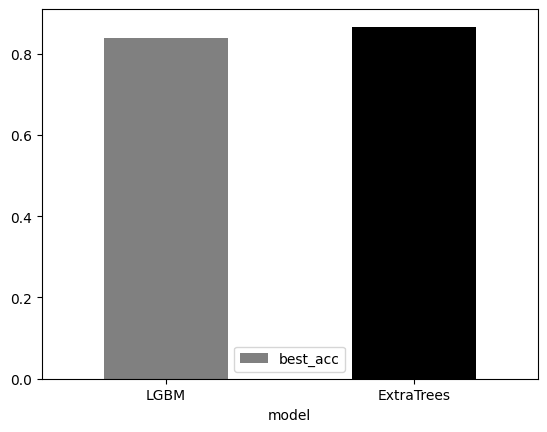

In [ ]:
models_train_test(X_res_a, y_res_a, X_test_a, y_test_a)

,model,best_acc
0,LGBM,0.833333
1,ExtraTrees,0.840000


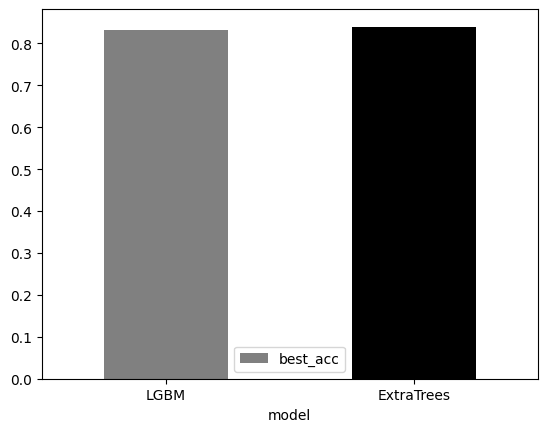

In [ ]:
models_train_test(X_smo_a, y_smo_a, X_test_a, y_test_a)

,model,best_acc
0,LGBM,0.860000
1,ExtraTrees,0.866667


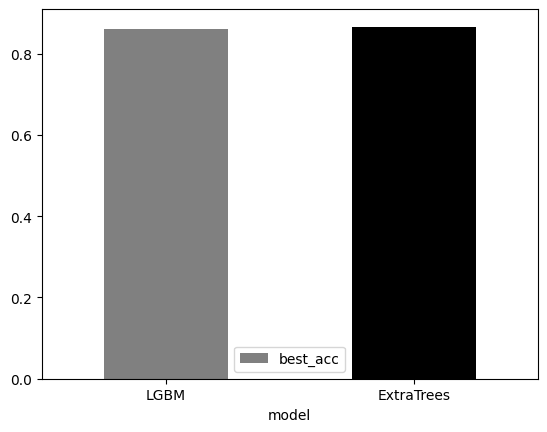

In [ ]:
models_train_test(X_train_a, y_train_a, X_test_a, y_test_a)

Ideal: 0.872
> folds=2, accuracy=0.856 (0.849,0.862)
> folds=3, accuracy=0.872 (0.841,0.899)
> folds=4, accuracy=0.873 (0.833,0.891)
> folds=5, accuracy=0.873 (0.832,0.896)
> folds=6, accuracy=0.870 (0.788,0.904)
> folds=7, accuracy=0.864 (0.831,0.899)
> folds=8, accuracy=0.861 (0.744,0.910)
> folds=9, accuracy=0.865 (0.797,0.929)
> folds=10, accuracy=0.860 (0.758,0.921)
> folds=11, accuracy=0.864 (0.807,0.912)
> folds=12, accuracy=0.870 (0.731,0.923)
> folds=13, accuracy=0.872 (0.812,0.938)
> folds=14, accuracy=0.873 (0.756,0.933)
> folds=15, accuracy=0.867 (0.762,0.905)
> folds=16, accuracy=0.864 (0.692,0.923)
> folds=17, accuracy=0.873 (0.757,0.946)
> folds=18, accuracy=0.862 (0.686,0.943)
> folds=19, accuracy=0.862 (0.758,0.939)
> folds=20, accuracy=0.864 (0.677,0.935)
> folds=21, accuracy=0.862 (0.759,1.000)
> folds=22, accuracy=0.863 (0.750,0.966)
> folds=23, accuracy=0.864 (0.741,0.929)
> folds=24, accuracy=0.865 (0.731,0.962)
> folds=25, accuracy=0.865 (0.760,1.000)
> folds=26,

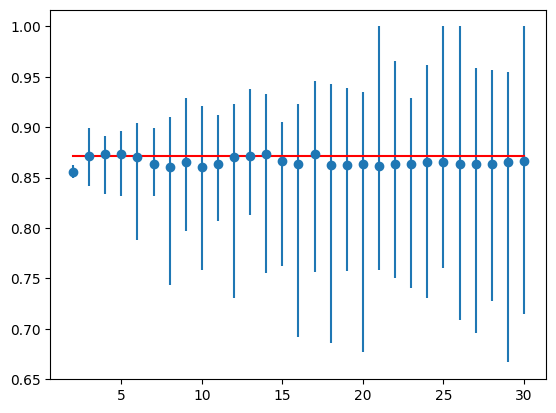

In [ ]:
find_fold(X_res_a,y_res_a, ExtraTreesClassifier(random_state=rs))

In [ ]:
grid_searchCV(model_params_extra, X_res_a, y_res_a,3)

,model,best_score,best_params
0,ExtraTrees,0.88141,"{'criterion': 'gini', 'max_depth': 5, 'max_lea..."


Ideal: 0.869
> folds=2, accuracy=0.862 (0.840,0.885)
> folds=3, accuracy=0.875 (0.851,0.904)
> folds=4, accuracy=0.880 (0.846,0.904)
> folds=5, accuracy=0.861 (0.832,0.895)
> folds=6, accuracy=0.870 (0.827,0.913)
> folds=7, accuracy=0.859 (0.798,0.910)
> folds=8, accuracy=0.864 (0.782,0.923)
> folds=9, accuracy=0.877 (0.797,0.929)
> folds=10, accuracy=0.869 (0.774,0.919)
> folds=11, accuracy=0.861 (0.807,0.911)
> folds=12, accuracy=0.872 (0.788,0.923)
> folds=13, accuracy=0.878 (0.833,0.958)
> folds=14, accuracy=0.872 (0.756,0.911)
> folds=15, accuracy=0.864 (0.786,0.951)
> folds=16, accuracy=0.867 (0.718,0.974)
> folds=17, accuracy=0.874 (0.784,0.919)
> folds=18, accuracy=0.862 (0.714,0.971)
> folds=19, accuracy=0.872 (0.758,0.939)
> folds=20, accuracy=0.873 (0.677,0.938)
> folds=21, accuracy=0.877 (0.800,0.933)
> folds=22, accuracy=0.867 (0.724,0.964)
> folds=23, accuracy=0.873 (0.741,0.963)
> folds=24, accuracy=0.867 (0.692,0.962)
> folds=25, accuracy=0.870 (0.720,0.960)
> folds=26,

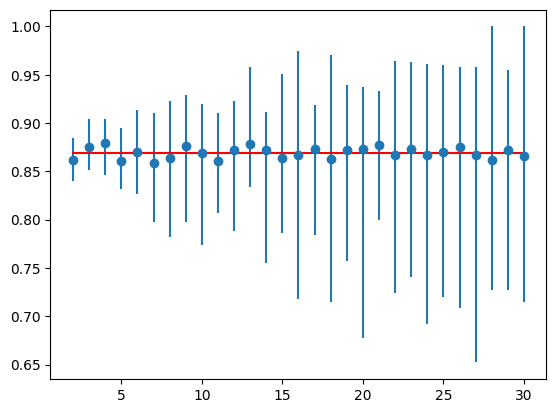

In [ ]:
find_fold(X_res_a,y_res_a, lgb.LGBMClassifier(random_state=rs))

In [ ]:
grid_searchCV(model_params_lgbm, X_res_a, y_res_a,10)

/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
240000 fits failed out of a total of 720000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
240000 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.9/dist-packages/lightgbm/sklearn.py", line 967, in fit
    super().fit(X, _y, sample_weight=sample_weight, init_score=init_score, eval_set=valid_sets,
  File "/usr/local/lib/python3.9/dist-packages/lightgbm/sklearn.py", line 748, in fit
    self._Booster = train(
  File "/us

,model,best_score,best_params
0,LGBM,0.876703,"{'colsample_bytree': 0.1, 'learning_rate': 1, ..."


,model,best_acc
0,LGBM,0.826667
1,ExtraTrees,0.853333


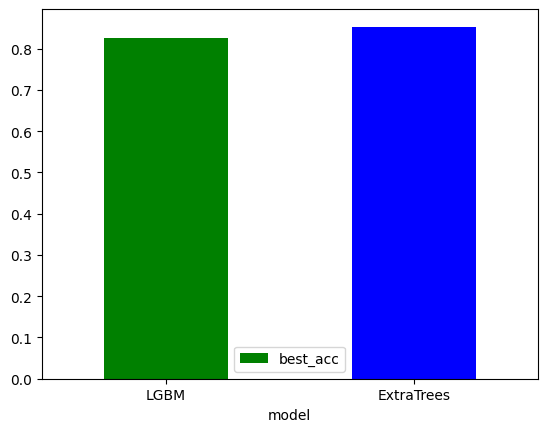

In [ ]:
cls_xtra = ExtraTreesClassifier(random_state=rs,criterion='gini', max_depth=5, max_leaf_nodes= 15, n_estimators= 70)
cls_lgbm = lgb.LGBMClassifier(random_state=rs,colsample_bytree= 0.1, learning_rate= 1, min_child_samples= 50, min_child_weight= 0.01, num_leaves= 5, reg_alpha= 0.1, reg_lambda= 10, subsample= 0.001)
models_train_test_tuned(X_res_a, y_res_a, X_test_a, y_test_a, cls_lgbm, cls_xtra)

In [ ]:
models_cv(X_res_a,y_res_a)

,model,best_acc
0,LOOC_ExtraTrees,0.871795
1,LOOC_LGBM,0.868590


In [ ]:
models_cv_GS(X_res_a,y_res_a)

,model,best_acc
0,LOOC_ExtraTrees,0.875
1,LOOC_LGBM,0.875


#Voting

Functions

In [ ]:
from sklearn.metrics import classification_report

def report(cls, X_train, y_train, X_test, y_test):
  cls.fit(X_train,y_train)
  y_pred = cls.predict(X_test)
  target_names = ['NO Heart disease', 'Heart disease']
  #,target_names=target_names
  report = classification_report(y_test,y_pred, target_names=target_names)
  return print(report)



def voting_training(voting_model, X_train, y_train):
  voting_model.fit(X_train, y_train)
  return voting_model


def voting_evaluation(voting_model_train, X_test, y_test):
  results=[]
  score = voting_model_train.score(X_test, y_test)
  print("{}Test Accuracy: {}", score)
  pred = voting_model_train.predict(X_test)
  precisions, recall, f1_score, _ = precision_recall_fscore_support(y_test, pred)
  print("{} Test Precision: {}", round(mean(precisions),2) * 100)
  print("{} Test recall: {}", round(mean(recall),2) * 100)
  print("{} Test F-1score: {}", round(mean(f1_score),2) * 100)

  results.append({
          'model': 'Voting',
          'best_acc': score,

      })

  df_vote = pd.DataFrame(results,columns=['model','best_acc'])
  return df_vote


def cv_voting(voting_model, X, y):
  scores_=[]
    #LOOC
  scores_LOOC = cross_val_score(voting_model, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)

  scores_.append({
          'CV' :'LOOC',
          'model': 'Voting',
          'best_acc': mean(scores_LOOC)

      })

  cv_voting = pd.DataFrame(scores_,columns=['CV', 'model','best_acc'])

  return cv_voting


In [ ]:
def merge_df(lst):
  concat_df = pd.concat(lst,axis=0, ignore_index=False)
  return concat_df



def bar_plot_cv_ensemble(df, c1, c2, dataset_label):
  fig, ax = plt.subplots(figsize=(13.33,7.5), dpi = 96)
  bar1 = ax.bar(df[c1], df[c2], width=0.6)
  # Create the grid
  ax.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
  ax.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

  # Reformat x-axis label and tick labels
  ax.set_xlabel('', fontsize=12, labelpad=10) # No need for an axis label
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.xaxis.set_major_locator(MaxNLocator(integer=True))
  ax.xaxis.set_tick_params(pad=2, labelbottom=True, bottom=True, labelsize=12, labelrotation=0)
  labels = ['V_statlog' , 'V_clevland', 'V_merge']

  ax.set_xticks(df[c1], labels) # Map integers numbers from the series to labels list

  # Reformat y-axis
  ax.set_ylabel('Accuracy %', fontsize=12, labelpad=10)
  ax.yaxis.set_label_position("left")
  ax.yaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.yaxis.set_major_locator(MaxNLocator(integer=False))
  ax.yaxis.set_tick_params(pad=2, labeltop=False, labelbottom=True, bottom=False, labelsize=12)

  # Add label on top of each bar
  ax.bar_label(bar1, labels=[f'{e:,.1f}' for e in df[c2]], padding=3, color='black', fontsize=8)

    # Remove the spines
  ax.spines[['top','left','bottom']].set_visible(False)

  # Make the left spine thicker
  ax.spines['right'].set_linewidth(1.1)

  # Add in red line and rectangle on top
  ax.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color='#E3120B', linewidth=.6)
  ax.add_patch(plt.Rectangle((0.12,.98), 0.04, -0.02, facecolor='#E3120B', transform=fig.transFigure, clip_on=False, linewidth = 0))

  # Add in title and subtitle
  ax.text(x=0.12, y=.93, s="Accuracy % evaluation", transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
  ax.text(x=0.12, y=.90, s= "%s dataset" %(dataset_label), transform=fig.transFigure, ha='left', fontsize=12, alpha=.8)



  # Adjust the margins around the plot area
  plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.85, wspace=None, hspace=None)

  # Set a white background
  fig.patch.set_facecolor('white')

    # Colours - Choose the extreme colours of the colour map
  colours = ["#2196f3", "#bbdefb"]

  # Colormap - Build the colour maps
  cmap = mpl.colors.LinearSegmentedColormap.from_list("colour_map", colours, N=256)
  norm = mpl.colors.Normalize(df[c2].min(), df[c2].max()) # linearly normalizes data into the [0.0, 1.0] interval

  # Plot bars
  bar1 = ax.bar(df[c1], df[c2], color=cmap(norm(df[c2])), width=0.6, zorder=2)

  # Find the average data point and split the series in 2
  average = df[c2].mean()
  below_average = df[df[c2]<average]
  above_average = df[df[c2]>=average]
  # Colours - Choose the extreme colours of the colour map
  colors_high = ["#ff5a5f", "#c81d25"] # Extreme colours of the high scale
  colors_low = ["#2196f3","#bbdefb"] # Extreme colours of the low scale

  # Colormap - Build the colour maps
  cmap_low = mpl.colors.LinearSegmentedColormap.from_list("low_map", colors_low, N=256)
  cmap_high = mpl.colors.LinearSegmentedColormap.from_list("high_map", colors_high, N=256)
  norm_low = mpl.colors.Normalize(below_average[c2].min(), average) # linearly normalizes data into the [0.0, 1.0] interval
  norm_high = mpl.colors.Normalize(average, above_average[c2].max())

  # Plot bars and average (horizontal) line
  bar1 = ax.bar(below_average[c1], below_average[c2], color=cmap_low(norm_low(below_average[c2])), width=0.6, label='Below Average', zorder=2)
  bar2 = ax.bar(above_average[c1], above_average[c2], color=cmap_high(norm_high(above_average[c2])), width=0.6, label='Above Average', zorder=2)
  plt.axhline(y=average, color = 'grey', linewidth=1)

  # Determine the y-limits of the plot
  ymin, ymax = ax.get_ylim()
  # Calculate a suitable y position for the text label
  y_pos = average/ymax + 0.03
  # Annotate the average line
  # ax.text(0.88, y_pos, f'Average = {average:.1f}', ha='center', va='center', transform=ax.transAxes, size=8, zorder=3)

  # Add legend
  ax.legend(loc="best", ncol=2, bbox_to_anchor=[1, 1.07], borderaxespad=0, frameon=False, fontsize=8)

def simple_bar_plot(df):
  model_col = ['green','blue', 'grey']
  model_lst = ['Voting_statlog' , 'Voting_Clevland', 'Voting_Merge']
  df.plot.bar(x='models', y='best_acc', color=model_col, rot=0, figsize=(20,10))


hard voting Statlog

In [ ]:
TabPFN_statlog_GS =  TabPFNClassifier(N_ensemble_configurations=2, seed=rs)

MLP_GS = MLPClassifier(random_state=rs)
ADA_GS = AdaBoostClassifier(learning_rate=0.04, n_estimators=180, random_state=rs)
LR_GS = LogisticRegression(C=1.1, max_iter=7, penalty='l2', solver='liblinear',random_state=rs)
ExtraTrees_GS = ExtraTreesClassifier(random_state=rs, criterion='gini', max_depth=12, max_leaf_nodes=25, n_estimators=50)

ExtraTrees_pipeGS = Pipeline([
                    ("ExtraTrees", ExtraTrees_GS)])

TabPFN_statlog_pipeGS = Pipeline([
                    ("TabPFN", TabPFN_statlog_GS)])

MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])

Ada_pipeGS = Pipeline([
                    ("ADA", ADA_GS)])
LR_pipeGS = Pipeline([
                    ("LR", LR_GS)])

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:

estimators_statlog = [('LR', LR_pipeGS ), ('MLP', MLP_pipeGS ), ('ADA', Ada_pipeGS) ,('ExtraTrees', ExtraTrees_pipeGS), ('TabPFN', TabPFN_statlog_pipeGS)]

estimators_statlog_report =  [('LR', LogisticRegression(C=1.1, max_iter=7, penalty='l2', solver='liblinear',random_state=rs) ), ('MLP', MLPClassifier(random_state=rs) ), ('ADA',AdaBoostClassifier(learning_rate=0.04, n_estimators=180, random_state=rs))
,('ExtraTrees', ExtraTreesClassifier(random_state=rs, criterion='gini', max_depth=12, max_leaf_nodes=25, n_estimators=50)), ('TabPFN',TabPFNClassifier(N_ensemble_configurations=2, seed=rs))]


voting_pipe = Pipeline([['VotingClassifier', VotingClassifier(estimators=estimators_statlog)]])



Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


all

In [ ]:
estimators_all = [ExtraTrees_pipeGS, TabPFN_statlog_pipeGS ,MLP_pipeGS,Ada_pipeGS,LR_pipeGS ]
Pip = {0: 'ExtraTrees', 1: 'TabPFN', 2: 'MLP', 3:'ADA', 4:'LR' }

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


ExtraTrees Test Accuracy: 85.0
ExtraTrees Test f1_score: 85.0
ExtraTrees Test precision_score: 85.0
ExtraTrees Test recall_score: 85.0


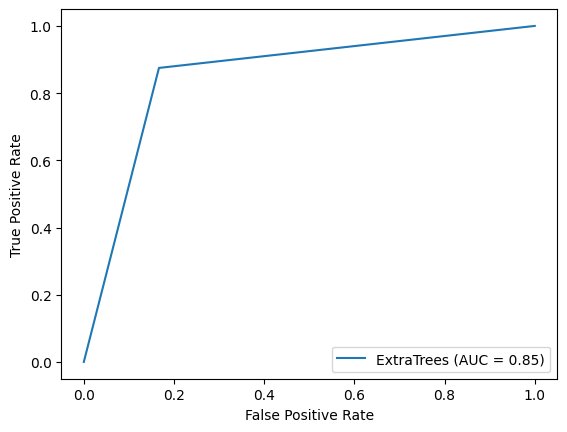

TabPFN Test Accuracy: 85.0
TabPFN Test f1_score: 85.0
TabPFN Test precision_score: 85.0
TabPFN Test recall_score: 85.0


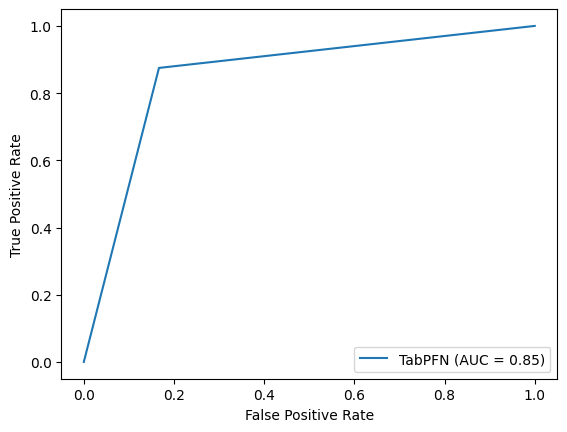

MLP Test Accuracy: 87.0
MLP Test f1_score: 87.0
MLP Test precision_score: 87.0
MLP Test recall_score: 87.0


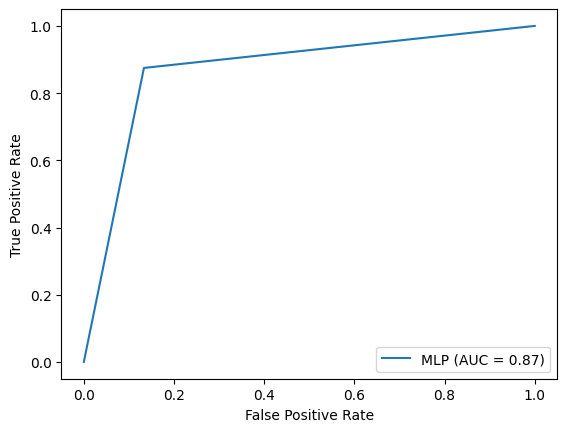

ADA Test Accuracy: 87.0
ADA Test f1_score: 87.0
ADA Test precision_score: 88.0
ADA Test recall_score: 88.0


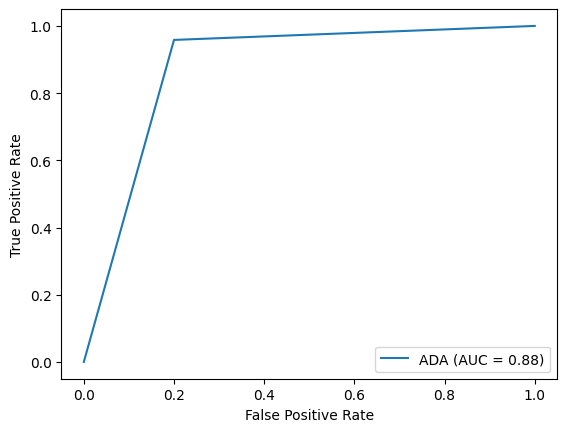

LR Test Accuracy: 87.0
LR Test f1_score: 87.0
LR Test precision_score: 88.0
LR Test recall_score: 88.0


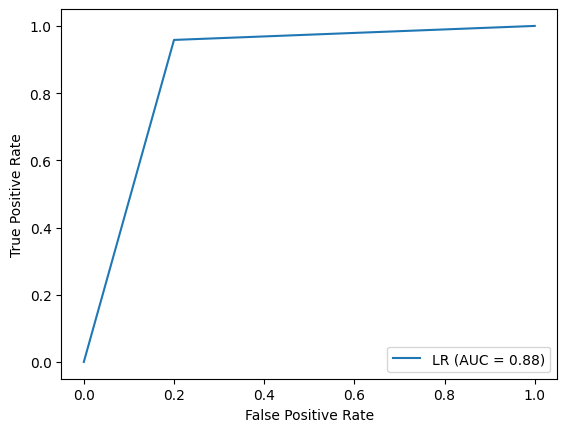

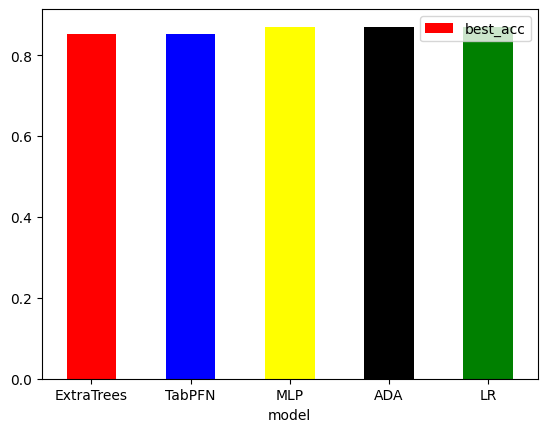

In [ ]:
train = model_training(estimators_all, X_res_s, y_res_s)
test = model_testing(Pip, train, X_test_s, y_test_s)

In [ ]:
voting_statlog_training = voting_training(voting_pipe, X_res_s, y_res_s)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:

voting_statlog_testing = voting_evaluation(voting_statlog_training, X_test_s, y_test_s)
voting_statlog_testing

{}Test Accuracy: {} 0.8888888888888888
{} Test Precision: {} 89.0
{} Test recall: {} 89.0
{} Test F-1score: {} 89.0


,model,best_acc
0,Voting,0.888889


In [ ]:
report(VotingClassifier(estimators=estimators_statlog_report),X_res_s, y_res_s, X_test_s, y_test_s)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
                  precision    recall  f1-score   support

NO Heart disease       0.93      0.87      0.90        30
   Heart disease       0.85      0.92      0.88        24

        accuracy                           0.89        54
       macro avg       0.89      0.89      0.89        54
    weighted avg       0.89      0.89      0.89        54



In [ ]:
voting_statlog_cv = cv_voting(voting_pipe, X_res_stat, y_res_stat)


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

In [ ]:
voting_statlog_cv

,CV,model,best_acc
0,LOOC,Voting,0.856667


Experiment 2

In [ ]:
estimators_statlog = [ ('MLP', MLP_pipeGS ) ,('ExtraTrees', ExtraTrees_pipeGS),('ADA', Ada_pipeGS), ('TabPFN', TabPFN_statlog_pipeGS)]


#('ExtraTrees', ExtraTrees_pipeGS), , ('ADA', Ada_pipeGS) ('LR', LR_pipeGS ), ('TabPFN', TabPFN_statlog_pipeGS) ('LR', LR_pipeGS ),

voting_pipe = Pipeline([['VotingClassifier', VotingClassifier(estimators=estimators_statlog)]])


In [ ]:
voting_statlog_training = voting_training(voting_pipe, X_res_s, y_res_s)
voting_statlog_testing = voting_evaluation(voting_statlog_training, X_test_s, y_test_s)
voting_statlog_testing

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
{}Test Accuracy: {} 0.8888888888888888
{} Test Precision: {} 89.0
{} Test recall: {} 89.0
{} Test F-1score: {} 89.0


,model,best_acc
0,Voting,0.888889


hard voting Clevland

In [ ]:
TabPFN_cleve_GS= TabPFNClassifier(device='cpu', N_ensemble_configurations=1, seed=rs)
MLP_GS = MLPClassifier(activation='identity', alpha=0.0001, hidden_layer_sizes=(100,), learning_rate='constant', max_iter=600, solver='sgd',random_state=rs)
LR_GS = LogisticRegression( C=0.01, max_iter=21, penalty='l2', solver='saga',random_state=rs)
SVLC_GS =SVC(C=1.2, gamma=0.4, kernel='rbf',random_state=rs)
LR_pipeGS = Pipeline([
                    ("logistic regression", LR_GS)])
# ADA_pipeGS = Pipeline([
#                     ("ADABoost", ADA_GS)])
MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])
TabPFN_cleve_pipeGS = Pipeline([
                    ("TabPFN", TabPFN_cleve_GS)])

SVLC_pipeGS = Pipeline([
                    ("SVLC", SVLC_GS)])

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
# LR_GS = LogisticRegression( C=0.02, max_iter=21, penalty='l2', solver='saga',random_state=rs)
# SVLC_GS =SVC(C=1, gamma=0.2, kernel='poly',random_state=rs, probability=True)
# ADA_GS = AdaBoostClassifier(learning_rate=0.01, n_estimators=220, random_state=rs)

# MLP_GS = MLPClassifier(activation='identity', alpha=0.0001, hidden_layer_sizes=(100,), learning_rate='constant', max_iter=600, solver='sgd',random_state=rs)
# TabPFN_cleve_GS =  TabPFNClassifier(N_ensemble_configurations=2, seed=rs)
# ExtraTrees_GS = ExtraTreesClassifier(random_state=rs, criterion= 'gini', max_depth=10, max_leaf_nodes= 25, n_estimators=50 )

# ExtraTrees_pipeGS = Pipeline([
#                     ("ExtraTrees", ExtraTrees_GS)])
LR_pipeGS = Pipeline([
                    ("logistic regression", LR_GS)])
# ADA_pipeGS = Pipeline([
#                     ("ADABoost", ADA_GS)])
MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])
TabPFN_cleve_pipeGS = Pipeline([
                    ("TabPFN", TabPFN_cleve_GS)])

SVLC_pipeGS = Pipeline([
                    ("SVLC", SVLC_GS)])

In [ ]:
# estimators_clevland = [('LR', LR_pipeGS ), ('SVLC', SVLC_pipeGS),  ('MLP', MLP_pipeGS) , ('TabPFN', TabPFN_cleve_pipeGS), ('ExtraTrees', ExtraTrees_pipeGS) ]

estimators_clevland = [('LR', LR_pipeGS ), ('SVLC', SVLC_pipeGS),  ('MLP', MLP_pipeGS) , ('TabPFN', TabPFN_cleve_pipeGS)]

estimators_clevland_report = [('LR',LogisticRegression( C=0.01, max_iter=21, penalty='l2', solver='saga',random_state=rs)), ('MLP', MLPClassifier(activation='identity', alpha=0.0001, hidden_layer_sizes=(100,), learning_rate='constant', max_iter=600, solver='sgd',random_state=rs)) , ('TabPFN', TabPFNClassifier(device='cpu', N_ensemble_configurations=1, seed=rs))]

voting_pipe = Pipeline([['VotingClassifier', VotingClassifier(estimators=estimators_clevland)]])

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


TabPFN Test Accuracy: 93.0
TabPFN Test f1_score: 93.0
TabPFN Test precision_score: 94.0
TabPFN Test recall_score: 93.0


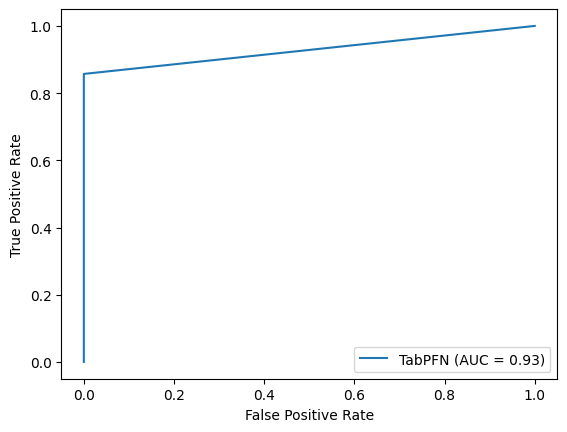

MLP Test Accuracy: 95.0
MLP Test f1_score: 95.0
MLP Test precision_score: 95.0
MLP Test recall_score: 95.0


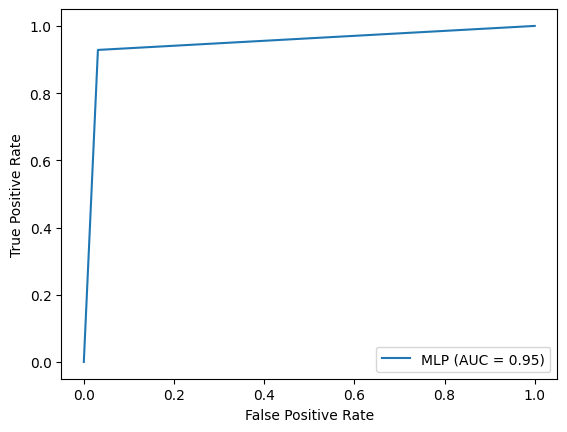

SVLC Test Accuracy: 92.0
SVLC Test f1_score: 92.0
SVLC Test precision_score: 92.0
SVLC Test recall_score: 91.0


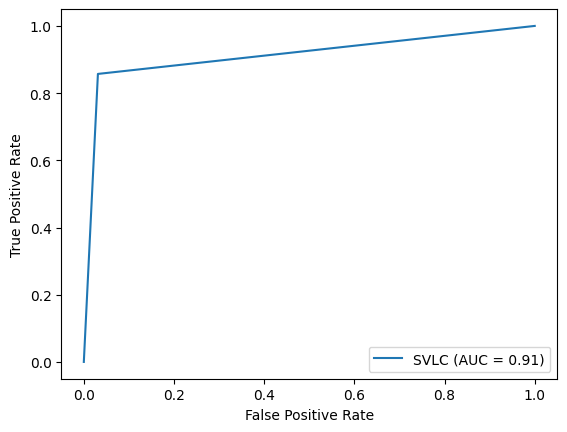

LR Test Accuracy: 93.0
LR Test f1_score: 93.0
LR Test precision_score: 94.0
LR Test recall_score: 93.0


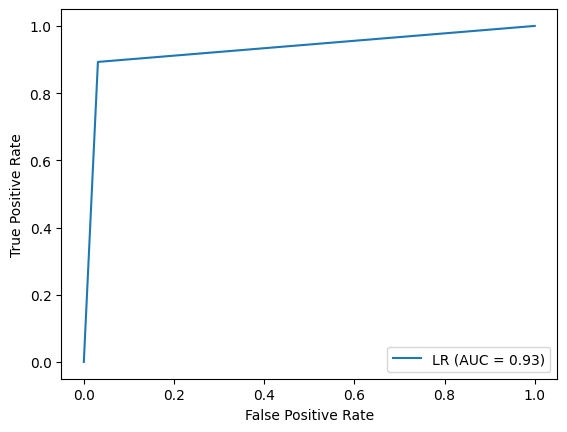

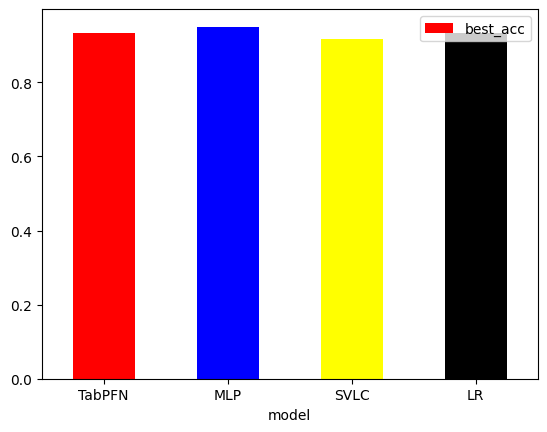

In [ ]:
estimators_all = [TabPFN_statlog_pipeGS ,MLP_pipeGS,SVLC_pipeGS,LR_pipeGS ]
Pip = {0: 'TabPFN', 1: 'MLP', 2:'SVLC', 3:'LR' }

train = model_training(estimators_all, X_smo_c, y_smo_c)
test = model_testing(Pip, train, X_test_c, y_test_c)

In [ ]:
voting_clevland_training = voting_training(voting_pipe, X_smo_c, y_smo_c)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
voting_clevland_testing = voting_evaluation(voting_clevland_training, X_test_c, y_test_c)

{}Test Accuracy: {} 0.9333333333333333
{} Test Precision: {} 94.0
{} Test recall: {} 93.0
{} Test F-1score: {} 93.0


Clevland Soft experiment1

In [ ]:
voting_pipe_soft = Pipeline([['VotingClassifier', VotingClassifier(estimators=estimators_clevland, voting='soft')]])
voting_clevland_training_soft = voting_training(voting_pipe_soft, X_res_s, y_res_s)
voting_clevland_testing_soft = voting_evaluation(voting_clevland_training_soft, X_test_s, y_test_s)
voting_clevland_testing_soft

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
{}Test Accuracy: {} 0.8518518518518519
{} Test Precision: {} 85.0
{} Test recall: {} 86.0
{} Test F-1score: {} 85.0


,model,best_acc
0,Voting,0.851852


Experiment 2

In [ ]:
estimators_clevland = [('LR', LR_pipeGS ),('TabPFN', TabPFN_cleve_pipeGS), ('MLP', MLP_pipeGS)]
voting_pipe = Pipeline([['VotingClassifier', VotingClassifier(estimators=estimators_clevland)]])
estimators_clevland_report = [('LR',LogisticRegression( C=0.01, max_iter=21, penalty='l2', solver='saga',random_state=rs)), ('MLP', MLPClassifier(activation='identity', alpha=0.0001, hidden_layer_sizes=(100,), learning_rate='constant', max_iter=600, solver='sgd',random_state=rs)) , ('TabPFN', TabPFNClassifier(device='cpu', N_ensemble_configurations=1, seed=rs))]


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
voting_clevland_training = voting_training(voting_pipe, X_smo_c, y_smo_c)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
voting_clevland_testing = voting_evaluation(voting_clevland_training, X_test_c, y_test_c)

{}Test Accuracy: {} 0.95
{} Test Precision: {} 95.0
{} Test recall: {} 95.0
{} Test F-1score: {} 95.0


In [ ]:
report(VotingClassifier(estimators=estimators_clevland_report),X_smo_c, y_smo_c, X_test_c, y_test_c)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
                  precision    recall  f1-score   support

NO Heart disease       0.94      0.97      0.95        32
   Heart disease       0.96      0.93      0.95        28

        accuracy                           0.95        60
       macro avg       0.95      0.95      0.95        60
    weighted avg       0.95      0.95      0.95        60



In [ ]:
voting_clevland_cv = cv_voting(voting_pipe, X_smo_cleve, y_smo_cleve)


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

/usr/local/lib/python3.9/dist-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

In [ ]:
voting_clevland_cv

,CV,model,best_acc
0,LOOC,Voting,0.834375


hard voting Merge

In [ ]:
NB_GS = GaussianNB()
Bagg_GS = BaggingClassifier(max_features=0.7, max_samples=0.7, n_estimators=150,random_state=rs)
ADA_GS = AdaBoostClassifier(learning_rate=0.05, n_estimators=250,random_state=rs)
RF_GS = RandomForestClassifier(criterion='entropy', max_depth=12, max_features='auto', n_estimators=100,random_state=rs)

lgbm_GS = lgb.LGBMClassifier(random_state=rs,colsample_bytree= 0.1, learning_rate= 1, min_child_samples= 50, min_child_weight= 0.01, num_leaves= 5, reg_alpha= 0.1, reg_lambda= 10, subsample= 0.001)

KNN_GS = KNeighborsClassifier(n_neighbors=20)
MLP_GS = MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs)
LR_GS = LogisticRegression(random_state=rs)


TabPFN_GS =  TabPFNClassifier(N_ensemble_configurations=7, seed=rs)


LR_pipeGS = Pipeline([
                    ("LR", LR_GS)])

MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])

KNN_pipeGS = Pipeline([
                    ("KNN", KNN_GS)])

Bagg_pipeGS = Pipeline([
                    ("Bagging", Bagg_GS)])

ADA_pipeGS = Pipeline([
                    ("LR", ADA_GS)])

NB_pipeGS = Pipeline([
                    ("NB", NB_GS)])

RF_pipeGS = Pipeline([
                    ("RF", RF_GS)])
TabPFN_pipeGS = Pipeline([
                    ("TabPFN", TabPFN_GS)])




Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
estimators_merge = [ ('Bagg', Bagg_pipeGS) , ('TabPFN', TabPFN_pipeGS),('ADA', ADA_pipeGS),('MLP', MLP_pipeGS),('RF', RF_pipeGS),('NB', NB_pipeGS)]


voting_pipe = Pipeline([['VotingClassifier', VotingClassifier(estimators=estimators_merge)]])

In [ ]:
voting_merge_training = voting_training(voting_pipe, X_res_a, y_res_a)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


In [ ]:
voting_merge_testing = voting_evaluation(voting_merge_training, X_test_a, y_test_a)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{}Test Accuracy: {} 0.8733333333333333
{} Test Precision: {} 87.0
{} Test recall: {} 87.0
{} Test F-1score: {} 87.0


/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


ADA Test Accuracy: 87.0
ADA Test f1_score: 87.0
ADA Test precision_score: 87.0
ADA Test recall_score: 87.0


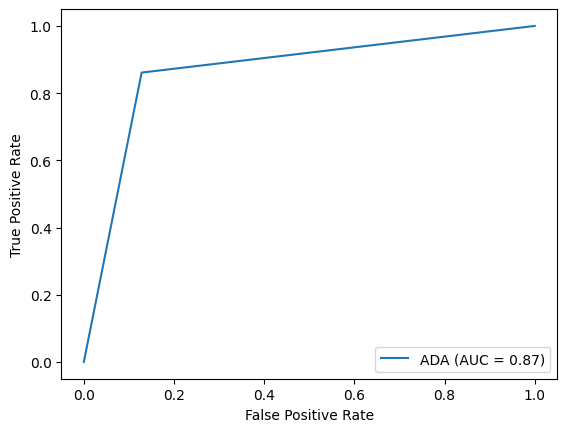

TabPFN Test Accuracy: 87.0
TabPFN Test f1_score: 87.0
TabPFN Test precision_score: 87.0
TabPFN Test recall_score: 87.0


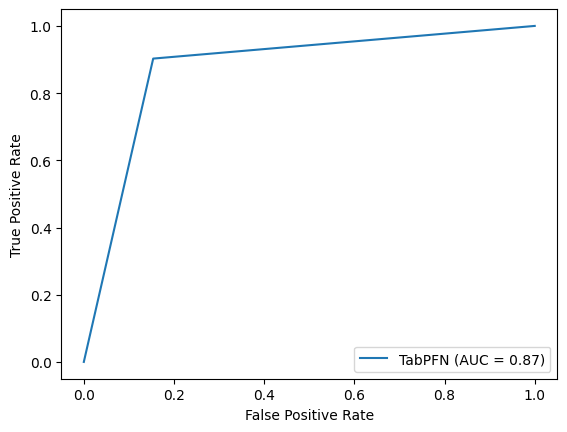

Bagg Test Accuracy: 87.0
Bagg Test f1_score: 87.0
Bagg Test precision_score: 87.0
Bagg Test recall_score: 87.0


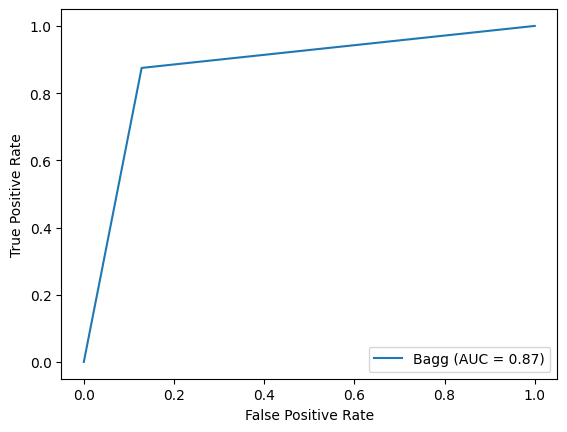

RF Test Accuracy: 86.0
RF Test f1_score: 86.0
RF Test precision_score: 86.0
RF Test recall_score: 86.0


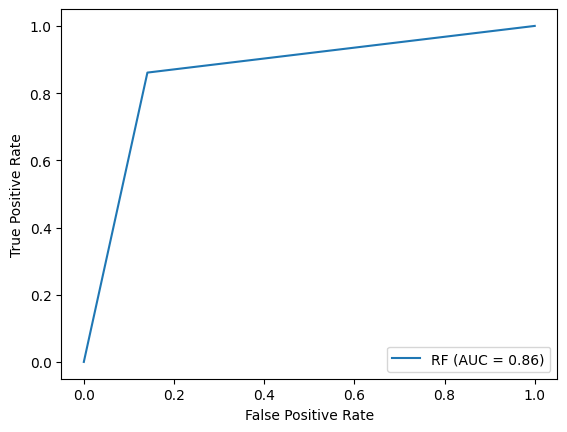

NB Test Accuracy: 87.0
NB Test f1_score: 87.0
NB Test precision_score: 87.0
NB Test recall_score: 87.0


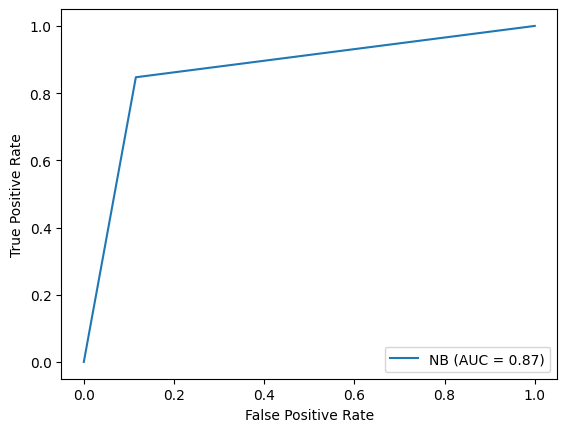

MLP Test Accuracy: 84.0
MLP Test f1_score: 84.0
MLP Test precision_score: 84.0
MLP Test recall_score: 84.0


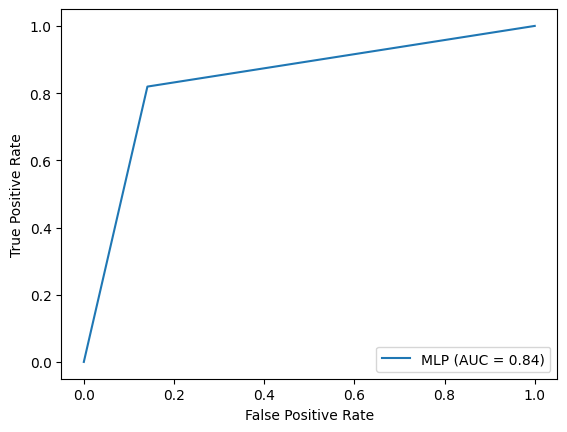

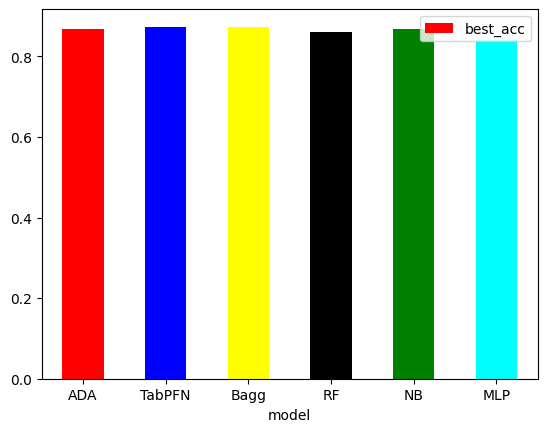

In [ ]:
estimators_all = [ADA_pipeGS, TabPFN_pipeGS ,Bagg_pipeGS,RF_pipeGS, NB_pipeGS,  MLP_pipeGS]
Pip = {0: 'ADA', 1: 'TabPFN', 2: 'Bagg', 3:'RF', 4:'NB', 5:'MLP' }

train = model_training(estimators_all, X_res_a, y_res_a)
test = model_testing(Pip, train, X_test_a, y_test_a)

In [ ]:
#estimators_merge = [ ('Bagg', Bagg_pipeGS) , ('TabPFN', TabPFN_pipeGS),('ADA', ADA_pipeGS),('MLP', MLP_pipeGS),('RF', RF_pipeGS),('NB', NB_pipeGS)]  LR_pipeGS
estimators_merge = [ ('Bagg', Bagg_pipeGS), ('TabPFN', TabPFN_pipeGS),('MLP', MLP_pipeGS), ('LR', LR_pipeGS)]
voting_pipe = Pipeline([['VotingClassifier', VotingClassifier(estimators=estimators_merge)]])

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
voting_merge_training = voting_training(voting_pipe, X_res_a, y_res_a)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [ ]:
voting_merge_testing = voting_evaluation(voting_merge_training, X_test_a, y_test_a)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{}Test Accuracy: {} 0.88
{} Test Precision: {} 88.0
{} Test recall: {} 88.0
{} Test F-1score: {} 88.0


In [ ]:
estimators_merge_report = [ ('Bagg', BaggingClassifier(max_features=0.7, max_samples=0.7, n_estimators=150,random_state=rs)), ('TabPFN', TabPFNClassifier(N_ensemble_configurations=7, seed=rs)),
                           ('MLP',MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs)), ('LR', LogisticRegression(random_state=rs))]

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
report(VotingClassifier(estimators=estimators_merge_report),X_res_a, y_res_a,X_test_a, y_test_a)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


                  precision    recall  f1-score   support

NO Heart disease       0.89      0.87      0.88        78
   Heart disease       0.86      0.89      0.88        72

        accuracy                           0.88       150
       macro avg       0.88      0.88      0.88       150
    weighted avg       0.88      0.88      0.88       150



In [ ]:
voting_merge_cv = cv_voting(voting_pipe, X_res_all, y_res_all)
voting_merge_cv

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

,CV,model,best_acc
0,LOOC,Voting,0.874359


#Stacking

Functions

In [ ]:


def stacking_training(stacking_model, X_train, y_train):
  stacking_model.fit(X_train, y_train)
  return stacking_model

def stacking_evaluation(stacking_model, X_test, y_test):
  results = []
  score = stacking_model.score(X_test, y_test)
  print("{}Test Accuracy: {}", score)
  pred = stacking_model.predict(X_test)
  precisions, recall, f1_score, _ = precision_recall_fscore_support(y_test, pred)
  print("{} Test Precision: {}", round(mean(precisions),2) * 100)
  print("{} Test recall: {}", round(mean(recall),2) * 100)
  print("{} Test F-1score: {}", round(mean(f1_score),2) * 100)

  results.append({
          'model': 'Voting',
          'best_acc': score,

      })

  df_stack_test = pd.DataFrame(results,columns=['model','best_acc'])
  return df_stack_test

def cv_stacking(stacking_model, X, y):

  scores_=[]

    #LOOC
  scores_LOOC = cross_val_score(stacking_model, X, y, scoring='accuracy', cv=cv_LOOC, n_jobs=-1)

  scores_.append({
          'CV' :'LOOC',
          'model': 'Stacking',
          'best_acc': mean(scores_LOOC),

      })

  df_stack = pd.DataFrame(scores_,columns=['CV', 'model','best_acc'])

  return df_stack



Stacking Statlog

In [ ]:
TabPFN_statlog_GS =  TabPFNClassifier(N_ensemble_configurations=2, seed=rs)

MLP_GS = MLPClassifier(random_state=rs)
ADA_GS = AdaBoostClassifier(learning_rate=0.04, n_estimators=180, random_state=rs)
LR_GS = LogisticRegression(C=1.1, max_iter=7, penalty='l2', solver='liblinear',random_state=rs)
ExtraTrees_GS = ExtraTreesClassifier(random_state=rs, criterion='gini', max_depth=12, max_leaf_nodes=25, n_estimators=50)

ExtraTrees_pipeGS = Pipeline([
                    ("ExtraTrees", ExtraTrees_GS)])

TabPFN_statlog_pipeGS = Pipeline([
                    ("TabPFN", TabPFN_statlog_GS)])

MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])

Ada_pipeGS = Pipeline([
                    ("ADA", ADA_GS)])
LR_pipeGS = Pipeline([
                    ("LR", LR_GS)])

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:

estimators_statlog = [('LR', LR_pipeGS ), ('MLP', MLP_pipeGS ), ('ADA', Ada_pipeGS) ,('ExtraTrees', ExtraTrees_pipeGS), ('TabPFN', TabPFN_statlog_pipeGS)]
stacking_pipe = Pipeline([['StackingClassifier', StackingClassifier(final_estimator= MLPClassifier(random_state=rs),estimators=estimators_statlog)]])


In [ ]:
stacking_statlog_training = stacking_training(stacking_pipe, X_res_s, y_res_s)

/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
stacking_statlog_testing = stacking_evaluation(stacking_statlog_training, X_test_s, y_test_s)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{}Test Accuracy: {} 0.8703703703703703
{} Test Precision: {} 87.0
{} Test recall: {} 87.0
{} Test F-1score: {} 87.0


In [ ]:
stacking_statlog_cv = cv_stacking(stacking_pipe, X_res_stat, y_res_stat)


Stacking Clevland

In [ ]:
TabPFN_cleve_GS= TabPFNClassifier(device='cpu', N_ensemble_configurations=1, seed=rs)
MLP_GS = MLPClassifier(activation='identity', alpha=0.0001, hidden_layer_sizes=(100,), learning_rate='constant', max_iter=600, solver='sgd',random_state=rs)
LR_GS = LogisticRegression( C=0.01, max_iter=21, penalty='l2', solver='saga',random_state=rs)
SVLC_GS =SVC(C=1.2, gamma=0.4, kernel='rbf',random_state=rs)
LR_pipeGS = Pipeline([
                    ("logistic regression", LR_GS)])
# ADA_pipeGS = Pipeline([
#                     ("ADABoost", ADA_GS)])
MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])
TabPFN_cleve_pipeGS = Pipeline([
                    ("TabPFN", TabPFN_cleve_GS)])

SVLC_pipeGS = Pipeline([
                    ("SVLC", SVLC_GS)])
estimators_clevland = [('LR', LR_pipeGS ),('TabPFN', TabPFN_cleve_pipeGS), ('MLP', MLP_pipeGS)]


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
stacking_pipe = Pipeline([['StackingClassifier', StackingClassifier(final_estimator=LogisticRegression( C=0.01, max_iter=21, penalty='l2', solver='saga',random_state=rs),estimators=estimators_clevland)]])


In [ ]:
stacking_clevland_training = stacking_training(stacking_pipe, X_smo_c, y_smo_c)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
stacking_clevland_testing = stacking_evaluation(stacking_clevland_training, X_test_c, y_test_c)

{}Test Accuracy: {} 0.9333333333333333
{} Test Precision: {} 94.0
{} Test recall: {} 93.0
{} Test F-1score: {} 93.0


In [ ]:
stacking_clevland_cv = cv_stacking(stacking_pipe, X_smo_cleve, y_smo_cleve)


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

In [ ]:
stacking_clevland_cv

,CV,model,best_acc
0,LOOC,Stacking,0.85625


Stacking Merge

In [ ]:
# estimators_merge = [ ('Bagg', Bagg_pipeGS), ('TabPFN', TabPFN_pipeGS),('MLP', MLP_pipeGS), ('LR', LR_pipeGS)]

stacking_pipe = Pipeline([['StackingClassifier', StackingClassifier( final_estimator=MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs) , estimators=estimators_merge)]])


In [ ]:
stacking_merge_training = stacking_training(stacking_pipe, X_res_a, y_res_a)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REAC

In [ ]:
stacking_merge_testing = stacking_evaluation(stacking_merge_training, X_test_a, y_test_a)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{}Test Accuracy: {} 0.86
{} Test Precision: {} 86.0
{} Test recall: {} 86.0
{} Test F-1score: {} 86.0


In [ ]:
NB_GS = GaussianNB()
Bagg_GS = BaggingClassifier(max_features=0.7, max_samples=0.7, n_estimators=150,random_state=rs)
ADA_GS = AdaBoostClassifier(learning_rate=0.05, n_estimators=250,random_state=rs)
RF_GS = RandomForestClassifier(criterion='entropy', max_depth=12, max_features='auto', n_estimators=100,random_state=rs)

lgbm_GS = lgb.LGBMClassifier(random_state=rs,colsample_bytree= 0.1, learning_rate= 1, min_child_samples= 50, min_child_weight= 0.01, num_leaves= 5, reg_alpha= 0.1, reg_lambda= 10, subsample= 0.001)

KNN_GS = KNeighborsClassifier(n_neighbors=20)
MLP_GS = MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs)
LR_GS = LogisticRegression(random_state=rs)


TabPFN_GS =  TabPFNClassifier(N_ensemble_configurations=7, seed=rs)


LR_pipeGS = Pipeline([
                    ("LR", LR_GS)])

MLP_pipeGS = Pipeline([
                    ("MLP", MLP_GS)])

KNN_pipeGS = Pipeline([
                    ("KNN", KNN_GS)])

Bagg_pipeGS = Pipeline([
                    ("Bagging", Bagg_GS)])

ADA_pipeGS = Pipeline([
                    ("LR", ADA_GS)])

NB_pipeGS = Pipeline([
                    ("NB", NB_GS)])

RF_pipeGS = Pipeline([
                    ("RF", RF_GS)])
TabPFN_pipeGS = Pipeline([
                    ("TabPFN", TabPFN_GS)])

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
estimators_merge_report = [ ('Bagg', BaggingClassifier(max_features=0.7, max_samples=0.7, n_estimators=150,random_state=rs)), ('TabPFN', TabPFNClassifier(N_ensemble_configurations=7, seed=rs)),
                           ('MLP',MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs)), ('LR', LogisticRegression(random_state=rs))]

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


In [ ]:
report(StackingClassifier(final_estimator= MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs), estimators=estimators_merge_report),X_res_a, y_res_a,X_test_a, y_test_a)

Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REAC

                  precision    recall  f1-score   support

NO Heart disease       0.88      0.87      0.88        78
   Heart disease       0.86      0.88      0.87        72

        accuracy                           0.87       150
       macro avg       0.87      0.87      0.87       150
    weighted avg       0.87      0.87      0.87       150



In [ ]:


report(StackingClassifier( final_estimator= MLPClassifier(activation='relu', alpha=0.1, hidden_layer_sizes=(20,), learning_rate='constant', max_iter=100, solver='lbfgs',random_state=rs)
, estimators=estimators_merge_report),X_res_a, y_res_a,X_test_a, y_test_a)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters


/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.9/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REAC

                  precision    recall  f1-score   support

NO Heart disease       0.88      0.87      0.88        78
   Heart disease       0.86      0.88      0.87        72

        accuracy                           0.87       150
       macro avg       0.87      0.87      0.87       150
    weighted avg       0.87      0.87      0.87       150



In [ ]:
stacking_merge_cv = cv_stacking(stacking_pipe, X_res_all, y_res_all)


Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Transformer with 25.82 M parameters
Loading model that can be used for inference only
Using a Tr

In [ ]:
stacking_merge_cv

,CV,model,best_acc
0,LOOC,Stacking,0.876923


#Results and plots

functions

In [ ]:
# base_test_statlog
# base_smote_statlog
# base_ros_statlog

# base_clevland
# base_smote_clevland
# base_ros_clevland

# base_merge
# base_smote_merge
# base_ros_merge

df_base_stat =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.87, 0.81, 0.83]
})

df_smo_stat =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.87, 0.81, 0.80]
})

df_ros_stat = pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.85, 0.81, 0.81]
})

def combine_df(df, df1):
  concat_df = pd.concat([df, df1],axis=0, ignore_index=False)
  return concat_df


def df_combiner_base_models(df1, df2, df3, palette):
    concat_df = pd.concat([df1, df2, df3],axis=0, ignore_index=False)
    concat_df['col'] = (len(df1)*('base',) + len(df2)*('SMOTE',)+ len(df3)*('ROS',))
    concat_df.reset_index(inplace=True)
    sns.catplot(x='model', y='best_acc', hue='col', kind='bar', data=concat_df, palette=palette, height=8.27, aspect=11.7/8.27)
    return concat_df

def df_combiner_tune_models(df1, df2, palette):
    concat_df = pd.concat([df1, df2],axis=0, ignore_index=False)
    concat_df['col'] = (len(df1)*('base',) + len(df2)*('Tuned',))
    concat_df.reset_index(inplace=True)
    sns.catplot(x='model', y='best_acc', hue='col', kind='bar', data=concat_df, palette=palette, height=8.27, aspect=11.7/8.27)
    return concat_df

# 'tab10'  'husl'

# tab S 87,87,85 C 93, 93, 93 M 87, 87, 87

# Stat R lgbm 81, Xtra 81 S 81 80 B 81 83
#Cleve: R 85 93 S 85 92 B 83 95
#Merged: R 84 87 S 83 84 B 84 87



In [ ]:
base_test_statlog = combine_df(base_test_statlog, df_base_stat)
base_test_statlog

,model,best_acc
0,LR,0.851852
1,NB,0.703704
2,DT,0.740741
3,SVLC,0.870370
4,GB,0.814815
5,ADA,0.740741
6,Bagg,0.851852
7,RF,0.796296
8,MLP,0.833333
9,XGB,0.796296


In [ ]:
df_smo_stat = combine_df( base_smote_statlog, df_smo_stat)
df_smo_stat

,model,best_acc
0,LR,0.851852
1,NB,0.740741
2,DT,0.833333
3,SVLC,0.870370
4,GB,0.814815
5,ADA,0.796296
6,Bagg,0.796296
7,RF,0.814815
8,MLP,0.870370
9,XGB,0.814815


In [ ]:
df_ros_stat = combine_df( base_ros_statlog, df_ros_stat)
df_ros_stat

,model,best_acc
0,LR,0.870370
1,NB,0.703704
2,DT,0.796296
3,SVLC,0.888889
4,GB,0.814815
5,ADA,0.814815
6,Bagg,0.814815
7,RF,0.833333
8,MLP,0.870370
9,XGB,0.833333


,index,model,best_acc,col
0,0,LR,0.851852,base
1,1,NB,0.703704,base
2,2,DT,0.740741,base
3,3,SVLC,0.870370,base
4,4,GB,0.814815,base
5,5,ADA,0.740741,base
6,6,Bagg,0.851852,base
7,7,RF,0.796296,base
8,8,MLP,0.833333,base
9,9,XGB,0.796296,base


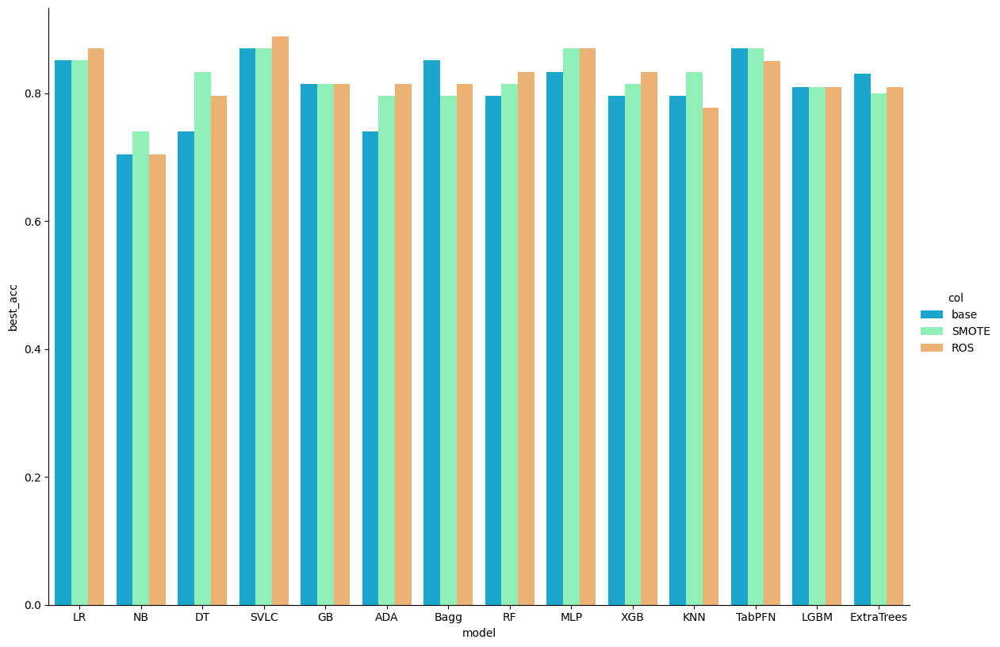

In [ ]:
df_combiner_base_models(base_test_statlog, df_smo_stat
, df_ros_stat, 'rainbow')

BASE MODELS/ TUNED

In [ ]:
df_tuned_stat =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.87, 0.83, 0.85]
})

In [ ]:
tuned_ros_statlog= combine_df(tuned_ros_statlog, df_tuned_stat)

In [ ]:
df_ros_stat

,model,best_acc
0,LR,0.870370
1,NB,0.703704
2,DT,0.796296
3,SVLC,0.888889
4,GB,0.814815
5,ADA,0.814815
6,Bagg,0.814815
7,RF,0.833333
8,MLP,0.870370
9,XGB,0.833333


,index,model,best_acc,col
0,0,LR,0.870370,base
1,1,NB,0.703704,base
2,2,DT,0.796296,base
3,3,SVLC,0.888889,base
4,4,GB,0.814815,base
5,5,ADA,0.814815,base
6,6,Bagg,0.814815,base
7,7,RF,0.833333,base
8,8,MLP,0.870370,base
9,9,XGB,0.833333,base


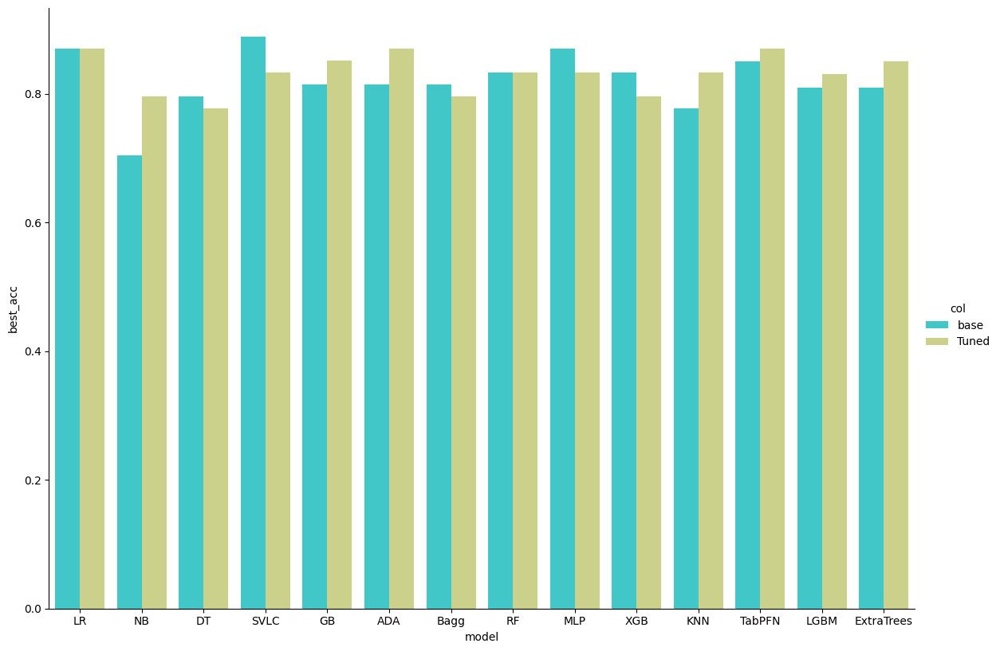

In [ ]:
df_combiner_tune_models(df_ros_stat, tuned_ros_statlog, 'rainbow')

Cleveland

In [ ]:
base_clevland
base_smote_clevland
base_ros_clevland


df_base_cleve =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.93, 0.95, 0.83]
})

df_smo_cleve =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.93, 0.92, 0.85]
})

df_ros_cleve = pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.93, 0.93, 0.85]
})

In [ ]:
base_clevland = combine_df(base_clevland, df_base_cleve)
base_smote_clevland = combine_df( base_smote_clevland, df_smo_cleve)
base_ros_clevland = combine_df( base_ros_clevland, df_ros_cleve)

,index,model,best_acc,col
0,0,LR,0.900000,base
1,1,NB,0.883333,base
2,2,DT,0.750000,base
3,3,SVLC,0.933333,base
4,4,GB,0.816667,base
5,5,ADA,0.833333,base
6,6,Bagg,0.800000,base
7,7,RF,0.850000,base
8,8,MLP,0.916667,base
9,9,XGB,0.850000,base


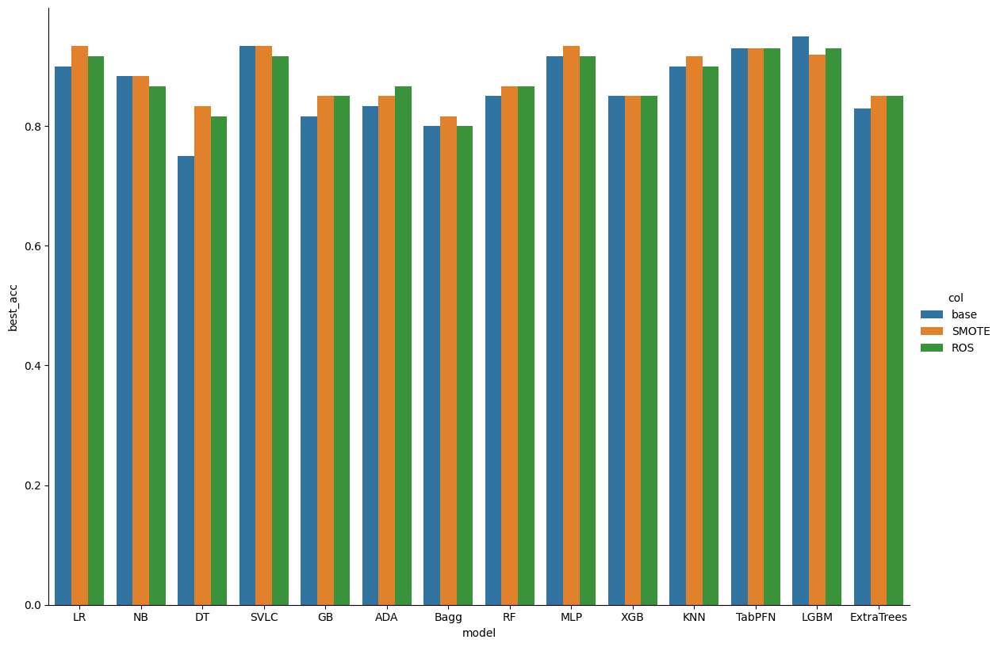

In [ ]:
df_combiner_base_models(base_clevland, base_smote_clevland
, base_ros_clevland, 'tab10')

In [ ]:
df_tuned_cleve =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.93, 0.9, 0.85]
})

In [ ]:
tuned_smo_clevland= combine_df(tuned_smo_clevland,df_tuned_cleve)

,index,model,best_acc,col
0,0,LR,0.933333,base
1,1,NB,0.883333,base
2,2,DT,0.833333,base
3,3,SVLC,0.933333,base
4,4,GB,0.850000,base
5,5,ADA,0.850000,base
6,6,Bagg,0.816667,base
7,7,RF,0.866667,base
8,8,MLP,0.933333,base
9,9,XGB,0.850000,base


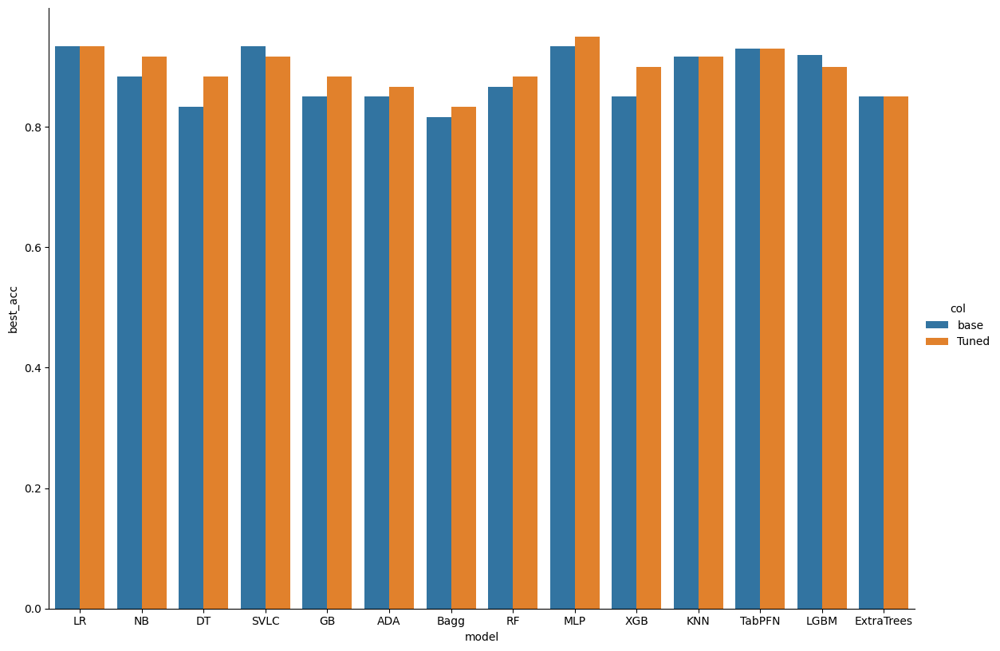

In [ ]:
df_combiner_tune_models(base_smote_clevland, tuned_smo_clevland, 'tab10')

Merge

In [ ]:
base_merge
base_smote_merge
base_ros_merge

df_base_merge =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.87, 0.86, 0.87]
})

df_smo_merge =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.87, 0.83, 0.83]
})

df_ros_merge = pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.86, 0.84, 0.87]
})

In [ ]:
base_merge = combine_df(base_merge, df_base_merge)
base_smote_merge = combine_df( base_smote_merge, df_smo_merge)
base_ros_merge = combine_df( base_ros_merge, df_ros_merge)


,index,model,best_acc,col
0,0,LR,0.853333,base
1,1,NB,0.860000,base
2,2,DT,0.833333,base
3,3,SVLC,0.846667,base
4,4,GB,0.846667,base
5,5,ADA,0.833333,base
6,6,Bagg,0.840000,base
7,7,RF,0.860000,base
8,8,MLP,0.853333,base
9,9,XGB,0.833333,base


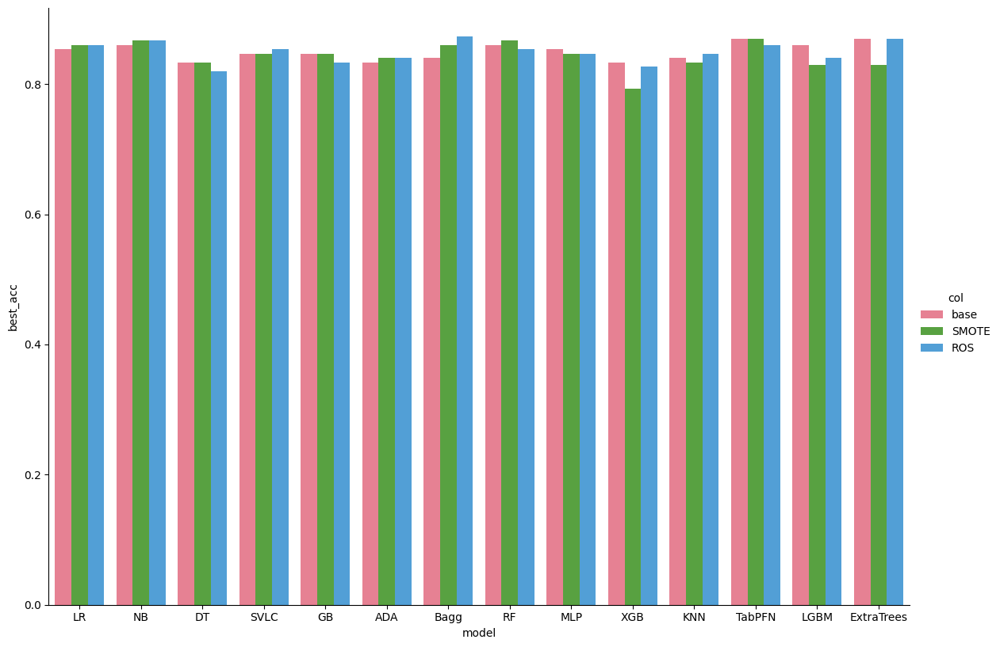

In [ ]:
df_combiner_base_models(base_merge, base_smote_merge
, base_ros_merge, 'husl')

Based/tuned

In [ ]:
df_tuned_merge =  pd.DataFrame({
    'model' : ['TabPFN','LGBM','ExtraTrees'],
    'best_acc':[0.87, 0.83, 0.85]
})

In [ ]:
tuned_ros_merge= combine_df(tuned_ros_merge,df_tuned_merge)

,index,model,best_acc,col
0,0,LR,0.860000,base
1,1,NB,0.866667,base
2,2,DT,0.820000,base
3,3,SVLC,0.853333,base
4,4,GB,0.833333,base
5,5,ADA,0.840000,base
6,6,Bagg,0.873333,base
7,7,RF,0.853333,base
8,8,MLP,0.846667,base
9,9,XGB,0.826667,base


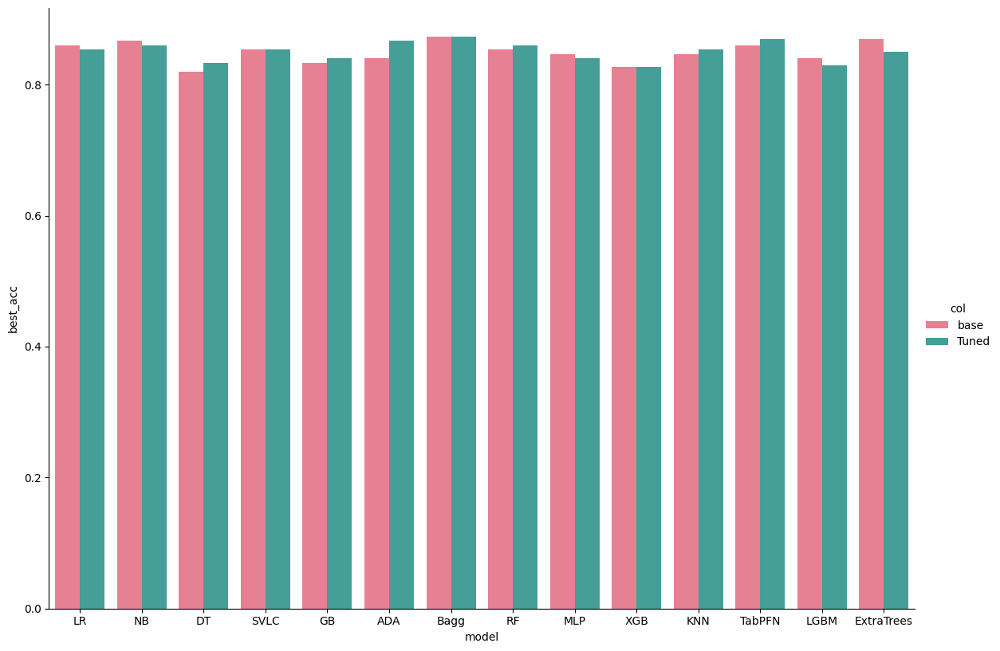

In [ ]:
df_combiner_tune_models(base_ros_merge, tuned_ros_merge, 'husl')

Ensemble Methods

In [ ]:
ensemble_df =  pd.DataFrame({
    'model' : ['VotingStatlog','StackingStatlog','VotingCleveland', 'StackingCleveland', 'Voting Merge', 'StackingMerge'],
    'best_acc':[89, 87, 95, 93, 88, 89]
})

In [ ]:
ensemble_df

,model,best_acc
0,VotingStatlog,89
1,StackingStatlog,87
2,VotingCleveland,95
3,StackingCleveland,93
4,Voting Merge,88
5,StackingMerge,89


In [ ]:
def bar_plot_ensemble(df, c1, c2, dataset_label):
  fig, ax = plt.subplots(figsize=(13.33,7.5), dpi = 96)
  bar1 = ax.bar(df[c1], df[c2], width=0.6)
  # Create the grid
  ax.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
  ax.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

  # Reformat x-axis label and tick labels
  ax.set_xlabel('', fontsize=12, labelpad=10) # No need for an axis label
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.xaxis.set_major_locator(MaxNLocator(integer=True))
  ax.xaxis.set_tick_params(pad=2, labelbottom=True, bottom=True, labelsize=12, labelrotation=0)
  labels = ['VotingStatlog','StackingStatlog','VotingCleveland', 'StackingCleveland', 'Voting Merge', 'StackingMerge']

  ax.set_xticks(df[c1], labels) # Map integers numbers from the series to labels list

  # Reformat y-axis
  ax.set_ylabel('Accuracy %', fontsize=12, labelpad=10)
  ax.yaxis.set_label_position("left")
  ax.yaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.yaxis.set_major_locator(MaxNLocator(integer=True))
  ax.yaxis.set_tick_params(pad=2, labeltop=False, labelbottom=True, bottom=False, labelsize=12)

  # Add label on top of each bar
  ax.bar_label(bar1, labels=[f'{e:,.1f}' for e in df[c2]], padding=3, color='black', fontsize=8)

    # Remove the spines
  ax.spines[['top','left','bottom']].set_visible(False)

  # Make the left spine thicker
  ax.spines['right'].set_linewidth(1.1)

  # Add in red line and rectangle on top
  ax.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color='#E3120B', linewidth=.6)
  ax.add_patch(plt.Rectangle((0.12,.98), 0.04, -0.02, facecolor='#E3120B', transform=fig.transFigure, clip_on=False, linewidth = 0))

  # Add in title and subtitle
  ax.text(x=0.12, y=.93, s="Accuracy % evaluation for combined models using ensemble methods", transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
  ax.text(x=0.12, y=.90, s= "%s datasets" %(dataset_label), transform=fig.transFigure, ha='left', fontsize=12, alpha=.8)



  # Adjust the margins around the plot area
  plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.85, wspace=None, hspace=None)

  # Set a white background
  fig.patch.set_facecolor('white')

    # Colours - Choose the extreme colours of the colour map
  colours = ["#2196f3", "#bbdefb"]

  # Colormap - Build the colour maps
  cmap = mpl.colors.LinearSegmentedColormap.from_list("colour_map", colours, N=256)
  norm = mpl.colors.Normalize(df[c2].min(), df[c2].max()) # linearly normalizes data into the [0.0, 1.0] interval

  # Plot bars
  bar1 = ax.bar(df[c1], df[c2], color=cmap(norm(df[c2])), width=0.6, zorder=2)

  # Find the average data point and split the series in 2
  average = df[c2].mean()
  below_average = df[df[c2]<average]
  above_average = df[df[c2]>=average]
  # Colours - Choose the extreme colours of the colour map
  colors_high = ["#ff5a5f", "#c81d25"] # Extreme colours of the high scale
  colors_low = ["#2196f3","#bbdefb"] # Extreme colours of the low scale

  # Colormap - Build the colour maps
  cmap_low = mpl.colors.LinearSegmentedColormap.from_list("low_map", colors_low, N=256)
  cmap_high = mpl.colors.LinearSegmentedColormap.from_list("high_map", colors_high, N=256)
  norm_low = mpl.colors.Normalize(below_average[c2].min(), average) # linearly normalizes data into the [0.0, 1.0] interval
  norm_high = mpl.colors.Normalize(average, above_average[c2].max())

  # Plot bars and average (horizontal) line
  bar1 = ax.bar(below_average[c1], below_average[c2], color=cmap_low(norm_low(below_average[c2])), width=0.6, label='Below Average', zorder=2)
  bar2 = ax.bar(above_average[c1], above_average[c2], color=cmap_high(norm_high(above_average[c2])), width=0.6, label='Above Average', zorder=2)
  plt.axhline(y=average, color = 'grey', linewidth=1)

  # Determine the y-limits of the plot
  ymin, ymax = ax.get_ylim()
  # Calculate a suitable y position for the text label
  y_pos = average/ymax + 0.03
  # Annotate the average line
  # ax.text(0.88, y_pos, f'Average = {average:.1f}', ha='center', va='center', transform=ax.transAxes, size=8, zorder=3)

  # Add legend
  ax.legend(loc="best", ncol=2, bbox_to_anchor=[1, 1.07], borderaxespad=0, frameon=False, fontsize=8)



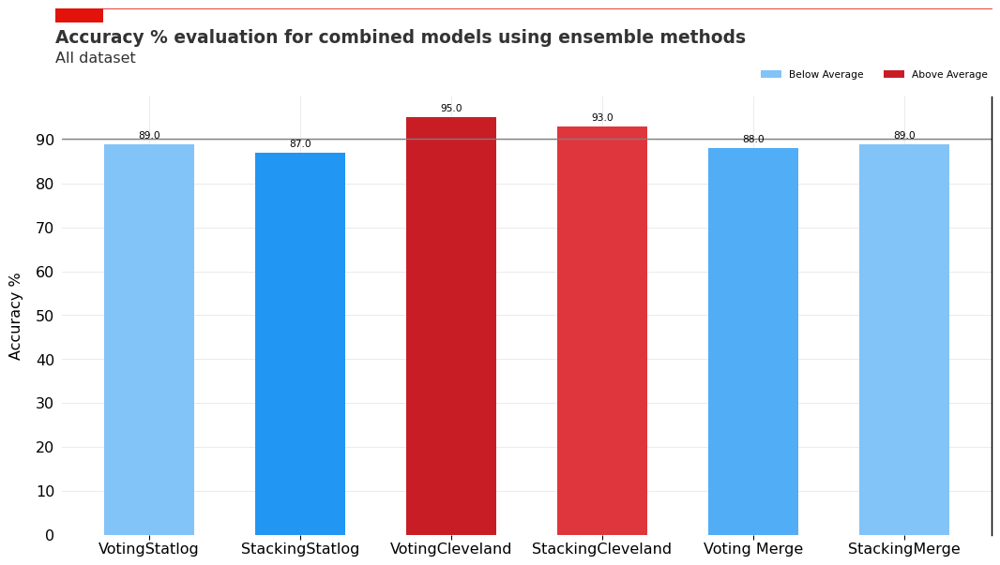

In [ ]:
bar_plot_ensemble(ensemble_df, 'model', 'best_acc', 'All')

CV graphs

In [ ]:
base_ros_cv_statlog
base_smote_clevland_cv
base_ros_merge_cv
tuned_ros_statlog_cv
tuned_smo_clevland_cv
tuned_ros_merge_cv

In [ ]:
import pickle

# Open a file and use dump()
with open('base_ros_cv_statlog.pkl', 'wb') as file:

    # A new file will be created
    pickle.dump(base_ros_cv_statlog, file)

# Open a file and use dump()
with open('base_smote_clevland_cv.pkl', 'wb') as file:

    # A new file will be created
    pickle.dump(base_smote_clevland_cv, file)

# Open a file and use dump()
with open('base_ros_merge_cv.pkl', 'wb') as file:

    # A new file will be created
    pickle.dump(base_ros_merge_cv, file)

# Open a file and use dump()
with open('tuned_ros_statlog_cv.pkl', 'wb') as file:

    # A new file will be created
    pickle.dump(tuned_ros_statlog_cv, file)

# Open a file and use dump()
with open('tuned_smo_clevland_cv.pkl', 'wb') as file:

    # A new file will be created
    pickle.dump(tuned_smo_clevland_cv, file)

# Open a file and use dump()
with open('tuned_ros_merge_cv.pkl', 'wb') as file:

    # A new file will be created
    pickle.dump(tuned_ros_merge_cv, file)

In [ ]:
# Open the file in binary mode
import pickle

with open('base_ros_cv_statlog.pkl', 'rb') as file:

    # Call load method to deserialze
    base_ros_cv_statlog1 = pickle.load(file)


# Open the file in binary mode
with open('base_smote_clevland_cv.pkl', 'rb') as file:

    # Call load method to deserialze
    base_smote_clevland_cv1 = pickle.load(file)


# Open the file in binary mode
with open('base_ros_merge_cv.pkl', 'rb') as file:

    # Call load method to deserialze
    base_ros_merge_cv1 = pickle.load(file)


# Open the file in binary mode
with open('tuned_ros_statlog_cv.pkl', 'rb') as file:

    # Call load method to deserialze
    tuned_ros_statlog_cv1 = pickle.load(file)


# Open the file in binary mode
with open('tuned_smo_clevland_cv.pkl', 'rb') as file:

    # Call load method to deserialze
    tuned_smo_clevland_cv1 = pickle.load(file)


# Open the file in binary mode
with open('tuned_ros_merge_cv.pkl', 'rb') as file:

    # Call load method to deserialze
    tuned_ros_merge_cv1 = pickle.load(file)




In [ ]:
tab_xtra_lgbm_cv_base_stat =  pd.DataFrame({
    'model' : ['TabPFN','ExtraTrees','LGBM'],
    'best_acc':[88, 87, 85]
})

tab_xtra_lgbm_cv_tuned_stat =  pd.DataFrame({
    'model' : ['TabPFN','ExtraTrees','LGBM'],
    'best_acc':[88, 83, 84]
})

loocv_base_stat = combine_df(base_ros_cv_statlog1, tab_xtra_lgbm_cv_base_stat)

loocv_tuned_stat = combine_df(tuned_ros_statlog_cv1, tab_xtra_lgbm_cv_tuned_stat)
##########################################################

tab_xtra_lgbm_cv_base_cleve =  pd.DataFrame({
    'model' : ['TabPFN','ExtraTrees','LGBM'],
    'best_acc':[86, 85, 81]
})

tab_xtra_lgbm_cv_tuned_cleve =  pd.DataFrame({
    'model' : ['TabPFN','ExtraTrees','LGBM'],
    'best_acc':[86, 81, 80]
})


loocv_base_cleve = combine_df(base_smote_clevland_cv1, tab_xtra_lgbm_cv_base_cleve)

loocv_tuned_cleve = combine_df(tuned_smo_clevland_cv1, tab_xtra_lgbm_cv_tuned_cleve)
############################################################

tab_xtra_lgbm_cv_base_merge =  pd.DataFrame({
    'model' : ['TabPFN','ExtraTrees','LGBM'],
    'best_acc':[88, 87, 87]
})

tab_xtra_lgbm_cv_tuned_merge =  pd.DataFrame({
    'model' : ['TabPFN','ExtraTrees','LGBM'],
    'best_acc':[87, 87, 87]
})

loocv_base_merge = combine_df(base_ros_merge_cv1, tab_xtra_lgbm_cv_base_merge)

loocv_tuned_merge = combine_df(tuned_ros_merge_cv1, tab_xtra_lgbm_cv_tuned_merge)

In [ ]:
base_ros_cv_statlog
base_smote_clevland_cv
base_ros_merge_cv
tuned_ros_statlog_cv
tuned_smo_clevland_cv
tuned_ros_merge_cv

In [ ]:
def cv_horizontal_plot(df1, df2, palette):
    concat_df = pd.concat([df1, df2],axis=0, ignore_index=False)
    concat_df['col'] = (len(df1)*('base',) + len(df2)*('Tuned',))
    concat_df.reset_index(inplace=True)
    sns.catplot(x='best_acc', y='model', hue='col', kind='bar', data=concat_df, palette=palette, height=8.27, aspect=11.7/8.27)
    return concat_df

,index,CV,model,best_acc,col
0,0,LOOC,LR,85.0,base
1,1,LOOC,NB,83.0,base
2,2,LOOC,DT,77.0,base
3,3,LOOC,SVLC,84.0,base
4,4,LOOC,GB,84.0,base
5,5,LOOC,ADA,79.0,base
6,6,LOOC,Bagg,84.0,base
7,7,LOOC,RF,86.0,base
8,8,LOOC,MLP,86.0,base
9,9,LOOC,XGB,84.0,base


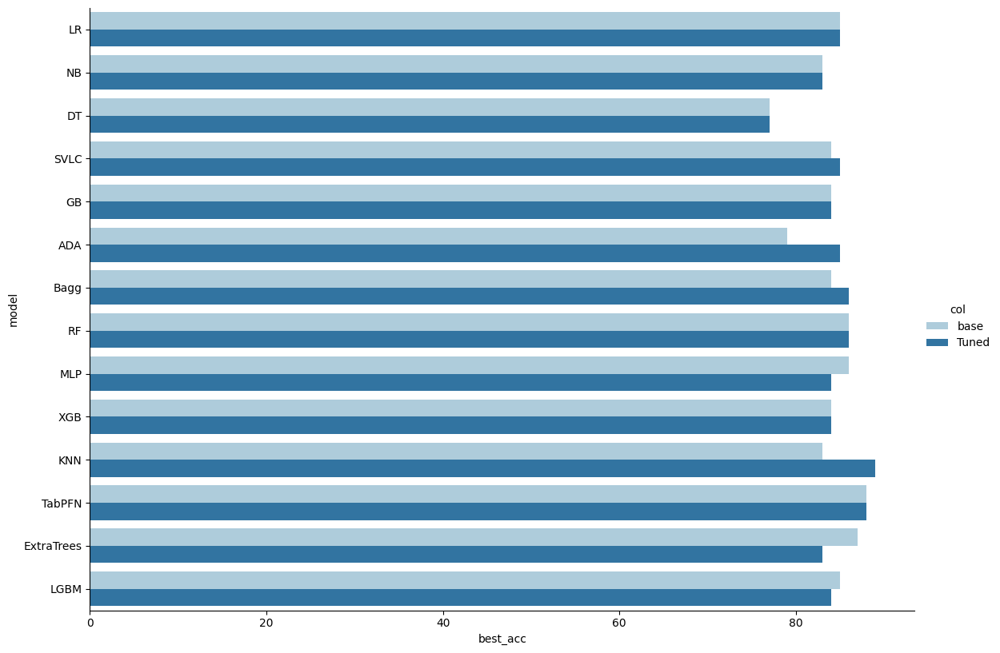

In [ ]:
cv_horizontal_plot(loocv_base_stat, loocv_tuned_stat, 'Paired')

,index,CV,model,best_acc,col
0,0,LOOC,LR,83.0,base
1,1,LOOC,NB,82.0,base
2,2,LOOC,DT,73.0,base
3,3,LOOC,SVLC,84.0,base
4,4,LOOC,GB,79.0,base
5,5,LOOC,ADA,82.0,base
6,6,LOOC,Bagg,78.0,base
7,7,LOOC,RF,82.0,base
8,8,LOOC,MLP,85.0,base
9,9,LOOC,XGB,80.0,base


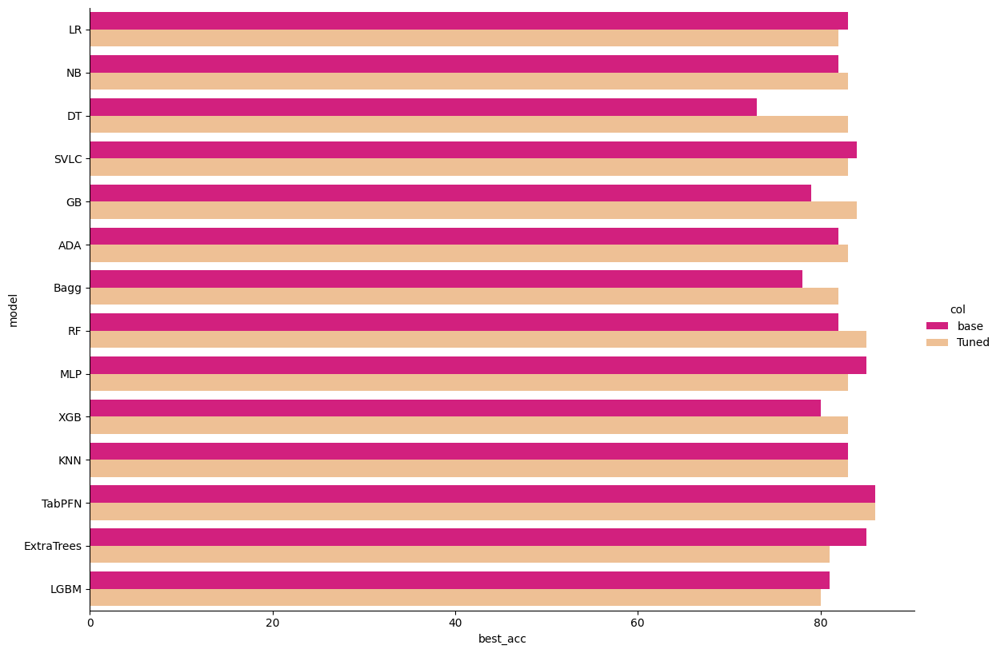

In [ ]:
cv_horizontal_plot(loocv_base_cleve, loocv_tuned_cleve, 'Accent_r')

,index,CV,model,best_acc,col
0,0,LOOC,LR,86.0,base
1,1,LOOC,NB,85.0,base
2,2,LOOC,DT,82.0,base
3,3,LOOC,SVLC,86.0,base
4,4,LOOC,GB,87.0,base
5,5,LOOC,ADA,86.0,base
6,6,LOOC,Bagg,85.0,base
7,7,LOOC,RF,87.0,base
8,8,LOOC,MLP,87.0,base
9,9,LOOC,XGB,86.0,base


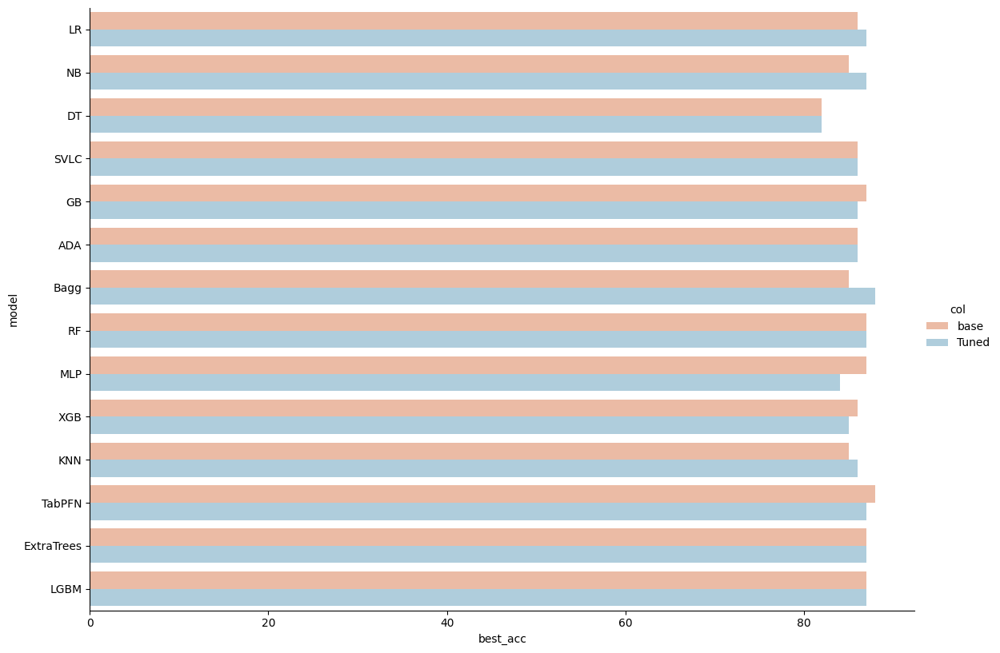

In [ ]:
cv_horizontal_plot(loocv_base_merge, loocv_tuned_merge, 'RdBu')

CV ensemble methods

In [ ]:
ensemble_df =  pd.DataFrame({
    'model' : ['Statlog SVM','Statlog Voting','Cleveland MLP', 'Cleveland Voting', 'Merge Baging \n ExtraTrees \n TabPFN \n RF \n ADA', 'Merge Voting'],
    'best_acc':[88, 89, 95, 95, 87, 88]
})

x_label = ['Statlog SVM','Statlog Voting','Cleveland MLP', 'Cleveland Voting', 'Merge Baging \n ExtraTrees \n TabPFN \n RF \n ADA', 'Merge Voting']

In [ ]:
def bar_plot_ensemble(df, c1, c2, dataset_label, x_labels):
  fig, ax = plt.subplots(figsize=(13.33,7.5), dpi = 96)
  bar1 = ax.bar(df[c1], df[c2], width=0.6)
  # Create the grid
  ax.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
  ax.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

  # Reformat x-axis label and tick labels
  ax.set_xlabel('', fontsize=12, labelpad=10) # No need for an axis label
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.xaxis.set_major_locator(MaxNLocator(integer=True))
  ax.xaxis.set_tick_params(pad=2, labelbottom=True, bottom=True, labelsize=12, labelrotation=0)
  labels = x_labels

  ax.set_xticks(df[c1], labels) # Map integers numbers from the series to labels list

  # Reformat y-axis
  ax.set_ylabel('Accuracy %', fontsize=12, labelpad=10)
  ax.yaxis.set_label_position("left")
  ax.yaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.yaxis.set_major_locator(MaxNLocator(integer=True))
  ax.yaxis.set_tick_params(pad=2, labeltop=False, labelbottom=True, bottom=False, labelsize=12)

  # Add label on top of each bar
  ax.bar_label(bar1, labels=[f'{e:,.1f}' for e in df[c2]], padding=3, color='black', fontsize=8)

    # Remove the spines
  ax.spines[['top','left','bottom']].set_visible(False)

  # Make the left spine thicker
  ax.spines['right'].set_linewidth(1.1)

  # Add in red line and rectangle on top
  ax.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color='#97e30b', linewidth=.6)
  ax.add_patch(plt.Rectangle((0.12,.98), 0.04, -0.02, facecolor='#97e30b', transform=fig.transFigure, clip_on=False, linewidth = 0))

  # Add in title and subtitle
  ax.text(x=0.12, y=.93, s="Accuracy % evaluation for tested models", transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
  ax.text(x=0.12, y=.90, s= "%s datasets" %(dataset_label), transform=fig.transFigure, ha='left', fontsize=12, alpha=.8)



  # Adjust the margins around the plot area
  plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.85, wspace=None, hspace=None)

  # Set a white background
  fig.patch.set_facecolor('white')

    # Colours - Choose the extreme colours of the colour map
  colours = ["#f3d021", "#f6fbbb"]

  # Colormap - Build the colour maps
  cmap = mpl.colors.LinearSegmentedColormap.from_list("colour_map", colours, N=256)
  norm = mpl.colors.Normalize(df[c2].min(), df[c2].max()) # linearly normalizes data into the [0.0, 1.0] interval

  # Plot bars
  bar1 = ax.bar(df[c1], df[c2], color=cmap(norm(df[c2])), width=0.6, zorder=2)

  # Find the average data point and split the series in 2
  average = df[c2].mean()
  below_average = df[df[c2]<average]
  above_average = df[df[c2]>=average]
  # Colours - Choose the extreme colours of the colour map
  colors_high = ["#5affce", "#23c81d"] # Extreme colours of the high scale
  colors_low = ["#f3d021","#f6fbbb"] # Extreme colours of the low scale

  # Colormap - Build the colour maps
  cmap_low = mpl.colors.LinearSegmentedColormap.from_list("low_map", colors_low, N=256)
  cmap_high = mpl.colors.LinearSegmentedColormap.from_list("high_map", colors_high, N=256)
  norm_low = mpl.colors.Normalize(below_average[c2].min(), average) # linearly normalizes data into the [0.0, 1.0] interval
  norm_high = mpl.colors.Normalize(average, above_average[c2].max())

  # Plot bars and average (horizontal) line
  bar1 = ax.bar(below_average[c1], below_average[c2], color=cmap_low(norm_low(below_average[c2])), width=0.6, label='Below Average', zorder=2)
  bar2 = ax.bar(above_average[c1], above_average[c2], color=cmap_high(norm_high(above_average[c2])), width=0.6, label='Above Average', zorder=2)
  plt.axhline(y=average, color = 'grey', linewidth=1)

  # Determine the y-limits of the plot
  ymin, ymax = ax.get_ylim()
  # Calculate a suitable y position for the text label
  y_pos = average/ymax + 0.03
  # Annotate the average line
  # ax.text(0.88, y_pos, f'Average = {average:.1f}', ha='center', va='center', transform=ax.transAxes, size=8, zorder=3)

  # Add legend
  ax.legend(loc="best", ncol=2, bbox_to_anchor=[1, 1.07], borderaxespad=0, frameon=False, fontsize=8)



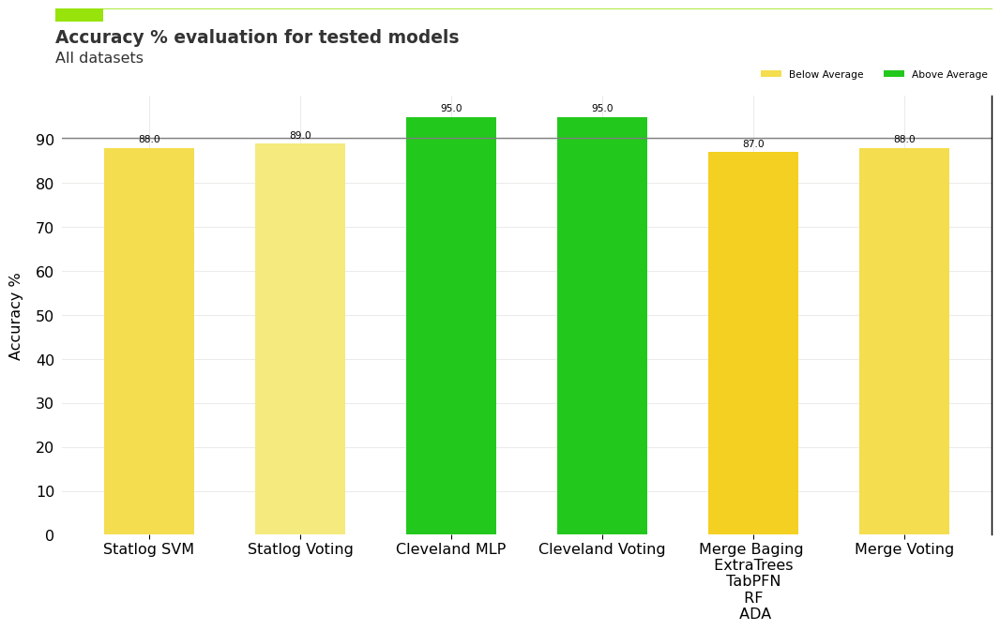

In [ ]:
bar_plot_ensemble(ensemble_df, 'model', 'best_acc', 'All', x_label)

In [ ]:
ensemble_df_loocv =  pd.DataFrame({
    'model' : ['Statlog \n KNN','Statlog \n TabPFN','Statlog Voting \n Stacking','Cleveland \n TabPFN', 'Cleveland \n Stacking', 'Merge \n TabPFN ', 'Merge \n Stacking'],
    'best_acc':[89, 88, 86, 86, 86, 88, 88]
})

x_label_loocv = ['Statlog \n KNN','Statlog \n TabPFN','Statlog Voting \n Stacking','Cleveland \n TabPFN', 'Cleveland \n Stacking', 'Merge \n TabPFN ', 'Merge \n Stacking']

In [ ]:
def bar_plot_ensemble_loocv(df, c1, c2, dataset_label, x_labels):
  fig, ax = plt.subplots(figsize=(13.33,7.5), dpi = 96)
  bar1 = ax.bar(df[c1], df[c2], width=0.6)
  # Create the grid
  ax.grid(which="major", axis='x', color='#DAD8D7', alpha=0.5, zorder=1)
  ax.grid(which="major", axis='y', color='#DAD8D7', alpha=0.5, zorder=1)

  # Reformat x-axis label and tick labels
  ax.set_xlabel('', fontsize=12, labelpad=10) # No need for an axis label
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.xaxis.set_major_locator(MaxNLocator(integer=True))
  ax.xaxis.set_tick_params(pad=2, labelbottom=True, bottom=True, labelsize=12, labelrotation=0)
  labels = x_labels

  ax.set_xticks(df[c1], labels) # Map integers numbers from the series to labels list

  # Reformat y-axis
  ax.set_ylabel('Accuracy %', fontsize=12, labelpad=10)
  ax.yaxis.set_label_position("left")
  ax.yaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
  ax.yaxis.set_major_locator(MaxNLocator(integer=True))
  ax.yaxis.set_tick_params(pad=2, labeltop=False, labelbottom=True, bottom=False, labelsize=12)

  # Add label on top of each bar
  ax.bar_label(bar1, labels=[f'{e:,.1f}' for e in df[c2]], padding=3, color='black', fontsize=8)

    # Remove the spines
  ax.spines[['top','left','bottom']].set_visible(False)

  # Make the left spine thicker
  ax.spines['right'].set_linewidth(1.1)

  # Add in red line and rectangle on top
  ax.plot([0.12, .9], [.98, .98], transform=fig.transFigure, clip_on=False, color='#E3120B', linewidth=.6)
  ax.add_patch(plt.Rectangle((0.12,.98), 0.04, -0.02, facecolor='#E3120B', transform=fig.transFigure, clip_on=False, linewidth = 0))

  # Add in title and subtitle
  ax.text(x=0.12, y=.93, s="Accuracy % LOOCV evaluation for tested models", transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
  ax.text(x=0.12, y=.90, s= "%s datasets" %(dataset_label), transform=fig.transFigure, ha='left', fontsize=12, alpha=.8)



  # Adjust the margins around the plot area
  plt.subplots_adjust(left=None, bottom=0.2, right=None, top=0.85, wspace=None, hspace=None)

  # Set a white background
  fig.patch.set_facecolor('white')

    # Colours - Choose the extreme colours of the colour map
  colours = ["#2196f3", "#bbdefb"]

  # Colormap - Build the colour maps
  cmap = mpl.colors.LinearSegmentedColormap.from_list("colour_map", colours, N=256)
  norm = mpl.colors.Normalize(df[c2].min(), df[c2].max()) # linearly normalizes data into the [0.0, 1.0] interval

  # Plot bars
  bar1 = ax.bar(df[c1], df[c2], color=cmap(norm(df[c2])), width=0.6, zorder=2)

  # Find the average data point and split the series in 2
  average = df[c2].mean()
  below_average = df[df[c2]<average]
  above_average = df[df[c2]>=average]
  # Colours - Choose the extreme colours of the colour map
  colors_high = ["#ff5a5f", "#c81d25"] # Extreme colours of the high scale
  colors_low = ["#2196f3","#bbdefb"] # Extreme colours of the low scale

  # Colormap - Build the colour maps
  cmap_low = mpl.colors.LinearSegmentedColormap.from_list("low_map", colors_low, N=256)
  cmap_high = mpl.colors.LinearSegmentedColormap.from_list("high_map", colors_high, N=256)
  norm_low = mpl.colors.Normalize(below_average[c2].min(), average) # linearly normalizes data into the [0.0, 1.0] interval
  norm_high = mpl.colors.Normalize(average, above_average[c2].max())

  # Plot bars and average (horizontal) line
  bar1 = ax.bar(below_average[c1], below_average[c2], color=cmap_low(norm_low(below_average[c2])), width=0.6, label='Below Average', zorder=2)
  bar2 = ax.bar(above_average[c1], above_average[c2], color=cmap_high(norm_high(above_average[c2])), width=0.6, label='Above Average', zorder=2)
  plt.axhline(y=average, color = 'grey', linewidth=1)

  # Determine the y-limits of the plot
  ymin, ymax = ax.get_ylim()
  # Calculate a suitable y position for the text label
  y_pos = average/ymax + 0.03
  # Annotate the average line
  # ax.text(0.88, y_pos, f'Average = {average:.1f}', ha='center', va='center', transform=ax.transAxes, size=8, zorder=3)

  # Add legend
  ax.legend(loc="best", ncol=2, bbox_to_anchor=[1, 1.07], borderaxespad=0, frameon=False, fontsize=8)


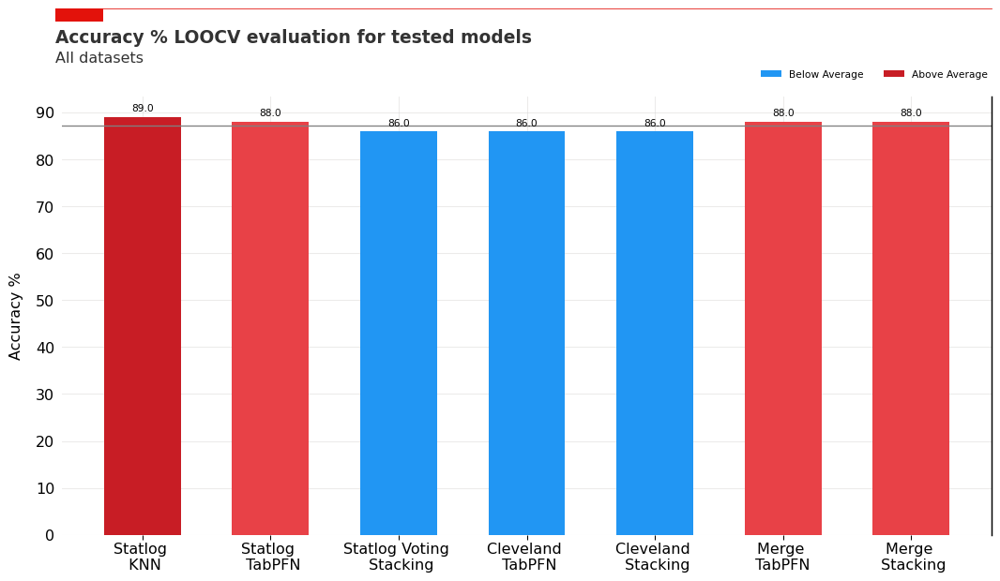

In [ ]:
bar_plot_ensemble_loocv(ensemble_df_loocv, 'model', 'best_acc', 'All', x_label_loocv)